# Import all required packages and define functions

In [ ]:
!pip install mlxtend

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d, Axes3D
from matplotlib import cm
import pandas as pd
import numpy as np
import scipy.stats
import statsmodels.api as sm
from scipy import stats
from scipy.stats import wishart, multivariate_normal, t, invgamma, norm, uniform, dirichlet, skew, kurtosis,kde, chi2, f
from pylab import rcParams
from matplotlib import rc
from pandas.plotting import scatter_matrix
import matplotlib.gridspec as gridspec
import seaborn as sns; sns.set()
from sklearn.model_selection import train_test_split
from statsmodels.nonparametric.smoothers_lowess import lowess
from scipy.interpolate import CubicSpline
from sklearn.linear_model import LinearRegression
from scipy import linalg
from statsmodels.regression import linear_model
from statsmodels.stats.anova import anova_lm
from numpy import linalg as LA
from numpy.random import random
from scipy.stats import rayleigh
import random
from scipy.stats import zscore
from mpl_toolkits.mplot3d.axes3d import get_test_data
import itertools
#from google.colab import drive 
import re

import math
from statsmodels.sandbox.stats.runs import runstest_1samp
import joblib
import sys
import STAT5102 as stat
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
sys.modules['sklearn.externals.joblib'] = joblib
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
import statsmodels.formula.api as smf
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import GridSearchCV
import statsmodels.stats.api as sms
from statsmodels.compat import lzip
from statsmodels.stats.outliers_influence import OLSInfluence

In [ ]:
#suppress warning
import warnings
warnings.filterwarnings('ignore')

In [ ]:
rcParams['figure.figsize'] = 16, 9

In [ ]:
from unicodedata import numeric

def num2chinese(num, big=False, simp=True, o=False, twoalt=False):
    """
    Converts numbers to Chinese representations.

    `big`   : use financial characters.
    `simp`  : use simplified characters instead of traditional characters.
    `o`     : use 〇 for zero.
    `twoalt`: use 两/兩 for two when appropriate.

    Note that `o` and `twoalt` is ignored when `big` is used, 
    and `twoalt` is ignored when `o` is used for formal representations.
    """
    # check num first
    nd = str(num)
    if abs(float(nd)) >= 1e48:
        raise ValueError('number out of range')
    elif 'e' in nd:
        raise ValueError('scientific notation is not supported')
    c_symbol = '正负点' if simp else '正負點'
    if o:  # formal
        twoalt = False
    if big:
        c_basic = '零壹贰叁肆伍陆柒捌玖' if simp else '零壹貳參肆伍陸柒捌玖'
        c_unit1 = '拾佰仟'
        c_twoalt = '贰' if simp else '貳'
    else:
        c_basic = '〇一二三四五六七八九' if o else '零一二三四五六七八九'
        c_unit1 = '十百千'
        if twoalt:
            c_twoalt = '两' if simp else '兩'
        else:
            c_twoalt = '二'
    c_unit2 = '万亿兆京垓秭穰沟涧正载' if simp else '萬億兆京垓秭穰溝澗正載'
    revuniq = lambda l: ''.join(k for k, g in itertools.groupby(reversed(l)))
    nd = str(num)
    result = []
    if nd[0] == '+':
        result.append(c_symbol[0])
    elif nd[0] == '-':
        result.append(c_symbol[1])
    if '.' in nd:
        integer, remainder = nd.lstrip('+-').split('.')
    else:
        integer, remainder = nd.lstrip('+-'), None
    if int(integer):
        splitted = [integer[max(i - 4, 0):i]
                    for i in range(len(integer), 0, -4)]
        intresult = []
        for nu, unit in enumerate(splitted):
            # special cases
            if int(unit) == 0:  # 0000
                intresult.append(c_basic[0])
                continue
            elif nu > 0 and int(unit) == 2:  # 0002
                intresult.append(c_twoalt + c_unit2[nu - 1])
                continue
            ulist = []
            unit = unit.zfill(4)
            for nc, ch in enumerate(reversed(unit)):
                if ch == '0':
                    if ulist:  # ???0
                        ulist.append(c_basic[0])
                elif nc == 0:
                    ulist.append(c_basic[int(ch)])
                elif nc == 1 and ch == '1' and unit[1] == '0':
                    # special case for tens
                    # edit the 'elif' if you don't like
                    # 十四, 三千零十四, 三千三百一十四
                    ulist.append(c_unit1[0])
                elif nc > 1 and ch == '2':
                    ulist.append(c_twoalt + c_unit1[nc - 1])
                else:
                    ulist.append(c_basic[int(ch)] + c_unit1[nc - 1])
            ustr = revuniq(ulist)
            if nu == 0:
                intresult.append(ustr)
            else:
                intresult.append(ustr + c_unit2[nu - 1])
        result.append(revuniq(intresult).strip(c_basic[0]))
    else:
        result.append(c_basic[0])
    if remainder:
        result.append(c_symbol[2])
        result.append(''.join(c_basic[int(ch)] for ch in remainder))
    return ''.join(result)

def chinese2num(s): 
  
  amount = 0 
  #print(s)
  pattern={'20':'二十','19':'十九','18':'十八','17':'十七','16':'十六','15':'十五','14':'十四','13':'十三','12':'十二','11':'十一',
             '10':'十','9':'九','8':'八','7':'七','6':'六','5':'五','4':'四','3':'三','2':'二','1':'一'}
  for x,y in pattern.items():
    s = s.replace(x, y)
  #print(s)
  if s[0] == "十" or s[0] == "百" or s[0] == "千" or s[0] == "萬": 
    s = "一"+s 
  for ch in s: 
    #print(ch)
    number = numeric(ch) 
    if number < 10: 
      digit = number 
    else: 
      amount = (amount + digit) * number if number > amount else amount + digit * number 
      digit = 0 
  #print('final: ')
  #print(int(amount + digit))
  return int(amount + digit)

In [ ]:
#drive.mount('/content/drive')
column_names = ['RecordNo', 'Type', 'Manufacturer', 'Model', 'Seats', 
    'Engine', 'Transmission', 'Year', 'Comment', 'Price', 
    'Sell_date', 'URL']

#car_df.head()
#car_df_stats = car_df.describe()
#car_df_stats = car_df_stats.transpose()
#car_df_stats
#car_df.describe()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
car_df=pd.read_csv('/Users/admin/DSBS/STAT5102/Project/all.csv', names=column_names, 
    na_values = "?")

In [ ]:
car_df.dropna(inplace=True)

In [ ]:
#Data cleansing
car_df['Manufacturer']=car_df['Manufacturer'].str.extract(pat = '([A-Za-z].*)$', expand=False)
car_df['Seats']=pd.to_numeric(car_df['Seats'].str.extract(pat = '([0-9] )', expand=False))
car_df['Engine']=pd.to_numeric(car_df['Engine'].str.extract(pat = '([0-9]+)', expand=False))
car_df['Transmission']=car_df['Transmission'].str.extract(pat = '( [A-Za-z].*)$', expand=False)
car_df['Price']=car_df['Price'].str.extract(pat = 'HKD\$([0-9]+,?[0-9]+,?[0-9]+) ?', expand=False)
car_df['Price']=pd.to_numeric(car_df['Price'].replace({'\$':'',',':''}, regex = True))
car_df.loc[car_df['Comment'].str.contains('行貨',regex=False, na=False),  'AD_Import'] = 'Y'
car_df.loc[~(car_df['Comment'].str.contains('行貨',regex=False, na=False)), 'AD_Import'] = 'N'
car_df.loc[car_df['Comment'].str.contains('牌費',regex=False,na=False), 'Lic_fee'] = 'Y'
car_df.loc[~(car_df['Comment'].str.contains('牌費',regex=False, na=False)), 'Lic_fee'] = 'N'
car_df['Preowner']=car_df['Comment'].str.extract('([0-9零一二三四五六七八九十]+)[\b]*[\s]?(?:首(?!次|期|登)|字|手|(?:\s?Owner))')
car_df['Preowner']=pd.to_numeric(car_df['Preowner'].map(lambda x: chinese2num(x.strip()) if(re.findall(r'[\u4e00-\u9fff]+', str(x))) else x))
car_df['TravelDist']=car_df['Comment'].str.extract('([0-9x一二三四五六七八九十百千萬多幾]+[\b]*[\s]?(?:KM|Km|kM|km|公里))')
car_df['TravelDist']=car_df['TravelDist'].replace({'x':'0',',':'','多':'','幾':'','KM|Km|kM|km|公里':''}, regex = True)
#car_df['TravelDist']=car_df['TravelDist'].map(chinese2num)
#car_df['TravelDist'].map(lambda x: chinese2num(x) if(np.all(pd.notnull(x) or not !str(x).isnumeric())) else x)
##car_df['TravelDist'].map(lambda x: chinese2num(x) if(np.all(str(x).isnumeric())) else x)
car_df['TravelDist']=pd.to_numeric(car_df['TravelDist'].map(lambda x: chinese2num(x.strip()) if(re.findall(r'[\u4e00-\u9fff]+', str(x))) else x))
car_df.loc[car_df['TravelDist'] < 1000, 'TravelDist'] = np.nan
car_df['Sell_date']=pd.to_datetime(car_df['Sell_date']).dt.strftime('%m/%d/%Y')

#car_df['b']=car_df['Comment'].str.extract('([0-9x一二三四五六七八九十百千萬多幾]+[\b]*[\s]?(?:km|公里))')

pd.set_option('display.max_colwidth', None)
car_df[['Comment','Preowner']]

car_df.drop(columns=['Type', 'Comment', 'URL'], inplace=True)
#car_df[~car_df['Preowner'].isna()]
#car_df
#car_df.describe()

In [ ]:
car_df.dropna(inplace=True)

In [ ]:
car_df['Manufacturer'].sort_values().unique()

array(['ALFAROMEO', 'ANY', 'ASTON MARTIN', 'AUDI', 'BENTLEY', 'BMW',
       'CITROEN', 'DAIHATSU', 'DONGFENG', 'FERRARI', 'FIAT', 'FORD',
       'HONDA', 'HYUNDAI', 'INFINITI ', 'ISUZU', 'JAGUAR', 'JEEP ', 'KIA',
       'LAMBORGHINI', 'LAND ROVER', 'LEXUS', 'LOTUS', 'MASERATI', 'MAZDA',
       'MCLAREN', 'MERCEDES-BENZ', 'MINI', 'MITSUBISHI', 'NISSAN',
       'PEUGEOT', 'PORSCHE', 'RENAULT', 'ROLLS ROYCE', 'ROVER', 'SMART ',
       'SSANGYONG', 'SUBARU', 'SUZUKI', 'TOYOTA', 'VOLKSWAGEN', 'VOLVO'],
      dtype=object)

In [ ]:

#Data Exploration

#car_df['Manufacturer'].unique()
#car_df.where(car_df['Year'] != 2007).groupby(['Manufacturer'])['Price'].mean().sort_values().plot(kind='bar')
#pd.cut(car_df['Price'], bins=10)
# > HKD 500K
class_1_list=car_df.groupby(['Manufacturer'])['Price'].mean().sort_values().tail(10).index.tolist()

# > HKD 150K and < HKD 500K
class_2_list=car_df.groupby(['Manufacturer'])['Price'].mean().sort_values().tail(26).head(16).index.tolist()

# < HKD 150K
class_3_list=car_df.groupby(['Manufacturer'])['Price'].mean().sort_values().head(21).index.tolist()

class_1_list, class_2_list, class_3_list



car_df['Mft_Class']=-1
car_df['Mft_Class'].loc[car_df['Manufacturer'].isin(class_1_list)] = 1
car_df['Mft_Class'].loc[car_df['Manufacturer'].isin(class_2_list)] = 2
car_df['Mft_Class'].loc[car_df['Manufacturer'].isin(class_3_list)] = 3

#car_df['Seats'].unique()
#car_df['Engine'].unique()
#car_df['Transmission'].unique()
#car_df['Preowner'].unique()
#car_df.loc[car_df['Price'] > 1000000]
#car_df.loc[car_df['Seats'] == 2]
#car_df.loc[car_df['TravelDist'] > 100000]


In [ ]:
car_df.head()

,RecordNo,Manufacturer,Model,Seats,Engine,Transmission,Year,Price,Sell_date,AD_Import,Lic_fee,Preowner,TravelDist,Mft_Class
0,s1928229,TOYOTA,PRIUS 1.8,5,1800,AT,2013,70000,03/26/2021,N,Y,0.0,170000.0,3
3,s1928303,FORD,KUGA,5,1500,AT,2015,79800,03/14/2021,N,Y,1.0,60000.0,3
6,s1928336,AUDI,A3 1.4T SEDAN,5,1400,AT,2015,120000,12/31/2021,N,Y,4.0,110000.0,3
10,s1928413,HONDA,JAZZ RS GK5,5,1496,AT,2019,143000,03/26/2021,Y,Y,0.0,9000.0,3
12,s1928442,MERCEDES-BENZ,C200 AMG ESTATE,5,1796,AT,2011,108000,03/29/2021,N,Y,0.0,80000.0,2


In [ ]:

car_df_stats = car_df.describe()
car_df_stats = car_df_stats.transpose()
car_df_stats

,count,mean,std,min,25%,50%,75%,max
Seats,18639.0,5.257525e+00,1.131068e+00,1.0,5.0,5.0,5.0,8.000000e+00
Engine,18639.0,2.085017e+03,8.715321e+02,500.0,1500.0,1997.0,2261.0,2.000000e+04
Year,18639.0,2.014019e+03,3.330067e+00,2008.0,2012.0,2014.0,2017.0,2.022000e+03
Price,18639.0,2.186948e+05,3.451447e+05,5000.0,63000.0,125000.0,253000.0,5.980000e+06
Preowner,18639.0,9.495145e-01,1.194191e+00,0.0,0.0,1.0,1.0,1.400000e+01
TravelDist,18639.0,1.378542e+07,1.082018e+09,1000.0,29000.0,52000.0,80000.0,8.529298e+10
Mft_Class,18639.0,2.469821e+00,6.440385e-01,1.0,2.0,3.0,3.0,3.000000e+00


In [ ]:
def path_to_image_html(path):
    return '<img src="'+ path + '" width="60" >'

In [ ]:
from IPython.core.display import HTML

car_df['Picture']=car_df['RecordNo'].astype(str)+'_low.jpg'
car_df['ColorCode']=car_df['RecordNo'].astype(str)+'_colorcodes.jpg'

#HTML(car_df.to_html(escape=False, formatters={'Picture':path_to_image_html, 'ColorCode':path_to_image_html}))
df_start = f"""
<head>
  <meta http-equiv="Content-Type" content="text/html; charset=utf-8">
  <title>Report for Car Information</title>"""
df_style = """
  <style type="text/css" media="screen">
    #carinfo {
      font-family: "Trebuchet MS", Arial, Helvetica, sans-serif;
      font-size: 12px;
      border-collapse: collapse;
      width: 100%;
    }

    #carinfo td, #carinfo th {
      border: 1px solid #ddd;
      padding: 8px;
    }

    #carinfo tr:nth-child(even){background-color: #f2f2f2;}

    #carinfo tr:hover {background-color: #ddd;}

    #carinfo th {
      padding-top: 12px;
      padding-bottom: 12px;
      text-align: left;
      background-color: #FEBCB1;
      color: white;
    }
  </style>
</head>
<body>
"""
df_body=car_df.to_html(escape=False, table_id="carinfo", formatters={'Picture':path_to_image_html, 'ColorCode':path_to_image_html})
df_end = """</body>"""
df_html = (df_start + df_style + df_body + df_end)
#print(df_html[:1000])

with open('car_info.html','w') as f:
    f.write(df_html)


# Data Cleansing

In [ ]:
c = pd.read_csv('/Users/admin/DSBS/STAT5102/Project/colorcode.csv')
c.head()

,EntryID,Color1,Color2,Color3,Color1_1,Color1_2,Color1_3,Color2_1,Color2_2,Color2_3,Color3_1,Color3_2,Color3_3
0,s1928229,1909284,8817548,1241262,29,34,36,134,139,140,18,240,174
1,s1928231,2434115,6318997,11119809,37,36,67,96,107,149,169,172,193
2,s1928270,2566953,7106409,14146005,39,43,41,108,111,105,215,217,213
3,s1928303,4018593,2697793,10072785,61,81,161,41,42,65,153,178,209
4,s1928313,14080216,1975074,8682871,214,216,216,30,35,34,132,125,119


In [ ]:
car_df_c = car_df.merge(c, left_on='RecordNo',right_on='EntryID')

In [ ]:
print(len(car_df_c['Transmission'].unique()))

sum(car_df_c['Transmission']==' MT')

2


573

In [ ]:
car_df_c.drop(['Model', 'EntryID','Picture','ColorCode'],axis=1,inplace=True)

In [ ]:
colorname = ["black","silver","gray","white","maroon","red","purple","fuchsia","green","lime","olive","yellow","navy","blue","teal","aqua"]
R=[0,192,128,255,128,255,128,255,0,0,128,255,0,0,0,0]
G = [0,192,128,255,0,0,0,0,128,255,128,255,0,0,128,255]
B = [0,192,128,255,0,0,128,255,0,0,0,0,128,255,128,255]
color = {'ColorName':colorname, 'R':R,'G':G,'B':B}
colormap = pd.DataFrame(color)
colormap.head()

,ColorName,R,G,B
0,black,0,0,0
1,silver,192,192,192
2,gray,128,128,128
3,white,255,255,255
4,maroon,128,0,0


In [ ]:
def getColorName(rgb):
    minimum = 10000
    for i in range(len(colormap)):
        d = math.sqrt((rgb[0]- int(colormap.loc[i,"R"]))**2 + (rgb[1]- int(colormap.loc[i,"G"]))**2+ (rgb[2]- int(colormap.loc[i,"B"]))**2)
        if(d<=minimum):
          minimum = d
          cname = colormap.loc[i,"ColorName"]
    return cname      
    

In [ ]:
car_df_c['colour1'] = list(map(getColorName,car_df_c[['Color1_1','Color1_2','Color1_3']].to_numpy()))
car_df_c['colour2'] = list(map(getColorName,car_df_c[['Color2_1','Color2_2','Color2_3']].to_numpy()))
car_df_c['colour3'] = list(map(getColorName,car_df_c[['Color3_1','Color3_2','Color3_3']].to_numpy()))

In [ ]:
car_df_c.drop(['Color1', 'Color2','Color3','Color1_1','Color1_2','Color1_3','Color2_1','Color2_2','Color2_3','Color3_1','Color3_2','Color3_3'],axis=1,inplace=True)

In [ ]:
car_df_c.head()

,RecordNo,Manufacturer,Seats,Engine,Transmission,Year,Price,Sell_date,AD_Import,Lic_fee,Preowner,TravelDist,Mft_Class,colour1,colour2,colour3
0,s1928229,TOYOTA,5,1800,AT,2013,70000,03/26/2021,N,Y,0.0,170000.0,3,black,gray,aqua
1,s1928303,FORD,5,1500,AT,2015,79800,03/14/2021,N,Y,1.0,60000.0,3,teal,navy,silver
2,s1928336,AUDI,5,1400,AT,2015,120000,12/31/2021,N,Y,4.0,110000.0,3,silver,black,gray
3,s1928413,HONDA,5,1496,AT,2019,143000,03/26/2021,Y,Y,0.0,9000.0,3,black,gray,silver
4,s1928442,MERCEDES-BENZ,5,1796,AT,2011,108000,03/29/2021,N,Y,0.0,80000.0,2,black,silver,gray


In [ ]:
print(len(car_df_c['colour1'].unique()),len(car_df_c['colour2'].unique()),len(car_df_c['colour3'].unique()))

14 13 15


In [ ]:
len(set(list(car_df_c['colour3'].unique()) + list(car_df_c['colour1'].unique())))

15

In [ ]:
car_df_r=pd.concat([car_df_c,pd.get_dummies(car_df_c['colour3'])], axis=1)

In [ ]:
for i in range(len(car_df_r)):
  for color in car_df_r['colour2'].unique():
    if (car_df_r.colour2[i]==color) & (car_df_r[color][i]==0):
      car_df_r[color][i]+=1

for i in range(len(car_df_r)):
  for color in car_df_r['colour1'].unique():
    if (car_df_r.colour1[i]==color) & (car_df_r[color][i]==0):
      car_df_r[color][i]+=1


In [ ]:
car_df_r.Sell_date = car_df_r.Sell_date.apply(pd.to_datetime)

In [ ]:
car_df_r['Age']=0
for i in range(len(car_df_r)):
  car_df_r.Age[i]= car_df_r.Sell_date[i].year - car_df_r.Year[i]

In [ ]:
car_df_r=pd.concat([car_df_r,pd.get_dummies(car_df_c[['AD_Import','Lic_fee','Transmission']])],axis = 1)

In [ ]:
car_df_r.drop(['Sell_date','Year','AD_Import','Lic_fee','Transmission', 'AD_Import_N','Lic_fee_N', 'Transmission_ MT'],axis=1, inplace=True)

In [ ]:
car_df_r.columns = ['RecordNo', 'Manufacturer', 'Seats', 'Engine', 'Price', 'Preowner',
       'TravelDist', 'Mft_Class', 'colour1', 'colour2', 'colour3', 'aqua',
       'black', 'blue', 'gray', 'green', 'lime', 'maroon', 'navy', 'olive',
       'purple', 'red', 'silver', 'teal', 'white', 'yellow', 'Age', 'AD_Import', 
       'Lic_fee','Transmission_AT']

order = ['RecordNo','Price', 'Manufacturer', 'Seats', 'Engine' , 'Preowner',
       'TravelDist', 'Mft_Class', 'colour1', 'colour2', 'colour3', 'Age', 'AD_Import', 
       'Lic_fee','Transmission_AT','aqua',  'black', 'blue', 'gray', 'green', 'lime',
        'maroon', 'navy', 'olive','purple', 'red', 'silver', 'teal', 'white', 'yellow' ,]

car_df_r = car_df_r[order] 

In [ ]:

#car_df_r2=pd.concat([car_df_c,pd.get_dummies(car_df_c['colour3'])], axis=1)

#def ColorDummy(color,df):
  #for i in range(15,30):
      #if color[0] == df.columns[i] & (df[color[0]]==0):
        #df[color[0]] +=1
      #if color[1] == df.columns[i] & (df[color[1]]==0):
        #df[color[1]] +=1
      #return df[df.columns[15:]]

In [ ]:
car_df_r.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Price,18591.0,2.184775e+05,3.450142e+05,5000.0,63000.0,125000.0,250800.0,5.980000e+06
Seats,18591.0,5.257867e+00,1.131813e+00,1.0,5.0,5.0,5.0,8.000000e+00
Engine,18591.0,2.084959e+03,8.710407e+02,500.0,1500.0,1997.0,2261.0,2.000000e+04
Preowner,18591.0,9.505675e-01,1.194878e+00,0.0,0.0,1.0,1.0,1.400000e+01
TravelDist,18591.0,1.382090e+07,1.083413e+09,1000.0,29000.0,52000.0,80000.0,8.529298e+10
Mft_Class,18591.0,2.470120e+00,6.438834e-01,1.0,2.0,3.0,3.0,3.000000e+00
Age,18591.0,7.255769e+00,3.341612e+00,0.0,5.0,7.0,10.0,1.400000e+01
AD_Import,18591.0,4.114356e-01,4.921071e-01,0.0,0.0,0.0,1.0,1.000000e+00
Lic_fee,18591.0,4.488193e-01,4.973870e-01,0.0,0.0,0.0,1.0,1.000000e+00
Transmission_AT,18591.0,9.691786e-01,1.728381e-01,0.0,1.0,1.0,1.0,1.000000e+00


In [ ]:
#car_df_r.to_csv('/content/drive/MyDrive/all_cleaned.csv', header=True)
#car_df_r=pd.read_csv('/content/drive/MyDrive/all_cleaned.csv')
#car_df_r.drop('Unnamed: 0',axis=1, inplace=True)

# Graph (with Data Cleansing)

## One Dimensional Plot

Price

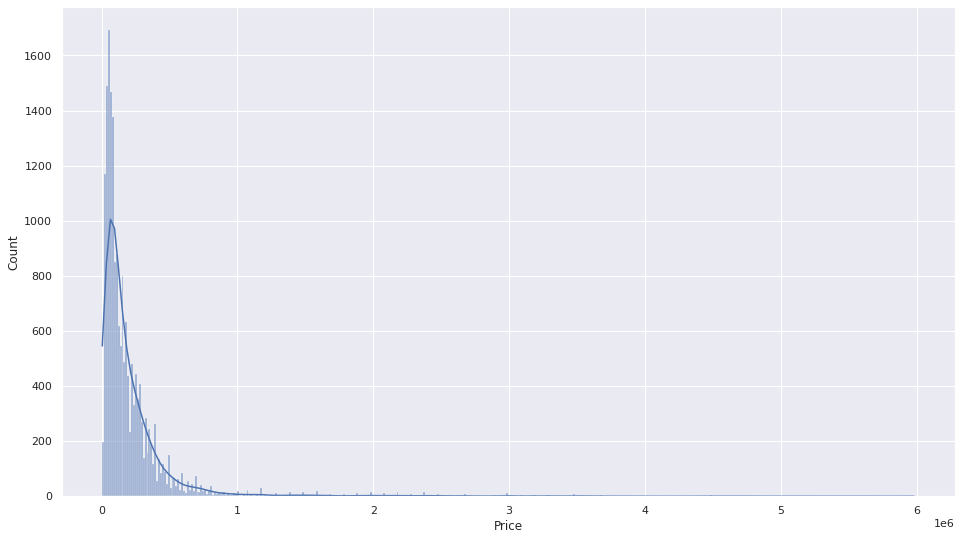

In [ ]:
sns.histplot(x = 'Price', data=car_df_r, kde=True)

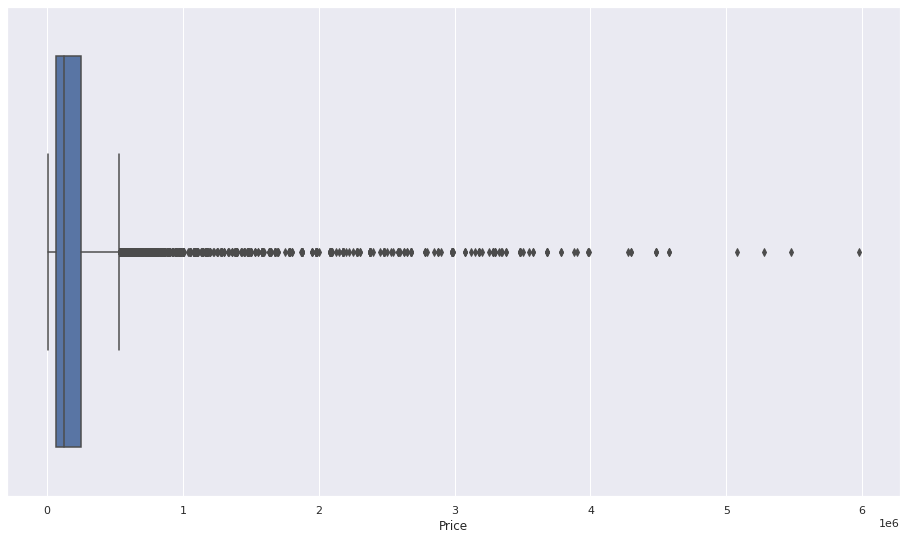

In [ ]:
sns.boxplot(x = 'Price', data=car_df_r)

Manufactuer

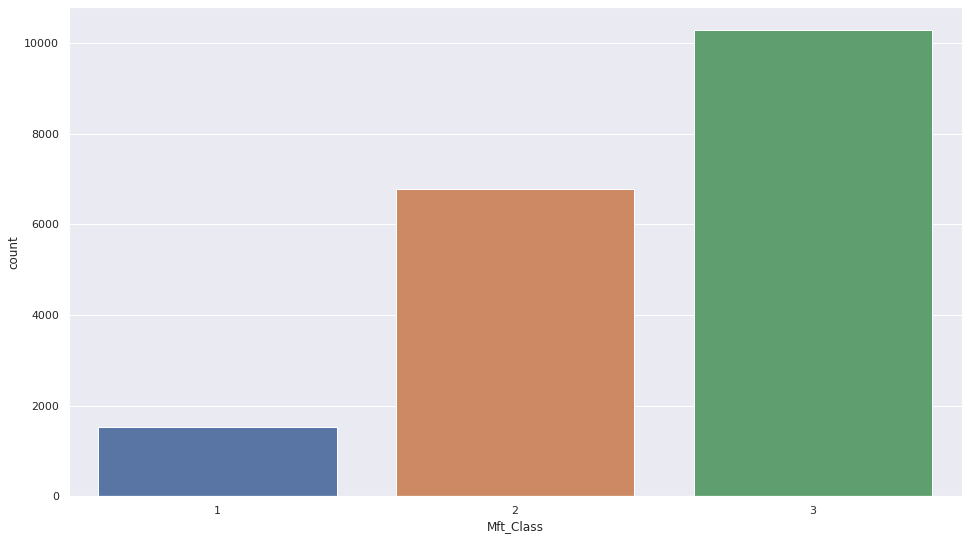

In [ ]:
sns.countplot(x='Mft_Class',data=car_df_r)

Seats

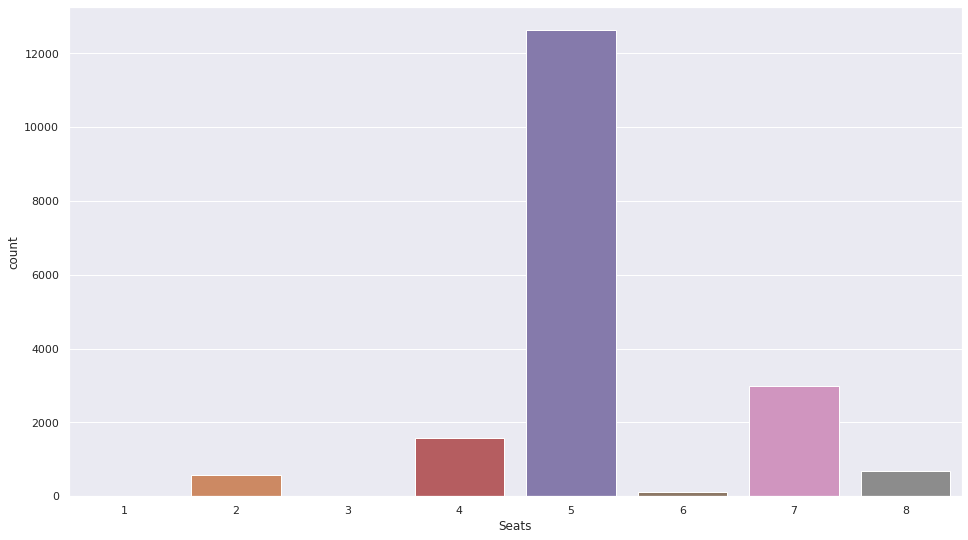

In [ ]:
sns.countplot(x = 'Seats', data=car_df_r)

Engine

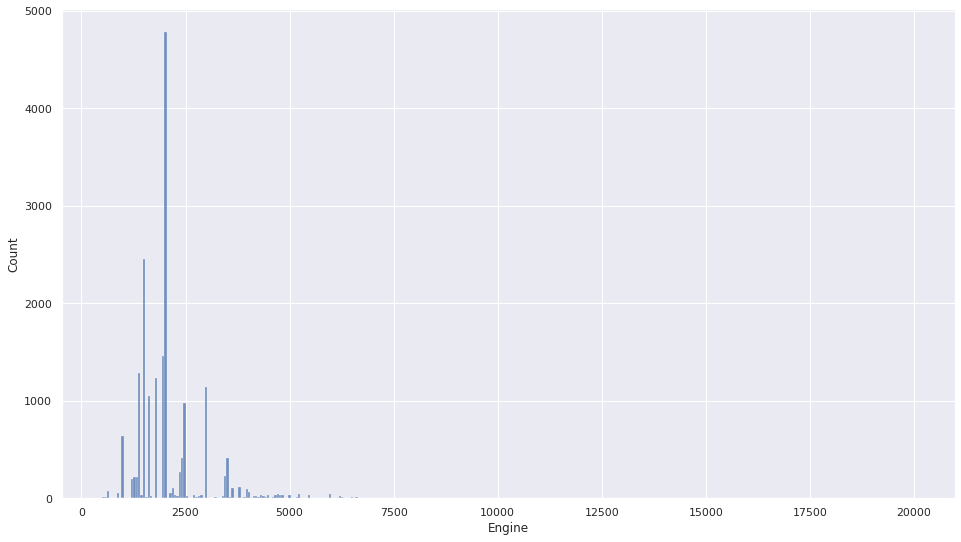

In [ ]:
sns.histplot(x = 'Engine', data=car_df_r)

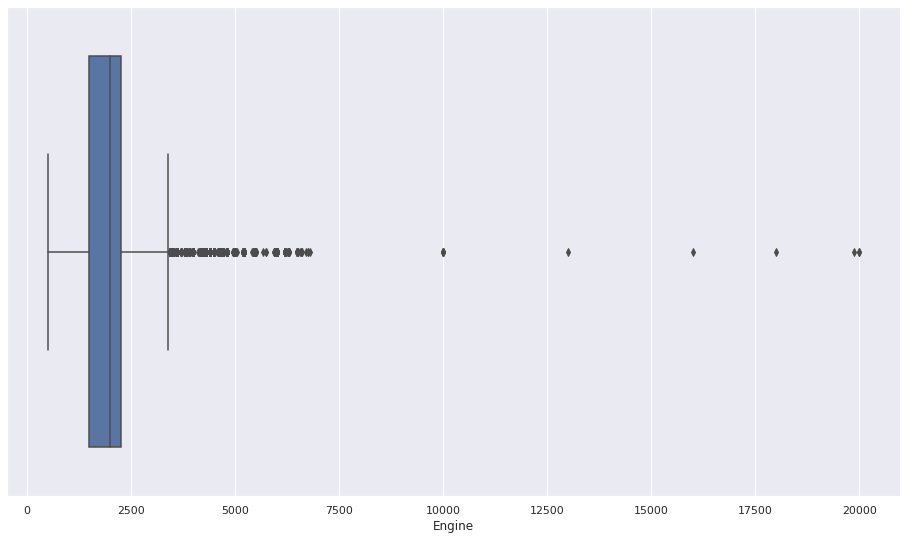

In [ ]:
sns.boxplot(x = 'Engine', data=car_df_r)

In [ ]:
sum(car_df_r['Engine']>7500)

12

In [ ]:
car_df_1=car_df_r[car_df_r['Engine']<=7500]
car_df_1 = car_df_1.reset_index(drop=True)

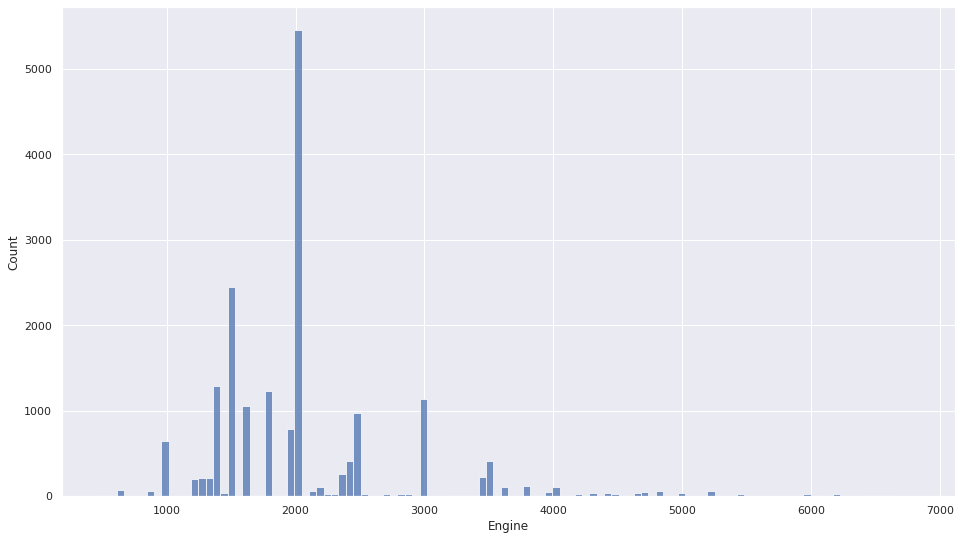

In [ ]:
sns.histplot(x = 'Engine', data=car_df_1)

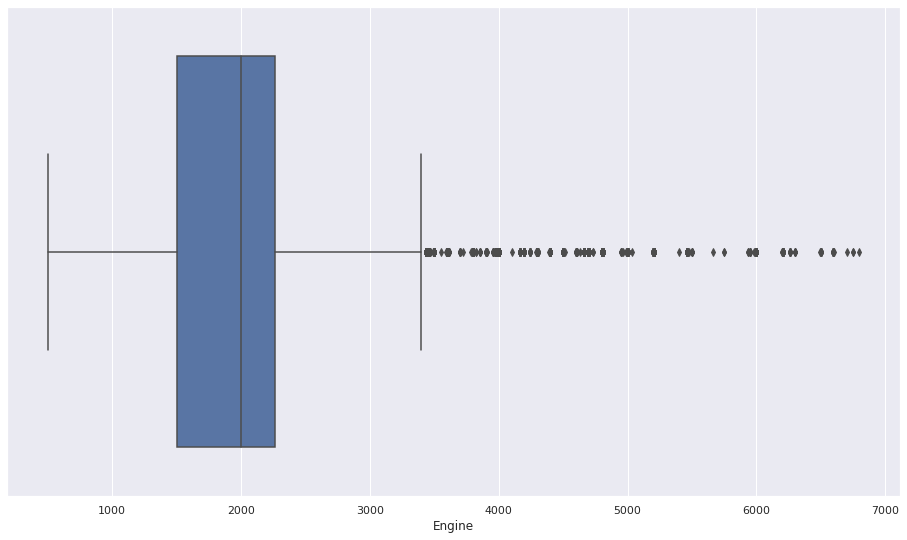

In [ ]:
sns.boxplot(x = 'Engine', data=car_df_1)

Preowner

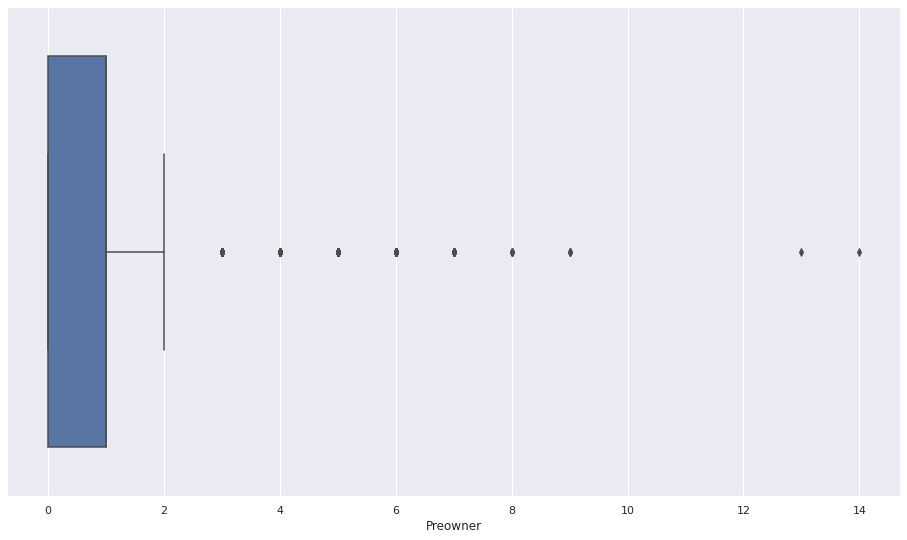

In [ ]:
sns.boxplot(x='Preowner',data=car_df_1)

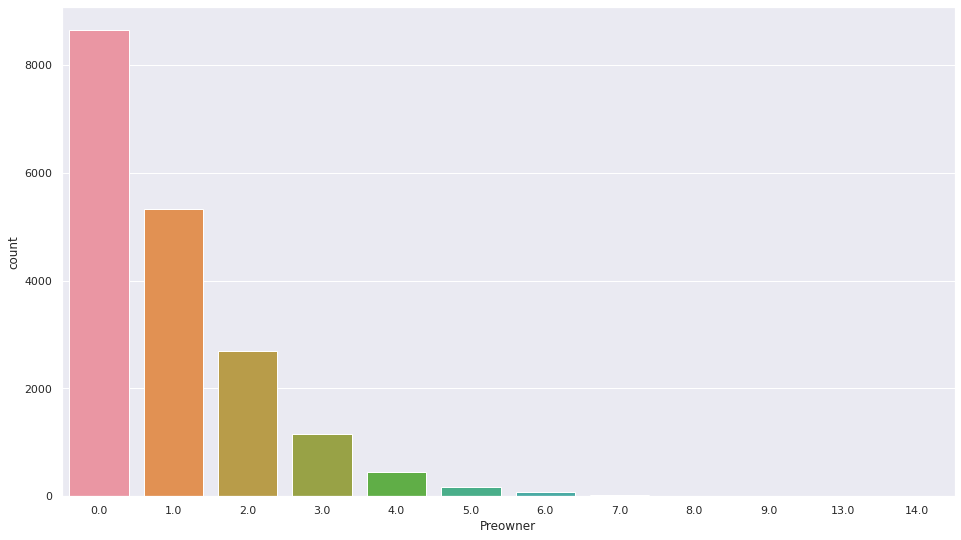

In [ ]:
sns.countplot(x='Preowner',data=car_df_1)

Age

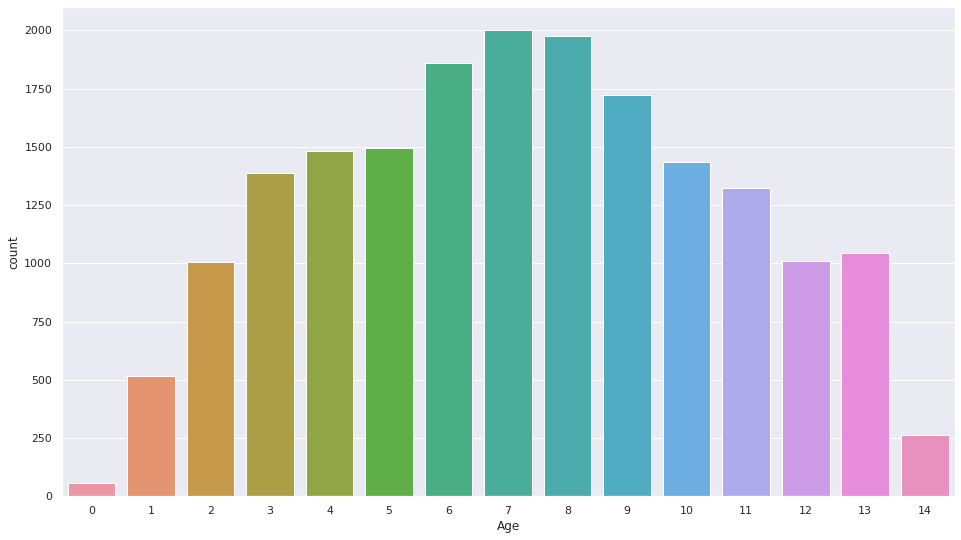

In [ ]:
sns.countplot(x='Age',data=car_df_1)

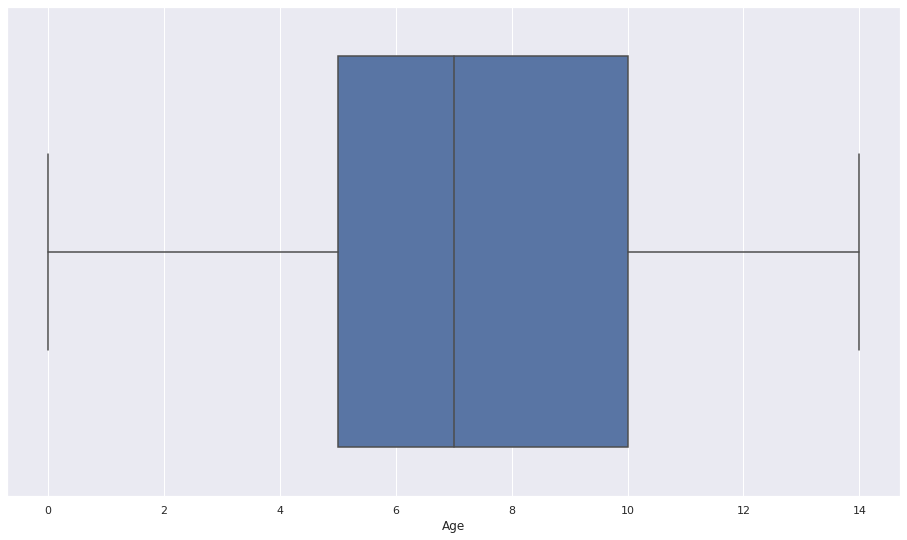

In [ ]:
sns.boxplot(x='Age',data=car_df_1)

Travel Distance

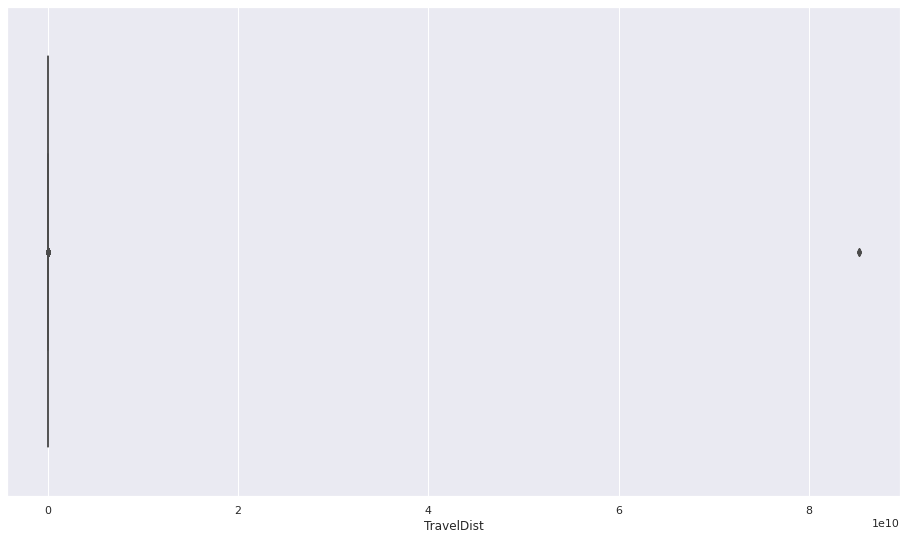

In [ ]:
sns.boxplot(x = 'TravelDist', data=car_df_1)

In [ ]:
sorted(car_df_1.TravelDist[car_df_1.TravelDist.notnull()].to_list(),reverse = True)[0:10]

[85292983355.0,
 85291982691.0,
 85291221460.0,
 1400000.0,
 1400000.0,
 1060000.0,
 930000.0,
 930000.0,
 920000.0,
 900000.0]

In [ ]:
car_df_1[car_df_1.TravelDist>1400000].index
#drop extreme value

Int64Index([362, 8768, 16794], dtype='int64')

In [ ]:
car_df_2 = car_df_1.drop([362,8768,16794])
car_df_2 = car_df_2.reset_index(drop=True)

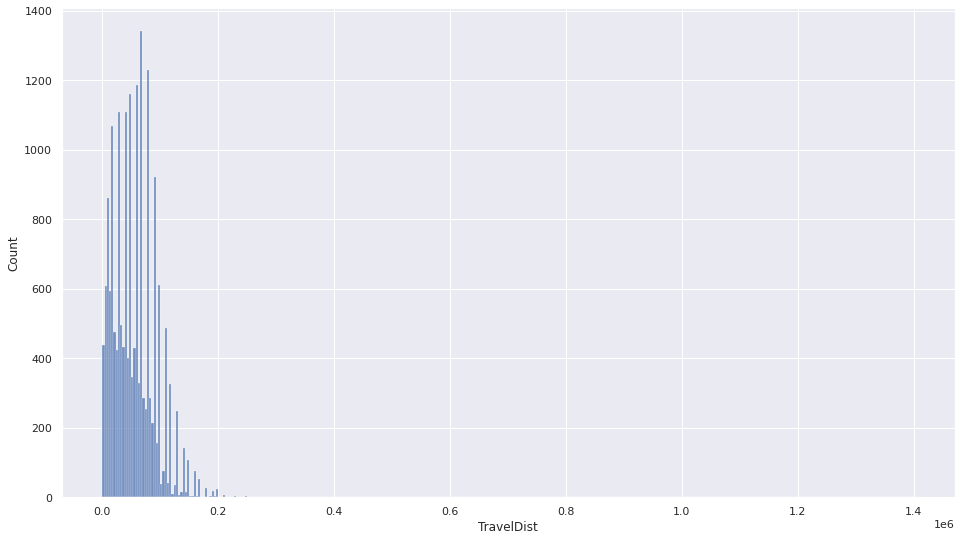

In [ ]:
sns.histplot(x = 'TravelDist', data=car_df_2)

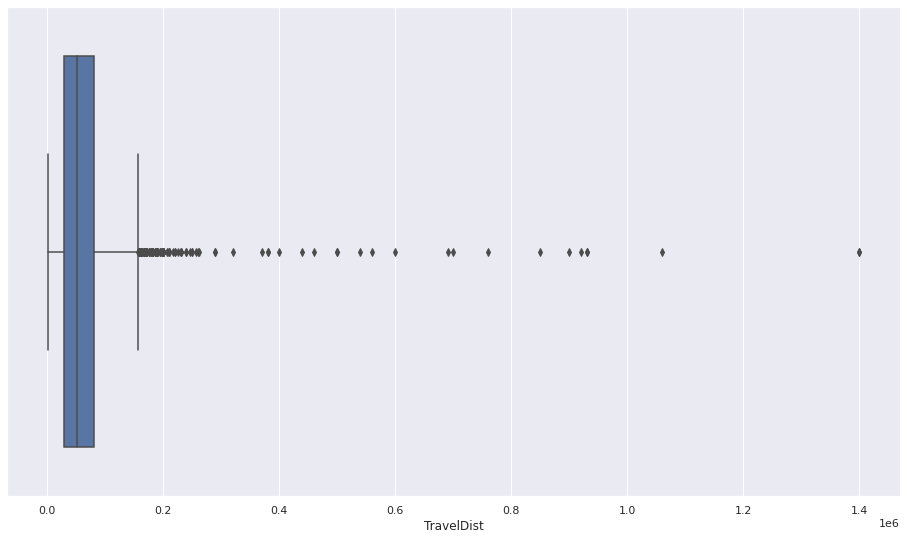

In [ ]:
sns.boxplot(x = 'TravelDist', data=car_df_2)

Drop Extreme Value:

Engine: >7500 (12 in total)
Travel Distance : >1400000 (3 in total)


## Two dimensional plot

Age

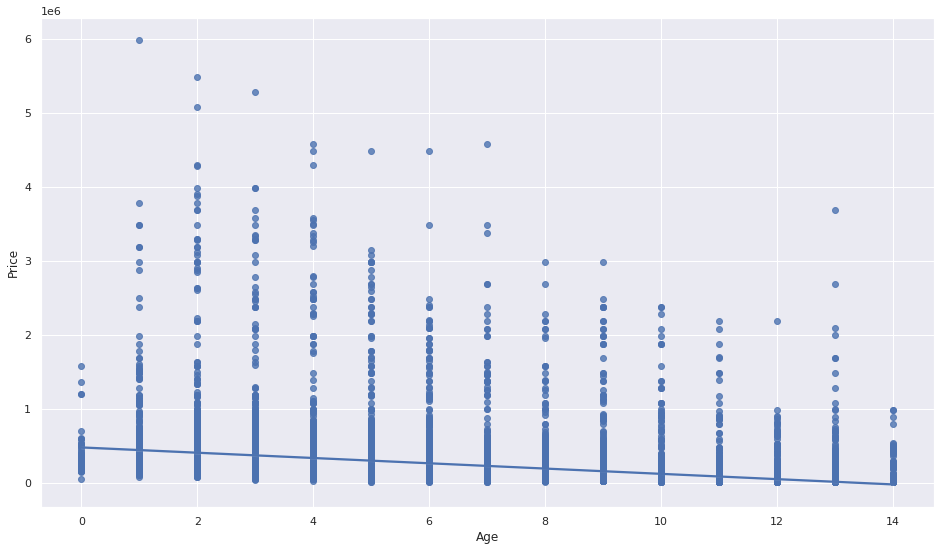

In [ ]:
sns.regplot(x='Age', y = 'Price', data = car_df_2, order = 1)

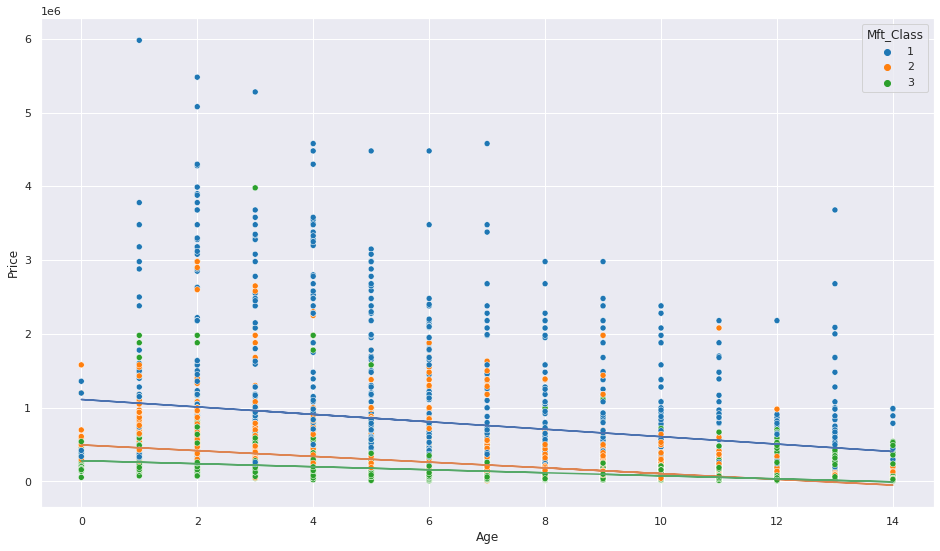

In [ ]:
for i in range(1,4):
  m,b = np.polyfit(car_df_2[car_df_2['Mft_Class']==i]['Age'], car_df_2[car_df_2['Mft_Class']==i]['Price'], 1)
  plt.plot(car_df_2[car_df_2['Mft_Class']==i]['Age'],b+m*car_df_2[car_df_2['Mft_Class']==i]['Age'])

sns.scatterplot(x='Age', y = 'Price',hue='Mft_Class', data = car_df_2, palette = 'tab10')
#interaction

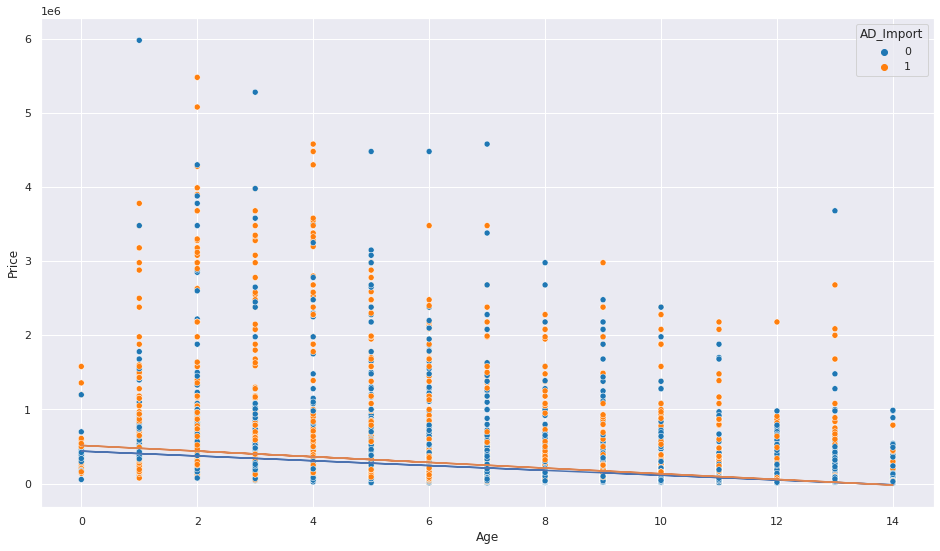

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_2[car_df_2['AD_Import']==i]['Age'], car_df_2[car_df_2['AD_Import']==i]['Price'], 1)
  plt.plot(car_df_2[car_df_2['AD_Import']==i]['Age'],b+m*car_df_2[car_df_2['AD_Import']==i]['Age'])

sns.scatterplot(x='Age', y = 'Price',hue='AD_Import', data = car_df_2, palette = 'tab10')

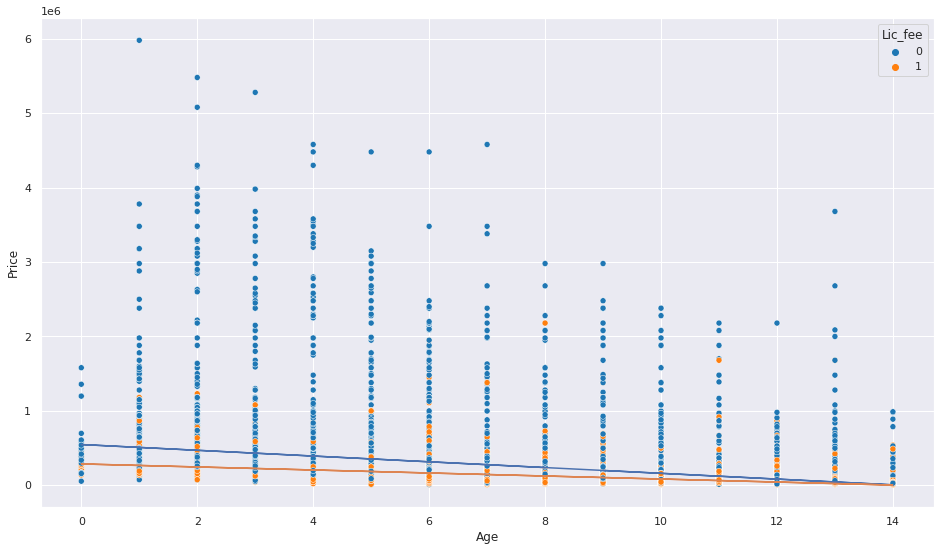

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_2[car_df_2['Lic_fee']==i]['Age'], car_df_2[car_df_2['Lic_fee']==i]['Price'], 1)
  plt.plot(car_df_2[car_df_2['Lic_fee']==i]['Age'],b+m*car_df_2[car_df_2['Lic_fee']==i]['Age'])

sns.scatterplot(x='Age', y = 'Price',hue='Lic_fee', data = car_df_2, palette = 'tab10')

Seats

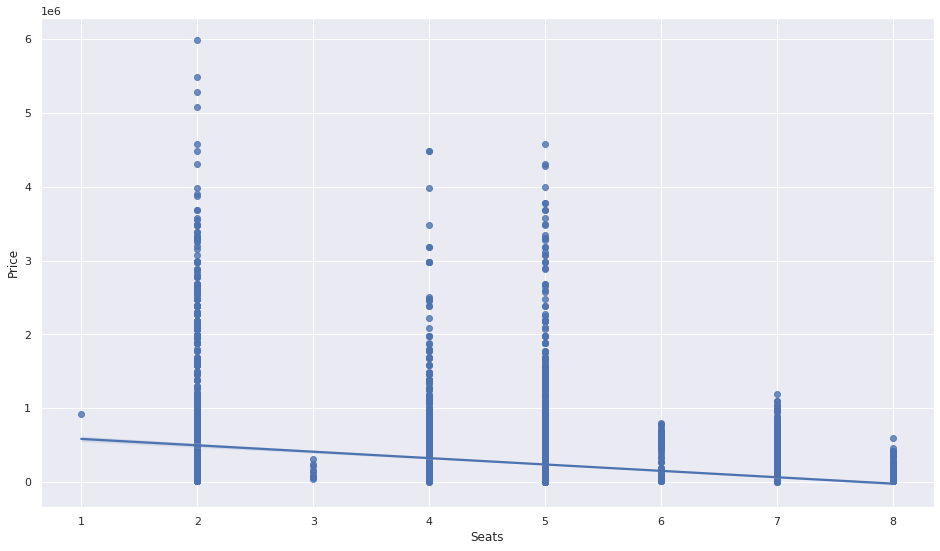

In [ ]:
sns.regplot(x='Seats', y = 'Price', data = car_df_2)

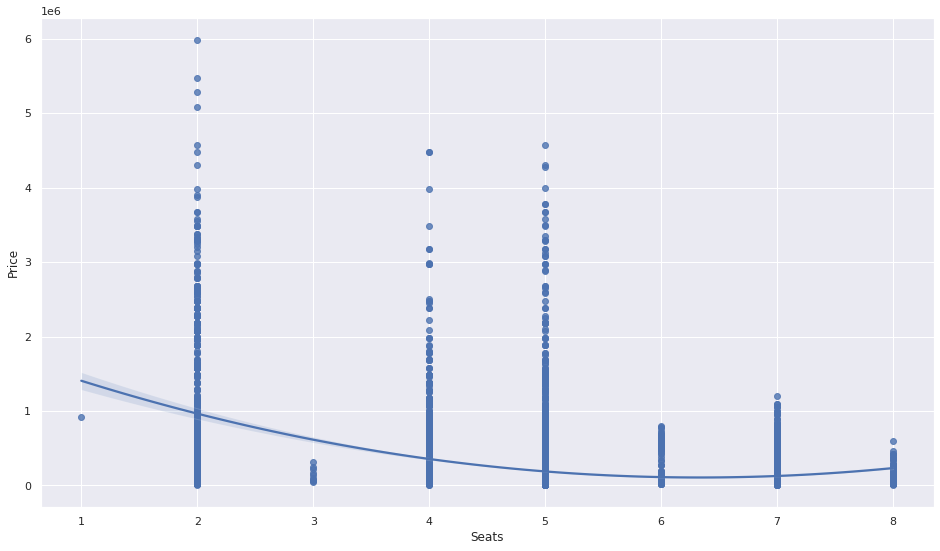

In [ ]:
sns.regplot(x='Seats', y = 'Price', data = car_df_2, order = 2)

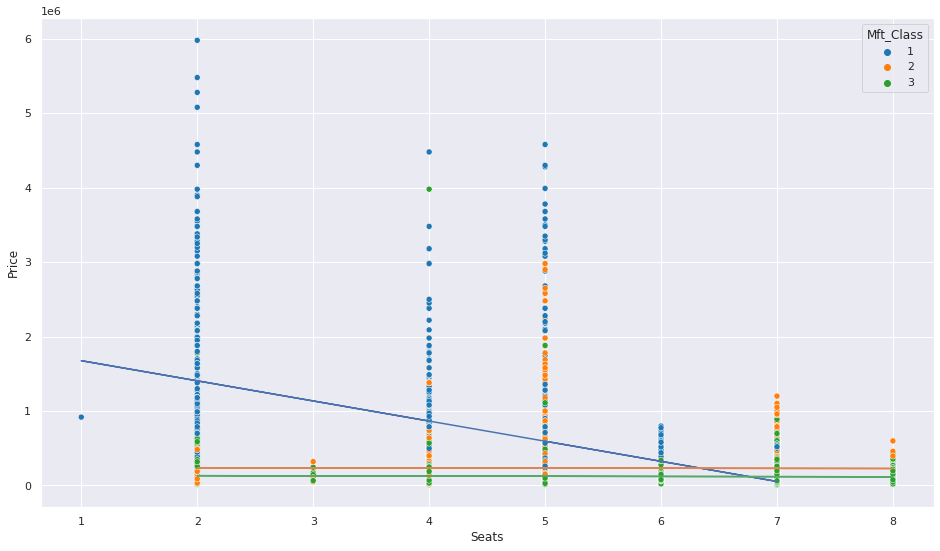

In [ ]:
for i in range(1,4):
  m,b = np.polyfit(car_df_2[car_df_2['Mft_Class']==i]['Seats'], car_df_2[car_df_2['Mft_Class']==i]['Price'], 1)
  plt.plot(car_df_2[car_df_2['Mft_Class']==i]['Seats'],b+m*car_df_2[car_df_2['Mft_Class']==i]['Seats'])

sns.scatterplot(x='Seats', y = 'Price',hue='Mft_Class', data = car_df_2, palette = 'tab10')

#interaction for class 1 

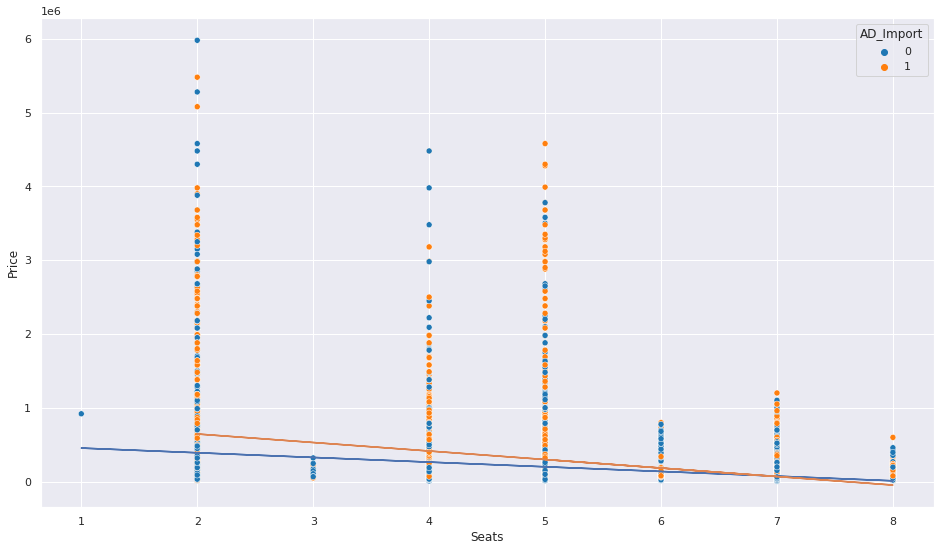

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_2[car_df_2['AD_Import']==i]['Seats'], car_df_2[car_df_2['AD_Import']==i]['Price'], 1)
  plt.plot(car_df_2[car_df_2['AD_Import']==i]['Seats'],b+m*car_df_2[car_df_2['AD_Import']==i]['Seats'])

sns.scatterplot(x='Seats', y = 'Price',hue='AD_Import', data = car_df_2, palette = 'tab10')

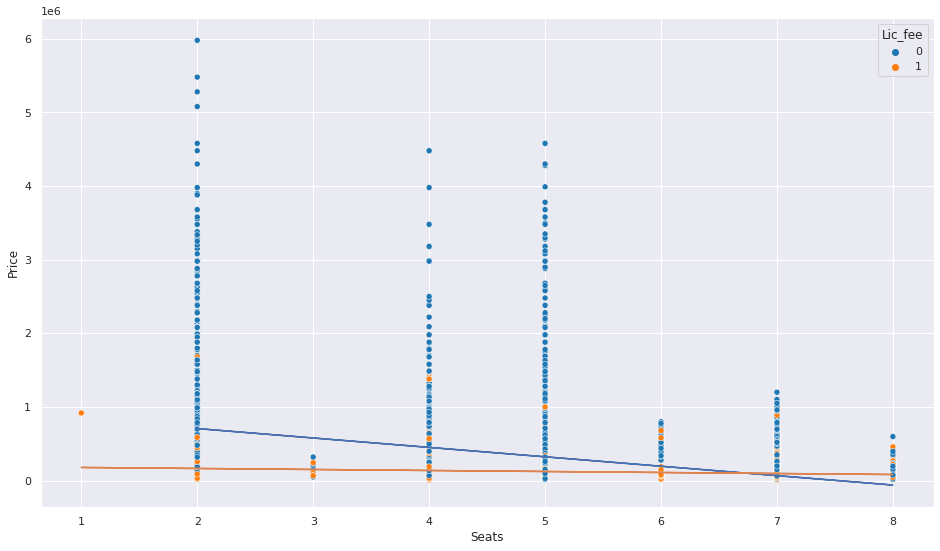

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_2[car_df_2['Lic_fee']==i]['Seats'], car_df_2[car_df_2['Lic_fee']==i]['Price'], 1)
  plt.plot(car_df_2[car_df_2['Lic_fee']==i]['Seats'],b+m*car_df_2[car_df_2['Lic_fee']==i]['Seats'])

sns.scatterplot(x='Seats', y = 'Price',hue='Lic_fee', data = car_df_2, palette = 'tab10')

Engine

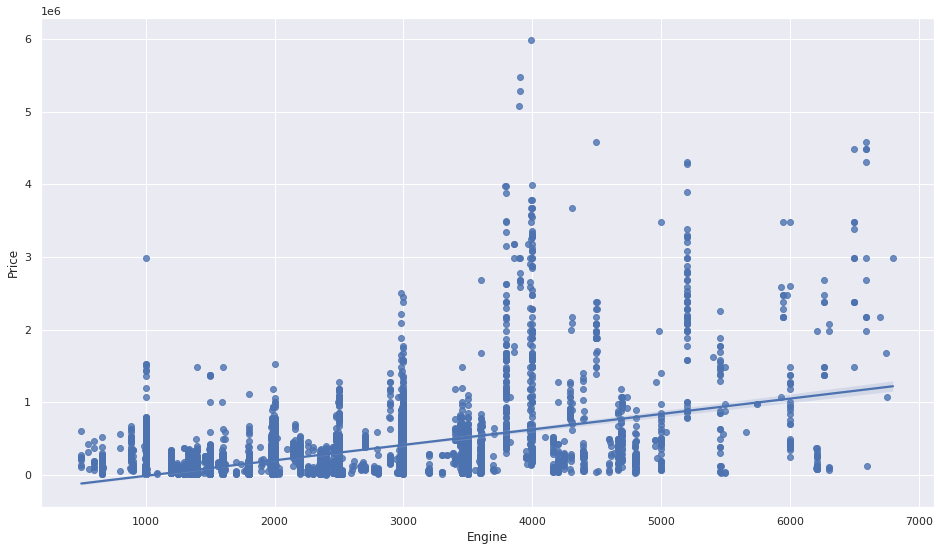

In [ ]:
sns.regplot(x='Engine', y = 'Price', data = car_df_2, order = 1)

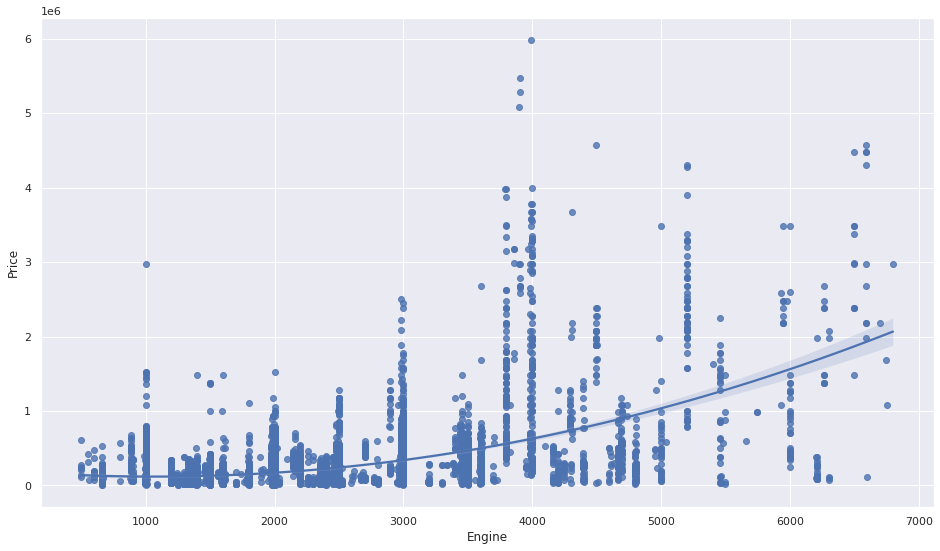

In [ ]:
sns.regplot(x='Engine', y = 'Price', data = car_df_2, order = 2)

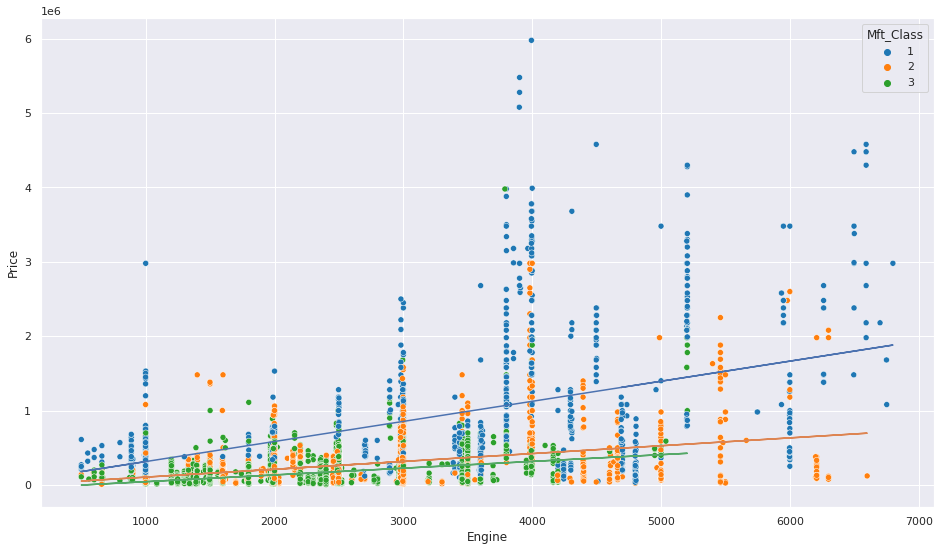

In [ ]:
for i in range(1,4):
  m,b = np.polyfit(car_df_2[car_df_2['Mft_Class']==i]['Engine'], car_df_2[car_df_2['Mft_Class']==i]['Price'], 1)
  plt.plot(car_df_2[car_df_2['Mft_Class']==i]['Engine'],b+m*car_df_2[car_df_2['Mft_Class']==i]['Engine'])

sns.scatterplot(x='Engine', y = 'Price',hue='Mft_Class', data = car_df_2, palette = 'tab10')
##interaction for class 1

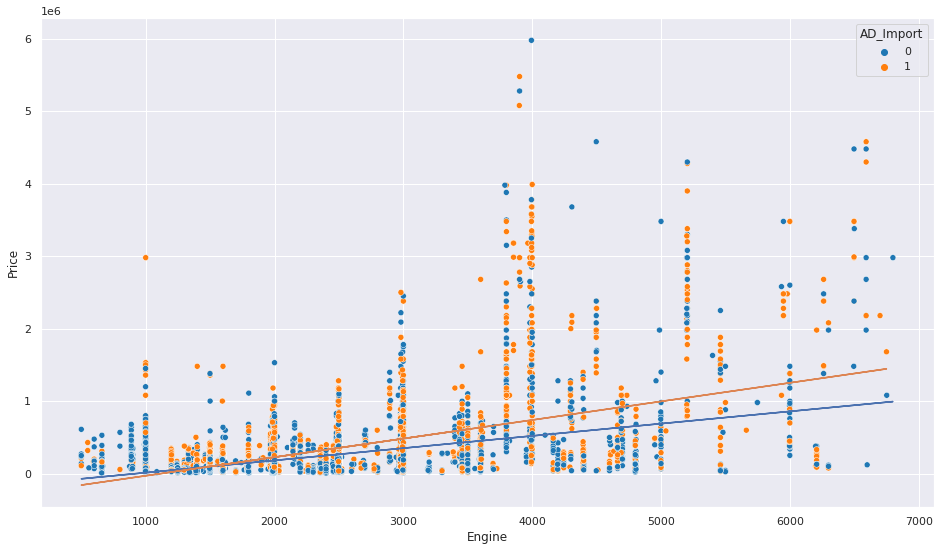

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_2[car_df_2['AD_Import']==i]['Engine'], car_df_2[car_df_2['AD_Import']==i]['Price'], 1)
  plt.plot(car_df_2[car_df_2['AD_Import']==i]['Engine'],b+m*car_df_2[car_df_2['AD_Import']==i]['Engine'])

sns.scatterplot(x='Engine', y = 'Price',hue='AD_Import', data = car_df_2, palette = 'tab10')
##no interaction

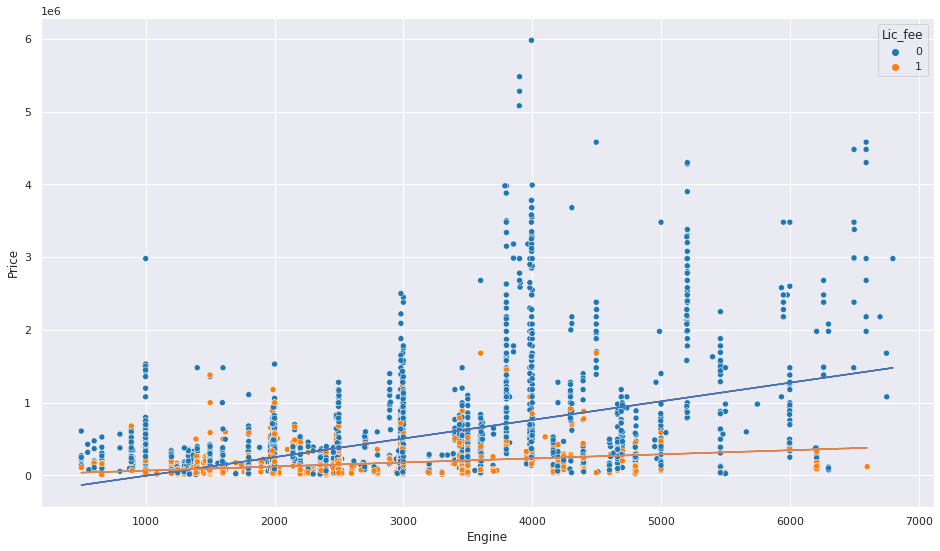

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_2[car_df_2['Lic_fee']==i]['Engine'], car_df_2[car_df_2['Lic_fee']==i]['Price'], 1)
  plt.plot(car_df_2[car_df_2['Lic_fee']==i]['Engine'],b+m*car_df_2[car_df_2['Lic_fee']==i]['Engine'])

sns.scatterplot(x='Engine', y = 'Price',hue='Lic_fee', data = car_df_2, palette = 'tab10')

#interaction

Preowner

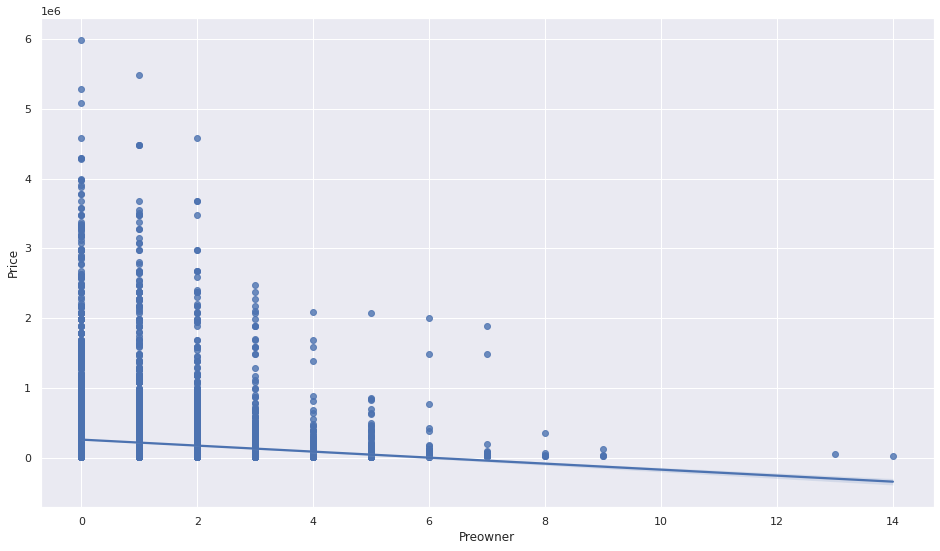

In [ ]:
sns.regplot(x='Preowner', y = 'Price', data = car_df_2, order = 1)

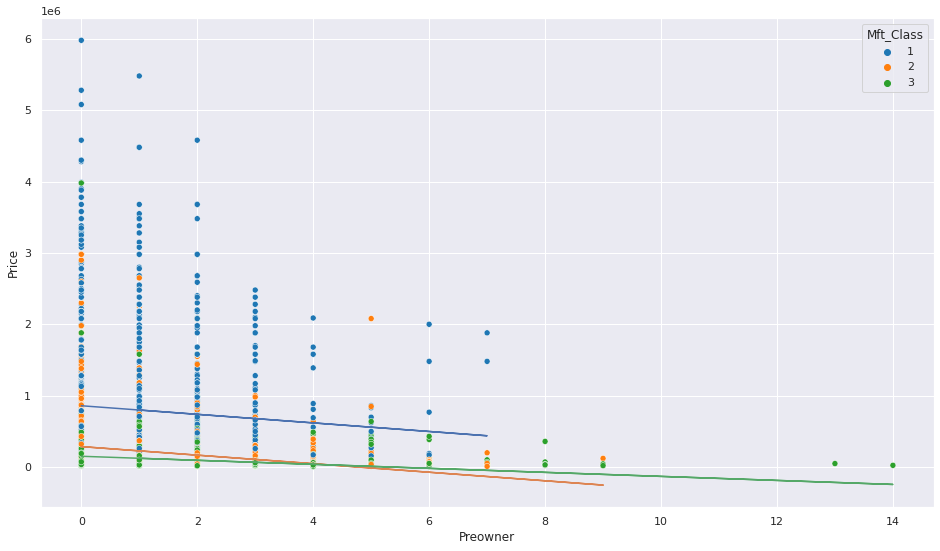

In [ ]:
for i in range(1,4):
  m,b = np.polyfit(car_df_2[(car_df_2['Mft_Class']==i) & (car_df_2['Preowner'].notnull())]['Preowner'], car_df_2[(car_df_2['Mft_Class']==i) & (car_df_2['Preowner'].notnull())]['Price'], 1)
  plt.plot(car_df_2[(car_df_2['Mft_Class']==i) & (car_df_2['Preowner'].notnull())]['Preowner'],b+m*car_df_2[(car_df_2['Mft_Class']==i) & (car_df_2['Preowner'].notnull())]['Preowner'])

sns.scatterplot(x='Preowner', y = 'Price',hue='Mft_Class', data = car_df_2, palette = 'tab10')

#Interaction

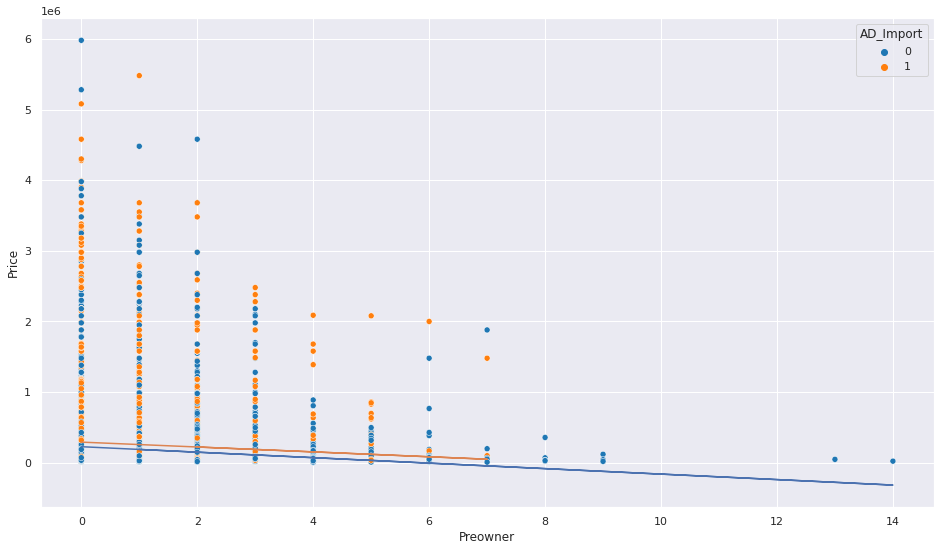

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_2[(car_df_2['AD_Import']==i)&(car_df_2['Preowner'].notnull())]['Preowner'], car_df_2[(car_df_2['AD_Import']==i) & (car_df_2['Preowner'].notnull())]['Price'], 1)
  plt.plot(car_df_2[(car_df_2['AD_Import']==i) & (car_df_2['Preowner'].notnull())]['Preowner'],b+m*car_df_2[(car_df_2['AD_Import']==i) &(car_df_2['Preowner'].notnull())]['Preowner'])

sns.scatterplot(x='Preowner', y = 'Price',hue='AD_Import', data = car_df_2, palette = 'tab10')
#no interaction

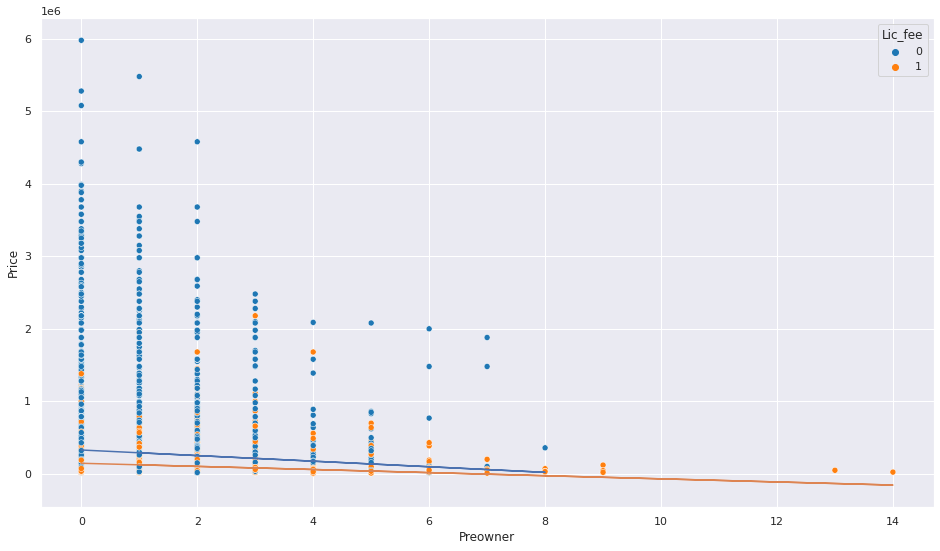

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_2[(car_df_2['Lic_fee']==i)&(car_df_2['Preowner'].notnull())]['Preowner'], car_df_2[(car_df_2['Lic_fee']==i) & (car_df_2['Preowner'].notnull())]['Price'], 1)
  plt.plot(car_df_2[(car_df_2['Lic_fee']==i) & (car_df_2['Preowner'].notnull())]['Preowner'],b+m*car_df_2[(car_df_2['Lic_fee']==i) &(car_df_2['Preowner'].notnull())]['Preowner'])

sns.scatterplot(x='Preowner', y = 'Price',hue='Lic_fee', data = car_df_2, palette = 'tab10')
#no interaction

TravelDist

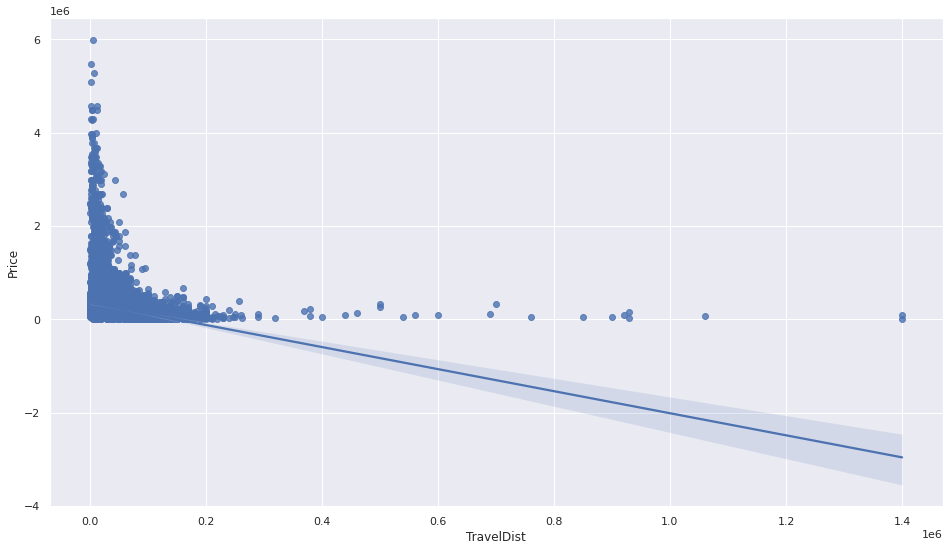

In [ ]:
sns.regplot(x='TravelDist', y = 'Price', data = car_df_2, order = 1)

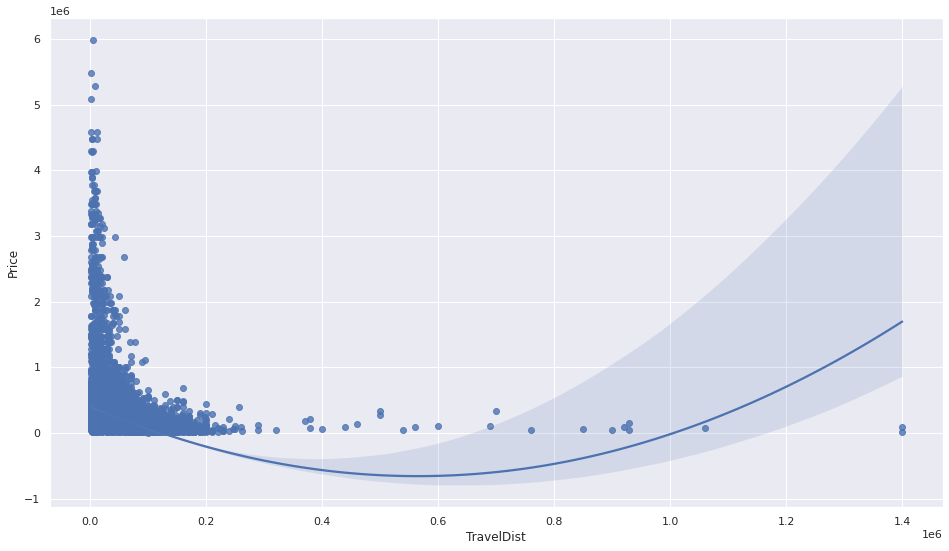

In [ ]:
sns.regplot(x='TravelDist', y = 'Price', data = car_df_2, order = 2)

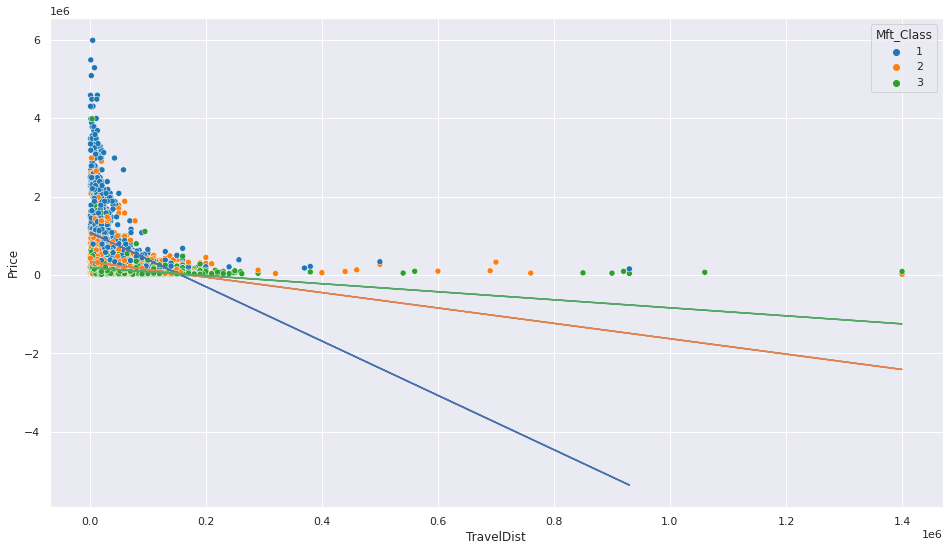

In [ ]:
for i in range(1,4):
  m,b = np.polyfit(car_df_2[(car_df_2['Mft_Class']==i) & (car_df_2['TravelDist'].notnull())]['TravelDist'], car_df_2[(car_df_2['Mft_Class']==i) & (car_df_2['TravelDist'].notnull())]['Price'], 1)
  plt.plot(car_df_2[(car_df_2['Mft_Class']==i) & (car_df_2['TravelDist'].notnull())]['TravelDist'],b+m*car_df_2[(car_df_2['Mft_Class']==i) & (car_df_2['TravelDist'].notnull())]['TravelDist'])

sns.scatterplot(x='TravelDist', y = 'Price',hue='Mft_Class', data = car_df_2, palette = 'tab10')

#interaction

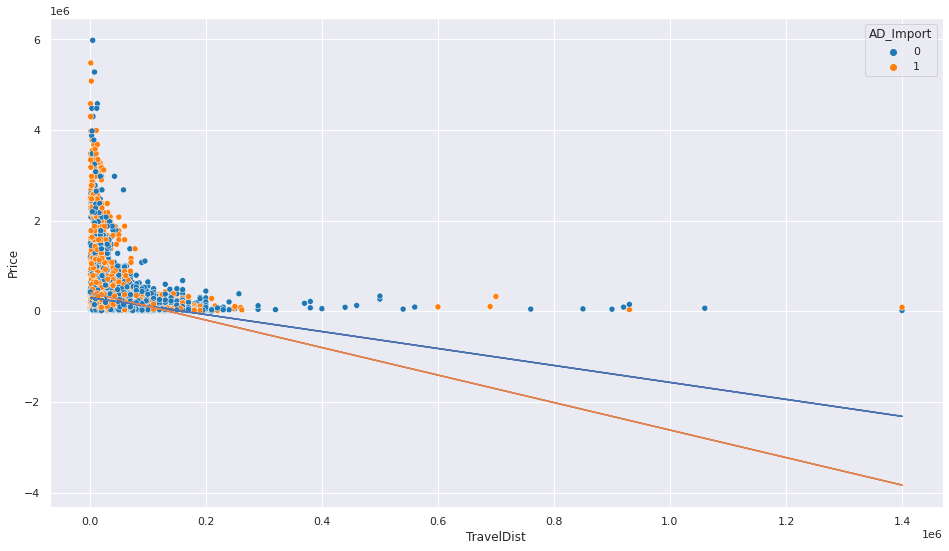

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_2[(car_df_2['AD_Import']==i) & (car_df_2['TravelDist'].notnull())]['TravelDist'], car_df_2[(car_df_2['AD_Import']==i) & (car_df_2['TravelDist'].notnull())]['Price'], 1)
  plt.plot(car_df_2[(car_df_2['AD_Import']==i) & (car_df_2['TravelDist'].notnull())]['TravelDist'],b+m*car_df_2[(car_df_2['AD_Import']==i) & (car_df_2['TravelDist'].notnull())]['TravelDist'])

sns.scatterplot(x='TravelDist', y = 'Price',hue='AD_Import', data = car_df_2, palette = 'tab10')

#interaction

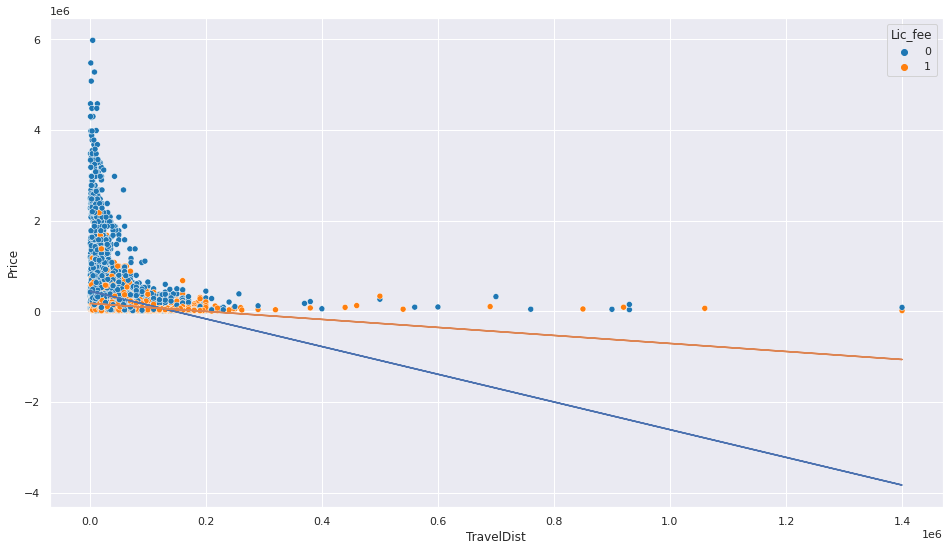

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_2[(car_df_2['Lic_fee']==i) & (car_df_2['TravelDist'].notnull())]['TravelDist'], car_df_2[(car_df_2['Lic_fee']==i) & (car_df_2['TravelDist'].notnull())]['Price'], 1)
  plt.plot(car_df_2[(car_df_2['Lic_fee']==i) & (car_df_2['TravelDist'].notnull())]['TravelDist'],b+m*car_df_2[(car_df_2['Lic_fee']==i) & (car_df_2['TravelDist'].notnull())]['TravelDist'])

sns.scatterplot(x='TravelDist', y = 'Price',hue='Lic_fee', data = car_df_2, palette = 'tab10')

#interaction

Short summary:

**order:

1 - Age, Preowner

2 - Seats, Engine, TravelDist

**Interaction:

(1)Age: None

(2)Seats: Lic_fee

(3) Engine: class, Lic_fee

(4) Travel Dist: class, AD Import, Lic_fee

(5)Preowner: None


### 2-D plot for lnPrice

As there is large variance between price and the predictor variables, we believe ln(Price) can reduce variation and have a better prediction

In [ ]:
car_df_4 = pd.concat([car_df_2,pd.get_dummies(car_df_2.Mft_Class,prefix='Mft_Class')],axis=1)
car_df_4['lnPrice'] = np.log(car_df_4['Price'])

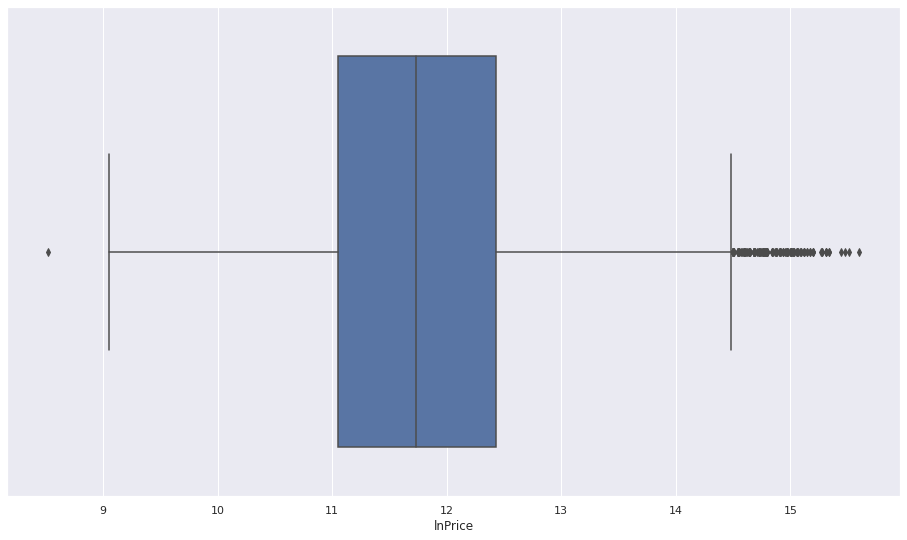

In [ ]:
sns.boxplot(x = 'lnPrice', data=car_df_4)

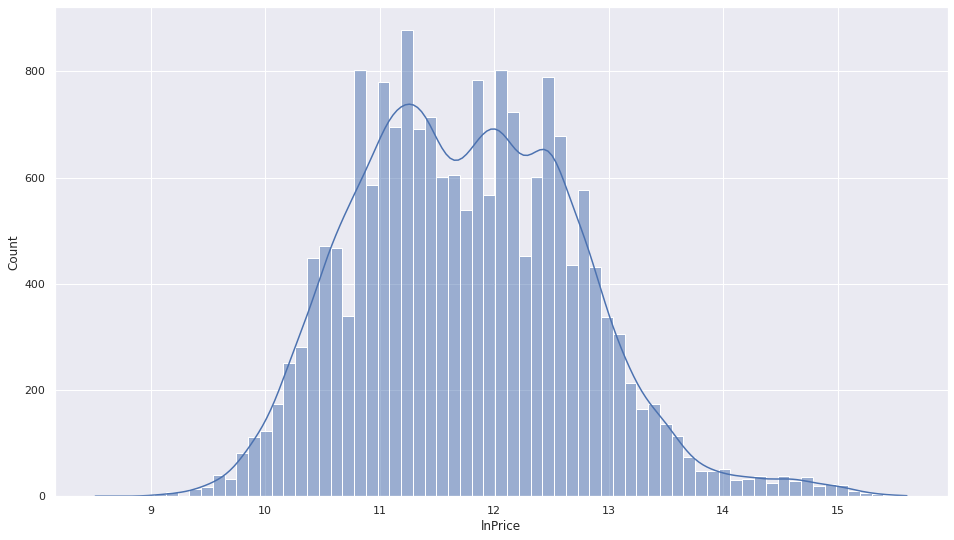

In [ ]:
sns.histplot(x = 'lnPrice', data=car_df_4,kde=True)

#not normal 

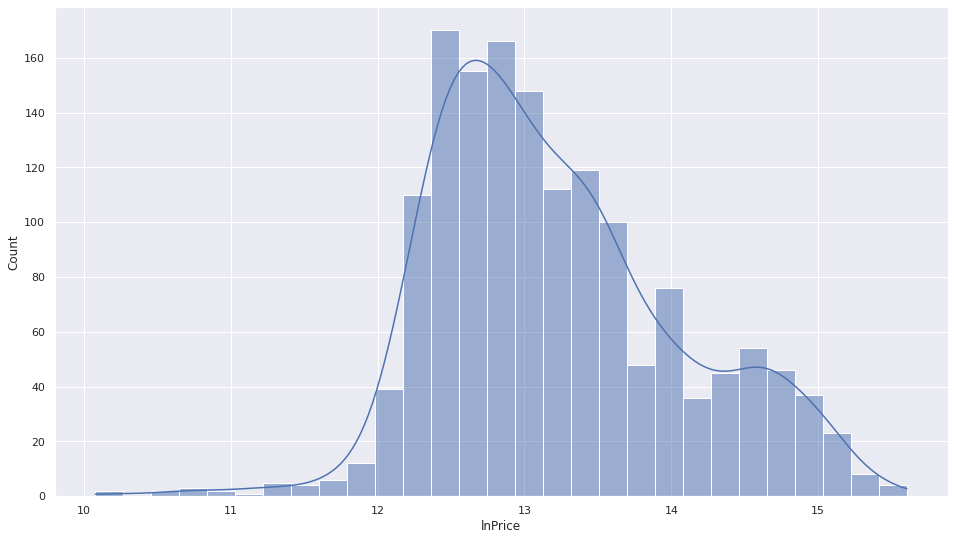

In [ ]:
sns.histplot(x = 'lnPrice', data=car_df_4[car_df_4.Mft_Class==1],kde=True)

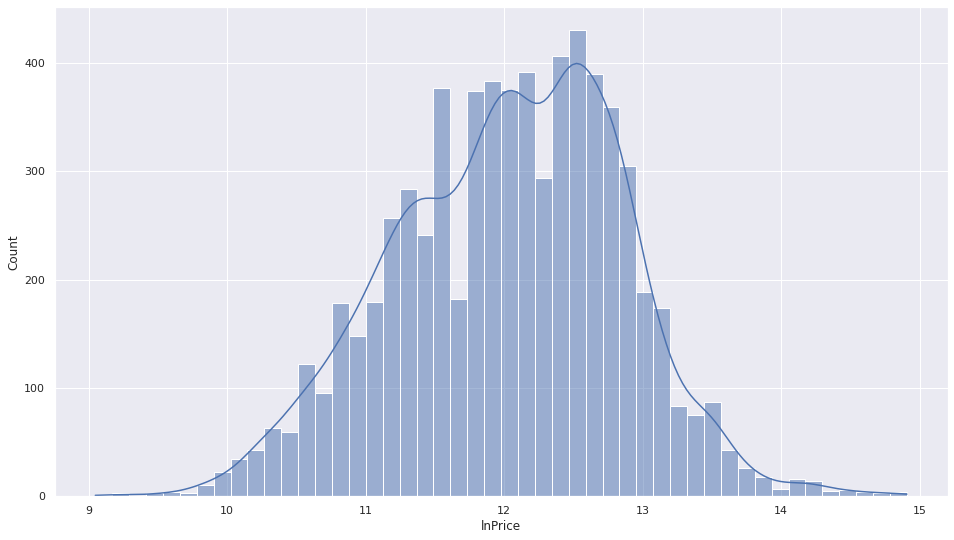

In [ ]:
sns.histplot(x = 'lnPrice', data=car_df_4[car_df_4.Mft_Class==2],kde=True)

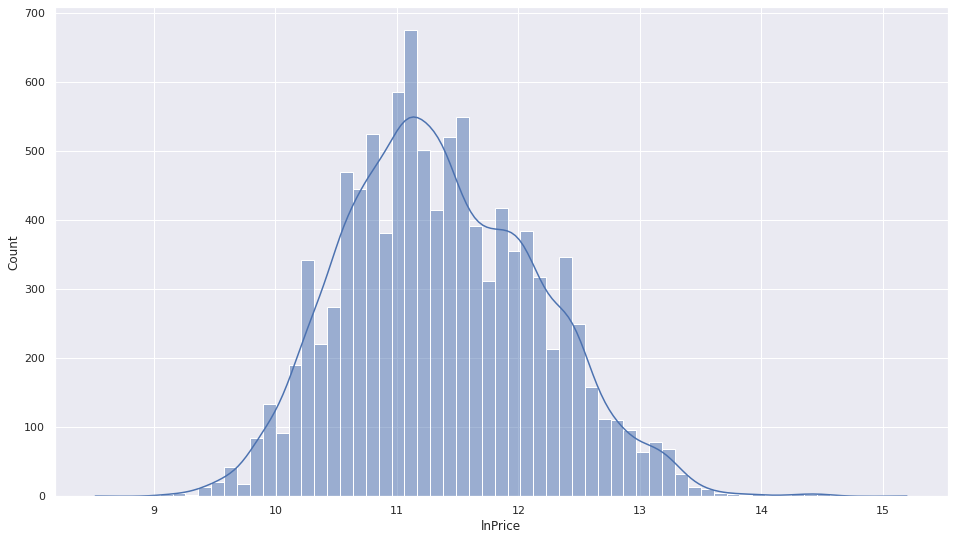

In [ ]:
sns.histplot(x = 'lnPrice', data=car_df_4[car_df_4.Mft_Class==3],kde=True)

Age

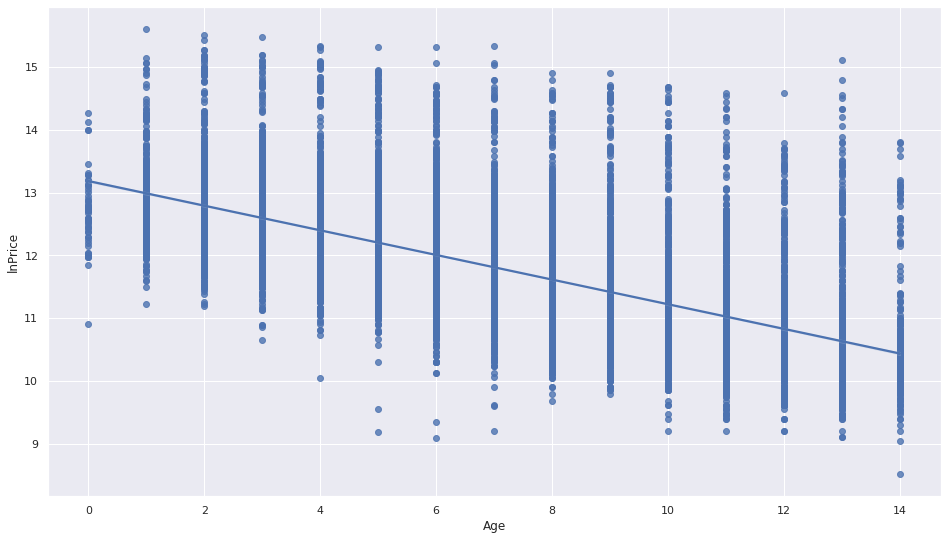

In [ ]:
sns.regplot(x='Age', y = 'lnPrice', data = car_df_4)

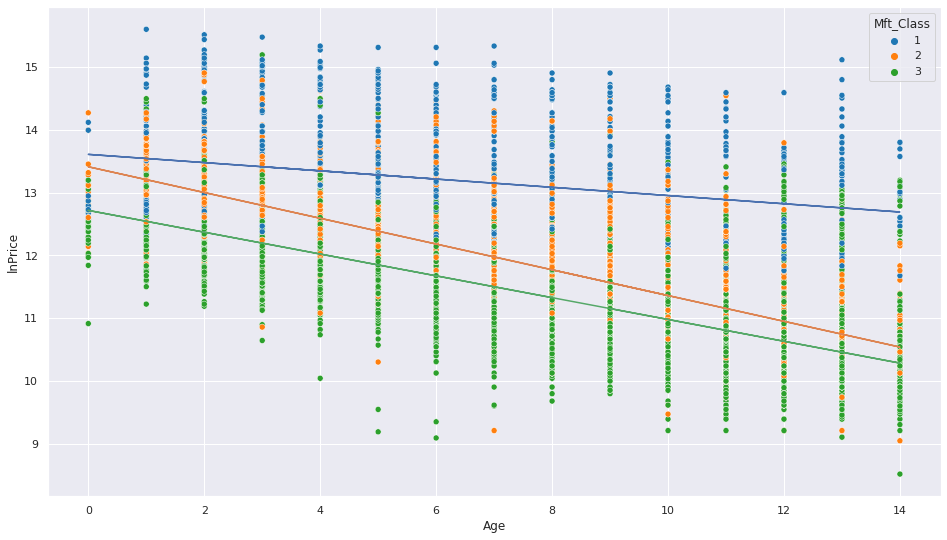

In [ ]:
for i in range(1,4):
  m,b = np.polyfit(car_df_4[car_df_4['Mft_Class']==i]['Age'], car_df_4[car_df_4['Mft_Class']==i]['lnPrice'], 1)
  plt.plot(car_df_4[car_df_4['Mft_Class']==i]['Age'],b+m*car_df_4[car_df_4['Mft_Class']==i]['Age'])

sns.scatterplot(x='Age', y = 'lnPrice',hue='Mft_Class', data = car_df_4, palette = 'tab10')
#interaction

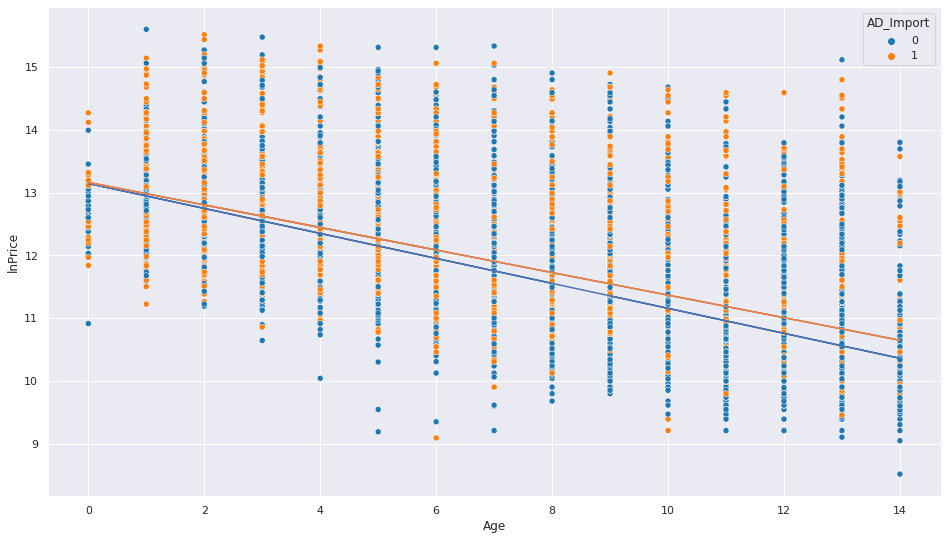

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_4[car_df_4['AD_Import']==i]['Age'], car_df_4[car_df_4['AD_Import']==i]['lnPrice'], 1)
  plt.plot(car_df_4[car_df_4['AD_Import']==i]['Age'],b+m*car_df_4[car_df_4['AD_Import']==i]['Age'])

sns.scatterplot(x='Age', y = 'lnPrice',hue='AD_Import', data = car_df_4, palette = 'tab10')

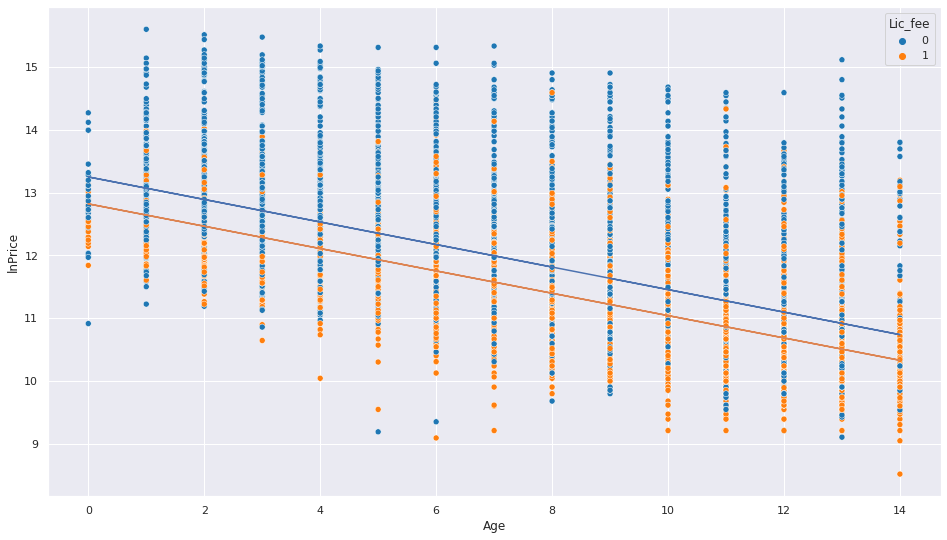

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_4[car_df_4['Lic_fee']==i]['Age'], car_df_4[car_df_4['Lic_fee']==i]['lnPrice'], 1)
  plt.plot(car_df_4[car_df_4['Lic_fee']==i]['Age'],b+m*car_df_4[car_df_4['Lic_fee']==i]['Age'])

sns.scatterplot(x='Age', y = 'lnPrice',hue='Lic_fee', data = car_df_4, palette = 'tab10')

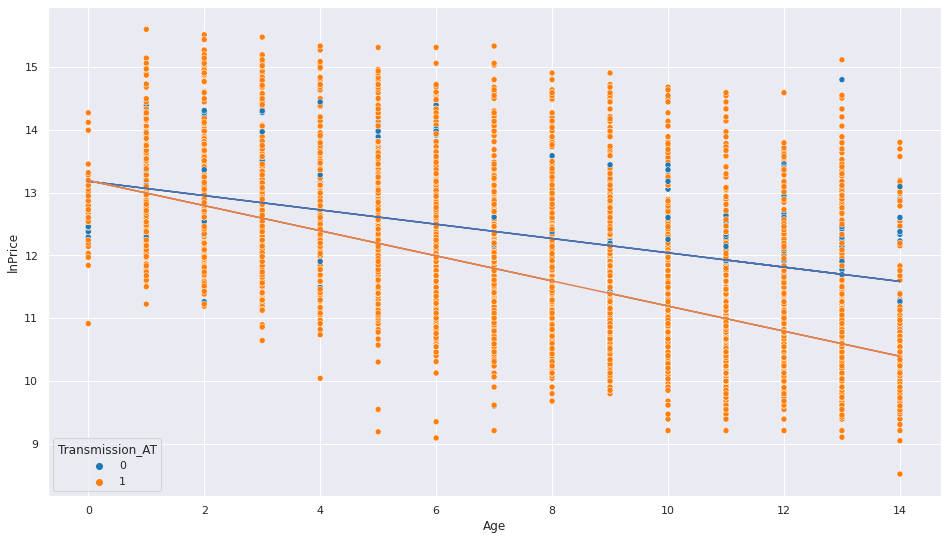

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_4[car_df_4['Transmission_AT']==i]['Age'], car_df_4[car_df_4['Transmission_AT']==i]['lnPrice'], 1)
  plt.plot(car_df_4[car_df_4['Transmission_AT']==i]['Age'],b+m*car_df_4[car_df_4['Transmission_AT']==i]['Age'])

sns.scatterplot(x='Age', y = 'lnPrice',hue='Transmission_AT', data = car_df_4, palette = 'tab10')

#interaction

Seat

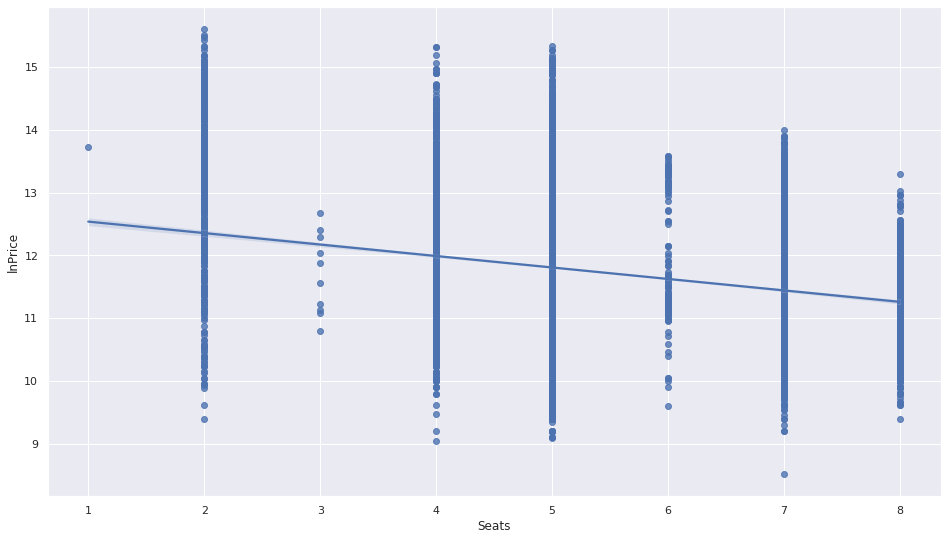

In [ ]:
sns.regplot(x='Seats', y = 'lnPrice', data = car_df_4, order = 1)

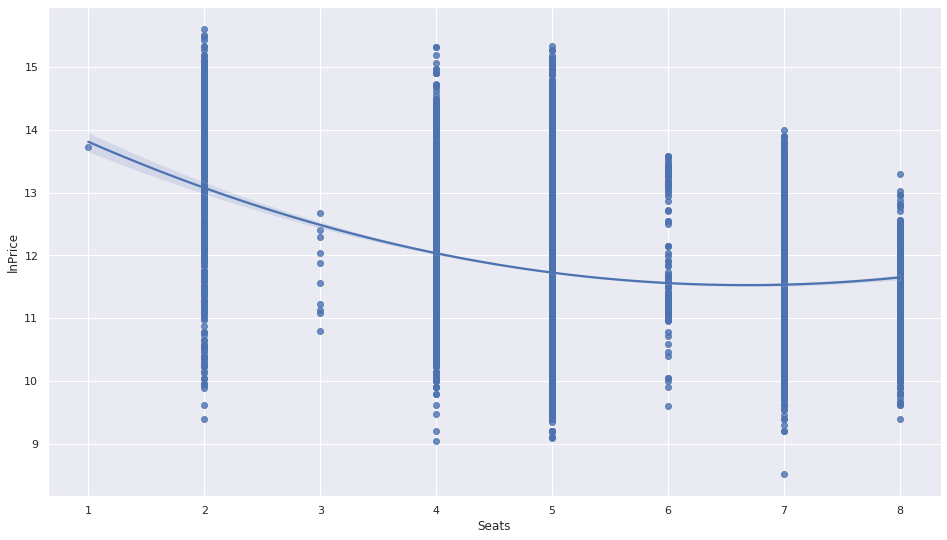

In [ ]:
sns.regplot(x='Seats', y = 'lnPrice', data = car_df_4, order = 2)

#squared

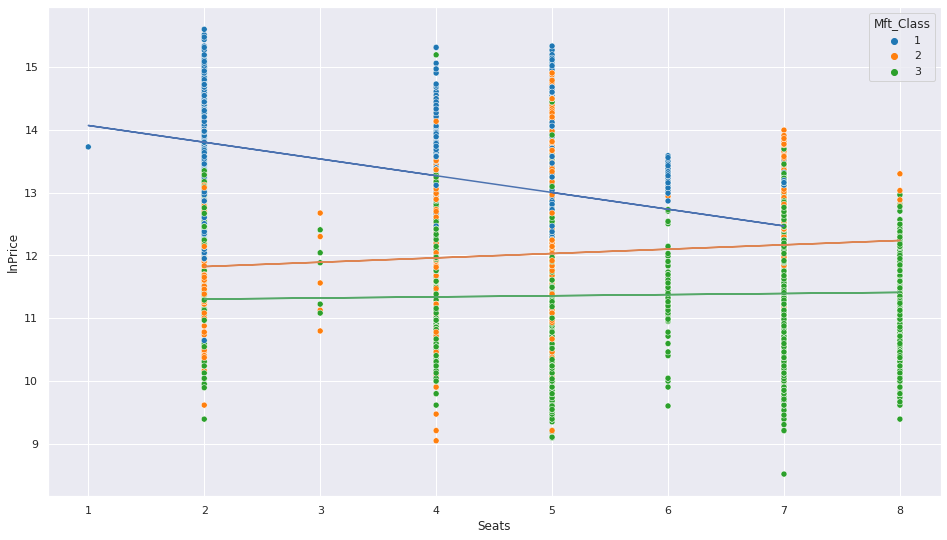

In [ ]:
for i in range(1,4):
  m,b = np.polyfit(car_df_4[car_df_4['Mft_Class']==i]['Seats'], car_df_4[car_df_4['Mft_Class']==i]['lnPrice'], 1)
  plt.plot(car_df_4[car_df_4['Mft_Class']==i]['Seats'],b+m*car_df_4[car_df_4['Mft_Class']==i]['Seats'])

sns.scatterplot(x='Seats', y = 'lnPrice',hue='Mft_Class', data = car_df_4, palette = 'tab10')

#Interaction

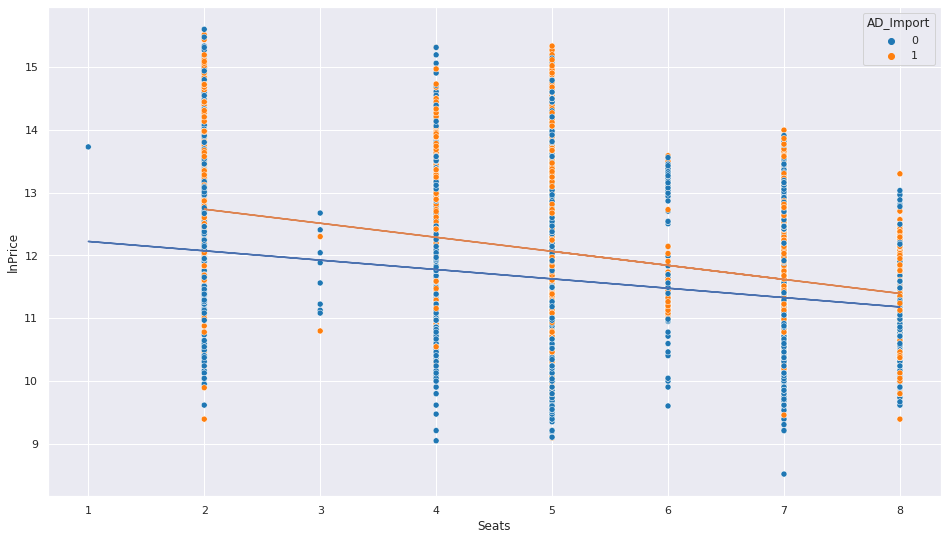

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_4[car_df_4['AD_Import']==i]['Seats'], car_df_4[car_df_4['AD_Import']==i]['lnPrice'], 1)
  plt.plot(car_df_4[car_df_4['AD_Import']==i]['Seats'],b+m*car_df_4[car_df_4['AD_Import']==i]['Seats'])

sns.scatterplot(x='Seats', y = 'lnPrice',hue='AD_Import', data = car_df_4, palette = 'tab10')

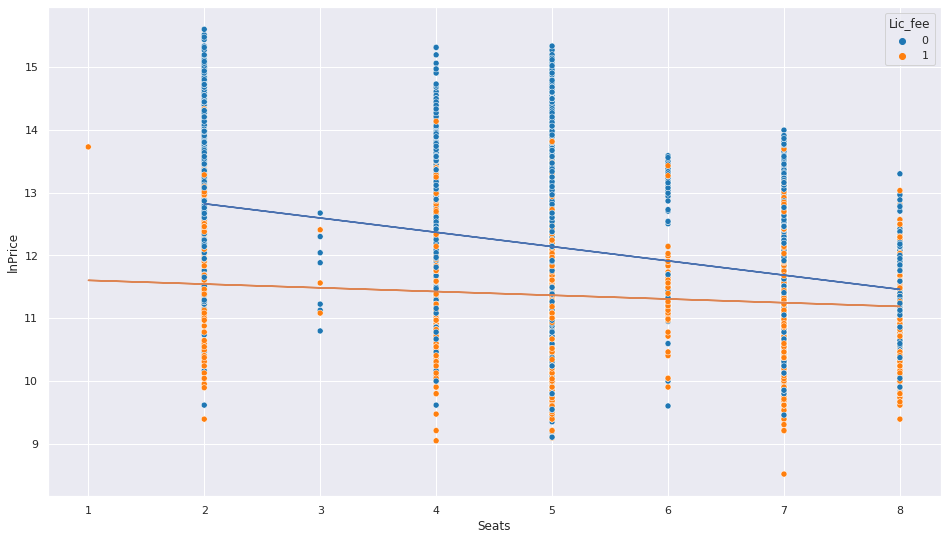

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_4[car_df_4['Lic_fee']==i]['Seats'], car_df_4[car_df_4['Lic_fee']==i]['lnPrice'], 1)
  plt.plot(car_df_4[car_df_4['Lic_fee']==i]['Seats'],b+m*car_df_4[car_df_4['Lic_fee']==i]['Seats'])

sns.scatterplot(x='Seats', y = 'lnPrice',hue='Lic_fee', data = car_df_4, palette = 'tab10')

#interaction

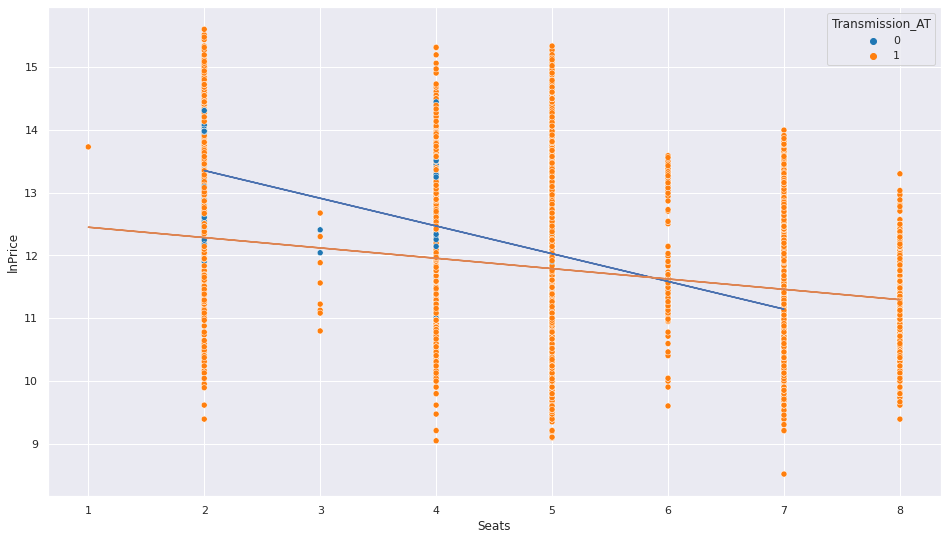

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_4[car_df_4['Transmission_AT']==i]['Seats'], car_df_4[car_df_4['Transmission_AT']==i]['lnPrice'], 1)
  plt.plot(car_df_4[car_df_4['Transmission_AT']==i]['Seats'],b+m*car_df_4[car_df_4['Transmission_AT']==i]['Seats'])

sns.scatterplot(x='Seats', y = 'lnPrice',hue='Transmission_AT', data = car_df_4, palette = 'tab10')

#interaction

Engine

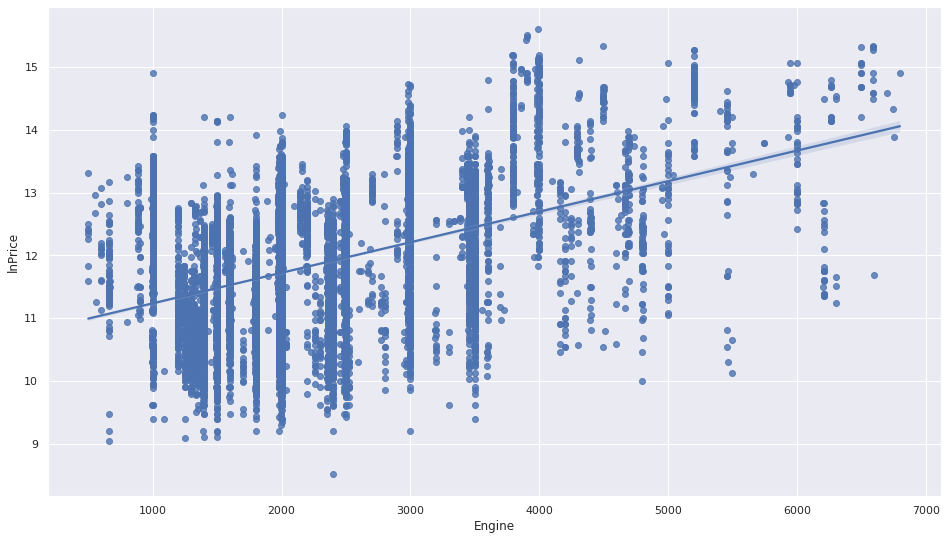

In [ ]:
sns.regplot(x='Engine', y = 'lnPrice', data = car_df_4, order = 1)

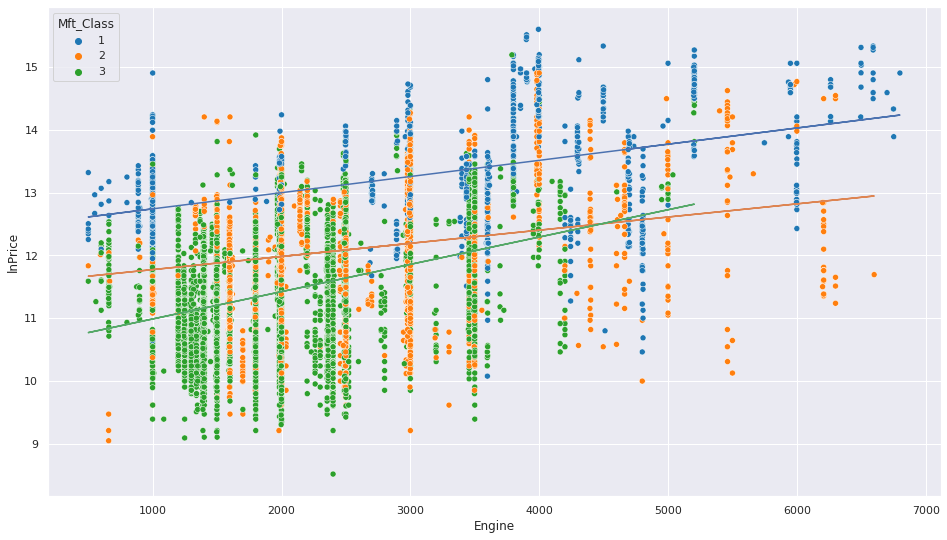

In [ ]:
for i in range(1,4):
  m,b = np.polyfit(car_df_4[car_df_4['Mft_Class']==i]['Engine'], car_df_4[car_df_4['Mft_Class']==i]['lnPrice'], 1)
  plt.plot(car_df_4[car_df_4['Mft_Class']==i]['Engine'],b+m*car_df_4[car_df_4['Mft_Class']==i]['Engine'])

sns.scatterplot(x='Engine', y = 'lnPrice',hue='Mft_Class', data = car_df_4, palette = 'tab10')

#interaction

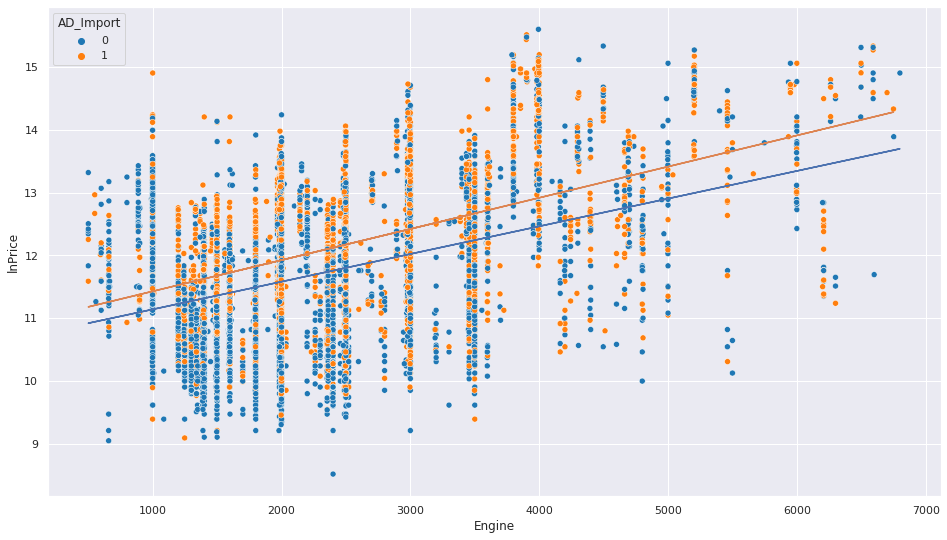

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_4[car_df_4['AD_Import']==i]['Engine'], car_df_4[car_df_4['AD_Import']==i]['lnPrice'], 1)
  plt.plot(car_df_4[car_df_4['AD_Import']==i]['Engine'],b+m*car_df_4[car_df_4['AD_Import']==i]['Engine'])

sns.scatterplot(x='Engine', y = 'lnPrice',hue='AD_Import', data = car_df_4, palette = 'tab10')

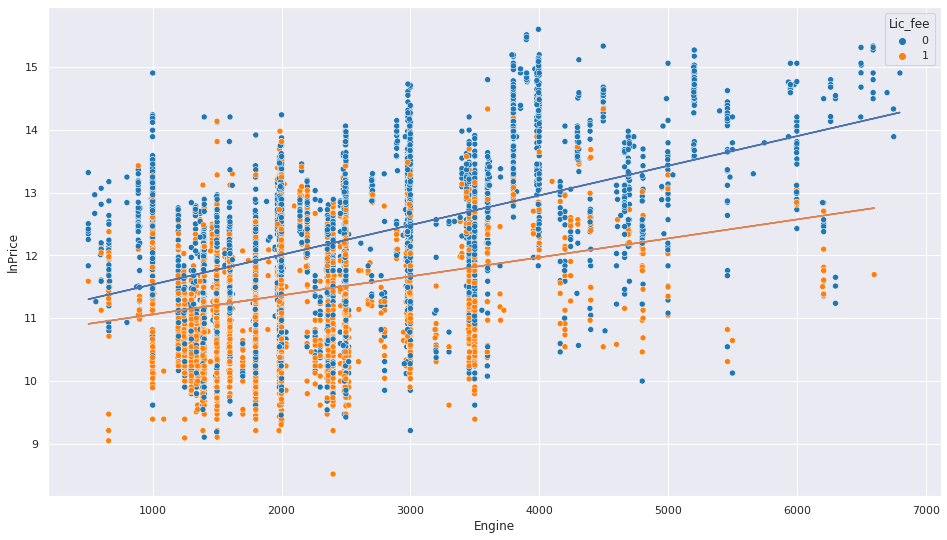

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_4[car_df_4['Lic_fee']==i]['Engine'], car_df_4[car_df_4['Lic_fee']==i]['lnPrice'], 1)
  plt.plot(car_df_4[car_df_4['Lic_fee']==i]['Engine'],b+m*car_df_4[car_df_4['Lic_fee']==i]['Engine'])

sns.scatterplot(x='Engine', y = 'lnPrice',hue='Lic_fee', data = car_df_4, palette = 'tab10')

#may have interaction

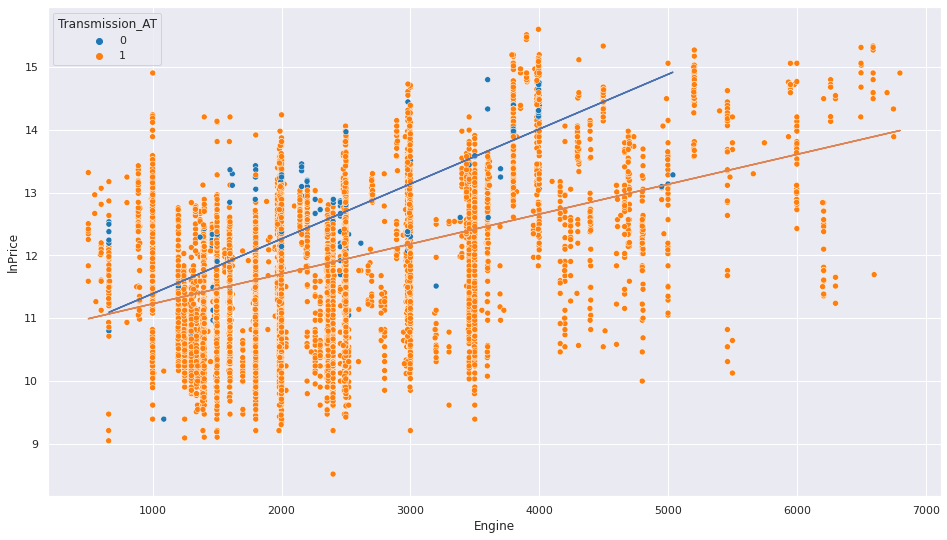

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_4[car_df_4['Transmission_AT']==i]['Engine'], car_df_4[car_df_4['Transmission_AT']==i]['lnPrice'], 1)
  plt.plot(car_df_4[car_df_4['Transmission_AT']==i]['Engine'],b+m*car_df_4[car_df_4['Transmission_AT']==i]['Engine'])

sns.scatterplot(x='Engine', y = 'lnPrice',hue='Transmission_AT', data = car_df_4, palette = 'tab10')
#interaction

Preowner

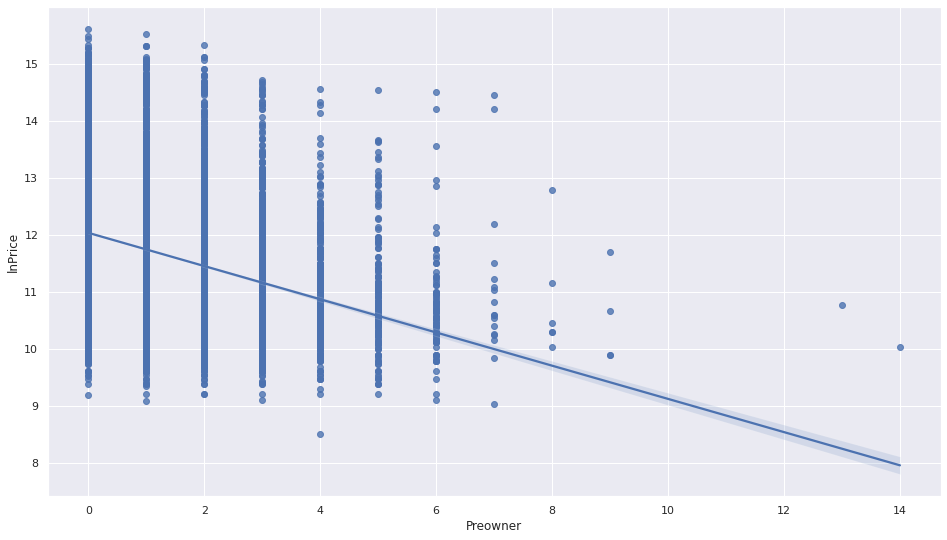

In [ ]:
sns.regplot(x='Preowner', y = 'lnPrice', data = car_df_4, order = 1)

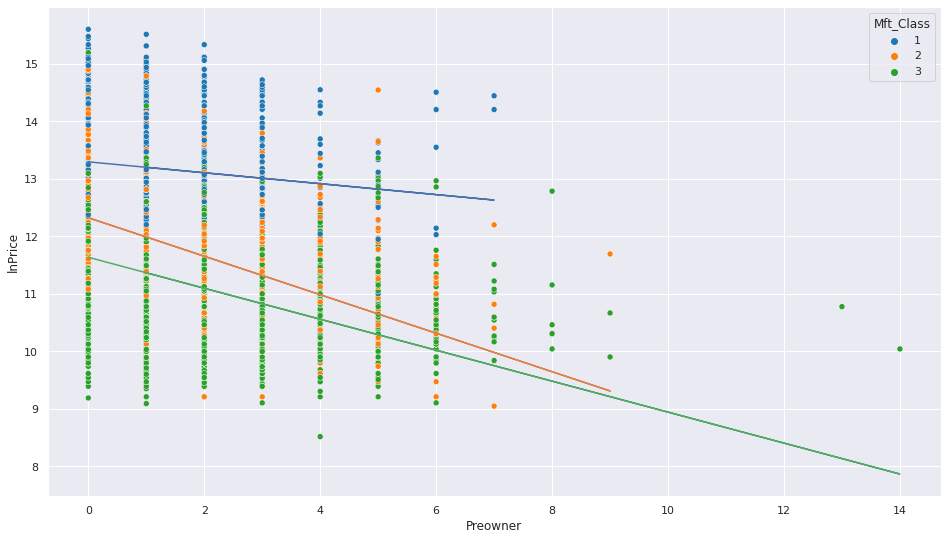

In [ ]:
for i in range(1,4):
  m,b = np.polyfit(car_df_4[car_df_4['Mft_Class']==i]['Preowner'], car_df_4[car_df_4['Mft_Class']==i]['lnPrice'], 1)
  plt.plot(car_df_4[car_df_4['Mft_Class']==i]['Preowner'],b+m*car_df_4[car_df_4['Mft_Class']==i]['Preowner'])

sns.scatterplot(x='Preowner', y = 'lnPrice',hue='Mft_Class', data = car_df_4, palette = 'tab10')

#interaction

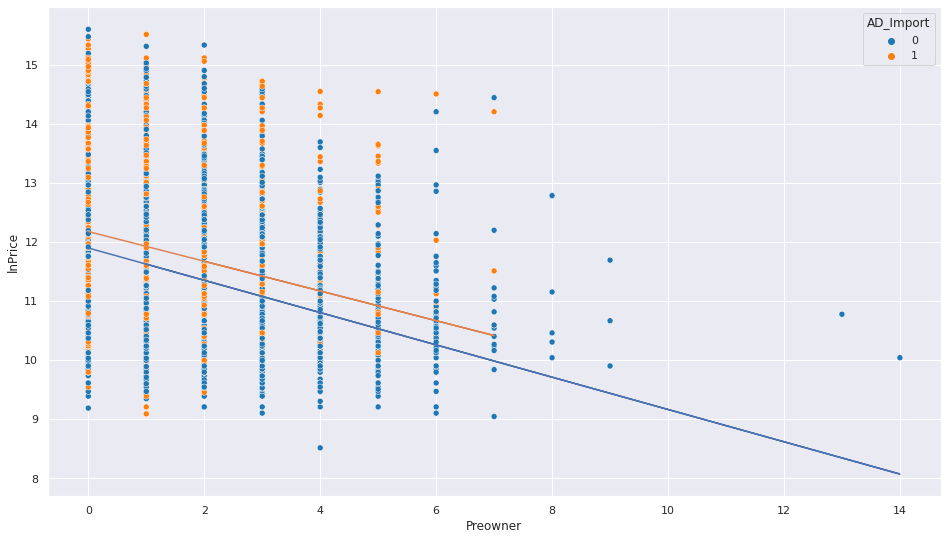

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_4[car_df_4['AD_Import']==i]['Preowner'], car_df_4[car_df_4['AD_Import']==i]['lnPrice'], 1)
  plt.plot(car_df_4[car_df_4['AD_Import']==i]['Preowner'],b+m*car_df_4[car_df_4['AD_Import']==i]['Preowner'])

sns.scatterplot(x='Preowner', y = 'lnPrice',hue='AD_Import', data = car_df_4, palette = 'tab10')

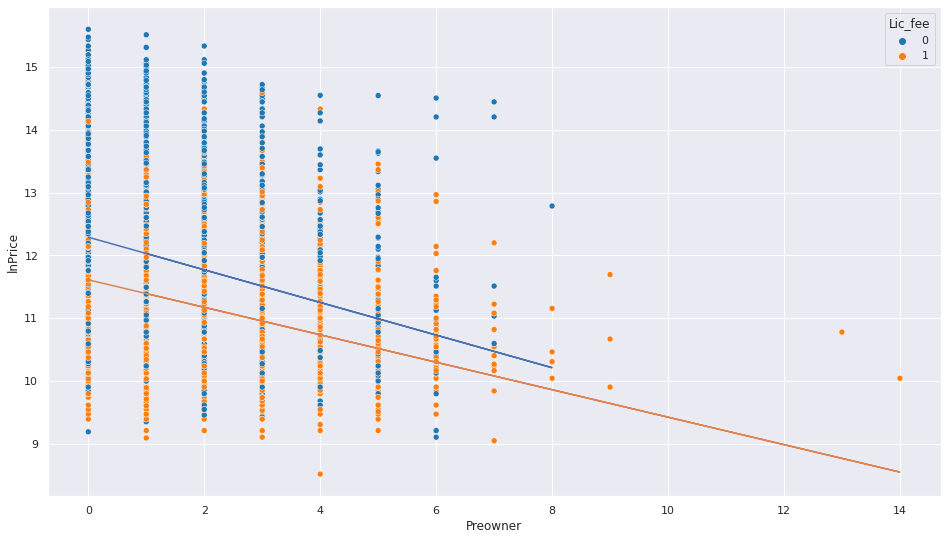

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_4[car_df_4['Lic_fee']==i]['Preowner'], car_df_4[car_df_4['Lic_fee']==i]['lnPrice'], 1)
  plt.plot(car_df_4[car_df_4['Lic_fee']==i]['Preowner'],b+m*car_df_4[car_df_4['Lic_fee']==i]['Preowner'])

sns.scatterplot(x='Preowner', y = 'lnPrice',hue='Lic_fee', data = car_df_4, palette = 'tab10')

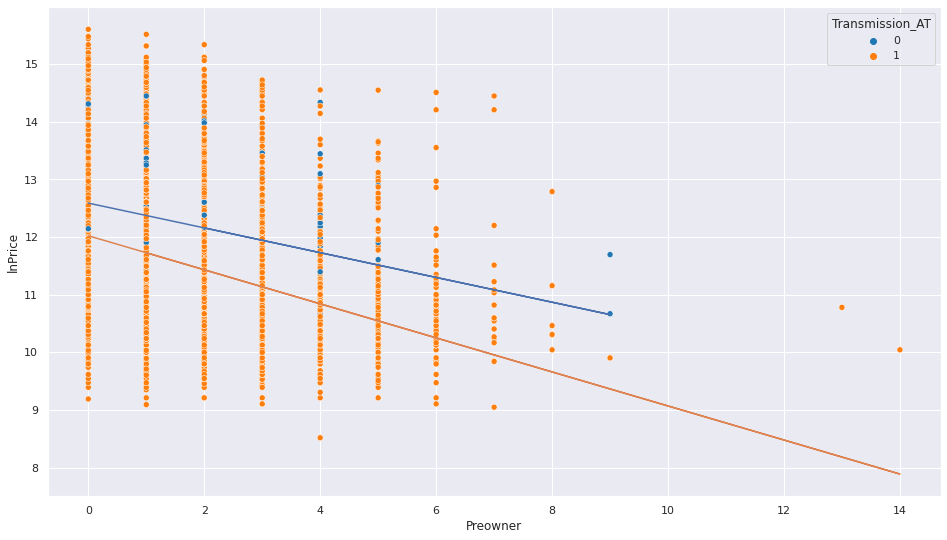

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_4[car_df_4['Transmission_AT']==i]['Preowner'], car_df_4[car_df_4['Transmission_AT']==i]['lnPrice'], 1)
  plt.plot(car_df_4[car_df_4['Transmission_AT']==i]['Preowner'],b+m*car_df_4[car_df_4['Transmission_AT']==i]['Preowner'])

sns.scatterplot(x='Preowner', y = 'lnPrice',hue='Transmission_AT', data = car_df_4, palette = 'tab10')

Travel Dist

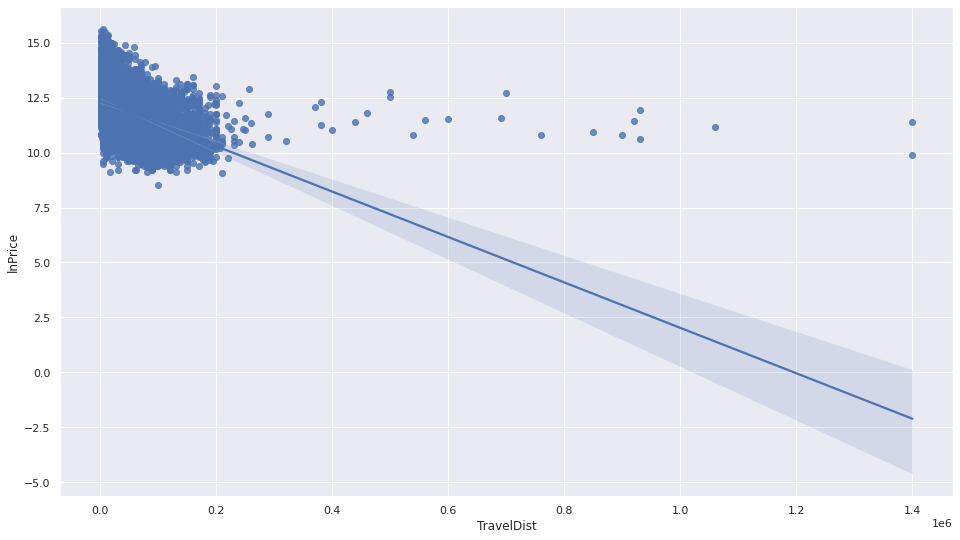

In [ ]:
sns.regplot(x='TravelDist', y = 'lnPrice', data = car_df_4, order = 1)

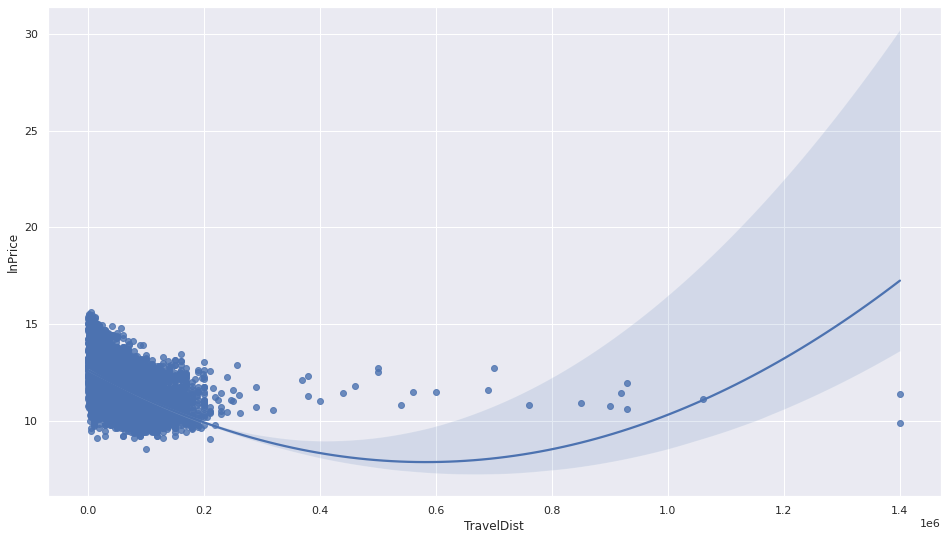

In [ ]:
sns.regplot(x='TravelDist', y = 'lnPrice', data = car_df_4, order = 2)

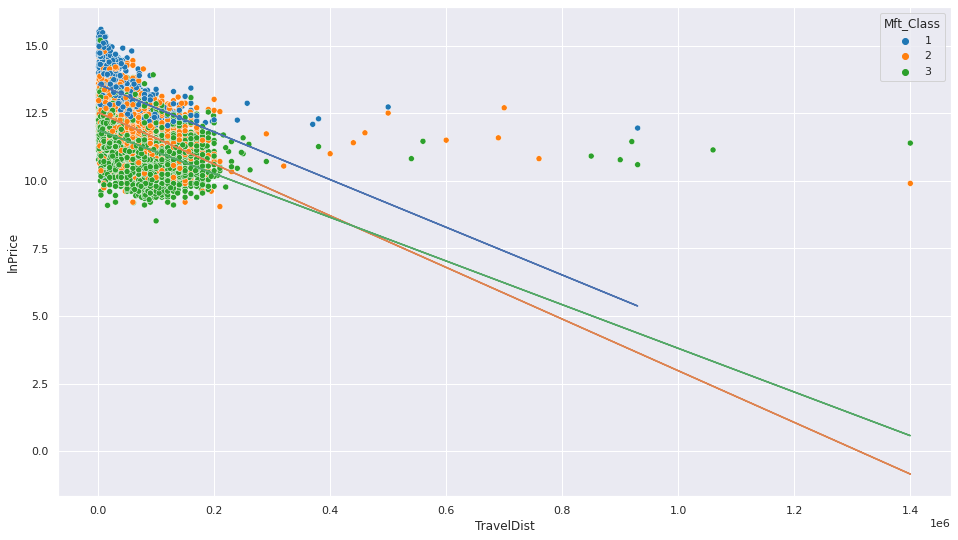

In [ ]:
for i in range(1,4):
  m,b = np.polyfit(car_df_4[car_df_4['Mft_Class']==i]['TravelDist'], car_df_4[car_df_4['Mft_Class']==i]['lnPrice'], 1)
  plt.plot(car_df_4[car_df_4['Mft_Class']==i]['TravelDist'],b+m*car_df_4[car_df_4['Mft_Class']==i]['TravelDist'])

sns.scatterplot(x='TravelDist', y = 'lnPrice',hue='Mft_Class', data = car_df_4, palette = 'tab10')

#interaction

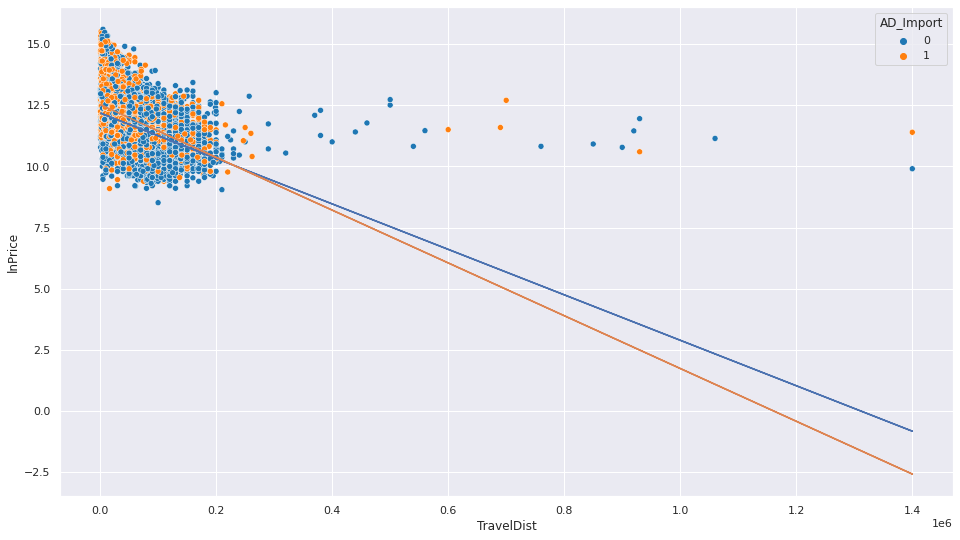

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_4[car_df_4['AD_Import']==i]['TravelDist'], car_df_4[car_df_4['AD_Import']==i]['lnPrice'], 1)
  plt.plot(car_df_4[car_df_4['AD_Import']==i]['TravelDist'],b+m*car_df_4[car_df_4['AD_Import']==i]['TravelDist'])

sns.scatterplot(x='TravelDist', y = 'lnPrice',hue='AD_Import', data = car_df_4, palette = 'tab10')
#interaction

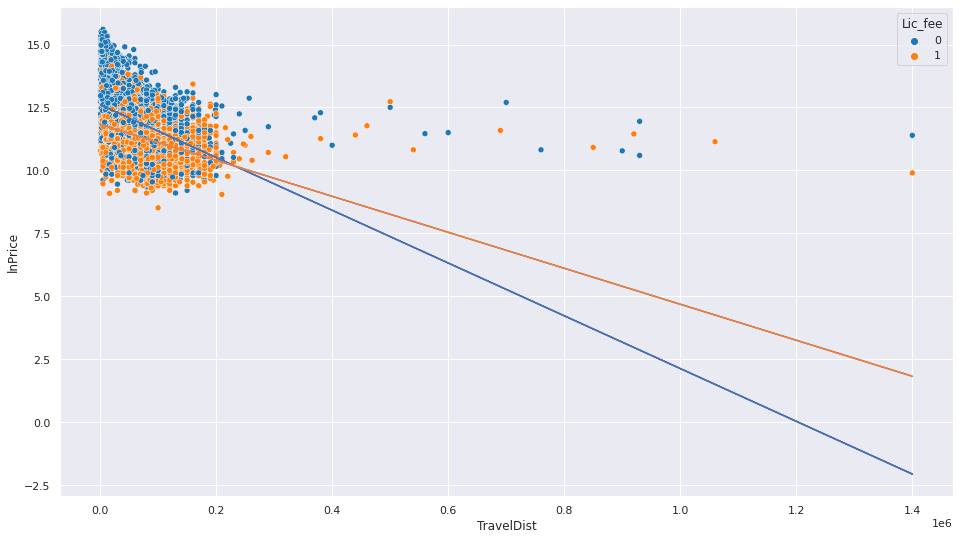

In [ ]:


for i in range(2):
  m,b = np.polyfit(car_df_4[car_df_4['Lic_fee']==i]['TravelDist'], car_df_4[car_df_4['Lic_fee']==i]['lnPrice'], 1)
  plt.plot(car_df_4[car_df_4['Lic_fee']==i]['TravelDist'],b+m*car_df_4[car_df_4['Lic_fee']==i]['TravelDist'])

sns.scatterplot(x='TravelDist', y = 'lnPrice',hue='Lic_fee', data = car_df_4, palette = 'tab10')

#Interaction

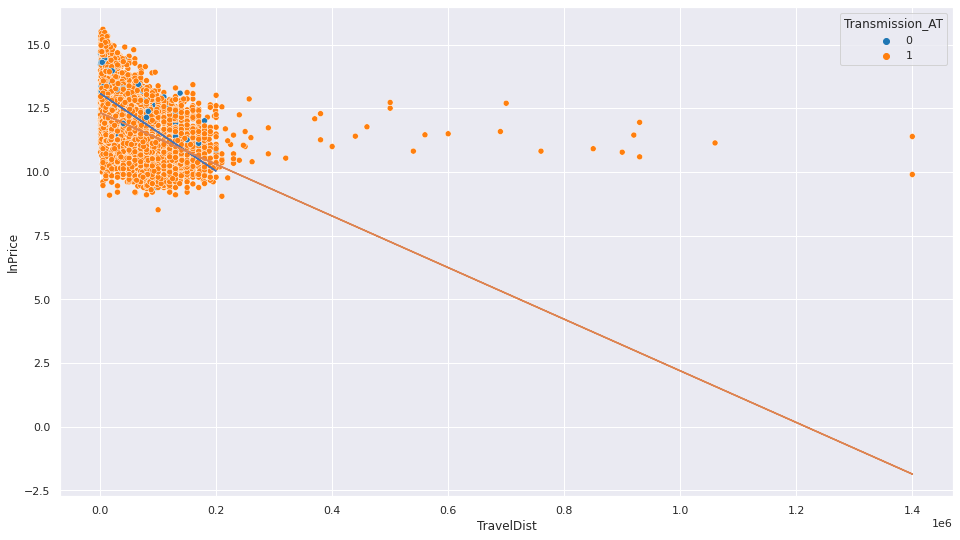

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_4[car_df_4['Transmission_AT']==i]['TravelDist'], car_df_4[car_df_4['Transmission_AT']==i]['lnPrice'], 1)
  plt.plot(car_df_4[car_df_4['Transmission_AT']==i]['TravelDist'],b+m*car_df_4[car_df_4['Transmission_AT']==i]['TravelDist'])

sns.scatterplot(x='TravelDist', y = 'lnPrice',hue='Transmission_AT', data = car_df_4, palette = 'tab10')

#interaction

### transform on TD and Engine

In [ ]:
labels=[0,1,2,3,4,5,6,7,8,9]
car_df_4['TravelDist_bin']=pd.cut(car_df_4['TravelDist'],len(labels),labels=labels)
car_df_4['TravelDist_bin']=car_df_4['TravelDist_bin'].astype(float)
labels=[0,1,2,3,4,5,6,7,8,9]
car_df_4['EV_bin']=pd.cut(car_df_4['Engine'],len(labels),labels=labels)
car_df_4['EV_bin']=car_df_4['EV_bin'].astype(float)

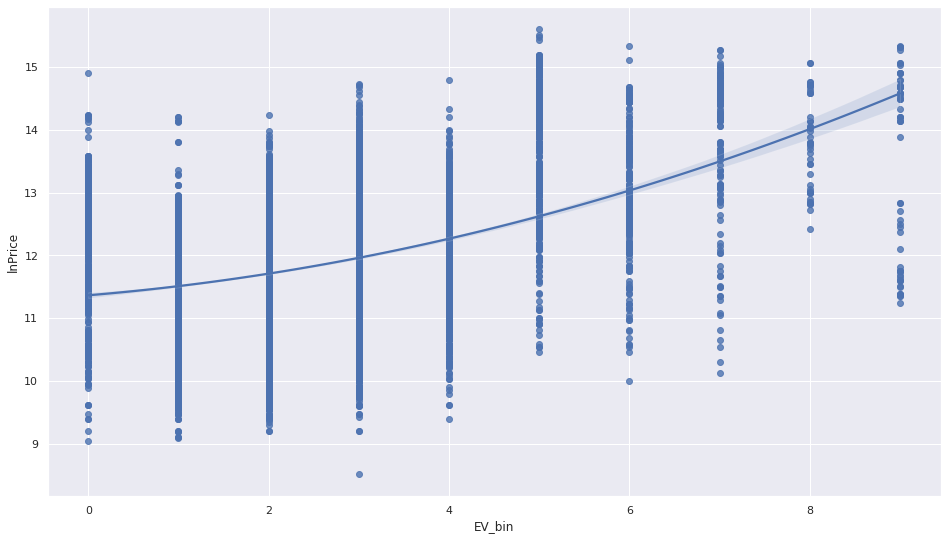

In [ ]:
sns.regplot(x='EV_bin', y = 'lnPrice', data = car_df_4, order = 2)

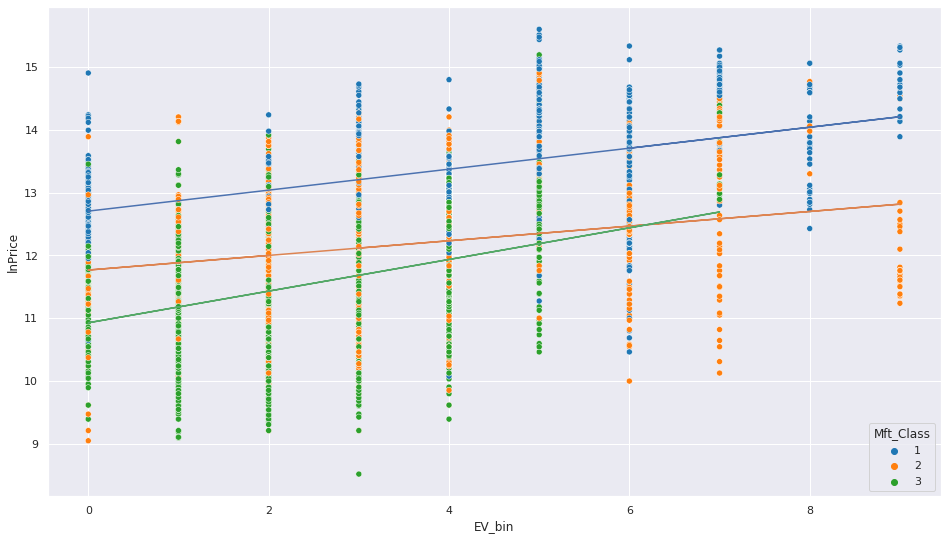

In [ ]:
for i in range(1,4):
  m,b = np.polyfit(car_df_4[car_df_4['Mft_Class']==i]['EV_bin'], car_df_4[car_df_4['Mft_Class']==i]['lnPrice'], 1)
  plt.plot(car_df_4[car_df_4['Mft_Class']==i]['EV_bin'],b+m*car_df_4[car_df_4['Mft_Class']==i]['EV_bin'])

sns.scatterplot(x='EV_bin', y = 'lnPrice',hue='Mft_Class', data = car_df_4, palette = 'tab10')


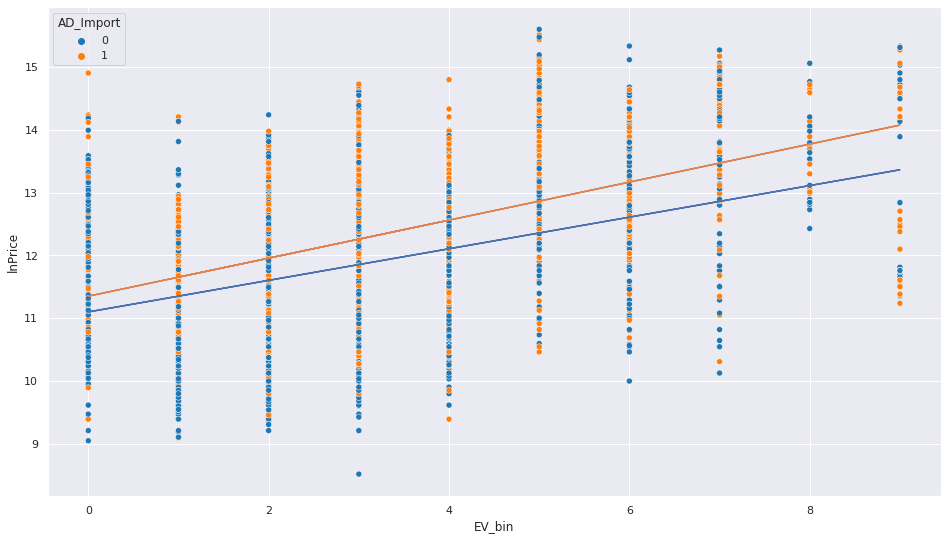

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_4[car_df_4['AD_Import']==i]['EV_bin'], car_df_4[car_df_4['AD_Import']==i]['lnPrice'], 1)
  plt.plot(car_df_4[car_df_4['AD_Import']==i]['EV_bin'],b+m*car_df_4[car_df_4['AD_Import']==i]['EV_bin'])

sns.scatterplot(x='EV_bin', y = 'lnPrice',hue='AD_Import', data = car_df_4, palette = 'tab10')

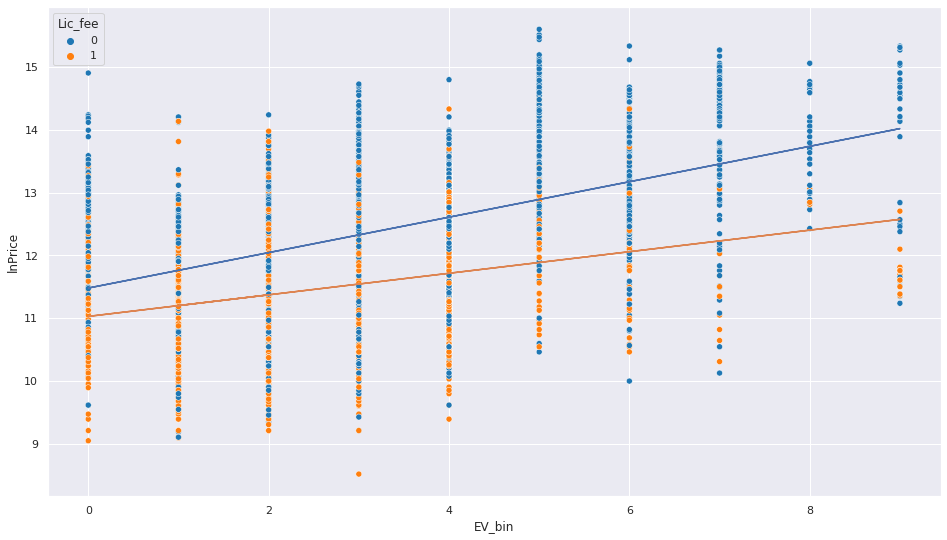

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_4[car_df_4['Lic_fee']==i]['EV_bin'], car_df_4[car_df_4['Lic_fee']==i]['lnPrice'], 1)
  plt.plot(car_df_4[car_df_4['Lic_fee']==i]['EV_bin'],b+m*car_df_4[car_df_4['Lic_fee']==i]['EV_bin'])

sns.scatterplot(x='EV_bin', y = 'lnPrice',hue='Lic_fee', data = car_df_4, palette = 'tab10')

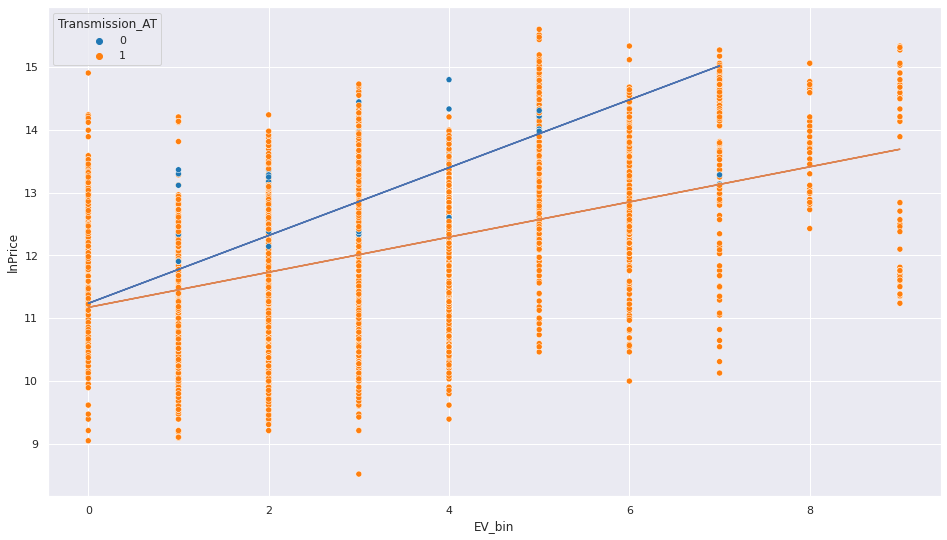

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_4[car_df_4['Transmission_AT']==i]['EV_bin'], car_df_4[car_df_4['Transmission_AT']==i]['lnPrice'], 1)
  plt.plot(car_df_4[car_df_4['Transmission_AT']==i]['EV_bin'],b+m*car_df_4[car_df_4['Transmission_AT']==i]['EV_bin'])

sns.scatterplot(x='EV_bin', y = 'lnPrice',hue='Transmission_AT', data = car_df_4, palette = 'tab10')

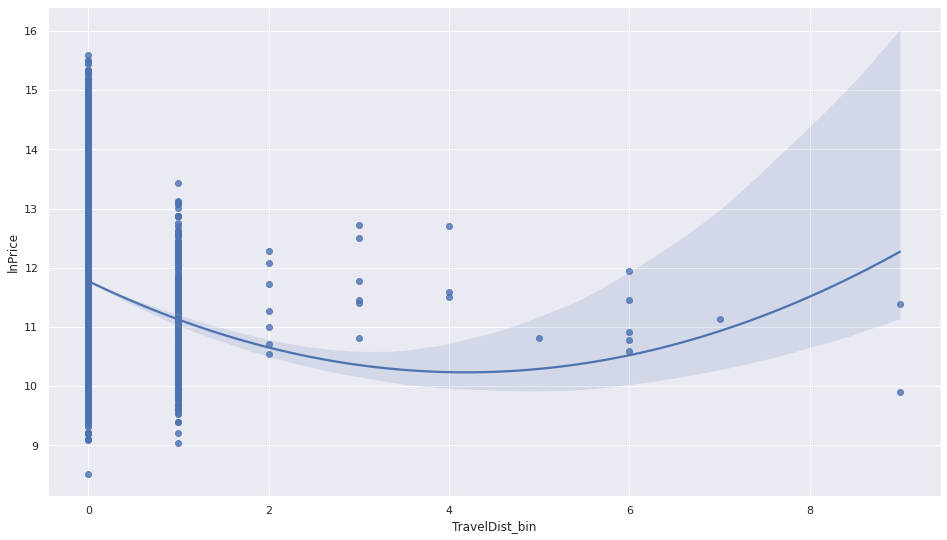

In [ ]:
sns.regplot(x='TravelDist_bin', y = 'lnPrice', data = car_df_4, order = 2)

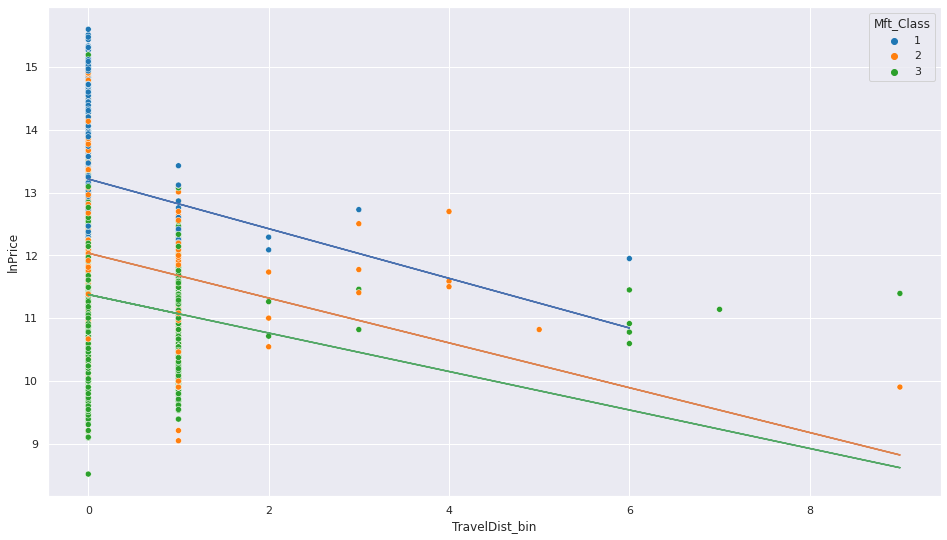

In [ ]:
for i in range(1,4):
  m,b = np.polyfit(car_df_4[car_df_4['Mft_Class']==i]['TravelDist_bin'], car_df_4[car_df_4['Mft_Class']==i]['lnPrice'], 1)
  plt.plot(car_df_4[car_df_4['Mft_Class']==i]['TravelDist_bin'],b+m*car_df_4[car_df_4['Mft_Class']==i]['TravelDist_bin'])

sns.scatterplot(x='TravelDist_bin', y = 'lnPrice',hue='Mft_Class', data = car_df_4, palette = 'tab10')


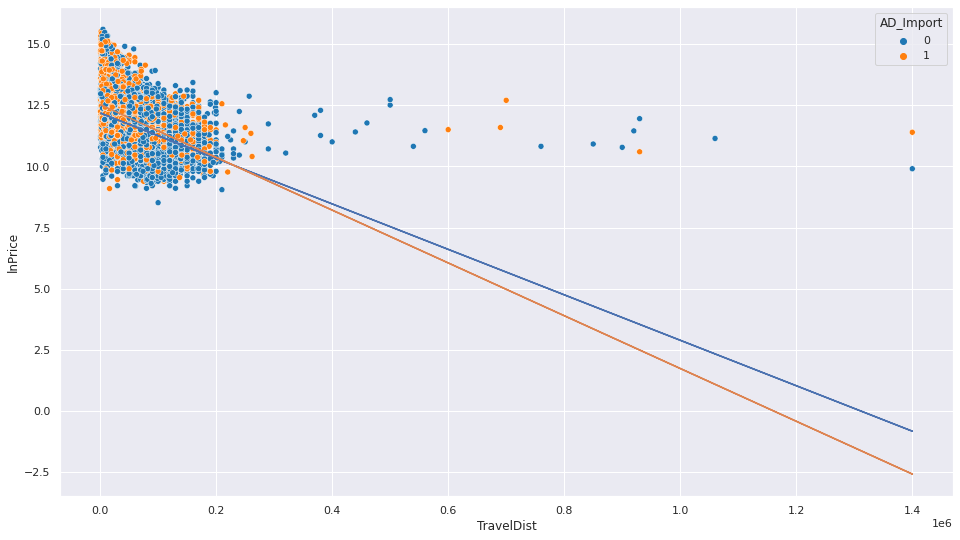

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_4[car_df_4['AD_Import']==i]['TravelDist'], car_df_4[car_df_4['AD_Import']==i]['lnPrice'], 1)
  plt.plot(car_df_4[car_df_4['AD_Import']==i]['TravelDist'],b+m*car_df_4[car_df_4['AD_Import']==i]['TravelDist'])

sns.scatterplot(x='TravelDist', y = 'lnPrice',hue='AD_Import', data = car_df_4, palette = 'tab10')

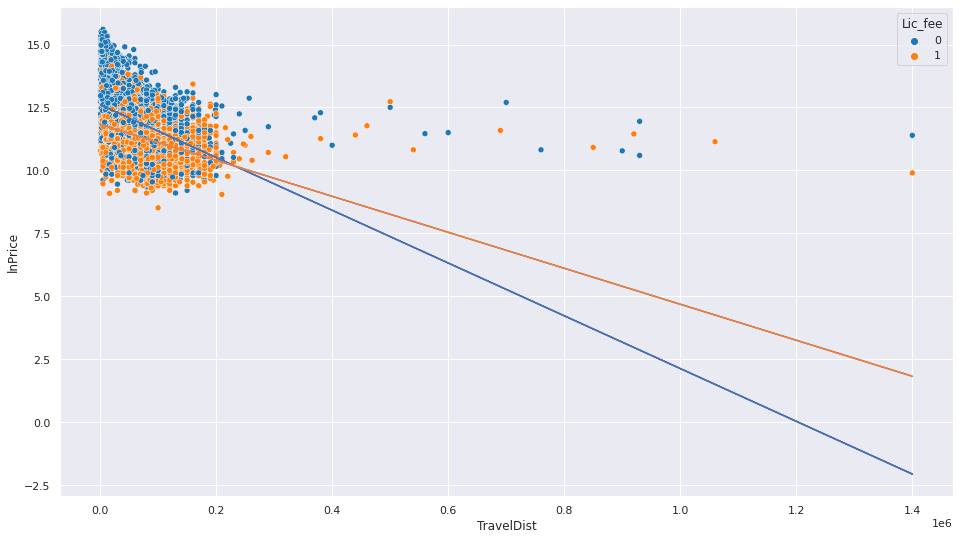

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_4[car_df_4['Lic_fee']==i]['TravelDist'], car_df_4[car_df_4['Lic_fee']==i]['lnPrice'], 1)
  plt.plot(car_df_4[car_df_4['Lic_fee']==i]['TravelDist'],b+m*car_df_4[car_df_4['Lic_fee']==i]['TravelDist'])

sns.scatterplot(x='TravelDist', y = 'lnPrice',hue='Lic_fee', data = car_df_4, palette = 'tab10')

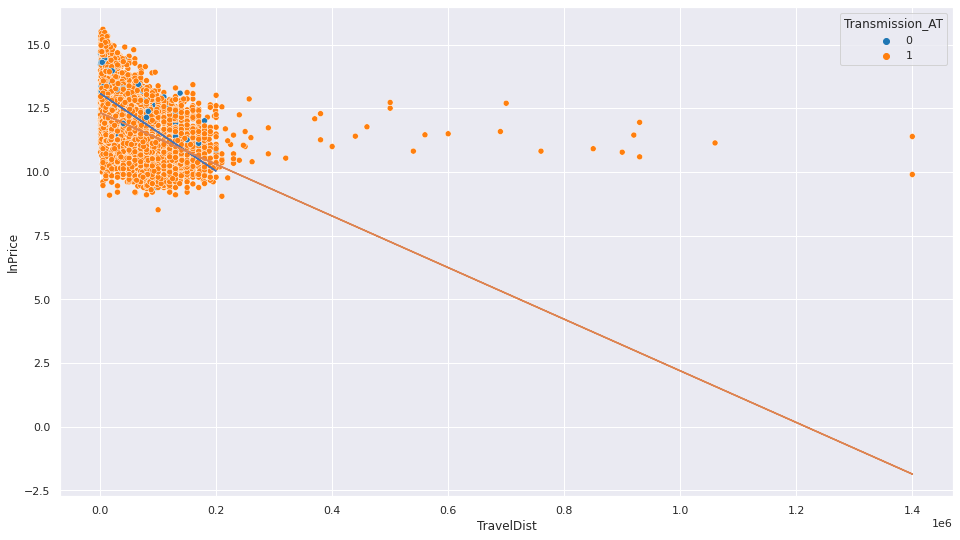

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_4[car_df_4['Transmission_AT']==i]['TravelDist'], car_df_4[car_df_4['Transmission_AT']==i]['lnPrice'], 1)
  plt.plot(car_df_4[car_df_4['Transmission_AT']==i]['TravelDist'],b+m*car_df_4[car_df_4['Transmission_AT']==i]['TravelDist'])

sns.scatterplot(x='TravelDist', y = 'lnPrice',hue='Transmission_AT', data = car_df_4, palette = 'tab10')

Short summary for ln(Price):

**order:

1 - Age, Preowner, Engine,EV_bin

2 - Seats,  TravelDist, TravelDist_bin

**Interaction:

(1) Age: None

(2) Seats: class, Lic_fee

(3) Engine: class, Lic_fee

(4) TravelDist:  AD Import, Lic_fee

(5) Preowner: None

(6) EV_bin: Class

(7) TravelDist_bin:None

#Model Building

### 1st trial - no interaction

In [ ]:
col = list(car_df_4.columns)
#mft_class 3 is removed
unwanted = ['RecordNo', 'Manufacturer', 'Mft_Class', 'colour1', 'colour2', 'colour3', 'Engine','TravelDist']
col_1st = [name for name in col if name not in unwanted]
print(col_1st)

['Price', 'Seats', 'Preowner', 'Age', 'AD_Import', 'Lic_fee', 'Transmission_AT', 'aqua', 'black', 'blue', 'gray', 'green', 'lime', 'maroon', 'navy', 'olive', 'purple', 'red', 'silver', 'teal', 'white', 'yellow', 'Mft_Class_1', 'Mft_Class_2', 'Mft_Class_3', 'lnPrice', 'TravelDist_bin', 'EV_bin']


In [ ]:
car_reg_1st = car_df_4[col_1st] 

In [ ]:
order = ['Price', 'Seats',  'Preowner',  'Age',
       'AD_Import', 'Lic_fee', 'Transmission_AT', 'aqua', 'black', 'blue',
       'gray', 'green', 'lime', 'maroon', 'navy', 'olive', 'purple', 'red',
       'silver', 'teal', 'white', 'yellow',  'TravelDist_bin', 'EV_bin',
       'Mft_Class_1', 'Mft_Class_2', 'Mft_Class_3', 'lnPrice']
car_reg_1st = car_reg_1st[order]

In [ ]:
pname= list(car_reg_1st.iloc[:,1:-2].columns)
Y = car_reg_1st.lnPrice
x = car_reg_1st[pname]
X = sm.add_constant(x)
results = sm.OLS(Y,X).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.794
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     2858.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:51:11   Log-Likelihood:                -11165.
No. Observations:               18576   AIC:                         2.238e+04
Df Residuals:                   18550   BIC:                         2.258e+04
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              13.0861      0.045    288.443      0.000      12.997      13.175
Seats              -0.0231      0.003     -7.220      0.000      -0.029      -0.017
Preowner           -0.0509      0.003    -15.969      0.000      -0.057      -0.045
Age                -0.1798      0.001   -151.565      0.000      -0.182      -0.177
AD_Import           0.0221      0.007      3.215      0.001       0.009       0.036
Lic_fee            -0.1326      0.007    -18.796      0.000      -0.146      -0.119
Transmission_AT    -0.5979      0.019    -31.192      0.000      -0.635      -0.560
aqua                0.4349      0.134      3.246      0.001       0.172       0.698
black               0.0486      0.018      2.738      0.006       0.014       0.083
blue               -0.5574      0.313     -1.783      0.075      -1.170       0.055
gray               -0.0142      0.023     -0.631      0.528      -0.058       0.030
green               0.0573      0.059      0.972      0.331      -0.058       0.173
lime               -0.2104      0.443     -0.475      0.635      -1.078       0.657
maroon              0.0103      0.023      0.453      0.651      -0.034       0.055
navy                0.0372      0.022      1.666      0.096      -0.007       0.081
olive              -0.0139      0.024     -0.570      0.569      -0.062       0.034
purple             -0.0931      0.053     -1.759      0.079      -0.197       0.011
red                 0.2557      0.045      5.621      0.000       0.167       0.345
silver             -0.0075      0.011     -0.694      0.488      -0.029       0.014
teal                0.0053      0.023      0.236      0.814      -0.039       0.050
white               0.0215      0.023      0.948      0.343      -0.023       0.066
yellow              0.2167      0.073      2.960      0.003       0.073       0.360
TravelDist_bin     -0.0624      0.015     -4.211      0.000      -0.091      -0.033
EV_bin              0.2711      0.003     98.021      0.000       0.266       0.277
Mft_Class_1         1.1107      0.014     81.262      0.000       1.084       1.137
Mft_Class_2         0.3042      0.008     40.469      0.000       0.289       0.319
==============================================================================
Omnibus:                      997.810   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3534.428
Skew:                           0.165   Prob(JB):                         0.00
Kurtosis:                       5.111   Cond. No.                     1.35e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.35e+03. This might indicate that 

In [ ]:
pname.remove('teal')

Y = car_reg_1st.lnPrice
x = car_reg_1st[pname]
X = sm.add_constant(x)
results = sm.OLS(Y,X).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.794
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     2977.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:51:11   Log-Likelihood:                -11165.
No. Observations:               18576   AIC:                         2.238e+04
Df Residuals:                   18551   BIC:                         2.258e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              13.0914      0.039    333.479      0.000      13.014      13.168
Seats              -0.0231      0.003     -7.235      0.000      -0.029      -0.017
Preowner           -0.0509      0.003    -15.968      0.000      -0.057      -0.045
Age                -0.1798      0.001   -151.709      0.000      -0.182      -0.178
AD_Import           0.0221      0.007      3.216      0.001       0.009       0.036
Lic_fee            -0.1326      0.007    -18.800      0.000      -0.146      -0.119
Transmission_AT    -0.5979      0.019    -31.198      0.000      -0.635      -0.560
aqua                0.4348      0.134      3.245      0.001       0.172       0.697
black               0.0466      0.015      3.021      0.003       0.016       0.077
blue               -0.5584      0.313     -1.786      0.074      -1.171       0.054
gray               -0.0165      0.020     -0.809      0.419      -0.056       0.023
green               0.0553      0.058      0.948      0.343      -0.059       0.170
lime               -0.2128      0.443     -0.481      0.631      -1.080       0.655
maroon              0.0084      0.021      0.395      0.693      -0.033       0.050
navy                0.0355      0.021      1.681      0.093      -0.006       0.077
olive              -0.0154      0.023     -0.661      0.509      -0.061       0.030
purple             -0.0951      0.052     -1.818      0.069      -0.198       0.007
red                 0.2541      0.045      5.648      0.000       0.166       0.342
silver             -0.0083      0.010     -0.794      0.427      -0.029       0.012
white               0.0204      0.022      0.919      0.358      -0.023       0.064
yellow              0.2153      0.073      2.950      0.003       0.072       0.358
TravelDist_bin     -0.0624      0.015     -4.214      0.000      -0.091      -0.033
EV_bin              0.2711      0.003     98.027      0.000       0.266       0.277
Mft_Class_1         1.1106      0.014     81.272      0.000       1.084       1.137
Mft_Class_2         0.3042      0.008     40.471      0.000       0.289       0.319
==============================================================================
Omnibus:                      997.573   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3532.977
Skew:                           0.165   Prob(JB):                         0.00
Kurtosis:                       5.111   Cond. No.                     1.35e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.35e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
pname.remove('lime')

Y = car_reg_1st.lnPrice
x = car_reg_1st[pname]
X = sm.add_constant(x)
results = sm.OLS(Y,X).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.794
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     3107.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:51:11   Log-Likelihood:                -11165.
No. Observations:               18576   AIC:                         2.238e+04
Df Residuals:                   18552   BIC:                         2.257e+04
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              13.0907      0.039    333.739      0.000      13.014      13.168
Seats              -0.0232      0.003     -7.242      0.000      -0.029      -0.017
Preowner           -0.0509      0.003    -15.982      0.000      -0.057      -0.045
Age                -0.1798      0.001   -151.716      0.000      -0.182      -0.178
AD_Import           0.0221      0.007      3.218      0.001       0.009       0.036
Lic_fee            -0.1326      0.007    -18.806      0.000      -0.146      -0.119
Transmission_AT    -0.5975      0.019    -31.205      0.000      -0.635      -0.560
aqua                0.4350      0.134      3.247      0.001       0.172       0.698
black               0.0466      0.015      3.023      0.003       0.016       0.077
blue               -0.5582      0.313     -1.785      0.074      -1.171       0.055
gray               -0.0160      0.020     -0.788      0.431      -0.056       0.024
green               0.0553      0.058      0.949      0.343      -0.059       0.170
maroon              0.0086      0.021      0.401      0.689      -0.033       0.050
navy                0.0356      0.021      1.685      0.092      -0.006       0.077
olive              -0.0153      0.023     -0.653      0.514      -0.061       0.031
purple             -0.0948      0.052     -1.813      0.070      -0.197       0.008
red                 0.2543      0.045      5.652      0.000       0.166       0.342
silver             -0.0082      0.010     -0.791      0.429      -0.029       0.012
white               0.0205      0.022      0.924      0.356      -0.023       0.064
yellow              0.2155      0.073      2.954      0.003       0.073       0.359
TravelDist_bin     -0.0624      0.015     -4.213      0.000      -0.091      -0.033
EV_bin              0.2711      0.003     98.028      0.000       0.266       0.277
Mft_Class_1         1.1106      0.014     81.272      0.000       1.084       1.137
Mft_Class_2         0.3041      0.008     40.469      0.000       0.289       0.319
==============================================================================
Omnibus:                      997.723   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3533.010
Skew:                           0.165   Prob(JB):                         0.00
Kurtosis:                       5.111   Cond. No.                         955.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname.remove('maroon')

Y = car_reg_1st.lnPrice
x = car_reg_1st[pname]
X = sm.add_constant(x)
results = sm.OLS(Y,X).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.794
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     3248.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:51:11   Log-Likelihood:                -11165.
No. Observations:               18576   AIC:                         2.238e+04
Df Residuals:                   18553   BIC:                         2.256e+04
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              13.0970      0.036    364.249      0.000      13.026      13.167
Seats              -0.0232      0.003     -7.273      0.000      -0.029      -0.017
Preowner           -0.0509      0.003    -15.986      0.000      -0.057      -0.045
Age                -0.1798      0.001   -151.733      0.000      -0.182      -0.178
AD_Import           0.0221      0.007      3.221      0.001       0.009       0.036
Lic_fee            -0.1326      0.007    -18.807      0.000      -0.146      -0.119
Transmission_AT    -0.5977      0.019    -31.218      0.000      -0.635      -0.560
aqua                0.4327      0.134      3.233      0.001       0.170       0.695
black               0.0438      0.014      3.185      0.001       0.017       0.071
blue               -0.5592      0.313     -1.789      0.074      -1.172       0.054
gray               -0.0180      0.020     -0.913      0.361      -0.057       0.021
green               0.0526      0.058      0.908      0.364      -0.061       0.166
navy                0.0327      0.020      1.647      0.100      -0.006       0.072
olive              -0.0168      0.023     -0.731      0.465      -0.062       0.028
purple             -0.0961      0.052     -1.841      0.066      -0.198       0.006
red                 0.2546      0.045      5.660      0.000       0.166       0.343
silver             -0.0092      0.010     -0.903      0.366      -0.029       0.011
white               0.0192      0.022      0.875      0.382      -0.024       0.062
yellow              0.2141      0.073      2.938      0.003       0.071       0.357
TravelDist_bin     -0.0625      0.015     -4.218      0.000      -0.092      -0.033
EV_bin              0.2711      0.003     98.030      0.000       0.266       0.277
Mft_Class_1         1.1106      0.014     81.278      0.000       1.084       1.137
Mft_Class_2         0.3040      0.008     40.481      0.000       0.289       0.319
==============================================================================
Omnibus:                      997.945   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3534.355
Skew:                           0.165   Prob(JB):                         0.00
Kurtosis:                       5.111   Cond. No.                         955.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname.remove('green')

Y = car_reg_1st.lnPrice
x = car_reg_1st[pname]
X = sm.add_constant(x)
results = sm.OLS(Y,X).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.794
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     3403.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:51:11   Log-Likelihood:                -11165.
No. Observations:               18576   AIC:                         2.237e+04
Df Residuals:                   18554   BIC:                         2.255e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              13.1001      0.036    366.005      0.000      13.030      13.170
Seats              -0.0232      0.003     -7.271      0.000      -0.029      -0.017
Preowner           -0.0509      0.003    -15.988      0.000      -0.057      -0.045
Age                -0.1798      0.001   -151.736      0.000      -0.182      -0.177
AD_Import           0.0221      0.007      3.224      0.001       0.009       0.036
Lic_fee            -0.1326      0.007    -18.810      0.000      -0.146      -0.119
Transmission_AT    -0.5978      0.019    -31.226      0.000      -0.635      -0.560
aqua                0.4314      0.134      3.224      0.001       0.169       0.694
black               0.0412      0.013      3.063      0.002       0.015       0.068
blue               -0.5595      0.313     -1.790      0.074      -1.172       0.053
gray               -0.0184      0.020     -0.931      0.352      -0.057       0.020
navy                0.0302      0.020      1.536      0.124      -0.008       0.069
olive              -0.0176      0.023     -0.764      0.445      -0.063       0.028
purple             -0.0973      0.052     -1.865      0.062      -0.200       0.005
red                 0.2532      0.045      5.633      0.000       0.165       0.341
silver             -0.0094      0.010     -0.925      0.355      -0.029       0.011
white               0.0190      0.022      0.865      0.387      -0.024       0.062
yellow              0.2138      0.073      2.933      0.003       0.071       0.357
TravelDist_bin     -0.0624      0.015     -4.214      0.000      -0.091      -0.033
EV_bin              0.2711      0.003     98.041      0.000       0.266       0.277
Mft_Class_1         1.1105      0.014     81.274      0.000       1.084       1.137
Mft_Class_2         0.3040      0.008     40.483      0.000       0.289       0.319
==============================================================================
Omnibus:                      997.153   Durbin-Watson:                   2.002
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3531.701
Skew:                           0.165   Prob(JB):                         0.00
Kurtosis:                       5.111   Cond. No.                         955.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname.remove('olive')

Y = car_reg_1st.lnPrice
x = car_reg_1st[pname]
X = sm.add_constant(x)
results = sm.OLS(Y,X).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.794
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     3573.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:51:11   Log-Likelihood:                -11166.
No. Observations:               18576   AIC:                         2.237e+04
Df Residuals:                   18555   BIC:                         2.254e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              13.0917      0.034    384.421      0.000      13.025      13.158
Seats              -0.0232      0.003     -7.255      0.000      -0.029      -0.017
Preowner           -0.0510      0.003    -16.000      0.000      -0.057      -0.045
Age                -0.1798      0.001   -151.741      0.000      -0.182      -0.177
AD_Import           0.0221      0.007      3.220      0.001       0.009       0.036
Lic_fee            -0.1328      0.007    -18.828      0.000      -0.147      -0.119
Transmission_AT    -0.5974      0.019    -31.217      0.000      -0.635      -0.560
aqua                0.4349      0.134      3.252      0.001       0.173       0.697
black               0.0429      0.013      3.235      0.001       0.017       0.069
blue               -0.5578      0.313     -1.784      0.074      -1.171       0.055
gray               -0.0139      0.019     -0.738      0.460      -0.051       0.023
navy                0.0324      0.019      1.662      0.097      -0.006       0.071
purple             -0.0938      0.052     -1.805      0.071      -0.196       0.008
red                 0.2565      0.045      5.730      0.000       0.169       0.344
silver             -0.0076      0.010     -0.771      0.441      -0.027       0.012
white               0.0211      0.022      0.968      0.333      -0.022       0.064
yellow              0.2122      0.073      2.912      0.004       0.069       0.355
TravelDist_bin     -0.0625      0.015     -4.218      0.000      -0.092      -0.033
EV_bin              0.2711      0.003     98.041      0.000       0.266       0.276
Mft_Class_1         1.1103      0.014     81.277      0.000       1.083       1.137
Mft_Class_2         0.3040      0.008     40.483      0.000       0.289       0.319
==============================================================================
Omnibus:                      997.598   Durbin-Watson:                   2.002
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3535.883
Skew:                           0.164   Prob(JB):                         0.00
Kurtosis:                       5.112   Cond. No.                         955.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname.remove('gray')

Y = car_reg_1st.lnPrice
x = car_reg_1st[pname]
X = sm.add_constant(x)
results = sm.OLS(Y,X).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.794
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     3761.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:51:11   Log-Likelihood:                -11166.
No. Observations:               18576   AIC:                         2.237e+04
Df Residuals:                   18556   BIC:                         2.253e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              13.0787      0.029    448.846      0.000      13.022      13.136
Seats              -0.0233      0.003     -7.314      0.000      -0.030      -0.017
Preowner           -0.0510      0.003    -16.006      0.000      -0.057      -0.045
Age                -0.1798      0.001   -151.817      0.000      -0.182      -0.178
AD_Import           0.0221      0.007      3.213      0.001       0.009       0.036
Lic_fee            -0.1328      0.007    -18.832      0.000      -0.147      -0.119
Transmission_AT    -0.5979      0.019    -31.260      0.000      -0.635      -0.560
aqua                0.4400      0.134      3.294      0.001       0.178       0.702
black               0.0429      0.013      3.232      0.001       0.017       0.069
blue               -0.5578      0.313     -1.784      0.074      -1.171       0.055
navy                0.0330      0.019      1.694      0.090      -0.005       0.071
purple             -0.0865      0.051     -1.695      0.090      -0.187       0.014
red                 0.2623      0.044      5.953      0.000       0.176       0.349
silver             -0.0066      0.010     -0.674      0.501      -0.026       0.013
white               0.0239      0.022      1.110      0.267      -0.018       0.066
yellow              0.2187      0.072      3.024      0.002       0.077       0.360
TravelDist_bin     -0.0625      0.015     -4.219      0.000      -0.092      -0.033
EV_bin              0.2711      0.003     98.053      0.000       0.266       0.277
Mft_Class_1         1.1102      0.014     81.275      0.000       1.083       1.137
Mft_Class_2         0.3039      0.008     40.477      0.000       0.289       0.319
==============================================================================
Omnibus:                      997.226   Durbin-Watson:                   2.002
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3533.907
Skew:                           0.164   Prob(JB):                         0.00
Kurtosis:                       5.111   Cond. No.                         951.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname.remove('silver')

Y = car_reg_1st.lnPrice
x = car_reg_1st[pname]
X = sm.add_constant(x)
results = sm.OLS(Y,X).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.794
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     3970.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:51:11   Log-Likelihood:                -11166.
No. Observations:               18576   AIC:                         2.237e+04
Df Residuals:                   18557   BIC:                         2.252e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              13.0733      0.028    466.681      0.000      13.018      13.128
Seats              -0.0234      0.003     -7.341      0.000      -0.030      -0.017
Preowner           -0.0510      0.003    -16.002      0.000      -0.057      -0.045
Age                -0.1799      0.001   -152.021      0.000      -0.182      -0.178
AD_Import           0.0221      0.007      3.212      0.001       0.009       0.036
Lic_fee            -0.1328      0.007    -18.838      0.000      -0.147      -0.119
Transmission_AT    -0.5983      0.019    -31.295      0.000      -0.636      -0.561
aqua                0.4435      0.133      3.323      0.001       0.182       0.705
black               0.0435      0.013      3.284      0.001       0.018       0.069
blue               -0.5522      0.312     -1.767      0.077      -1.165       0.060
navy                0.0334      0.019      1.719      0.086      -0.005       0.072
purple             -0.0856      0.051     -1.677      0.093      -0.186       0.014
red                 0.2650      0.044      6.038      0.000       0.179       0.351
white               0.0284      0.020      1.387      0.165      -0.012       0.068
yellow              0.2226      0.072      3.088      0.002       0.081       0.364
TravelDist_bin     -0.0625      0.015     -4.216      0.000      -0.091      -0.033
EV_bin              0.2711      0.003     98.102      0.000       0.266       0.277
Mft_Class_1         1.1103      0.014     81.290      0.000       1.084       1.137
Mft_Class_2         0.3038      0.008     40.473      0.000       0.289       0.319
==============================================================================
Omnibus:                      997.284   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3534.781
Skew:                           0.164   Prob(JB):                         0.00
Kurtosis:                       5.112   Cond. No.                         948.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname.remove('white')

Y = car_reg_1st.lnPrice
x = car_reg_1st[pname]
X = sm.add_constant(x)
results = sm.OLS(Y,X).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.794
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     4204.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:51:12   Log-Likelihood:                -11167.
No. Observations:               18576   AIC:                         2.237e+04
Df Residuals:                   18558   BIC:                         2.251e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              13.0754      0.028    467.437      0.000      13.021      13.130
Seats              -0.0234      0.003     -7.348      0.000      -0.030      -0.017
Preowner           -0.0509      0.003    -15.999      0.000      -0.057      -0.045
Age                -0.1799      0.001   -152.019      0.000      -0.182      -0.178
AD_Import           0.0222      0.007      3.226      0.001       0.009       0.036
Lic_fee            -0.1328      0.007    -18.837      0.000      -0.147      -0.119
Transmission_AT    -0.5983      0.019    -31.294      0.000      -0.636      -0.561
aqua                0.4423      0.133      3.314      0.001       0.181       0.704
black               0.0421      0.013      3.191      0.001       0.016       0.068
blue               -0.5530      0.313     -1.770      0.077      -1.166       0.060
navy                0.0324      0.019      1.665      0.096      -0.006       0.070
purple             -0.0867      0.051     -1.700      0.089      -0.187       0.013
red                 0.2637      0.044      6.011      0.000       0.178       0.350
yellow              0.2218      0.072      3.077      0.002       0.081       0.363
TravelDist_bin     -0.0623      0.015     -4.208      0.000      -0.091      -0.033
EV_bin              0.2711      0.003     98.096      0.000       0.266       0.277
Mft_Class_1         1.1103      0.014     81.286      0.000       1.084       1.137
Mft_Class_2         0.3039      0.008     40.476      0.000       0.289       0.319
==============================================================================
Omnibus:                      995.851   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3523.216
Skew:                           0.164   Prob(JB):                         0.00
Kurtosis:                       5.108   Cond. No.                         948.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Most of the color labels were dropped

### 2nd trial - with transformation of predictors
 - on Seats & TravelDist_bin

In [ ]:
car_reg_2nd = car_reg_1st.copy()
car_reg_2nd['Seats_T'] = car_reg_2nd['Seats'] - np.mean(car_reg_2nd['Seats'])
car_reg_2nd['TravelDist_bin_T'] = car_reg_2nd['TravelDist_bin'] - np.mean(car_reg_2nd['TravelDist_bin'])

car_reg_2nd['Seats_Squared'] = car_reg_2nd['Seats_T'] **2
car_reg_2nd['TravelDist_Squared'] = car_reg_2nd['TravelDist_bin_T'] **2

In [ ]:
col_2nd = pname +['Seats_T','TravelDist_bin_T','Seats_Squared','TravelDist_Squared']
print(col_2nd)

['Seats', 'Preowner', 'Age', 'AD_Import', 'Lic_fee', 'Transmission_AT', 'aqua', 'black', 'blue', 'navy', 'purple', 'red', 'yellow', 'TravelDist_bin', 'EV_bin', 'Mft_Class_1', 'Mft_Class_2', 'Seats_T', 'TravelDist_bin_T', 'Seats_Squared', 'TravelDist_Squared']


In [ ]:
col_2nd.remove('TravelDist_bin')
col_2nd.remove('Seats')

In [ ]:
x2 = car_reg_2nd[col_2nd]
X2= sm.add_constant(x2)
results_withoutinteraction = sm.OLS(Y,X2).fit()
results_withoutinteraction.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.800
Model:                            OLS   Adj. R-squared:                  0.799
Method:                 Least Squares   F-statistic:                     3895.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:51:12   Log-Likelihood:                -10907.
No. Observations:               18576   AIC:                         2.185e+04
Df Residuals:                   18556   BIC:                         2.201e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 12.9002      0.024    540.408      0.000      12.853      12.947
Preowner              -0.0507      0.003    -16.138      0.000      -0.057      -0.045
Age                   -0.1807      0.001   -154.604      0.000      -0.183      -0.178
AD_Import              0.0151      0.007      2.226      0.026       0.002       0.028
Lic_fee               -0.1299      0.007    -18.684      0.000      -0.144      -0.116
Transmission_AT       -0.5638      0.019    -29.806      0.000      -0.601      -0.527
aqua                   0.4495      0.132      3.414      0.001       0.191       0.708
black                  0.0459      0.013      3.526      0.000       0.020       0.071
blue                  -0.5188      0.308     -1.683      0.092      -1.123       0.085
navy                   0.0388      0.019      2.023      0.043       0.001       0.076
purple                -0.0800      0.050     -1.590      0.112      -0.179       0.019
red                    0.2152      0.043      4.967      0.000       0.130       0.300
yellow                 0.1056      0.071      1.482      0.138      -0.034       0.245
EV_bin                 0.2560      0.003     91.284      0.000       0.251       0.262
Mft_Class_1            1.0712      0.014     78.848      0.000       1.045       1.098
Mft_Class_2            0.3356      0.008     44.534      0.000       0.321       0.350
Seats_T               -0.0355      0.003    -11.145      0.000      -0.042      -0.029
TravelDist_bin_T      -0.1326      0.024     -5.429      0.000      -0.181      -0.085
Seats_Squared          0.0333      0.001     22.609      0.000       0.030       0.036
TravelDist_Squared     0.0167      0.005      3.533      0.000       0.007       0.026
==============================================================================
Omnibus:                      990.772   Durbin-Watson:                   1.994
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3407.221
Skew:                           0.178   Prob(JB):                         0.00
Kurtosis:                       5.068   Cond. No.                         826.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### 3rd trial - with interaction

In [ ]:
car_reg_3rd = car_reg_2nd.copy()

car_reg_3rd['Seats_Class1'] = car_reg_3rd['Seats_T'] *car_reg_3rd['Mft_Class_1']
car_reg_3rd['Seats_Class2'] = car_reg_3rd['Seats_T'] *car_reg_3rd['Mft_Class_2']
car_reg_3rd['Seats_Class3'] = car_reg_3rd['Seats_T'] *car_reg_3rd['Mft_Class_3']
car_reg_3rd['Seats_Lic'] = car_reg_3rd['Seats_T'] *car_reg_3rd['Lic_fee']

car_reg_3rd['EV_Class1'] = car_reg_3rd['EV_bin'] *car_reg_3rd['Mft_Class_1']
car_reg_3rd['EV_Class2'] = car_reg_3rd['EV_bin'] *car_reg_3rd['Mft_Class_2']
car_reg_3rd['EV_Class3'] = car_reg_3rd['EV_bin'] *car_reg_3rd['Mft_Class_3']


In [ ]:
col_3rd = col_2nd + list(car_reg_3rd.columns[-7:])
print(col_3rd)

['Preowner', 'Age', 'AD_Import', 'Lic_fee', 'Transmission_AT', 'aqua', 'black', 'blue', 'navy', 'purple', 'red', 'yellow', 'EV_bin', 'Mft_Class_1', 'Mft_Class_2', 'Seats_T', 'TravelDist_bin_T', 'Seats_Squared', 'TravelDist_Squared', 'Seats_Class1', 'Seats_Class2', 'Seats_Class3', 'Seats_Lic', 'EV_Class1', 'EV_Class2', 'EV_Class3']


In [ ]:
x3 = car_reg_3rd[col_3rd]
X3 = sm.add_constant(x3)
results = sm.OLS(Y,X3).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.801
Model:                            OLS   Adj. R-squared:                  0.801
Method:                 Least Squares   F-statistic:                     3117.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:51:12   Log-Likelihood:                -10825.
No. Observations:               18576   AIC:                         2.170e+04
Df Residuals:                   18551   BIC:                         2.190e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 12.8061      0.025    510.562      0.000      12.757      12.855
Preowner              -0.0513      0.003    -16.376      0.000      -0.057      -0.045
Age                   -0.1798      0.001   -153.812      0.000      -0.182      -0.177
AD_Import              0.0207      0.007      3.060      0.002       0.007       0.034
Lic_fee               -0.1270      0.007    -18.267      0.000      -0.141      -0.113
Transmission_AT       -0.5511      0.019    -29.132      0.000      -0.588      -0.514
aqua                   0.4305      0.131      3.283      0.001       0.173       0.688
black                  0.0441      0.013      3.401      0.001       0.019       0.070
blue                  -0.5004      0.307     -1.631      0.103      -1.102       0.101
navy                   0.0376      0.019      1.970      0.049       0.000       0.075
purple                -0.0930      0.050     -1.856      0.063      -0.191       0.005
red                    0.2286      0.043      5.287      0.000       0.144       0.313
yellow                 0.1278      0.071      1.798      0.072      -0.012       0.267
EV_bin                 0.1945      0.002     89.990      0.000       0.190       0.199
Mft_Class_1            1.2001      0.020     59.999      0.000       1.161       1.239
Mft_Class_2            0.4603      0.015     29.942      0.000       0.430       0.490
Seats_T               -0.0232      0.004     -6.126      0.000      -0.031      -0.016
TravelDist_bin_T      -0.1377      0.024     -5.655      0.000      -0.185      -0.090
Seats_Squared          0.0406      0.002     21.281      0.000       0.037       0.044
TravelDist_Squared     0.0177      0.005      3.769      0.000       0.008       0.027
Seats_Class1           0.0295      0.009      3.300      0.001       0.012       0.047
Seats_Class2           0.0002      0.006      0.029      0.977      -0.012       0.013
Seats_Class3          -0.0528      0.006     -9.513      0.000      -0.064      -0.042
Seats_Lic              0.0265      0.006      4.387      0.000       0.015       0.038
EV_Class1              0.0522      0.004     12.512      0.000       0.044       0.060
EV_Class2              0.0400      0.004     10.020      0.000       0.032       0.048
EV_Class3              0.1023      0.004     25.681      0.000       0.095       0.110
==============================================================================
Omnibus:                      875.829   Durbin-Watson:                   1.993
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2862.808
Skew:                           0.142   Prob(JB):                         0.00
Kurtosis:                       4.902   Cond. No.                     1.09e+16
==============================================================================

In [ ]:
col_3rd.remove('Seats_Class2')

Y = car_reg_3rd.lnPrice
x3 = car_reg_3rd[col_3rd]
X3 = sm.add_constant(x3)
results = sm.OLS(Y,X3).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.801
Model:                            OLS   Adj. R-squared:                  0.801
Method:                 Least Squares   F-statistic:                     3117.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:51:12   Log-Likelihood:                -10825.
No. Observations:               18576   AIC:                         2.170e+04
Df Residuals:                   18551   BIC:                         2.190e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 12.8061      0.025    510.562      0.000      12.757      12.855
Preowner              -0.0513      0.003    -16.376      0.000      -0.057      -0.045
Age                   -0.1798      0.001   -153.812      0.000      -0.182      -0.177
AD_Import              0.0207      0.007      3.060      0.002       0.007       0.034
Lic_fee               -0.1270      0.007    -18.267      0.000      -0.141      -0.113
Transmission_AT       -0.5511      0.019    -29.132      0.000      -0.588      -0.514
aqua                   0.4305      0.131      3.283      0.001       0.173       0.688
black                  0.0441      0.013      3.401      0.001       0.019       0.070
blue                  -0.5004      0.307     -1.631      0.103      -1.102       0.101
navy                   0.0376      0.019      1.970      0.049       0.000       0.075
purple                -0.0930      0.050     -1.856      0.063      -0.191       0.005
red                    0.2286      0.043      5.287      0.000       0.144       0.313
yellow                 0.1278      0.071      1.798      0.072      -0.012       0.267
EV_bin                 0.1945      0.002     89.990      0.000       0.190       0.199
Mft_Class_1            1.2001      0.020     59.999      0.000       1.161       1.239
Mft_Class_2            0.4603      0.015     29.942      0.000       0.430       0.490
Seats_T               -0.0230      0.008     -2.895      0.004      -0.039      -0.007
TravelDist_bin_T      -0.1377      0.024     -5.655      0.000      -0.185      -0.090
Seats_Squared          0.0406      0.002     21.281      0.000       0.037       0.044
TravelDist_Squared     0.0177      0.005      3.769      0.000       0.008       0.027
Seats_Class1           0.0293      0.013      2.203      0.028       0.003       0.055
Seats_Class3          -0.0530      0.009     -5.814      0.000      -0.071      -0.035
Seats_Lic              0.0265      0.006      4.387      0.000       0.015       0.038
EV_Class1              0.0522      0.004     12.512      0.000       0.044       0.060
EV_Class2              0.0400      0.004     10.020      0.000       0.032       0.048
EV_Class3              0.1023      0.004     25.681      0.000       0.095       0.110
==============================================================================
Omnibus:                      875.829   Durbin-Watson:                   1.993
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2862.808
Skew:                           0.142   Prob(JB):                         0.00
Kurtosis:                       4.902   Cond. No.                     1.73e+15
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is corr

The model is significant at 15% significance level

#Evaluation

We can see that only 3 colors are the predictors and the rest of the colour were eliminated and Let's test the importance of the color variables

In [ ]:
col_color = col_3rd.copy()
col_color.remove('aqua')
col_color.remove('black')
col_color.remove('blue')
col_color.remove('navy')
col_color.remove('purple')
col_color.remove('red')
col_color.remove('yellow')
x3 = car_reg_3rd[col_color]
X3 = sm.add_constant(x3)
results_withoutcolor = sm.OLS(Y,X3).fit()
results_withoutcolor.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.801
Model:                            OLS   Adj. R-squared:                  0.801
Method:                 Least Squares   F-statistic:                     4386.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        06:45:55   Log-Likelihood:                -10853.
No. Observations:               18576   AIC:                         2.174e+04
Df Residuals:                   18558   BIC:                         2.188e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 12.8459      0.022    580.475      0.000      12.803      12.889
Preowner              -0.0507      0.003    -16.186      0.000      -0.057      -0.045
Age                   -0.1799      0.001   -153.809      0.000      -0.182      -0.178
AD_Import              0.0208      0.007      3.070      0.002       0.008       0.034
Lic_fee               -0.1279      0.007    -18.386      0.000      -0.142      -0.114
Transmission_AT       -0.5487      0.019    -29.011      0.000      -0.586      -0.512
EV_bin                 0.1950      0.002     90.263      0.000       0.191       0.199
Mft_Class_1            1.1959      0.020     59.762      0.000       1.157       1.235
Mft_Class_2            0.4599      0.015     29.899      0.000       0.430       0.490
Seats_T               -0.0227      0.008     -2.851      0.004      -0.038      -0.007
TravelDist_bin_T      -0.1362      0.024     -5.594      0.000      -0.184      -0.089
Seats_Squared          0.0409      0.002     21.436      0.000       0.037       0.045
TravelDist_Squared     0.0175      0.005      3.723      0.000       0.008       0.027
Seats_Class1           0.0257      0.013      1.931      0.053      -0.000       0.052
Seats_Class3          -0.0544      0.009     -5.958      0.000      -0.072      -0.036
Seats_Lic              0.0266      0.006      4.400      0.000       0.015       0.038
EV_Class1              0.0532      0.004     12.756      0.000       0.045       0.061
EV_Class2              0.0397      0.004      9.956      0.000       0.032       0.048
EV_Class3              0.1021      0.004     25.609      0.000       0.094       0.110
==============================================================================
Omnibus:                      888.055   Durbin-Watson:                   1.994
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2919.590
Skew:                           0.146   Prob(JB):                         0.00
Kurtosis:                       4.920   Cond. No.                     1.65e+15
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 5.05e-25. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [ ]:
anovaResults = anova_lm(results_withoutcolor,results)
print(anovaResults)

   df_resid          ssr  df_diff    ss_diff         F        Pr(>F)
0   18558.0  3498.866809      0.0        NaN       NaN           NaN
1   18551.0  3488.476539      7.0  10.390271  7.893331  1.374207e-09


The p-value is so small that we shall conclude that colours are one of the significant predictors.

R-squared and Adjusted R-squared didn't change much when adding interaction, we would like to see if the interaction variables significant.

In [ ]:
anovaResults = anova_lm(results_withoutinteraction,results)
print(anovaResults)

   df_resid          ssr  df_diff    ss_diff          F        Pr(>F)
0   18556.0  3519.554496      0.0        NaN        NaN           NaN
1   18551.0  3488.476539      5.0  31.077957  33.053235  1.061893e-33


In [ ]:
def calculate_vif(df, features):    
    vif, tolerance = {}, {}
    # all the features that you want to examine
    for feature in features:
        # extract all the other features you will regress against
        X = [f for f in features if f != feature]        
        X, y = df[X], df[feature]
        # extract r-squared from the fit
        r2 = LinearRegression().fit(X, y).score(X, y)                
        
        # calculate tolerance
        tolerance[feature] = 1 - r2
        # calculate VIF
        vif[feature] = 1/(tolerance[feature])
    # return VIF DataFrame
    return pd.DataFrame({'VIF': vif, 'Tolerance': tolerance})

In [ ]:
calculate_vif(car_reg_3rd,col_3rd)

,VIF,Tolerance
Preowner,1.382562,0.723295
Age,1.507199,0.663482
AD_Import,1.097545,0.911124
Lic_fee,1.181289,0.846533
Transmission_AT,1.056737,0.946309
aqua,1.005225,0.994802
black,1.609388,0.621354
blue,1.001398,0.998604
navy,1.582243,0.632014
purple,1.010284,0.989820


residual analysis

In [ ]:
res = results.get_influence().resid_studentized_external

KstestResult(statistic=0.021150234606451157, pvalue=1.2116082611048257e-07)


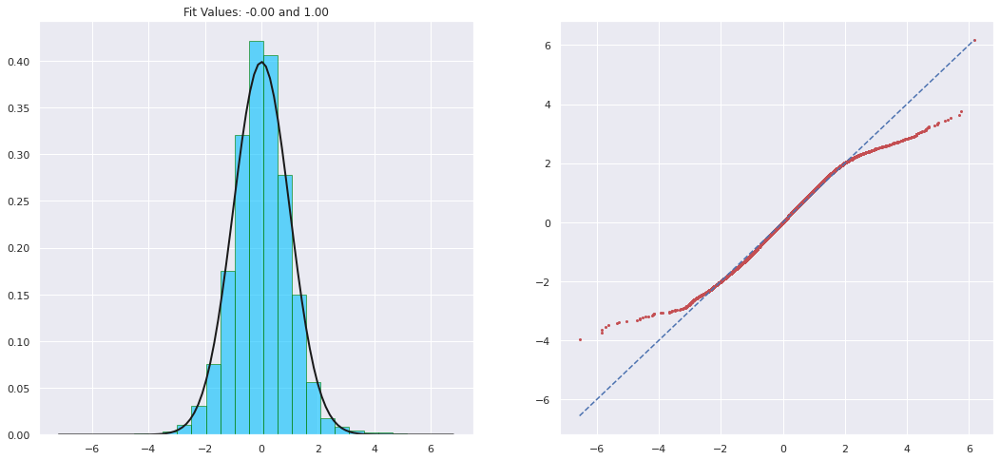

In [ ]:
stat.qq_plot(res)
print(stats.kstest(res,'norm'))
#not normal & thinner than normal 

In [ ]:
names = ['Lagrange multiplier statistic', 'p-value',
        'f-value', 'f p-value']
test = sms.het_breuschpagan(results.resid, results.model.exog)
lzip(names, test)

[('Lagrange multiplier statistic', 1327.480801572233),
 ('p-value', 1.1628977809196989e-264),
 ('f-value', 59.488431216101134),
 ('f p-value', 5.882122959708453e-276)]

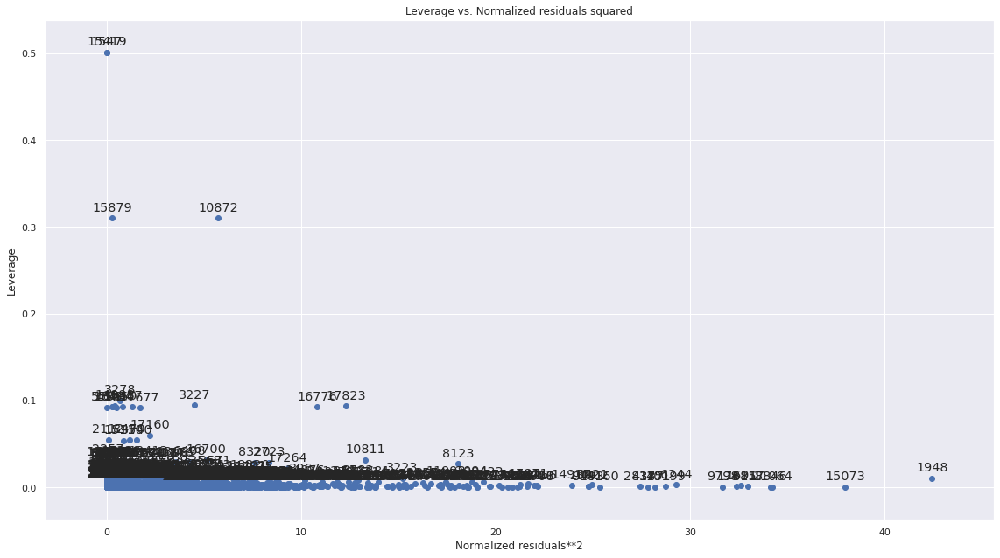

In [ ]:
fig = sm.graphics.plot_leverage_resid2(results)
fig.tight_layout(pad=1.0)

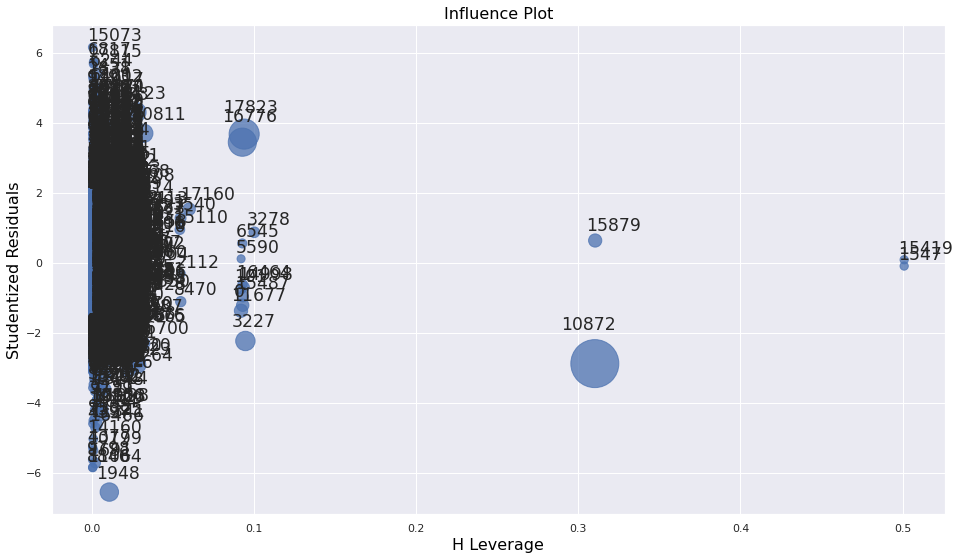

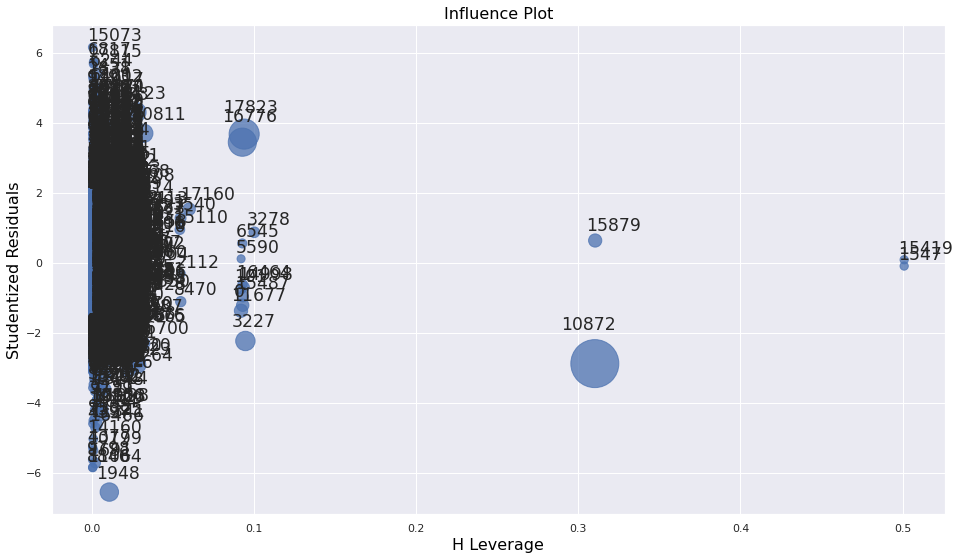

In [ ]:
sm.graphics.influence_plot(results)

In [ ]:
def residual_plot(model,dd=5):
    infl = model.get_influence()
    res = infl.resid_studentized_external
    ares = np.abs(res)
    pY = model.get_prediction().predicted_mean
    labels = list(range(len(ares)))
    lpf = [labels[x] for x in np.argsort(ares)]
    erf = [pY[x] for x in np.argsort(ares)]
    spf = [res[x] for x in np.argsort(ares)]
    plt.scatter(pY,res,color='darkblue')
    for c in range(1,dd+1):
        plt.annotate(lpf[-c], (erf[-c], spf[-c]))
    plt.axhline(y=0.0, color='red', linestyle='--')
    plt.xlabel('Predicted Values')
    plt.ylabel('Standardized residuals')
    plt.title('Standardized residuals versus Predicted values')

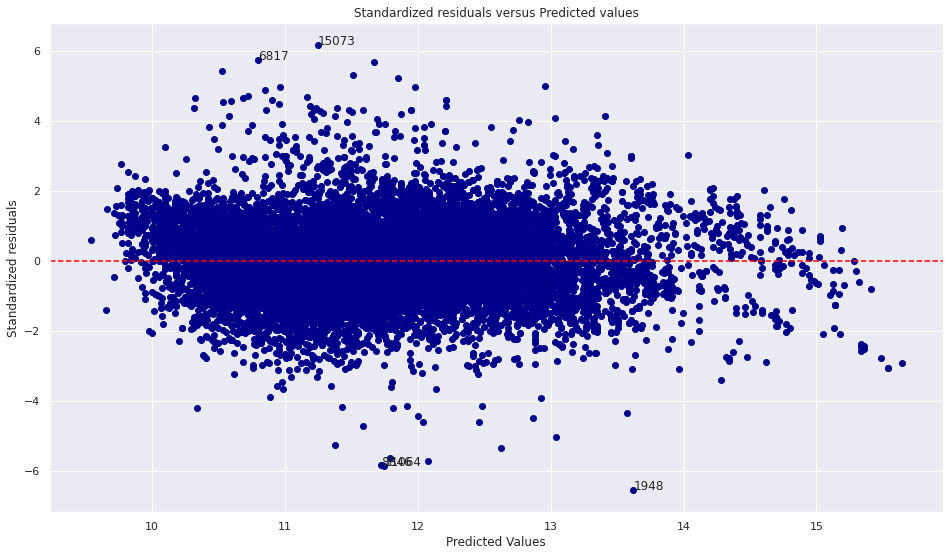

In [ ]:
residual_plot(results)

In [ ]:
sum(abs(res)>=3.5)

101

In [ ]:
#outlier = list(car_reg_3rd[abs(res)>=3.5].index)
outlier = [681, 740, 863, 1276, 1297, 1451, 1691, 1881, 1948,
 2094, 2155, 2208, 2838, 2886, 2908, 3089, 3174, 3210,
 3223, 3451, 3782, 3875, 4320, 4377, 4397, 4804, 4852,
 5647, 5776, 5885, 5980, 6073, 6244, 6371, 6421, 6739,
 6817, 7017, 7191, 8123, 8226, 8444, 8522, 8675, 8846,
 9014, 9108, 9249, 9493, 9528, 9739, 9750, 9798, 10132,
 10199, 10608, 10661, 10761, 10811, 10856, 10913, 11064,
 11341, 11551, 11791, 11998, 12148, 12674, 13002, 13035,
 13194, 13214, 13601, 13891, 14160, 14182, 14432, 14441,
 14917, 15073, 15323, 15325, 15654, 15787, 15800, 15816,
 15979, 16466, 16719, 16920, 17298, 17444, 17527, 17815,
 17823, 17863, 17871, 18129, 18200, 18433, 18501]
leverage = [1547,15419,15879,10872,17823,16776]
remove = list(set(outlier + leverage))

In [ ]:
car_reg_eval = car_reg_3rd.drop(remove)

In [ ]:
Y = car_reg_eval.lnPrice
x3 = car_reg_eval[col_3rd]
X3 = sm.add_constant(x3)
results_eval = sm.OLS(Y,X3).fit()
results_eval.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.819
Model:                            OLS   Adj. R-squared:                  0.819
Method:                 Least Squares   F-statistic:                     3629.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        07:31:31   Log-Likelihood:                -9780.5
No. Observations:               18470   AIC:                         1.961e+04
Df Residuals:                   18446   BIC:                         1.980e+04
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 12.8292      0.024    536.159      0.000      12.782      12.876
Preowner              -0.0506      0.003    -16.939      0.000      -0.057      -0.045
Age                   -0.1821      0.001   -163.479      0.000      -0.184      -0.180
AD_Import              0.0183      0.006      2.846      0.004       0.006       0.031
Lic_fee               -0.1205      0.007    -18.217      0.000      -0.134      -0.108
Transmission_AT       -0.5451      0.018    -30.173      0.000      -0.581      -0.510
aqua                   0.1181      0.137      0.860      0.390      -0.151       0.387
black                  0.0456      0.012      3.692      0.000       0.021       0.070
blue                4.692e-15   5.11e-17     91.728      0.000    4.59e-15    4.79e-15
navy                   0.0358      0.018      1.974      0.048       0.000       0.071
purple                -0.0850      0.048     -1.790      0.073      -0.178       0.008
red                    0.2210      0.041      5.363      0.000       0.140       0.302
yellow                 0.0428      0.069      0.618      0.537      -0.093       0.179
EV_bin                 0.1945      0.002     93.994      0.000       0.190       0.199
Mft_Class_1            1.1805      0.019     62.034      0.000       1.143       1.218
Mft_Class_2            0.4236      0.015     28.846      0.000       0.395       0.452
Seats_T               -0.0217      0.008     -2.866      0.004      -0.036      -0.007
TravelDist_bin_T      -0.1530      0.025     -6.021      0.000      -0.203      -0.103
Seats_Squared          0.0400      0.002     21.932      0.000       0.036       0.044
TravelDist_Squared     0.0275      0.007      4.208      0.000       0.015       0.040
Seats_Class1           0.0407      0.013      3.194      0.001       0.016       0.066
Seats_Class3          -0.0435      0.009     -5.010      0.000      -0.061      -0.027
Seats_Lic              0.0242      0.006      4.209      0.000       0.013       0.036
EV_Class1              0.0583      0.004     14.617      0.000       0.051       0.066
EV_Class2              0.0477      0.004     12.490      0.000       0.040       0.055
EV_Class3              0.0884      0.004     23.093      0.000       0.081       0.096
==============================================================================
Omnibus:                       91.203   Durbin-Watson:                   1.998
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              129.824
Skew:                           0.015   Prob(JB):                     6.44e-29
Kurtosis:                       3.410   Cond. No.                     1.09e+16
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is corr

In [ ]:
col_3rd.remove('yellow')

x3 = car_reg_eval[col_3rd]
X3 = sm.add_constant(x3)
results_eval = sm.OLS(Y,X3).fit()
results_eval.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.819
Model:                            OLS   Adj. R-squared:                  0.819
Method:                 Least Squares   F-statistic:                     3794.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        07:32:33   Log-Likelihood:                -9780.7
No. Observations:               18470   AIC:                         1.961e+04
Df Residuals:                   18447   BIC:                         1.979e+04
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 12.8297      0.024    536.529      0.000      12.783      12.877
Preowner              -0.0506      0.003    -16.937      0.000      -0.056      -0.045
Age                   -0.1821      0.001   -163.512      0.000      -0.184      -0.180
AD_Import              0.0183      0.006      2.840      0.005       0.006       0.031
Lic_fee               -0.1206      0.007    -18.222      0.000      -0.134      -0.108
Transmission_AT       -0.5454      0.018    -30.202      0.000      -0.581      -0.510
aqua                   0.1179      0.137      0.858      0.391      -0.151       0.387
black                  0.0456      0.012      3.691      0.000       0.021       0.070
blue                6.372e-15    1.2e-16     53.209      0.000    6.14e-15    6.61e-15
navy                   0.0357      0.018      1.968      0.049       0.000       0.071
purple                -0.0851      0.048     -1.791      0.073      -0.178       0.008
red                    0.2205      0.041      5.351      0.000       0.140       0.301
EV_bin                 0.1945      0.002     93.994      0.000       0.190       0.199
Mft_Class_1            1.1804      0.019     62.032      0.000       1.143       1.218
Mft_Class_2            0.4235      0.015     28.840      0.000       0.395       0.452
Seats_T               -0.0217      0.008     -2.867      0.004      -0.036      -0.007
TravelDist_bin_T      -0.1530      0.025     -6.021      0.000      -0.203      -0.103
Seats_Squared          0.0400      0.002     21.952      0.000       0.036       0.044
TravelDist_Squared     0.0275      0.007      4.208      0.000       0.015       0.040
Seats_Class1           0.0402      0.013      3.163      0.002       0.015       0.065
Seats_Class3          -0.0436      0.009     -5.017      0.000      -0.061      -0.027
Seats_Lic              0.0243      0.006      4.215      0.000       0.013       0.036
EV_Class1              0.0583      0.004     14.614      0.000       0.051       0.066
EV_Class2              0.0478      0.004     12.502      0.000       0.040       0.055
EV_Class3              0.0884      0.004     23.088      0.000       0.081       0.096
==============================================================================
Omnibus:                       90.914   Durbin-Watson:                   1.998
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              129.322
Skew:                           0.015   Prob(JB):                     8.28e-29
Kurtosis:                       3.409   Cond. No.                     1.09e+18
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.17e-30. This might indicate that ther

In [ ]:
col_3rd.remove('aqua')

x3 = car_reg_eval[col_3rd]
X3 = sm.add_constant(x3)
results_eval = sm.OLS(Y,X3).fit()
results_eval.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.819
Model:                            OLS   Adj. R-squared:                  0.819
Method:                 Least Squares   F-statistic:                     3974.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        07:32:54   Log-Likelihood:                -9781.1
No. Observations:               18470   AIC:                         1.961e+04
Df Residuals:                   18448   BIC:                         1.978e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 12.8301      0.024    536.633      0.000      12.783      12.877
Preowner              -0.0506      0.003    -16.927      0.000      -0.056      -0.045
Age                   -0.1821      0.001   -163.512      0.000      -0.184      -0.180
AD_Import              0.0182      0.006      2.833      0.005       0.006       0.031
Lic_fee               -0.1206      0.007    -18.223      0.000      -0.134      -0.108
Transmission_AT       -0.5455      0.018    -30.208      0.000      -0.581      -0.510
black                  0.0453      0.012      3.671      0.000       0.021       0.070
blue                2.737e-16    8.6e-18     31.814      0.000    2.57e-16    2.91e-16
navy                   0.0357      0.018      1.969      0.049       0.000       0.071
purple                -0.0852      0.048     -1.794      0.073      -0.178       0.008
red                    0.2203      0.041      5.346      0.000       0.140       0.301
EV_bin                 0.1945      0.002     93.996      0.000       0.190       0.199
Mft_Class_1            1.1803      0.019     62.030      0.000       1.143       1.218
Mft_Class_2            0.4234      0.015     28.839      0.000       0.395       0.452
Seats_T               -0.0217      0.008     -2.868      0.004      -0.037      -0.007
TravelDist_bin_T      -0.1520      0.025     -5.989      0.000      -0.202      -0.102
Seats_Squared          0.0400      0.002     21.954      0.000       0.036       0.044
TravelDist_Squared     0.0273      0.007      4.183      0.000       0.015       0.040
Seats_Class1           0.0402      0.013      3.156      0.002       0.015       0.065
Seats_Class3          -0.0436      0.009     -5.018      0.000      -0.061      -0.027
Seats_Lic              0.0243      0.006      4.212      0.000       0.013       0.036
EV_Class1              0.0583      0.004     14.611      0.000       0.050       0.066
EV_Class2              0.0478      0.004     12.507      0.000       0.040       0.055
EV_Class3              0.0884      0.004     23.086      0.000       0.081       0.096
==============================================================================
Omnibus:                       90.802   Durbin-Watson:                   1.998
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              129.154
Skew:                           0.015   Prob(JB):                     9.01e-29
Kurtosis:                       3.409   Cond. No.                     2.24e+17
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 2.76e-29. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

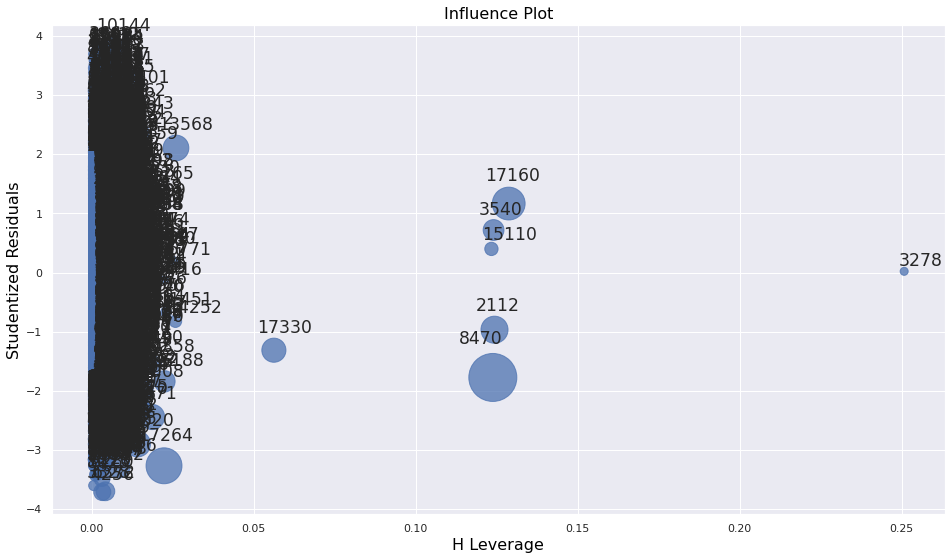

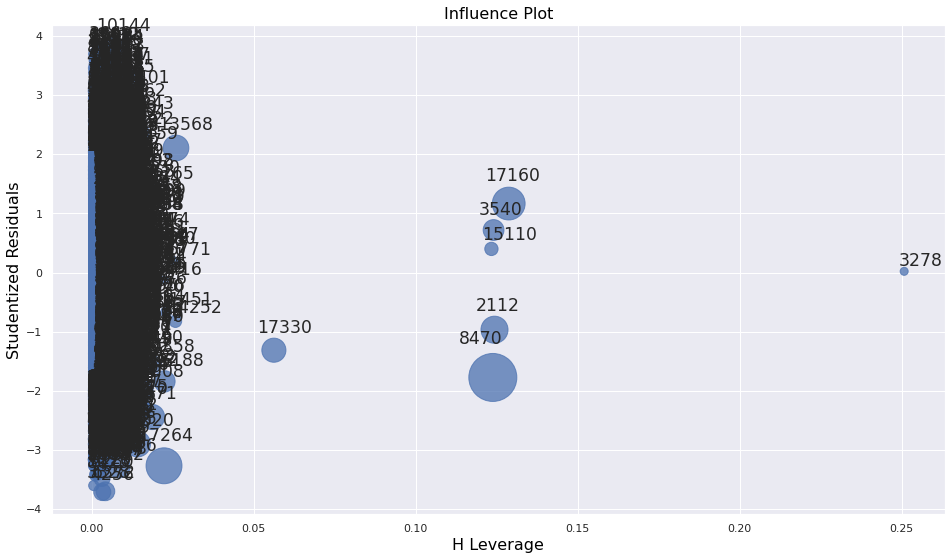

In [ ]:
sm.graphics.influence_plot(results_eval)

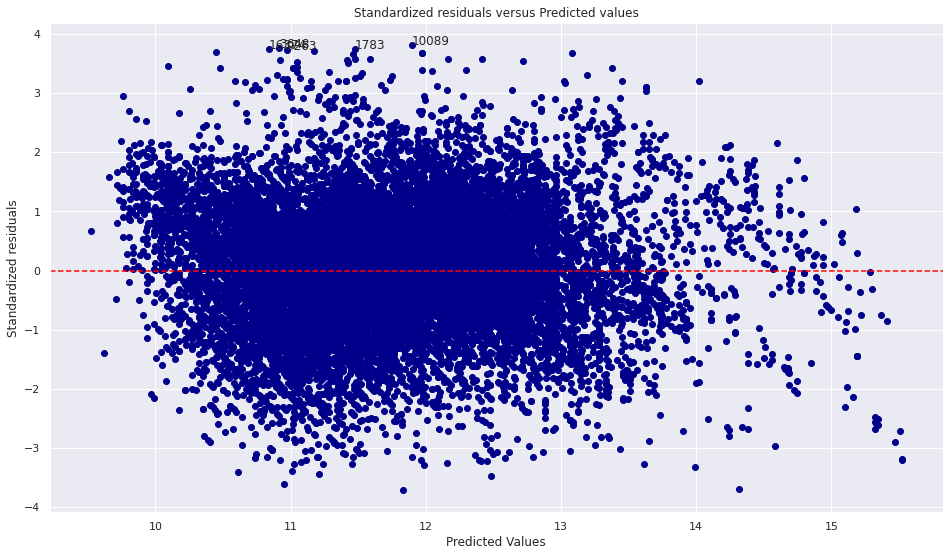

In [ ]:
residual_plot(results_eval)

In [ ]:
res_eval = results_eval.get_influence().resid_studentized_external

KstestResult(statistic=0.010568793904932372, pvalue=0.032288858913439106)


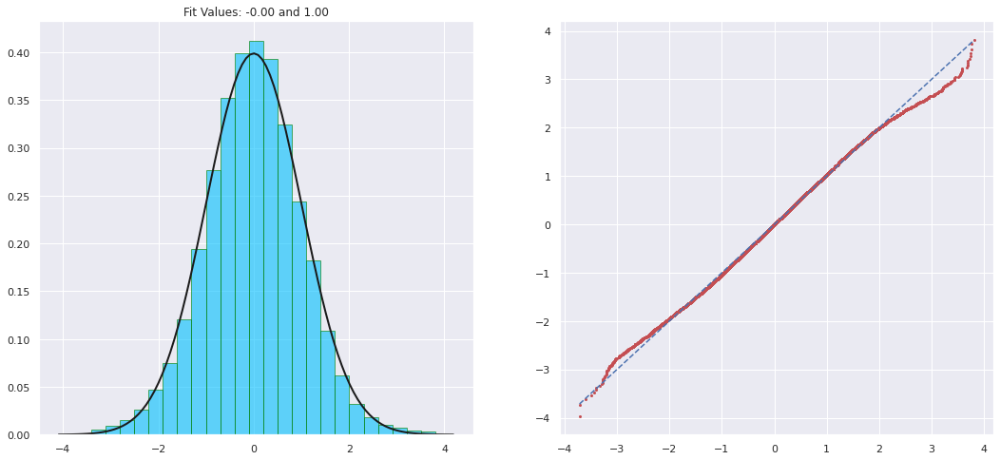

In [ ]:
stat.qq_plot(res_eval)
print(stats.kstest(res_eval,'norm'))
#not normal & thinner than normal 

In [ ]:
names = ['Lagrange multiplier statistic', 'p-value',
        'f-value', 'f p-value']
test = sms.het_breuschpagan(results_eval.resid, results_eval.model.exog)
lzip(names, test)

[('Lagrange multiplier statistic', 1712.4438443145623),
 ('p-value', 0.0),
 ('f-value', 89.77091473135069),
 ('f p-value', 0.0)]

The residuals are not normally distributed after droping those outliers. And we have to try another ways for regression.

# Different Approach to improve the current model

### Boxcox Transformation

In [ ]:
lamda = scipy.stats.boxcox(car_reg_3rd.Price)[1]
print(lamda)
car_reg_boxcox = car_reg_3rd.copy()
car_reg_boxcox['Price_BC'] = (car_reg_boxcox['Price']**lamda-1)/ lamda


-0.13011754636479422


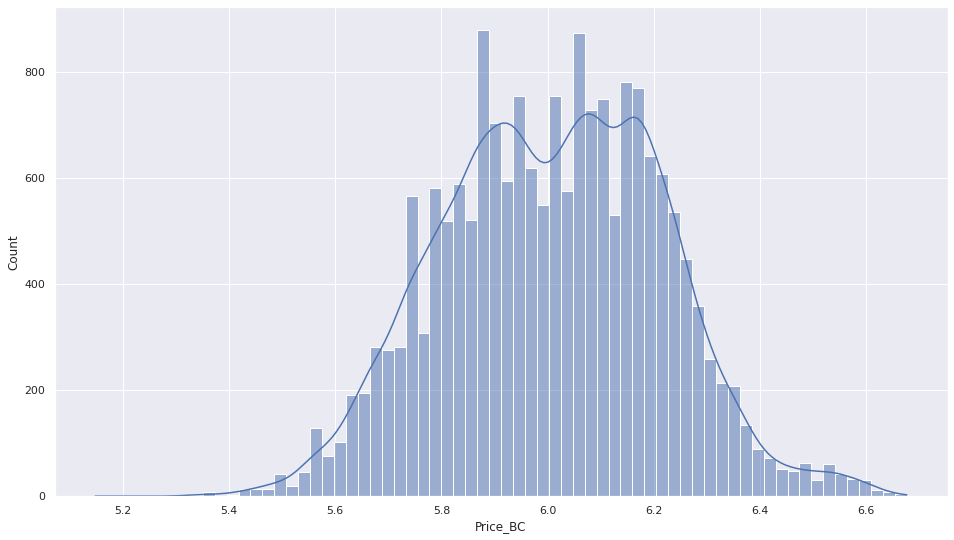

In [ ]:
sns.histplot(x = 'Price_BC', data=car_reg_boxcox,kde=True)

In [ ]:
formula = 'Price_BC ~ ' + ' + '.join(col_3rd)
model = smf.ols(formula, data = car_reg_boxcox)
reg = model.fit()
print(reg.summary())

                            OLS Regression Results                            
Dep. Variable:               Price_BC   R-squared:                       0.791
Model:                            OLS   Adj. R-squared:                  0.790
Method:                 Least Squares   F-statistic:                     3184.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:08:36   Log-Likelihood:                 17325.
No. Observations:               18576   AIC:                        -3.460e+04
Df Residuals:                   18553   BIC:                        -3.442e+04
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              6.2406      0

Box Cox transformation unlikely to improve the model, the distribution on Price is still not normal.

## Seperate model by Mft_Class

As the price gap car price is very large among different manufacturer class, and it might be one of the reason to our model is not work. We would like to seperate our model into 3 models by their manufacturer class.

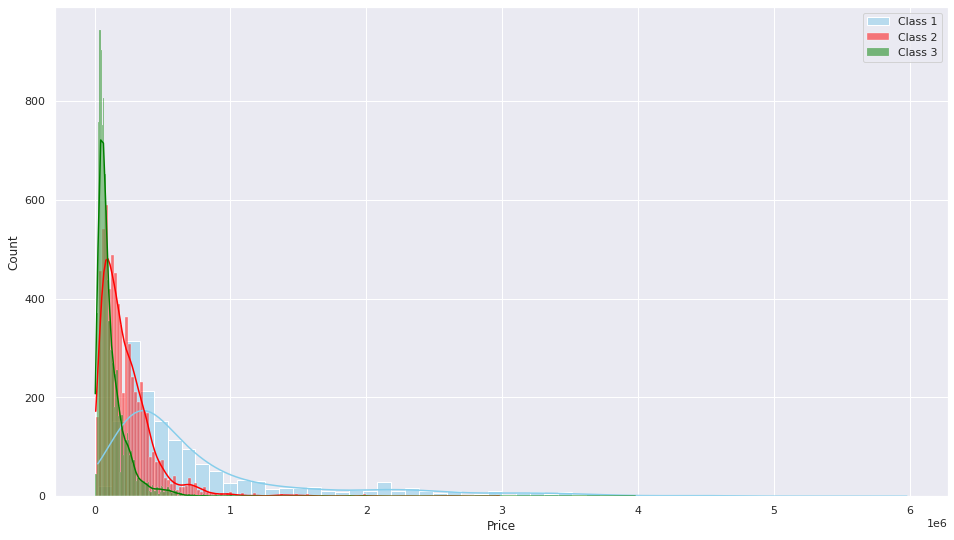

In [ ]:
sns.histplot(x = 'Price', data=car_df_4[car_df_4.Mft_Class==1],label="Class 1",color="skyblue",kde=True)
sns.histplot(x = 'Price', data=car_df_4[car_df_4.Mft_Class==2],label="Class 2",color="red",kde=True)
sns.histplot(x = 'Price', data=car_df_4[car_df_4.Mft_Class==3],label="Class 3",color="green",kde=True)

plt.legend() 
plt.show()

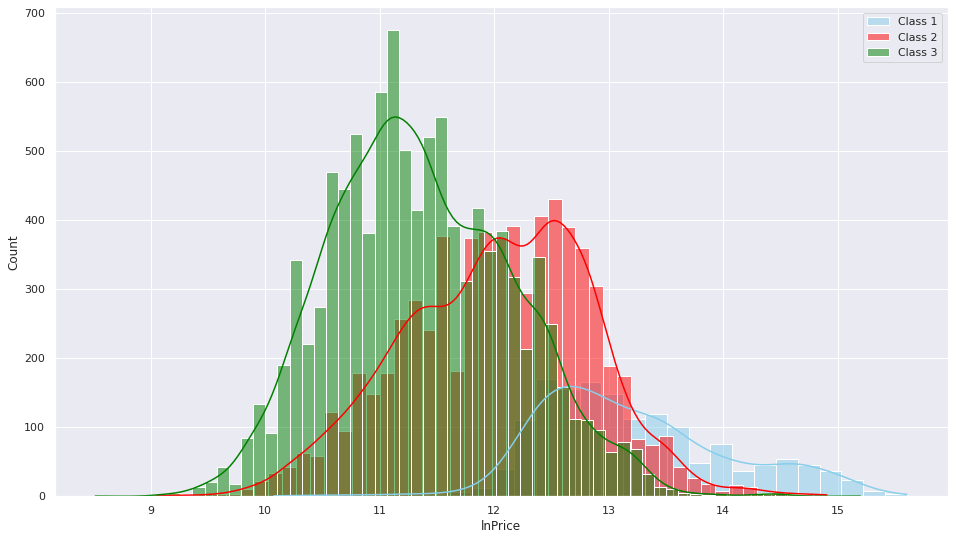

In [ ]:
sns.histplot(x = 'lnPrice', data=car_df_4[car_df_4.Mft_Class==1],label="Class 1",color="skyblue",kde=True)
sns.histplot(x = 'lnPrice', data=car_df_4[car_df_4.Mft_Class==2],label="Class 2",color="red",kde=True)
sns.histplot(x = 'lnPrice', data=car_df_4[car_df_4.Mft_Class==3],label="Class 3",color="green",kde=True)

plt.legend() 
plt.show()

We compared the pooled distibution and individual distribution of each manufacturer class. The price variation can be easily spotted.

In [ ]:
car_df_class1 = car_reg_1st[car_reg_1st.Mft_Class_1==1].drop(['Mft_Class_1','Mft_Class_2','Mft_Class_3'],axis=1)
car_df_class2 = car_reg_1st[car_reg_1st.Mft_Class_2==1].drop(['Mft_Class_1','Mft_Class_2','Mft_Class_3'],axis=1)
car_df_class3 = car_reg_1st[car_reg_1st.Mft_Class_3==1].drop(['Mft_Class_1','Mft_Class_2','Mft_Class_3'],axis=1)

In [ ]:
car_df_class1.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Price,1533.0,801843.711676,840688.728736,23800.000000,295000.000000,468000.000000,888000.000000,5.980000e+06
Seats,1533.0,4.232224,1.338652,1.000000,4.000000,5.000000,5.000000,7.000000e+00
Preowner,1533.0,0.938030,1.091479,0.000000,0.000000,1.000000,1.000000,7.000000e+00
Age,1533.0,6.129811,3.299573,0.000000,4.000000,6.000000,8.000000,1.400000e+01
AD_Import,1533.0,0.431181,0.495403,0.000000,0.000000,0.000000,1.000000,1.000000e+00
Lic_fee,1533.0,0.135682,0.342562,0.000000,0.000000,0.000000,0.000000,1.000000e+00
Transmission_AT,1533.0,0.967384,0.177687,0.000000,1.000000,1.000000,1.000000,1.000000e+00
aqua,1533.0,0.000652,0.025540,0.000000,0.000000,0.000000,0.000000,1.000000e+00
black,1533.0,0.842792,0.364116,0.000000,1.000000,1.000000,1.000000,1.000000e+00
blue,1533.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00


In [ ]:
car_df_class2.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Price,6770.0,232715.518759,220622.319890,8500.000000,93000.000000,178000.000000,300000.000000,2.980000e+06
Seats,6770.0,4.987888,0.695999,2.000000,5.000000,5.000000,5.000000,8.000000e+00
Preowner,6770.0,0.882570,1.126747,0.000000,0.000000,1.000000,1.000000,9.000000e+00
Age,6770.0,6.740473,3.144499,0.000000,4.000000,7.000000,9.000000,1.400000e+01
AD_Import,6770.0,0.492024,0.499973,0.000000,0.000000,0.000000,1.000000,1.000000e+00
Lic_fee,6770.0,0.374446,0.484015,0.000000,0.000000,0.000000,1.000000,1.000000e+00
Transmission_AT,6770.0,0.977991,0.146723,0.000000,1.000000,1.000000,1.000000,1.000000e+00
aqua,6770.0,0.000591,0.024302,0.000000,0.000000,0.000000,0.000000,1.000000e+00
black,6770.0,0.905908,0.291978,0.000000,1.000000,1.000000,1.000000,1.000000e+00
blue,6770.0,0.000148,0.012154,0.000000,0.000000,0.000000,0.000000,1.000000e+00


In [ ]:
car_df_class3.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Price,10273.0,121982.865765,132840.032185,5000.000000,48000.000000,80000.000000,153000.000000,3.980000e+06
Seats,10273.0,5.588825,1.190123,2.000000,5.000000,5.000000,7.000000,8.000000e+00
Preowner,10273.0,0.997566,1.249569,0.000000,0.000000,1.000000,2.000000,1.400000e+01
Age,10273.0,7.765307,3.381090,0.000000,5.000000,8.000000,10.000000,1.400000e+01
AD_Import,10273.0,0.355495,0.478686,0.000000,0.000000,0.000000,1.000000,1.000000e+00
Lic_fee,10273.0,0.544826,0.498011,0.000000,0.000000,1.000000,1.000000,1.000000e+00
Transmission_AT,10273.0,0.963594,0.187308,0.000000,1.000000,1.000000,1.000000,1.000000e+00
aqua,10273.0,0.000584,0.024161,0.000000,0.000000,0.000000,0.000000,1.000000e+00
black,10273.0,0.889224,0.313870,0.000000,1.000000,1.000000,1.000000,1.000000e+00
blue,10273.0,0.000097,0.009866,0.000000,0.000000,0.000000,0.000000,1.000000e+00


###Scatter plot - Class 1

Age - NO interaction

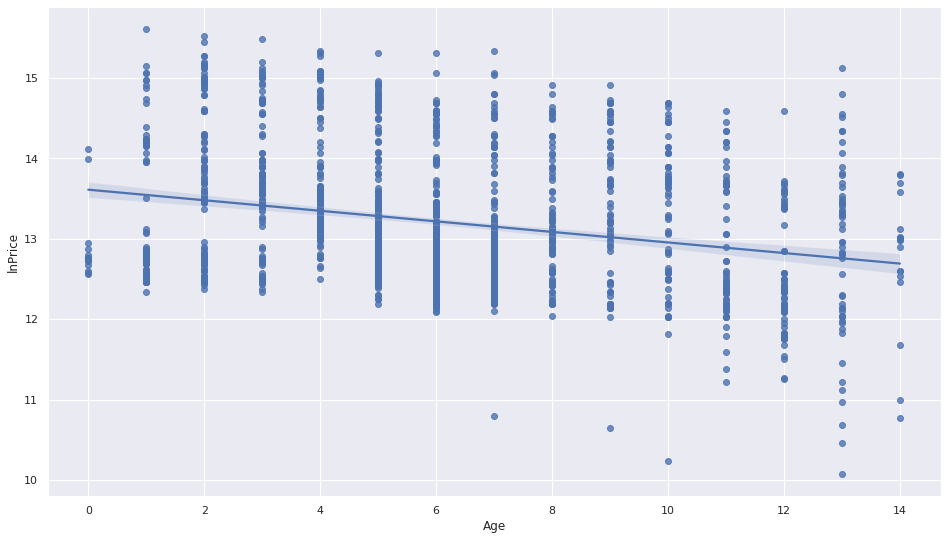

In [ ]:
sns.regplot(x='Age', y = 'lnPrice', data = car_df_class1,order=1)

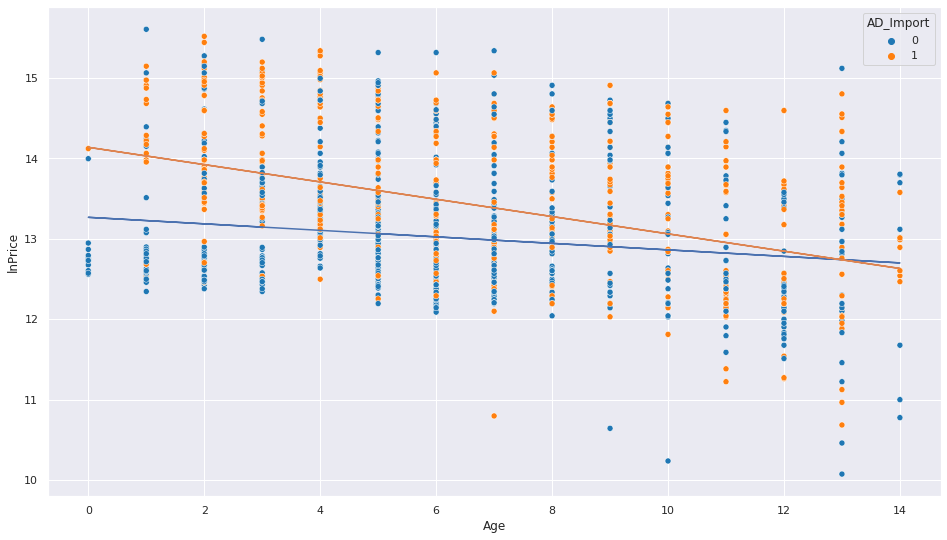

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class1[car_df_class1['AD_Import']==i]['Age'], car_df_class1[car_df_class1['AD_Import']==i]['lnPrice'], 1)
  plt.plot(car_df_class1[car_df_class1['AD_Import']==i]['Age'],b+m*car_df_class1[car_df_class1['AD_Import']==i]['Age'])

sns.scatterplot(x='Age', y = 'lnPrice',hue='AD_Import', data = car_df_class1, palette = 'tab10')

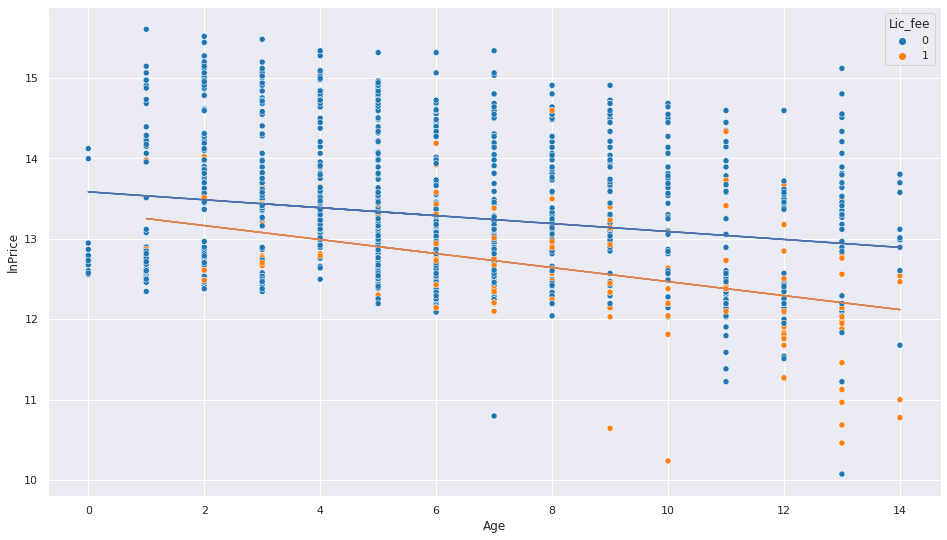

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class1[car_df_class1['Lic_fee']==i]['Age'], car_df_class1[car_df_class1['Lic_fee']==i]['lnPrice'], 1)
  plt.plot(car_df_class1[car_df_class1['Lic_fee']==i]['Age'],b+m*car_df_class1[car_df_class1['Lic_fee']==i]['Age'])

sns.scatterplot(x='Age', y = 'lnPrice',hue='Lic_fee', data = car_df_class1, palette = 'tab10')


EV_bin

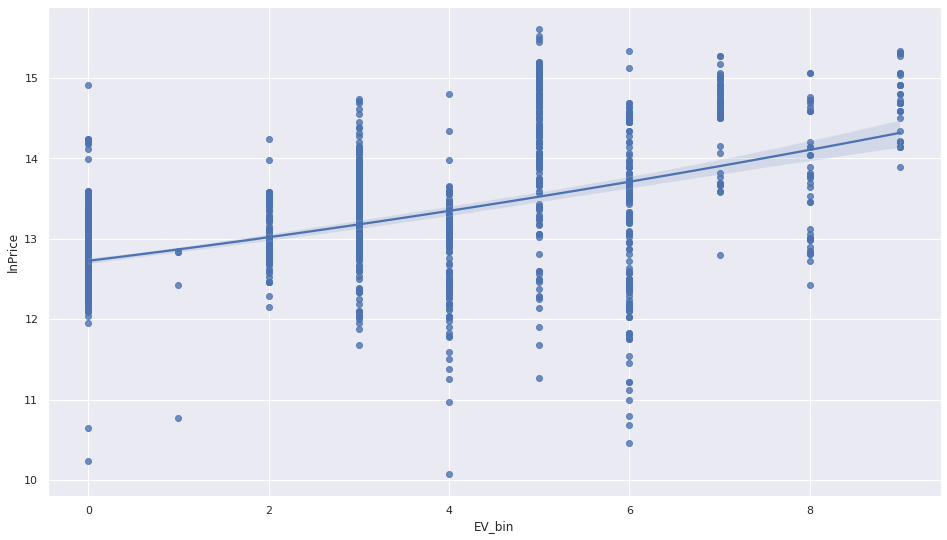

In [ ]:
sns.regplot(x='EV_bin', y = 'lnPrice', data = car_df_class1,order=2)

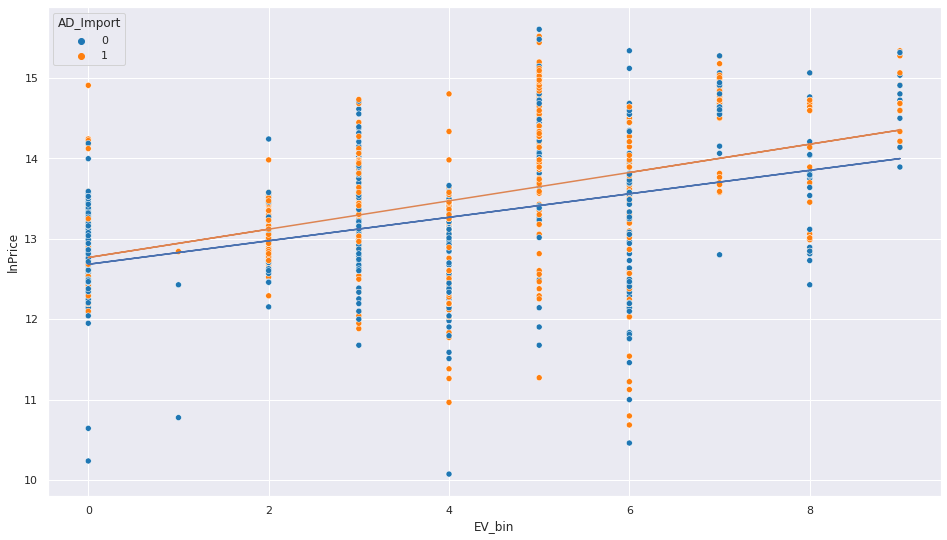

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class1[car_df_class1['AD_Import']==i]['EV_bin'], car_df_class1[car_df_class1['AD_Import']==i]['lnPrice'], 1)
  plt.plot(car_df_class1[car_df_class1['AD_Import']==i]['EV_bin'],b+m*car_df_class1[car_df_class1['AD_Import']==i]['EV_bin'])

sns.scatterplot(x='EV_bin', y = 'lnPrice',hue='AD_Import', data = car_df_class1, palette = 'tab10')

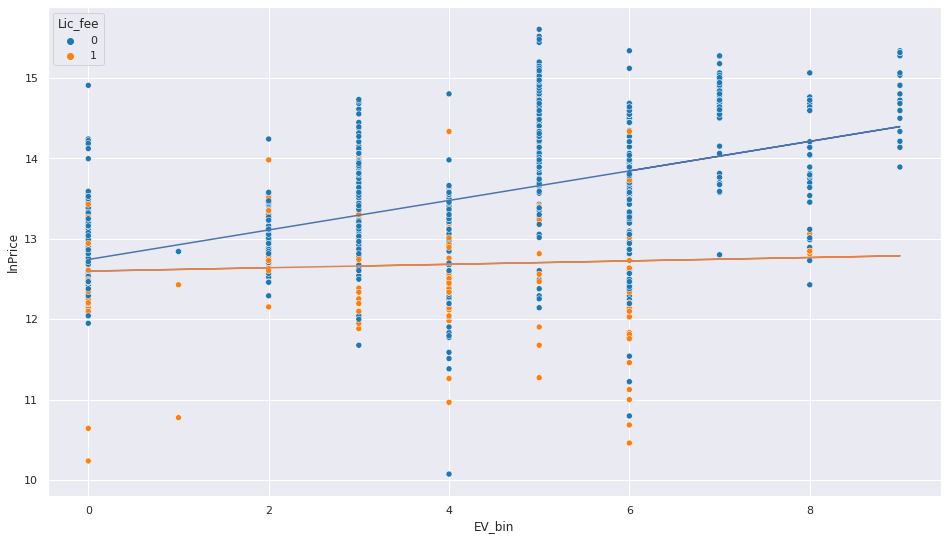

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class1[car_df_class1['Lic_fee']==i]['EV_bin'], car_df_class1[car_df_class1['Lic_fee']==i]['lnPrice'], 1)
  plt.plot(car_df_class1[car_df_class1['Lic_fee']==i]['EV_bin'],b+m*car_df_class1[car_df_class1['Lic_fee']==i]['EV_bin'])

sns.scatterplot(x='EV_bin', y = 'lnPrice',hue='Lic_fee', data = car_df_class1, palette = 'tab10')

Preowner

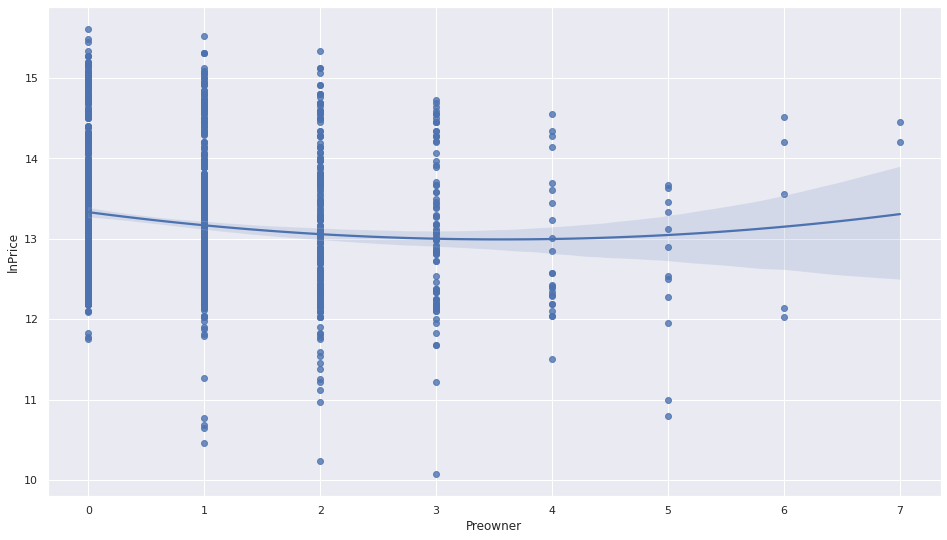

In [ ]:
sns.regplot(x='Preowner', y = 'lnPrice', data = car_df_class1,order=2)

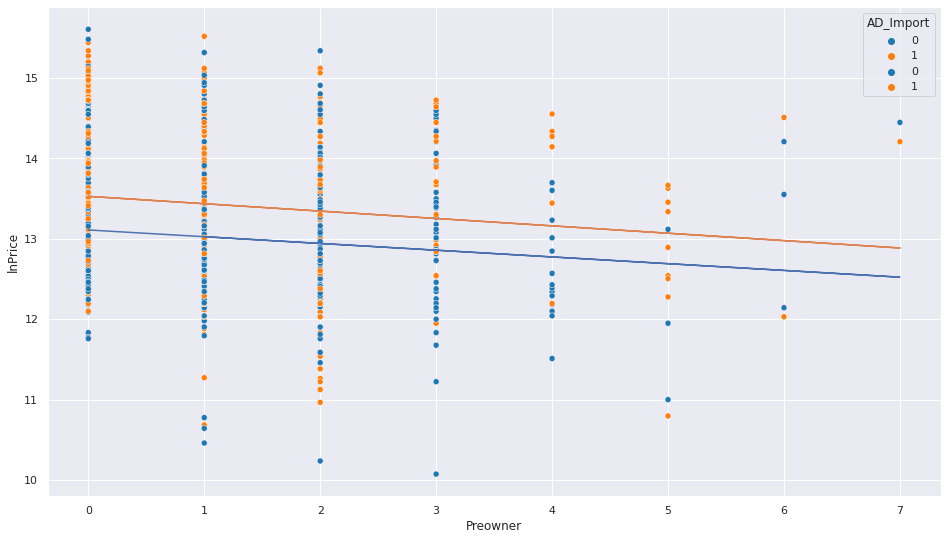

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class1[car_df_class1['AD_Import']==i]['Preowner'], car_df_class1[car_df_class1['AD_Import']==i]['lnPrice'], 1)
  plt.plot(car_df_class1[car_df_class1['AD_Import']==i]['Preowner'],b+m*car_df_class1[car_df_class1['AD_Import']==i]['Preowner'])

  sns.scatterplot(x='Preowner', y = 'lnPrice',hue='AD_Import', data = car_df_class1, palette = 'tab10')

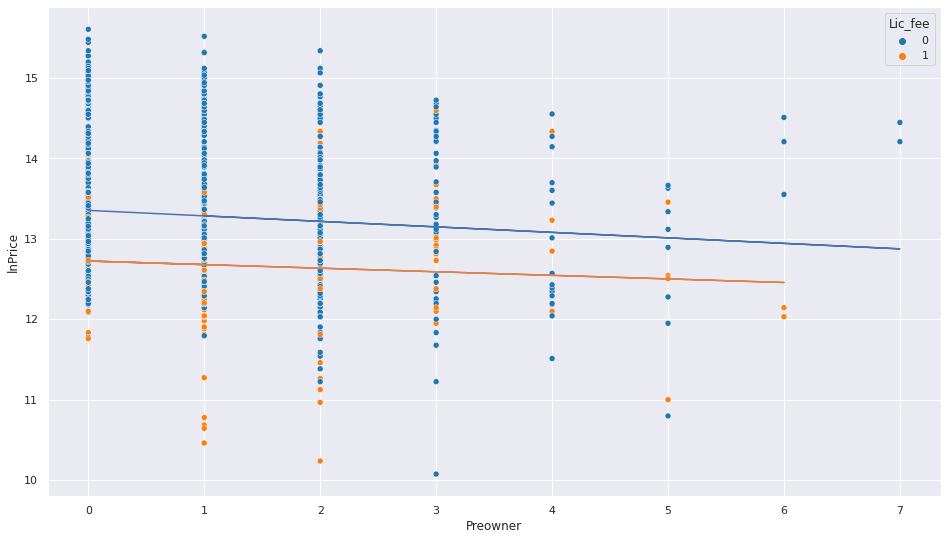

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class1[car_df_class1['Lic_fee']==i]['Preowner'], car_df_class1[car_df_class1['Lic_fee']==i]['lnPrice'], 1)
  plt.plot(car_df_class1[car_df_class1['Lic_fee']==i]['Preowner'],b+m*car_df_class1[car_df_class1['Lic_fee']==i]['Preowner'])

sns.scatterplot(x='Preowner', y = 'lnPrice',hue='Lic_fee', data = car_df_class1, palette = 'tab10')


Seats

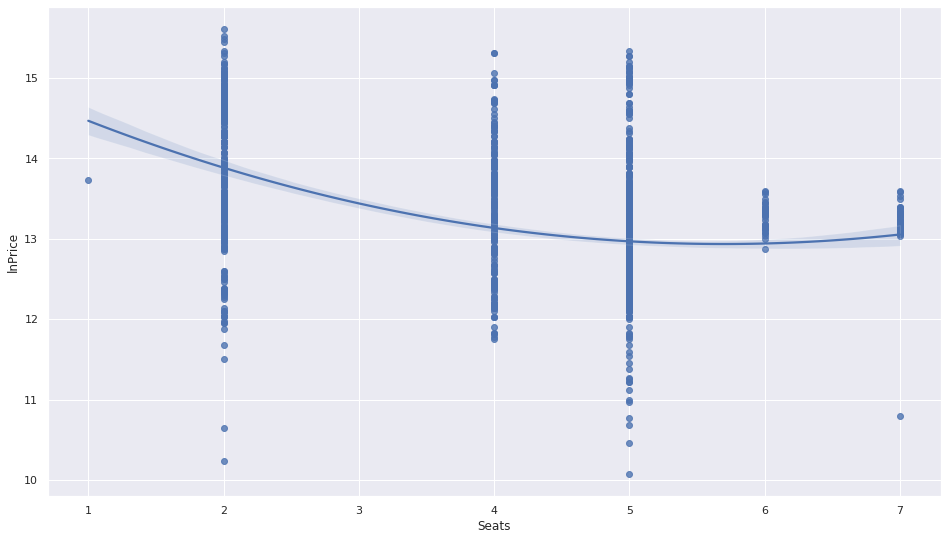

In [ ]:
sns.regplot(x='Seats', y = 'lnPrice', data = car_df_class1,order=2)

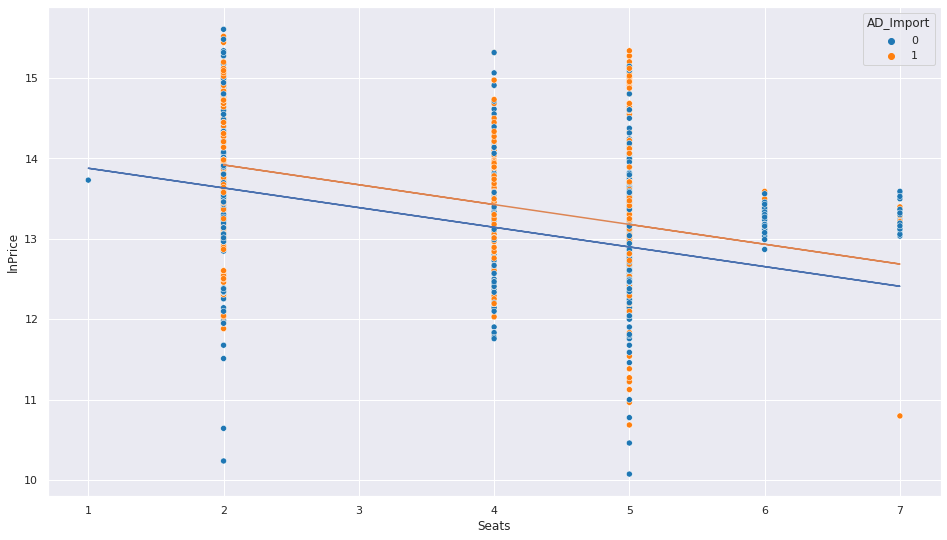

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class1[car_df_class1['AD_Import']==i]['Seats'], car_df_class1[car_df_class1['AD_Import']==i]['lnPrice'], 1)
  plt.plot(car_df_class1[car_df_class1['AD_Import']==i]['Seats'],b+m*car_df_class1[car_df_class1['AD_Import']==i]['Seats'])

sns.scatterplot(x='Seats', y = 'lnPrice',hue='AD_Import', data = car_df_class1, palette = 'tab10')

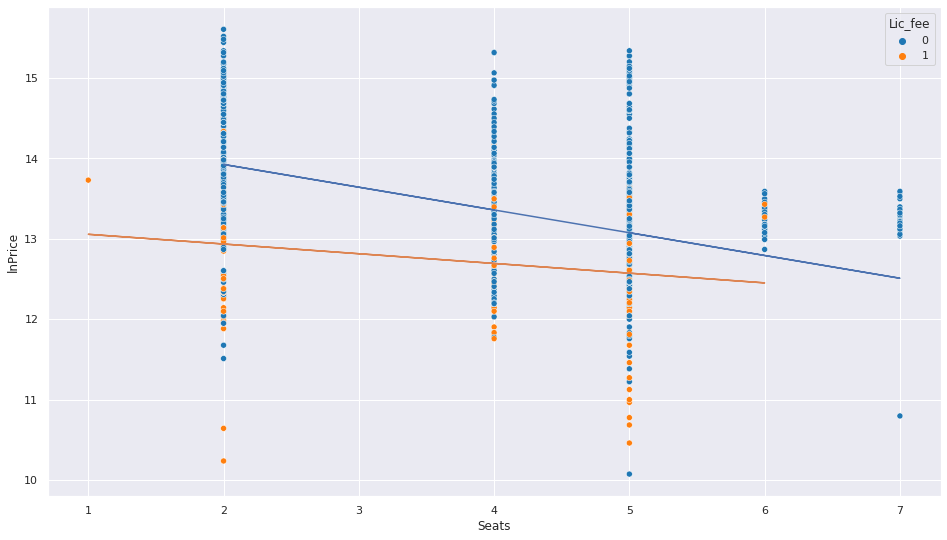

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class1[car_df_class1['Lic_fee']==i]['Seats'], car_df_class1[car_df_class1['Lic_fee']==i]['lnPrice'], 1)
  plt.plot(car_df_class1[car_df_class1['Lic_fee']==i]['Seats'],b+m*car_df_class1[car_df_class1['Lic_fee']==i]['Seats'])

sns.scatterplot(x='Seats', y = 'lnPrice',hue='Lic_fee', data = car_df_class1, palette = 'tab10')

TravelDist_bin

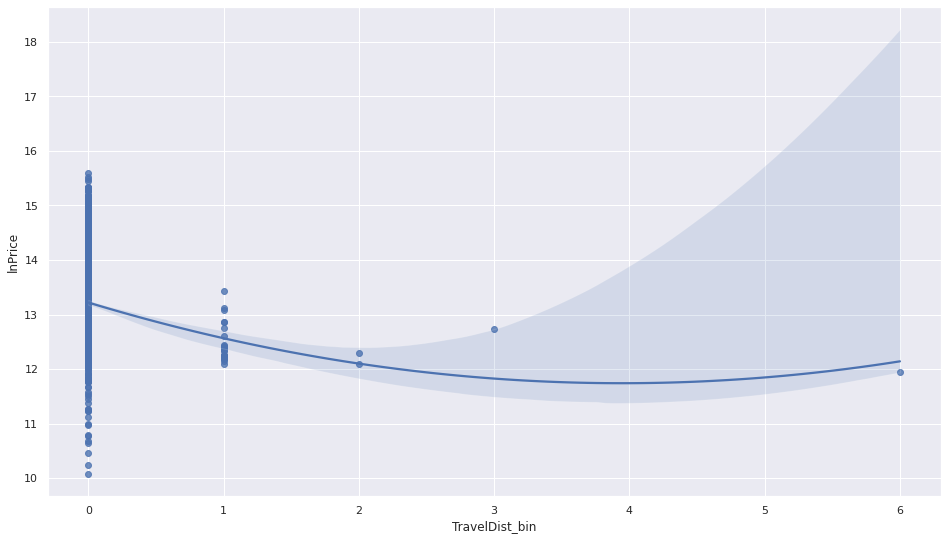

In [ ]:
sns.regplot(x='TravelDist_bin', y = 'lnPrice', data = car_df_class1,order=2)

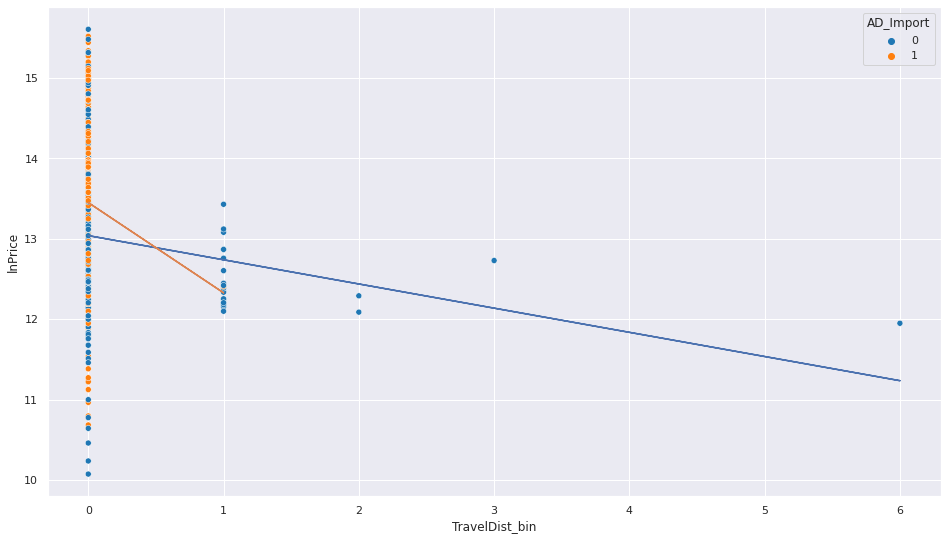

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class1[car_df_class1['AD_Import']==i]['TravelDist_bin'], car_df_class1[car_df_class1['AD_Import']==i]['lnPrice'], 1)
  plt.plot(car_df_class1[car_df_class1['AD_Import']==i]['TravelDist_bin'],b+m*car_df_class1[car_df_class1['AD_Import']==i]['TravelDist_bin'])

sns.scatterplot(x='TravelDist_bin', y = 'lnPrice',hue='AD_Import', data = car_df_class1, palette = 'tab10')

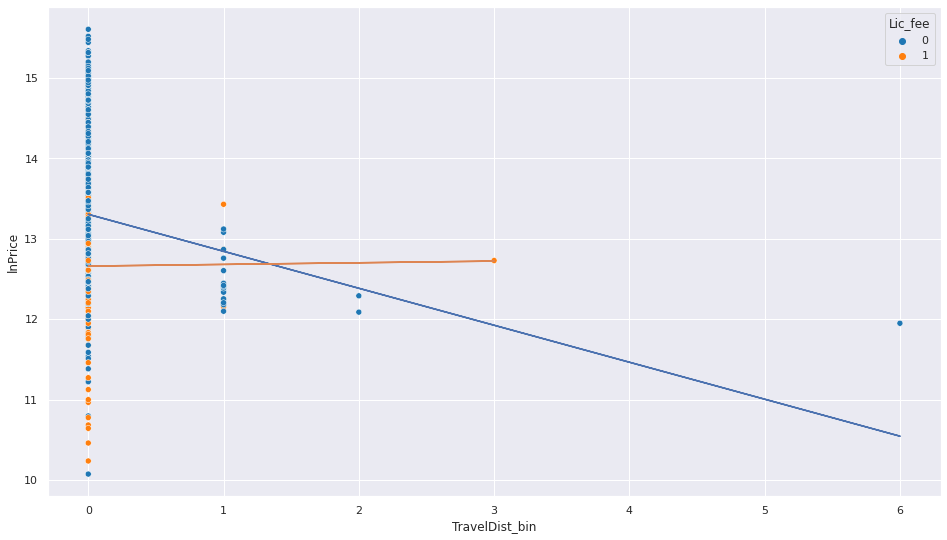

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class1[car_df_class1['Lic_fee']==i]['TravelDist_bin'], car_df_class1[car_df_class1['Lic_fee']==i]['lnPrice'], 1)
  plt.plot(car_df_class1[car_df_class1['Lic_fee']==i]['TravelDist_bin'],b+m*car_df_class1[car_df_class1['Lic_fee']==i]['TravelDist_bin'])

sns.scatterplot(x='TravelDist_bin', y = 'lnPrice',hue='Lic_fee', data = car_df_class1, palette = 'tab10')


###Scatter plot - Class 2

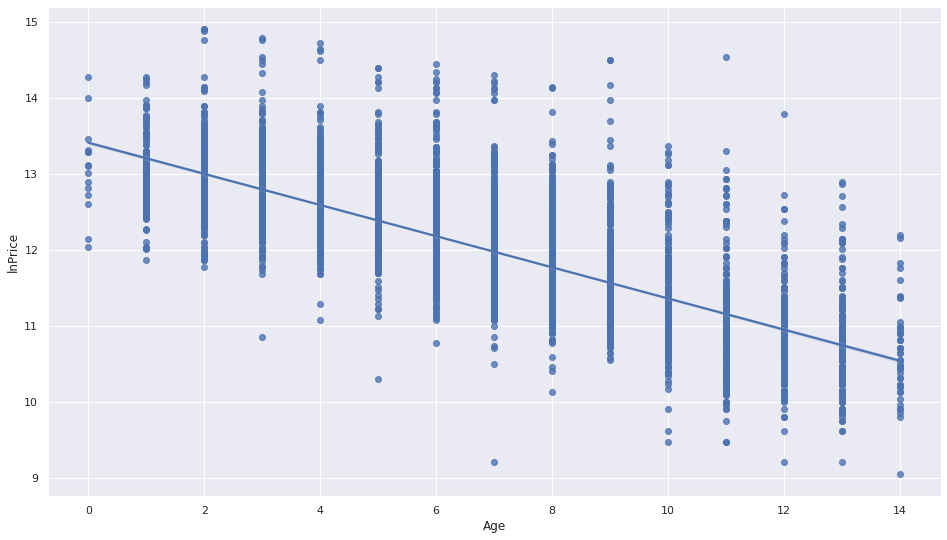

In [ ]:
sns.regplot(x='Age', y = 'lnPrice', data = car_df_class2,order=1)

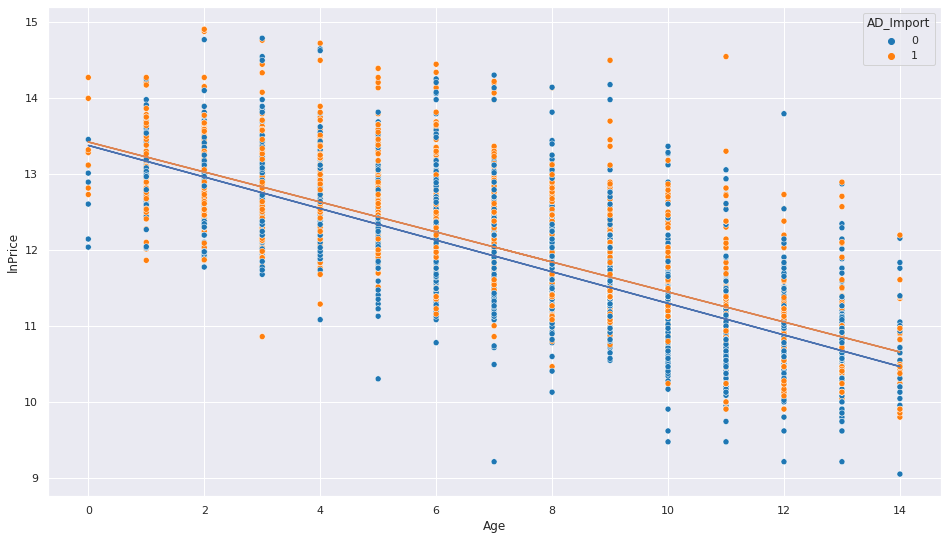

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class2[car_df_class2['AD_Import']==i]['Age'], car_df_class2[car_df_class2['AD_Import']==i]['lnPrice'], 1)
  plt.plot(car_df_class2[car_df_class2['AD_Import']==i]['Age'],b+m*car_df_class2[car_df_class2['AD_Import']==i]['Age'])

sns.scatterplot(x='Age', y = 'lnPrice',hue='AD_Import', data = car_df_class2, palette = 'tab10')


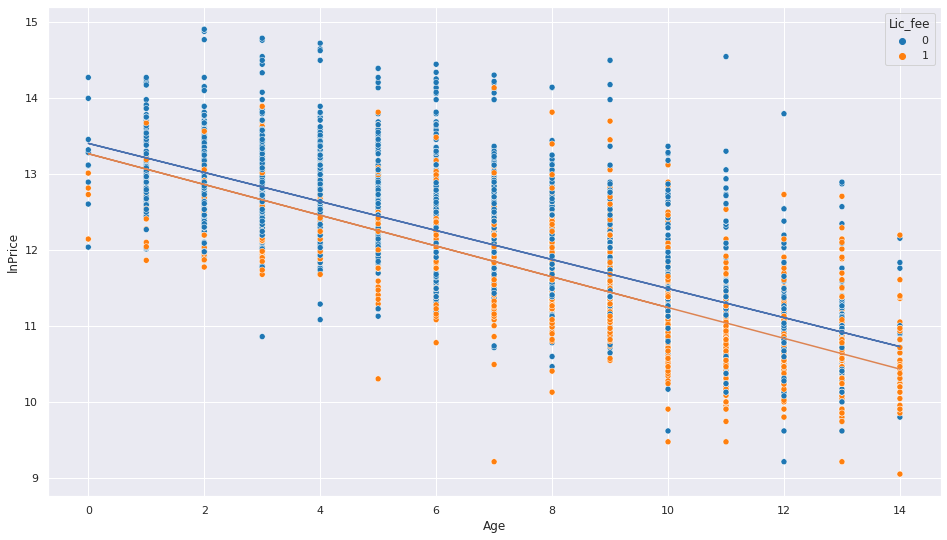

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class2[car_df_class2['Lic_fee']==i]['Age'], car_df_class2[car_df_class2['Lic_fee']==i]['lnPrice'], 1)
  plt.plot(car_df_class2[car_df_class2['Lic_fee']==i]['Age'],b+m*car_df_class2[car_df_class2['Lic_fee']==i]['Age'])

sns.scatterplot(x='Age', y = 'lnPrice',hue='Lic_fee', data = car_df_class2, palette = 'tab10')


EV_bin

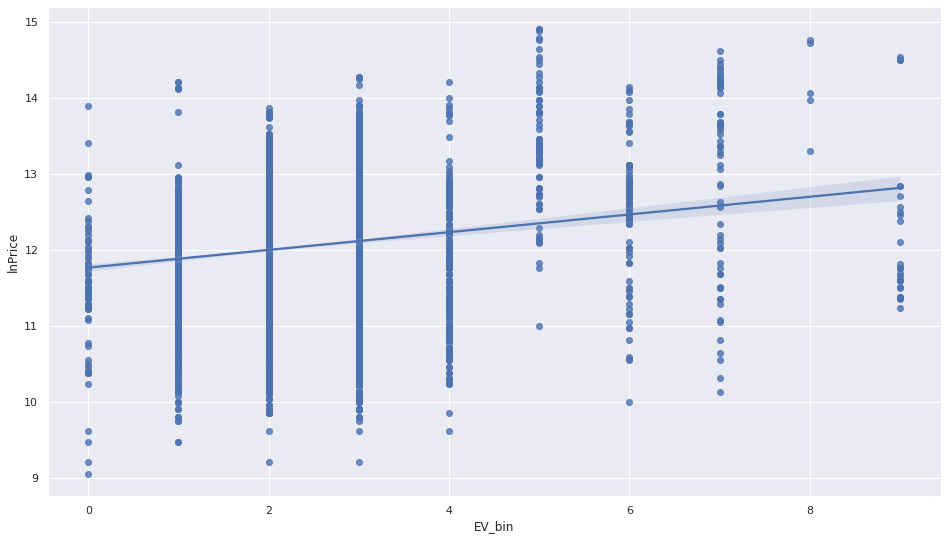

In [ ]:
sns.regplot(x='EV_bin', y = 'lnPrice', data = car_df_class2,order=1)

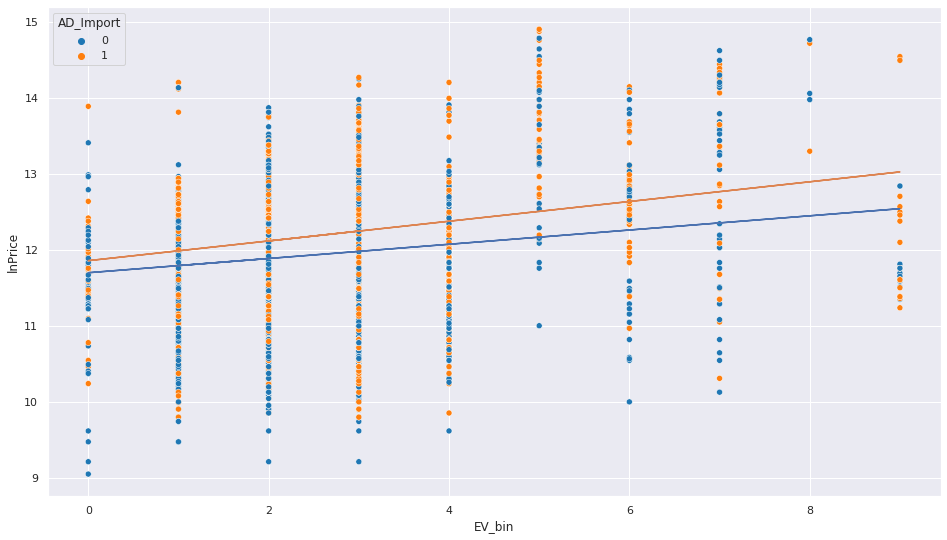

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class2[car_df_class2['AD_Import']==i]['EV_bin'], car_df_class2[car_df_class2['AD_Import']==i]['lnPrice'], 1)
  plt.plot(car_df_class2[car_df_class2['AD_Import']==i]['EV_bin'],b+m*car_df_class2[car_df_class2['AD_Import']==i]['EV_bin'])

sns.scatterplot(x='EV_bin', y = 'lnPrice',hue='AD_Import', data = car_df_class2, palette = 'tab10')


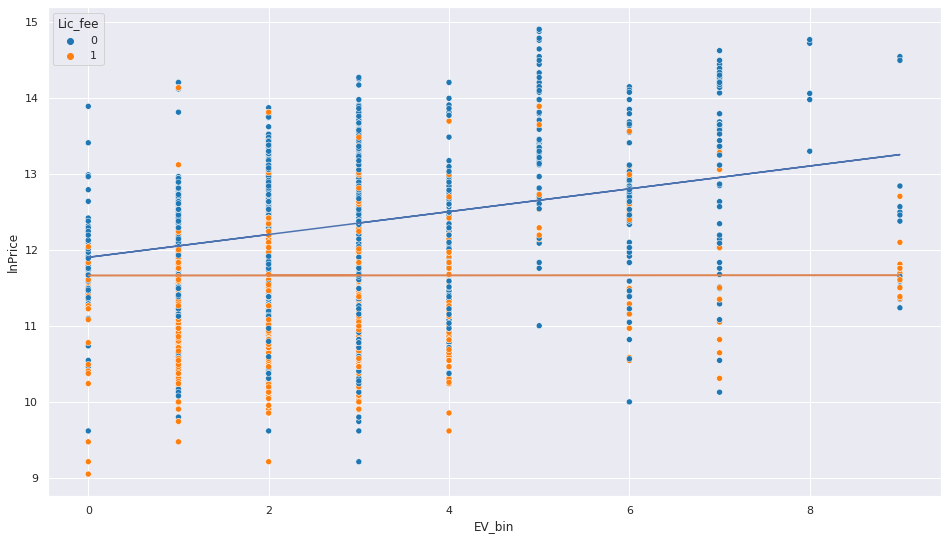

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class2[car_df_class2['Lic_fee']==i]['EV_bin'], car_df_class2[car_df_class2['Lic_fee']==i]['lnPrice'], 1)
  plt.plot(car_df_class2[car_df_class2['Lic_fee']==i]['EV_bin'],b+m*car_df_class2[car_df_class2['Lic_fee']==i]['EV_bin'])

sns.scatterplot(x='EV_bin', y = 'lnPrice',hue='Lic_fee', data = car_df_class2, palette = 'tab10')

Preowner

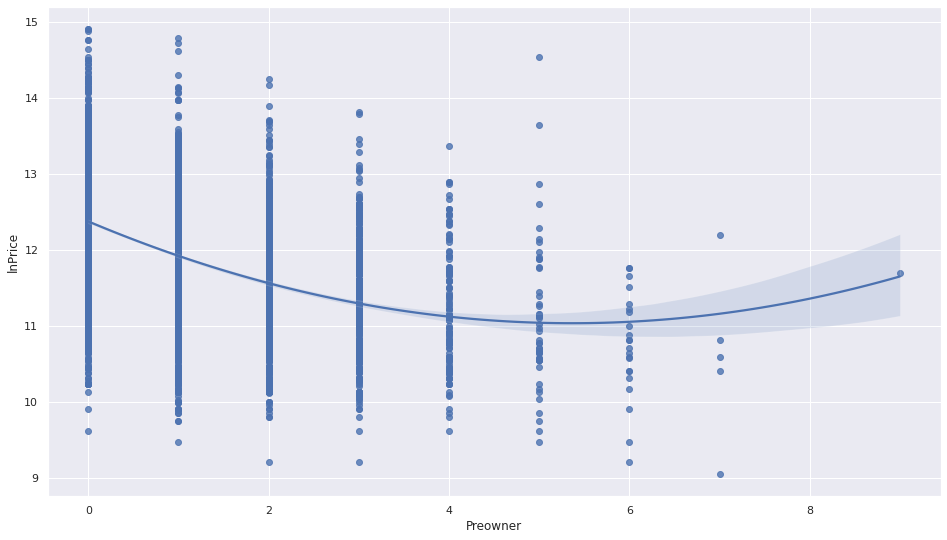

In [ ]:
sns.regplot(x='Preowner', y = 'lnPrice', data = car_df_class2,order=2)

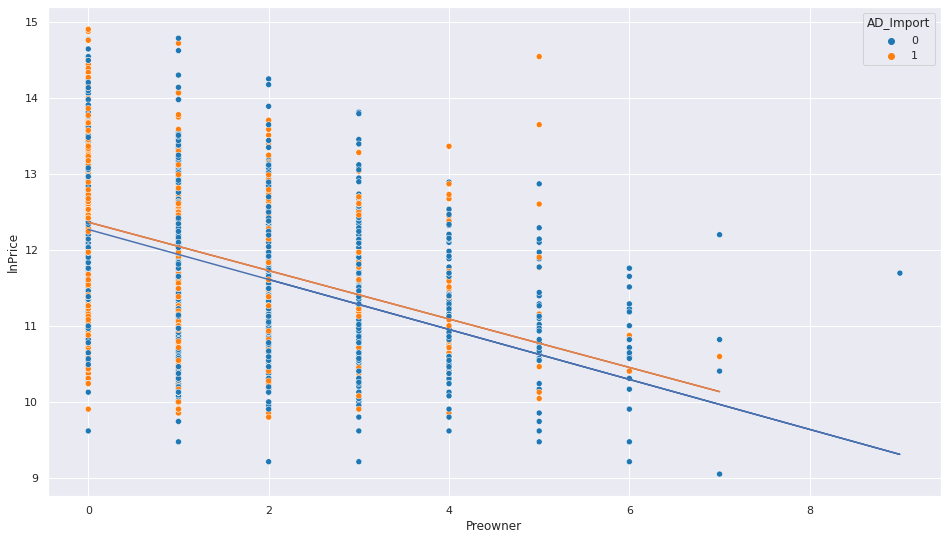

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class2[car_df_class2['AD_Import']==i]['Preowner'], car_df_class2[car_df_class2['AD_Import']==i]['lnPrice'], 1)
  plt.plot(car_df_class2[car_df_class2['AD_Import']==i]['Preowner'],b+m*car_df_class2[car_df_class2['AD_Import']==i]['Preowner'])

sns.scatterplot(x='Preowner', y = 'lnPrice',hue='AD_Import', data = car_df_class2, palette = 'tab10')


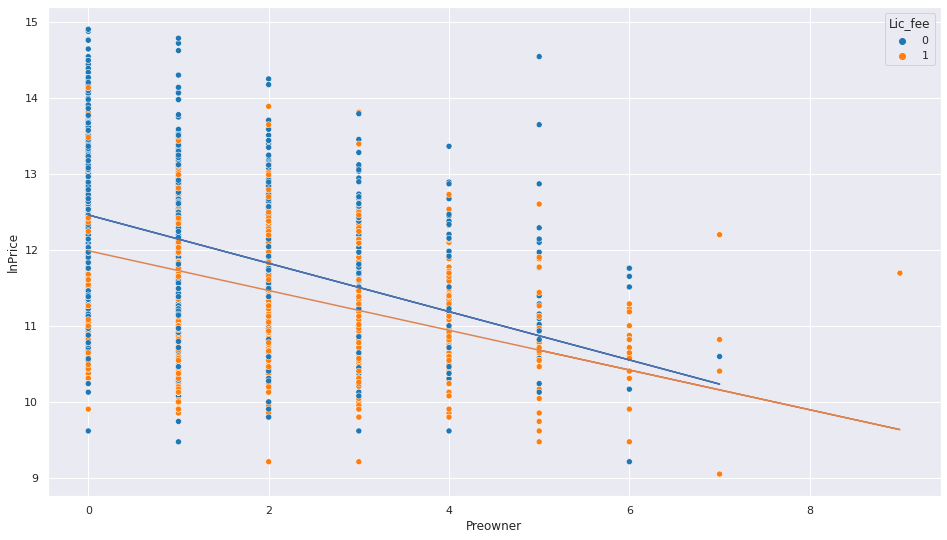

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class2[car_df_class2['Lic_fee']==i]['Preowner'], car_df_class2[car_df_class2['Lic_fee']==i]['lnPrice'], 1)
  plt.plot(car_df_class2[car_df_class2['Lic_fee']==i]['Preowner'],b+m*car_df_class2[car_df_class2['Lic_fee']==i]['Preowner'])

sns.scatterplot(x='Preowner', y = 'lnPrice',hue='Lic_fee', data = car_df_class2, palette = 'tab10')


Seats

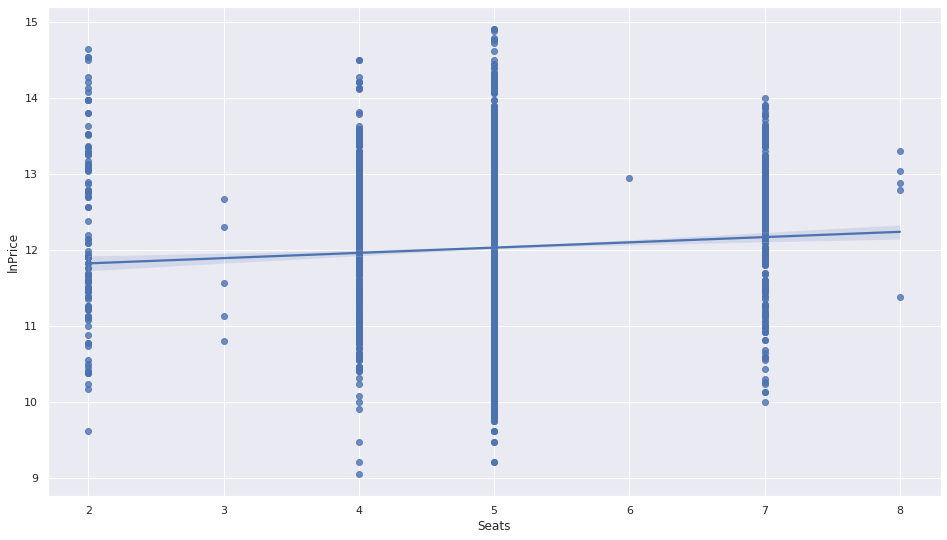

In [ ]:
sns.regplot(x='Seats', y = 'lnPrice', data = car_df_class2,order=1)

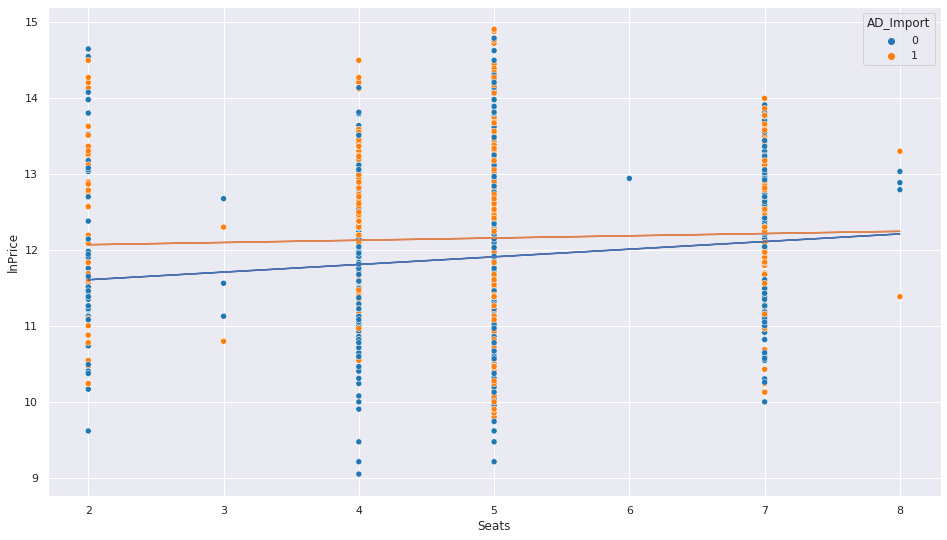

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class2[car_df_class2['AD_Import']==i]['Seats'], car_df_class2[car_df_class2['AD_Import']==i]['lnPrice'], 1)
  plt.plot(car_df_class2[car_df_class2['AD_Import']==i]['Seats'],b+m*car_df_class2[car_df_class2['AD_Import']==i]['Seats'])

sns.scatterplot(x='Seats', y = 'lnPrice',hue='AD_Import', data = car_df_class2, palette = 'tab10')


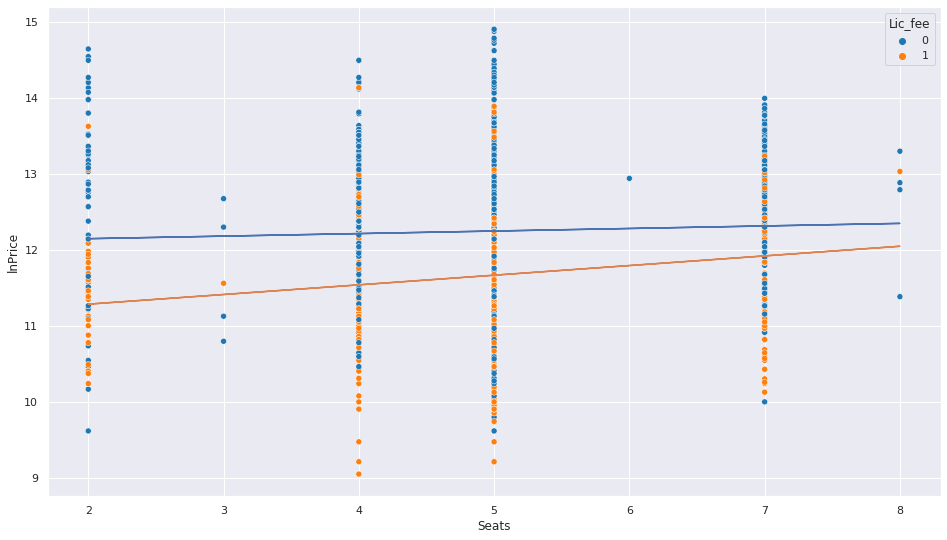

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class2[car_df_class2['Lic_fee']==i]['Seats'], car_df_class2[car_df_class2['Lic_fee']==i]['lnPrice'], 1)
  plt.plot(car_df_class2[car_df_class2['Lic_fee']==i]['Seats'],b+m*car_df_class2[car_df_class2['Lic_fee']==i]['Seats'])

sns.scatterplot(x='Seats', y = 'lnPrice',hue='Lic_fee', data = car_df_class2, palette = 'tab10')


TravelDist_bin

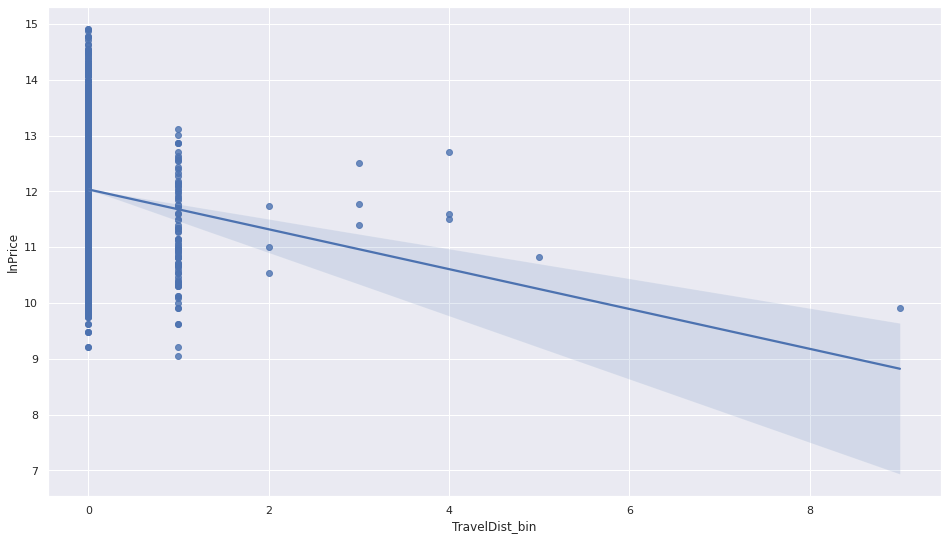

In [ ]:
sns.regplot(x='TravelDist_bin', y = 'lnPrice', data = car_df_class2,order=1)

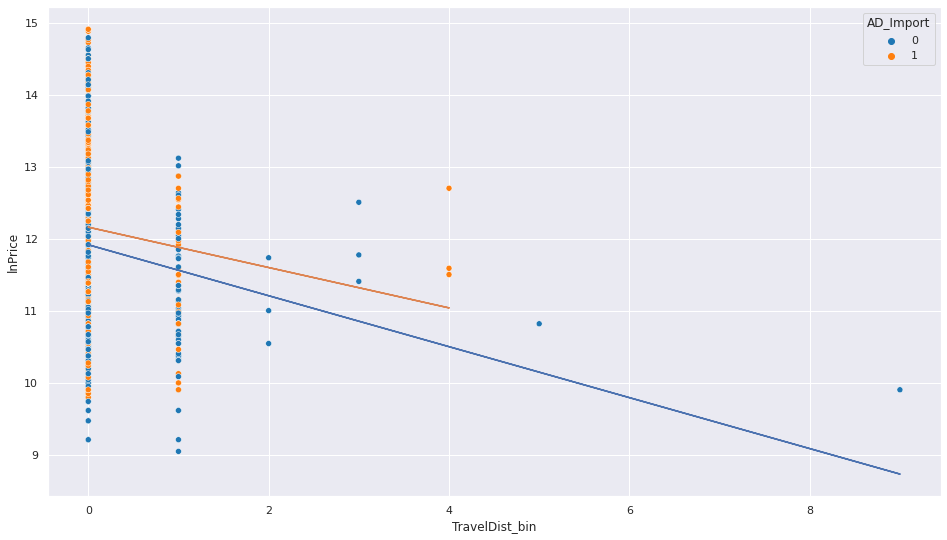

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class2[car_df_class2['AD_Import']==i]['TravelDist_bin'], car_df_class2[car_df_class2['AD_Import']==i]['lnPrice'], 1)
  plt.plot(car_df_class2[car_df_class2['AD_Import']==i]['TravelDist_bin'],b+m*car_df_class2[car_df_class2['AD_Import']==i]['TravelDist_bin'])

sns.scatterplot(x='TravelDist_bin', y = 'lnPrice',hue='AD_Import', data = car_df_class2, palette = 'tab10')


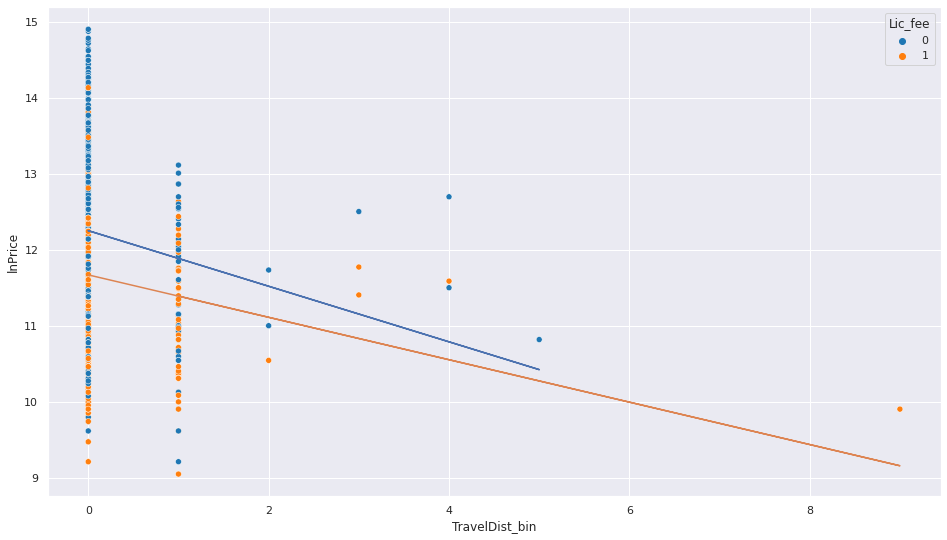

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class2[car_df_class2['Lic_fee']==i]['TravelDist_bin'], car_df_class2[car_df_class2['Lic_fee']==i]['lnPrice'], 1)
  plt.plot(car_df_class2[car_df_class2['Lic_fee']==i]['TravelDist_bin'],b+m*car_df_class2[car_df_class2['Lic_fee']==i]['TravelDist_bin'])

sns.scatterplot(x='TravelDist_bin', y = 'lnPrice',hue='Lic_fee', data = car_df_class2, palette = 'tab10')


###Scatter plot - Class 3

Age

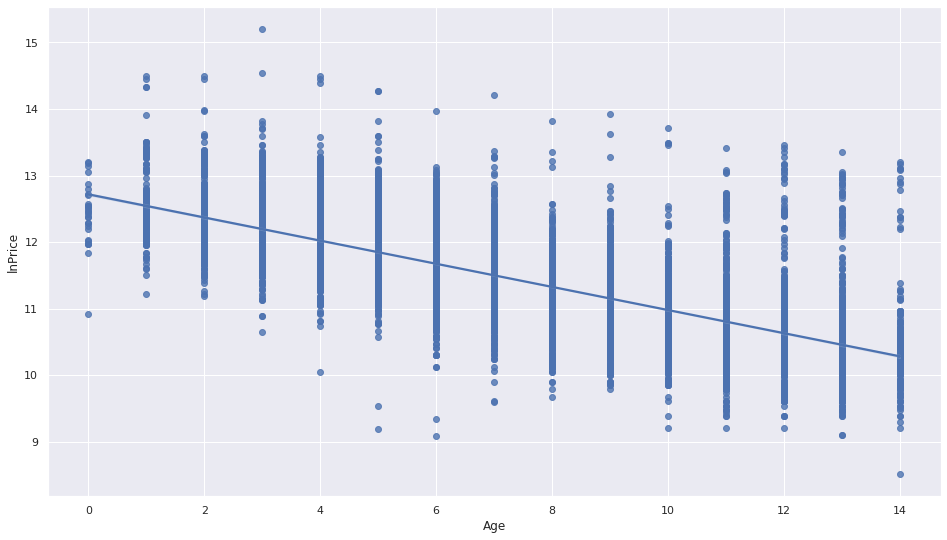

In [ ]:
sns.regplot(x='Age', y = 'lnPrice', data = car_df_class3,order=1)

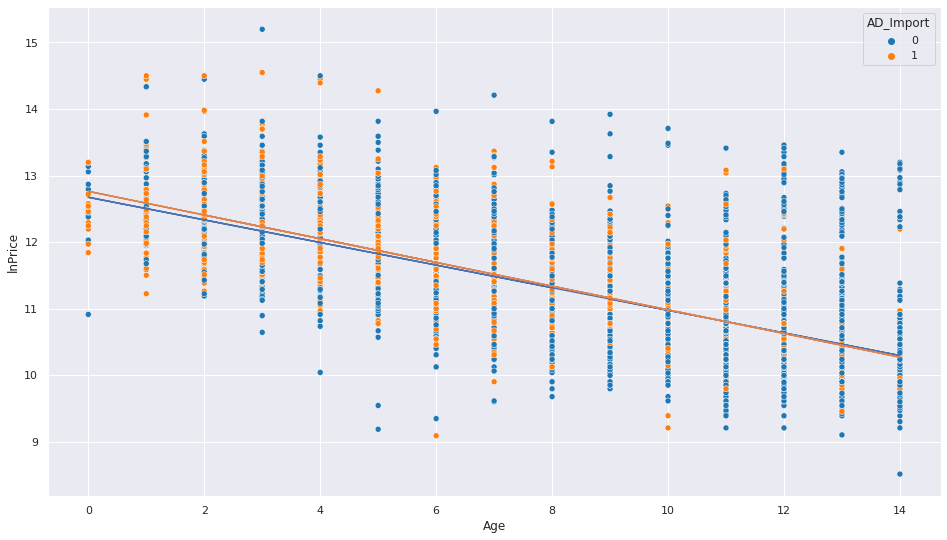

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class3[car_df_class3['AD_Import']==i]['Age'], car_df_class3[car_df_class3['AD_Import']==i]['lnPrice'], 1)
  plt.plot(car_df_class3[car_df_class3['AD_Import']==i]['Age'],b+m*car_df_class3[car_df_class3['AD_Import']==i]['Age'])

sns.scatterplot(x='Age', y = 'lnPrice',hue='AD_Import', data = car_df_class3, palette = 'tab10')


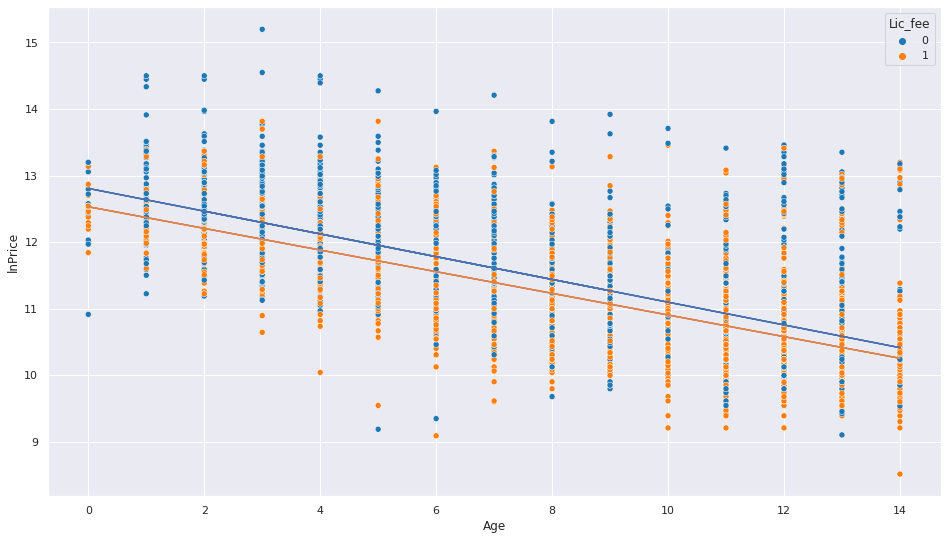

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class3[car_df_class3['Lic_fee']==i]['Age'], car_df_class3[car_df_class3['Lic_fee']==i]['lnPrice'], 1)
  plt.plot(car_df_class3[car_df_class3['Lic_fee']==i]['Age'],b+m*car_df_class3[car_df_class3['Lic_fee']==i]['Age'])

sns.scatterplot(x='Age', y = 'lnPrice',hue='Lic_fee', data = car_df_class3, palette = 'tab10')


EV_bin

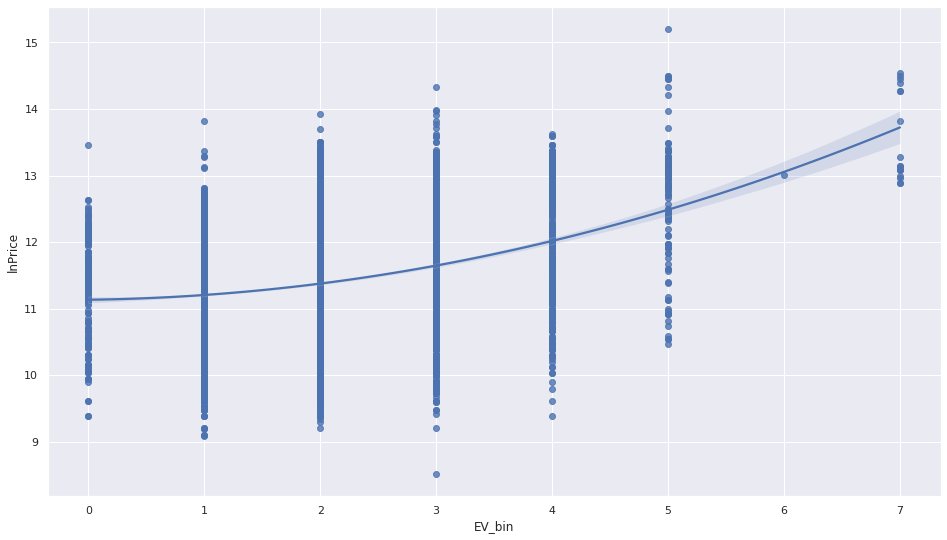

In [ ]:
sns.regplot(x='EV_bin', y = 'lnPrice', data = car_df_class3,order=2)

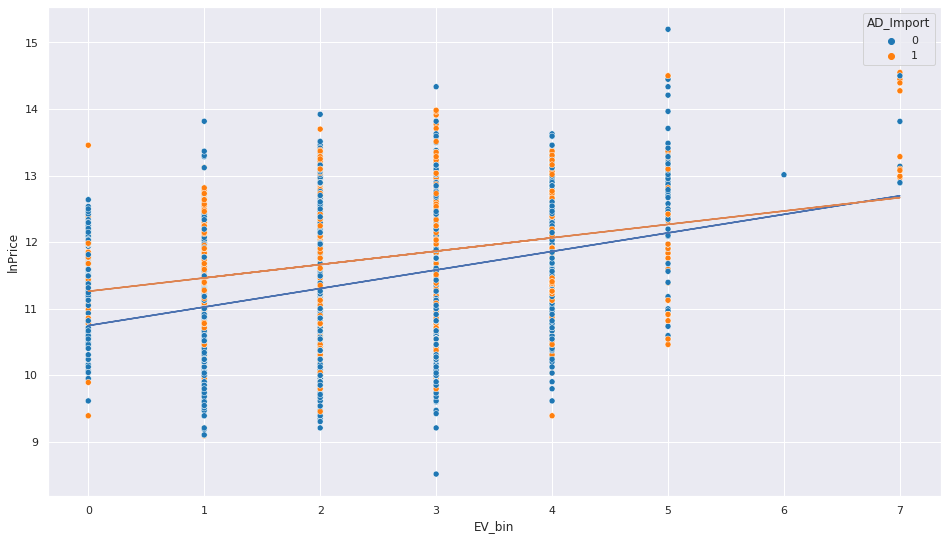

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class3[car_df_class3['AD_Import']==i]['EV_bin'], car_df_class3[car_df_class3['AD_Import']==i]['lnPrice'], 1)
  plt.plot(car_df_class3[car_df_class3['AD_Import']==i]['EV_bin'],b+m*car_df_class3[car_df_class3['AD_Import']==i]['EV_bin'])

sns.scatterplot(x='EV_bin', y = 'lnPrice',hue='AD_Import', data = car_df_class3, palette = 'tab10')


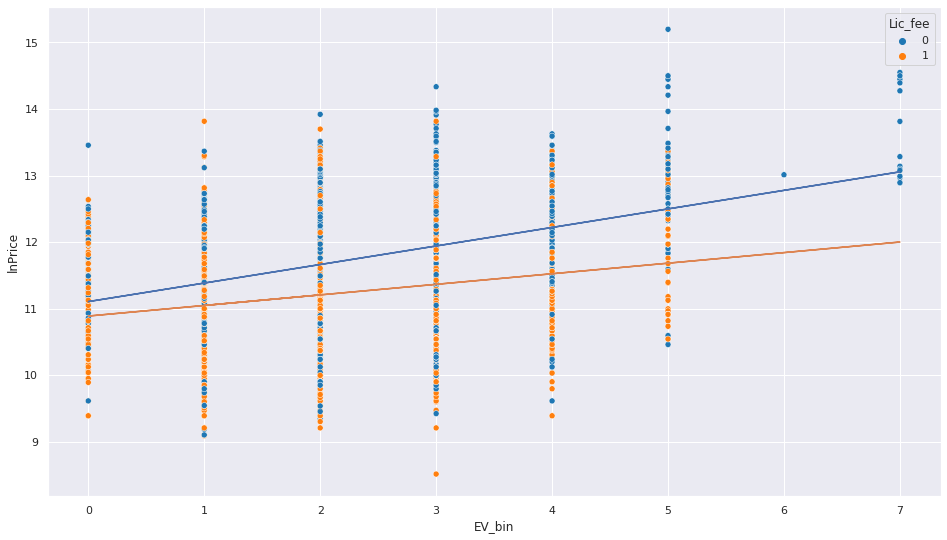

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class3[car_df_class3['Lic_fee']==i]['EV_bin'], car_df_class3[car_df_class3['Lic_fee']==i]['lnPrice'], 1)
  plt.plot(car_df_class3[car_df_class3['Lic_fee']==i]['EV_bin'],b+m*car_df_class3[car_df_class3['Lic_fee']==i]['EV_bin'])

sns.scatterplot(x='EV_bin', y = 'lnPrice',hue='Lic_fee', data = car_df_class3, palette = 'tab10')


Preowner

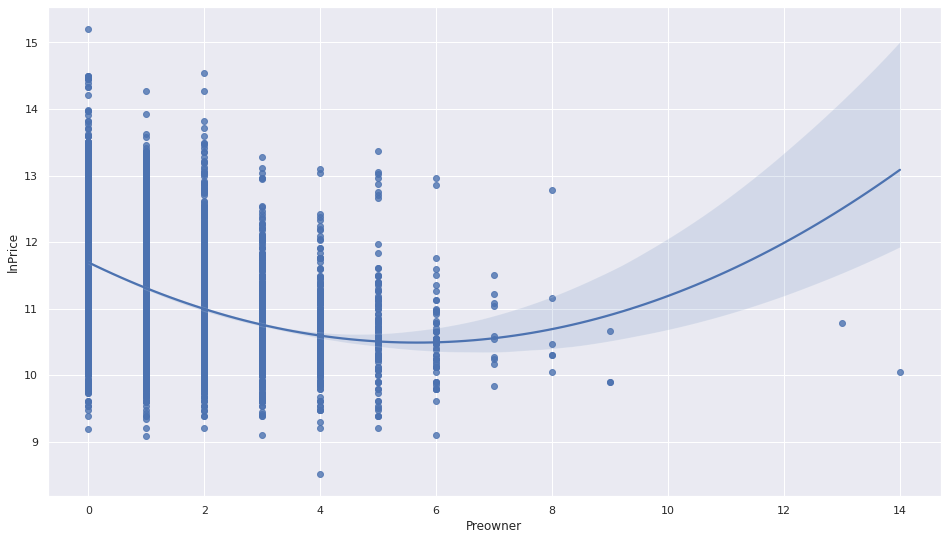

In [ ]:
sns.regplot(x='Preowner', y = 'lnPrice', data = car_df_class3,order=2)

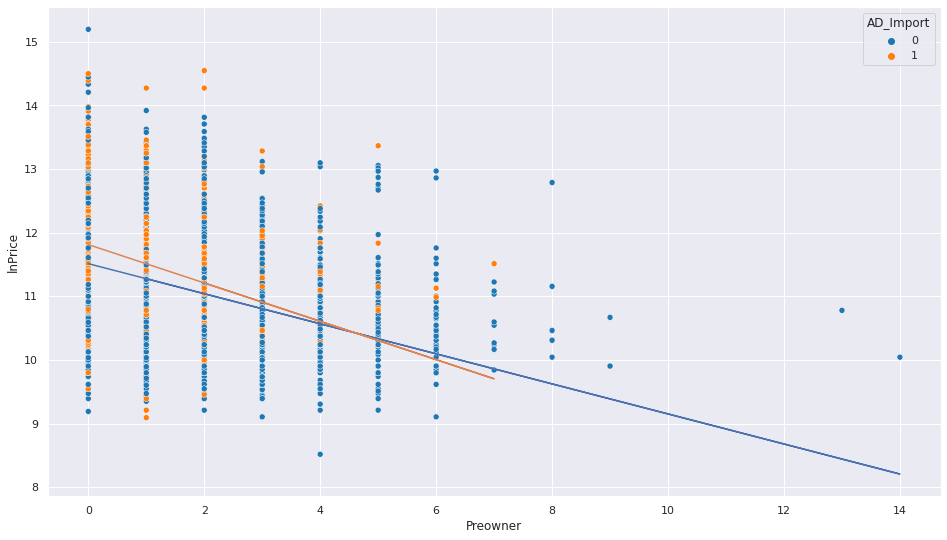

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class3[car_df_class3['AD_Import']==i]['Preowner'], car_df_class3[car_df_class3['AD_Import']==i]['lnPrice'], 1)
  plt.plot(car_df_class3[car_df_class3['AD_Import']==i]['Preowner'],b+m*car_df_class3[car_df_class3['AD_Import']==i]['Preowner'])

sns.scatterplot(x='Preowner', y = 'lnPrice',hue='AD_Import', data = car_df_class3, palette = 'tab10')


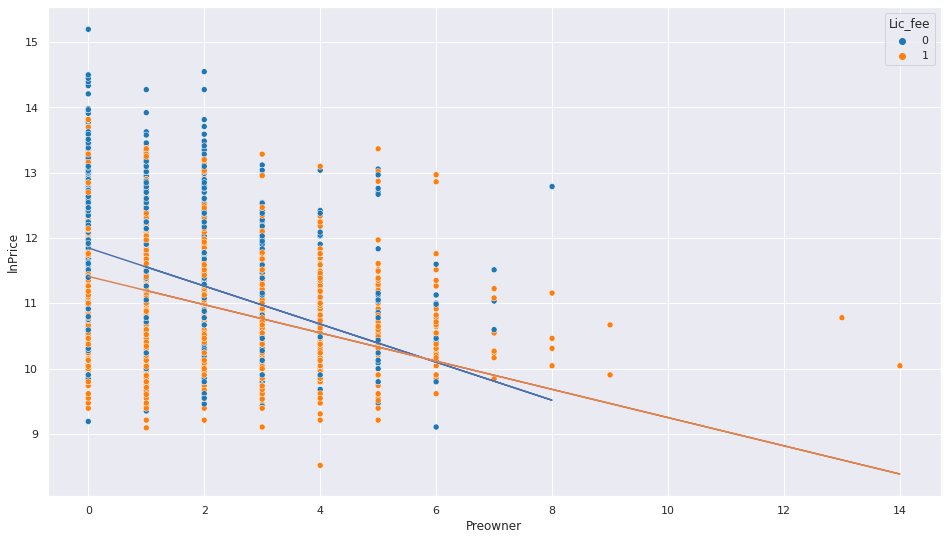

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class3[car_df_class3['Lic_fee']==i]['Preowner'], car_df_class3[car_df_class3['Lic_fee']==i]['lnPrice'], 1)
  plt.plot(car_df_class3[car_df_class3['Lic_fee']==i]['Preowner'],b+m*car_df_class3[car_df_class3['Lic_fee']==i]['Preowner'])

sns.scatterplot(x='Preowner', y = 'lnPrice',hue='Lic_fee', data = car_df_class3, palette = 'tab10')


Seats

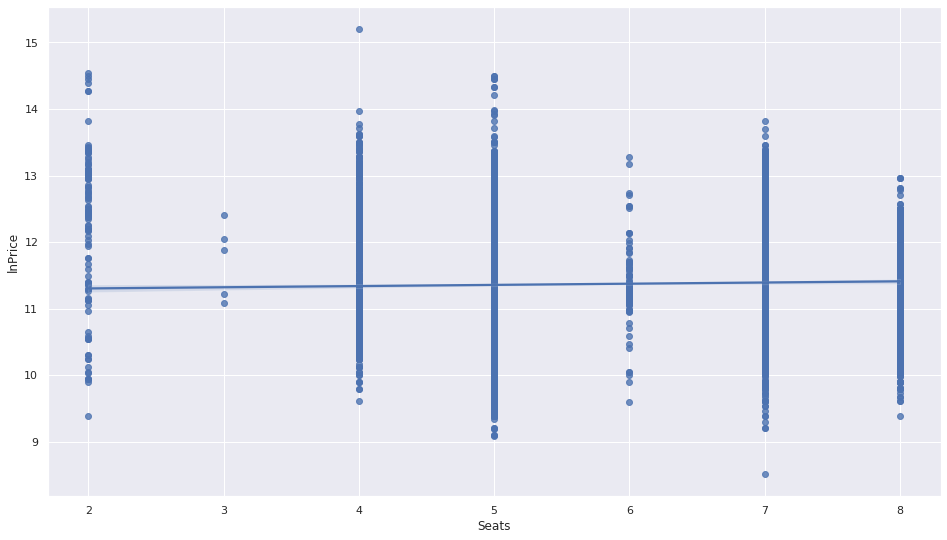

In [ ]:
sns.regplot(x='Seats', y = 'lnPrice', data = car_df_class3,order=1)

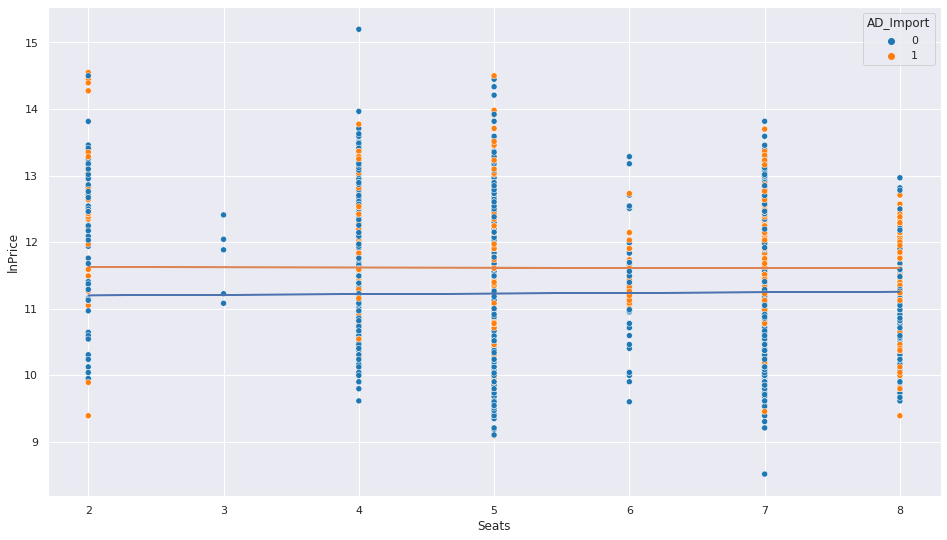

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class3[car_df_class3['AD_Import']==i]['Seats'], car_df_class3[car_df_class3['AD_Import']==i]['lnPrice'], 1)
  plt.plot(car_df_class3[car_df_class3['AD_Import']==i]['Seats'],b+m*car_df_class3[car_df_class3['AD_Import']==i]['Seats'])

sns.scatterplot(x='Seats', y = 'lnPrice',hue='AD_Import', data = car_df_class3, palette = 'tab10')


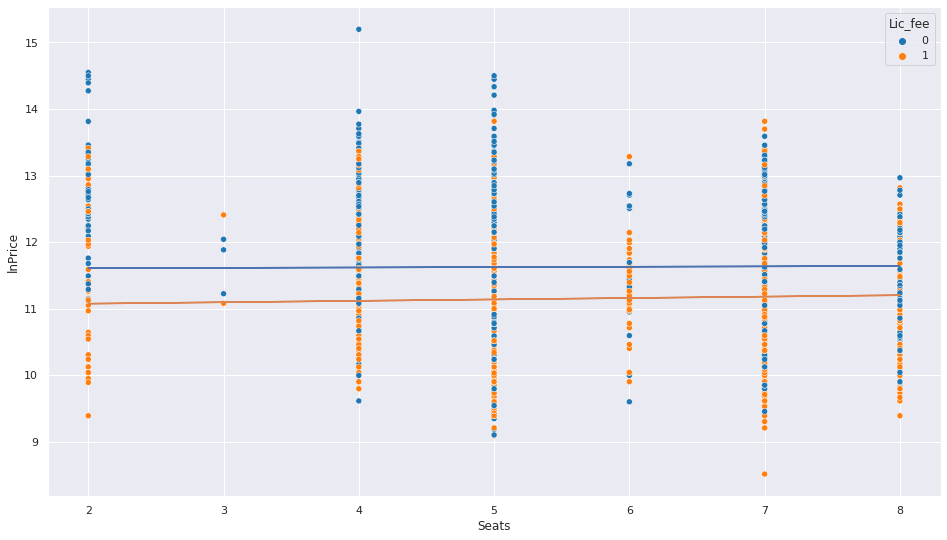

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class3[car_df_class3['Lic_fee']==i]['Seats'], car_df_class3[car_df_class3['Lic_fee']==i]['lnPrice'], 1)
  plt.plot(car_df_class3[car_df_class3['Lic_fee']==i]['Seats'],b+m*car_df_class3[car_df_class3['Lic_fee']==i]['Seats'])

sns.scatterplot(x='Seats', y = 'lnPrice',hue='Lic_fee', data = car_df_class3, palette = 'tab10')


TraveDist_bin

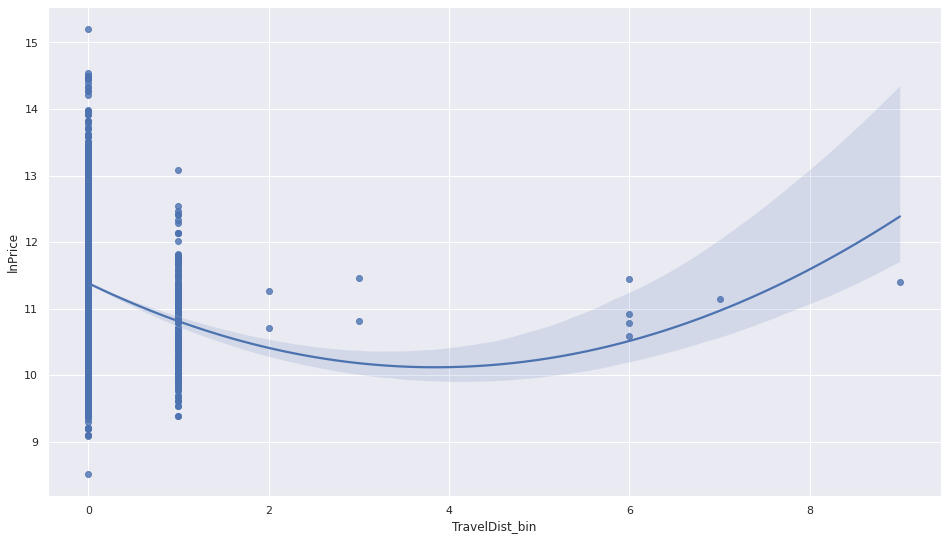

In [ ]:
sns.regplot(x='TravelDist_bin', y = 'lnPrice', data = car_df_class3,order=2)

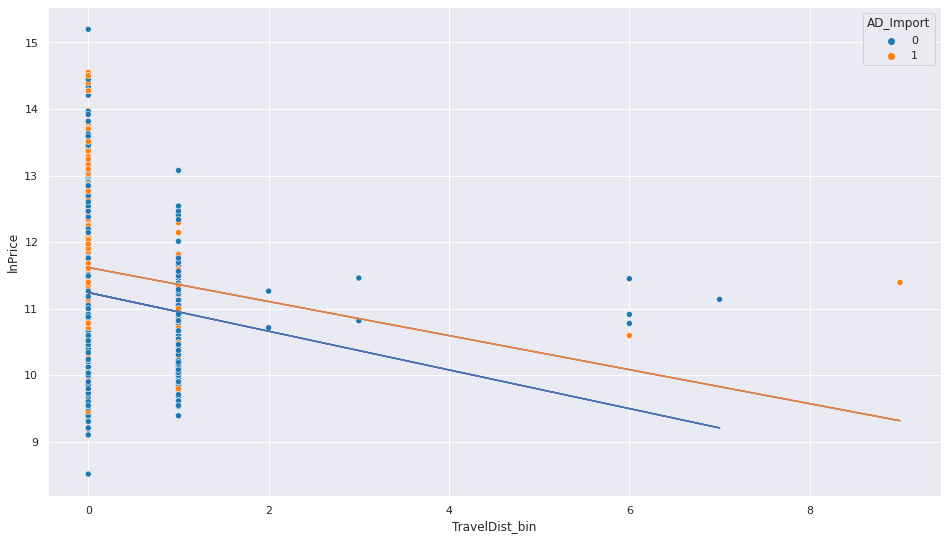

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class3[car_df_class3['AD_Import']==i]['TravelDist_bin'], car_df_class3[car_df_class3['AD_Import']==i]['lnPrice'], 1)
  plt.plot(car_df_class3[car_df_class3['AD_Import']==i]['TravelDist_bin'],b+m*car_df_class3[car_df_class3['AD_Import']==i]['TravelDist_bin'])

sns.scatterplot(x='TravelDist_bin', y = 'lnPrice',hue='AD_Import', data = car_df_class3, palette = 'tab10')


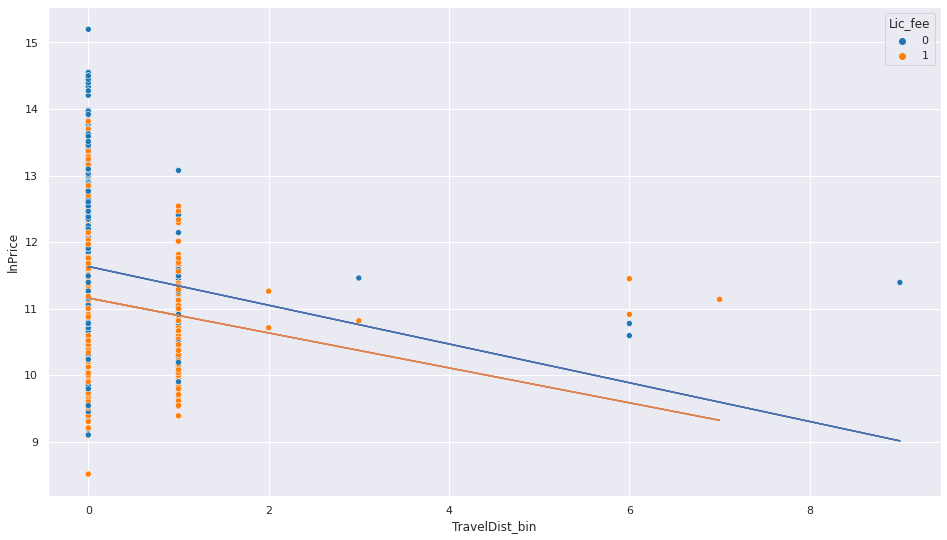

In [ ]:
for i in range(2):
  m,b = np.polyfit(car_df_class3[car_df_class3['Lic_fee']==i]['TravelDist_bin'], car_df_class3[car_df_class3['Lic_fee']==i]['lnPrice'], 1)
  plt.plot(car_df_class3[car_df_class3['Lic_fee']==i]['TravelDist_bin'],b+m*car_df_class3[car_df_class3['Lic_fee']==i]['TravelDist_bin'])

sns.scatterplot(x='TravelDist_bin', y = 'lnPrice',hue='Lic_fee', data = car_df_class3, palette = 'tab10')


Summary for model building:

Class 1

Age: 1st order, AD_import

EV_bin: 1st order, Lic_fee

Preowner: 2nd order, no interaction

Seats: 2nd order, Lic_fee

TravelDist_bin: 2nd order, AD_Import, Lic_fee

Class 2

Age: 1st order, no interaction

EV_bin: 1st order, Lic_fee

Preowner: 2ndorder, no interaction

Seats:1st order, AD_Import

TravelDist_bin:1st order, no interaction

Class3:

Age: 1st order, no interaction

EV_bin: 2nd order, no interaction

Preowner: 2ndorder, no interaction

Seats:1st order, no interaction

TravelDist_bin:2nd order, no interaction

### Model - Class 1

In [ ]:
car_df_class1['Seats_T'] = car_df_class1['Seats'] - np.mean(car_df_class1['Seats'])
car_df_class1['Preowner_T'] = car_df_class1['Preowner'] - np.mean(car_df_class1['Preowner'])
car_df_class1['TravelDist_bin_T'] = car_df_class1['TravelDist_bin'] - np.mean(car_df_class1['TravelDist_bin'])


car_df_class1['Seats_Squared'] = car_df_class1['Seats_T'] **2
car_df_class1['Preowner_Squared'] = car_df_class1['Preowner_T'] **2
car_df_class1['TravelDist_bin_Squared'] = car_df_class1['TravelDist_bin_T']**2

car_df_class1['Age_Import'] = car_df_class1['Age']*car_df_class1['AD_Import']
car_df_class1['EV_bin_Lic'] = car_df_class1['EV_bin']*car_df_class1['Lic_fee']
car_df_class1['Seats_Lic'] = car_df_class1['Seats']*car_df_class1['Lic_fee']
car_df_class1['Seats_Squared_Lic'] = car_df_class1['Seats_Squared']*car_df_class1['Lic_fee']
car_df_class1['TravelDist_bin_Import'] = car_df_class1['TravelDist_bin_T']*car_df_class1['AD_Import']
car_df_class1['TravelDist_bin_Squared_Import'] = car_df_class1['TravelDist_bin_Squared']*car_df_class1['AD_Import']
car_df_class1['TravelDist_bin_Lic'] = car_df_class1['TravelDist_bin_T']*car_df_class1['Lic_fee']
car_df_class1['TravelDist_bin_Squared_Lic'] = car_df_class1['TravelDist_bin_Squared']*car_df_class1['Lic_fee']


In [ ]:
#car_df_class1.columns
pname_class1 = [ 'Age', 'AD_Import', 'Lic_fee',
       'Transmission_AT', 'aqua', 'black',  'gray', 'green', 
       'maroon', 'navy', 'olive', 'purple', 'red', 'silver', 'teal', 'white',
       'yellow',  'EV_bin', 'Seats_T',
       'Preowner_T', 'TravelDist_bin_T', 'Seats_Squared', 'Preowner_Squared',
       'TravelDist_bin_Squared']

#no blue and lime

In [ ]:
Y = car_df_class1.lnPrice
x1 = car_df_class1[pname_class1]
X1= sm.add_constant(x1)
class1= sm.OLS(Y,X1).fit()
class1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.678
Model:                            OLS   Adj. R-squared:                  0.673
Method:                 Least Squares   F-statistic:                     132.4
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:57:55   Log-Likelihood:                -1037.7
No. Observations:                1533   AIC:                             2125.
Df Residuals:                    1508   BIC:                             2259.
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     13.3421      0.142     93.739      0.000      13.063      13.621
Age                       -0.1433      0.005    -29.201      0.000      -0.153      -0.134
AD_Import                  0.0721      0.026      2.734      0.006       0.020       0.124
Lic_fee                   -0.2735      0.037     -7.344      0.000      -0.347      -0.200
Transmission_AT           -0.0418      0.073     -0.574      0.566      -0.185       0.101
aqua                      -0.5953      0.486     -1.225      0.221      -1.549       0.358
black                      0.0341      0.055      0.625      0.532      -0.073       0.141
gray                      -0.0465      0.069     -0.676      0.499      -0.181       0.088
green                      0.1986      0.282      0.704      0.482      -0.355       0.752
maroon                     0.1400      0.065      2.153      0.032       0.012       0.268
navy                       0.0205      0.074      0.278      0.781      -0.124       0.165
olive                     -0.0442      0.068     -0.650      0.516      -0.178       0.089
purple                    -0.0126      0.188     -0.067      0.946      -0.381       0.356
red                        0.4047      0.088      4.622      0.000       0.233       0.576
silver                    -0.0559      0.040     -1.406      0.160      -0.134       0.022
teal                      -0.0050      0.078     -0.065      0.948      -0.157       0.147
white                     -0.1392      0.085     -1.643      0.100      -0.305       0.027
yellow                     0.1753      0.123      1.430      0.153      -0.065       0.416
EV_bin                     0.2256      0.006     34.861      0.000       0.213       0.238
Seats_T                   -0.0397      0.014     -2.918      0.004      -0.066      -0.013
Preowner_T                -0.0581      0.017     -3.359      0.001      -0.092      -0.024
TravelDist_bin_T           0.0007      0.107      0.006      0.995      -0.210       0.211
Seats_Squared              0.0805      0.007     11.299      0.000       0.067       0.094
Preowner_Squared           0.0098      0.006      1.585      0.113      -0.002       0.022
TravelDist_bin_Squared    -0.0001      0.025     -0.006      0.995      -0.049       0.049
==============================================================================
Omnibus:                      102.113   Durbin-Watson:                   2.110
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              396.463
Skew:                          -0.190   Prob(JB):                     8.11e-87
Kurtosis:                       5.462   Cond. No.                         329.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance mat

In [ ]:
pname_class1.remove('TravelDist_bin_Squared')

Y = car_df_class1.lnPrice
x1 = car_df_class1[pname_class1]
X1= sm.add_constant(x1)
class1= sm.OLS(Y,X1).fit()
class1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.678
Model:                            OLS   Adj. R-squared:                  0.673
Method:                 Least Squares   F-statistic:                     138.2
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:57:55   Log-Likelihood:                -1037.7
No. Observations:                1533   AIC:                             2123.
Df Residuals:                    1509   BIC:                             2251.
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.3422      0.142     93.779      0.000      13.063      13.621
Age                 -0.1433      0.005    -29.214      0.000      -0.153      -0.134
AD_Import            0.0721      0.026      2.736      0.006       0.020       0.124
Lic_fee             -0.2735      0.037     -7.348      0.000      -0.347      -0.200
Transmission_AT     -0.0418      0.073     -0.574      0.566      -0.185       0.101
aqua                -0.5953      0.486     -1.225      0.221      -1.548       0.358
black                0.0341      0.055      0.625      0.532      -0.073       0.141
gray                -0.0465      0.069     -0.676      0.499      -0.181       0.088
green                0.1986      0.282      0.704      0.482      -0.355       0.752
maroon               0.1400      0.065      2.153      0.031       0.012       0.268
navy                 0.0204      0.073      0.278      0.781      -0.124       0.165
olive               -0.0442      0.068     -0.650      0.516      -0.177       0.089
purple              -0.0126      0.188     -0.067      0.946      -0.381       0.356
red                  0.4047      0.088      4.624      0.000       0.233       0.576
silver              -0.0559      0.040     -1.406      0.160      -0.134       0.022
teal                -0.0050      0.078     -0.065      0.948      -0.157       0.147
white               -0.1392      0.085     -1.644      0.100      -0.305       0.027
yellow               0.1753      0.123      1.431      0.153      -0.065       0.416
EV_bin               0.2256      0.006     34.887      0.000       0.213       0.238
Seats_T             -0.0397      0.014     -2.923      0.004      -0.066      -0.013
Preowner_T          -0.0581      0.017     -3.360      0.001      -0.092      -0.024
TravelDist_bin_T     0.0001      0.056      0.003      0.998      -0.110       0.111
Seats_Squared        0.0805      0.007     11.303      0.000       0.067       0.094
Preowner_Squared     0.0098      0.006      1.590      0.112      -0.002       0.022
==============================================================================
Omnibus:                      102.113   Durbin-Watson:                   2.110
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              396.463
Skew:                          -0.190   Prob(JB):                     8.11e-87
Kurtosis:                       5.462   Cond. No.                         329.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class1.remove('TravelDist_bin_T')

Y = car_df_class1.lnPrice
x1 = car_df_class1[pname_class1]
X1= sm.add_constant(x1)
class1= sm.OLS(Y,X1).fit()
class1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.678
Model:                            OLS   Adj. R-squared:                  0.673
Method:                 Least Squares   F-statistic:                     144.6
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:57:55   Log-Likelihood:                -1037.7
No. Observations:                1533   AIC:                             2121.
Df Residuals:                    1510   BIC:                             2244.
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.3422      0.142     93.812      0.000      13.063      13.621
Age                 -0.1433      0.005    -29.249      0.000      -0.153      -0.134
AD_Import            0.0721      0.026      2.739      0.006       0.020       0.124
Lic_fee             -0.2735      0.037     -7.351      0.000      -0.346      -0.201
Transmission_AT     -0.0418      0.073     -0.574      0.566      -0.185       0.101
aqua                -0.5953      0.486     -1.226      0.220      -1.548       0.357
black                0.0341      0.055      0.625      0.532      -0.073       0.141
gray                -0.0465      0.069     -0.677      0.499      -0.181       0.088
green                0.1986      0.282      0.704      0.481      -0.355       0.752
maroon               0.1400      0.065      2.154      0.031       0.013       0.267
navy                 0.0204      0.073      0.278      0.781      -0.124       0.164
olive               -0.0442      0.068     -0.650      0.516      -0.177       0.089
purple              -0.0126      0.188     -0.067      0.946      -0.381       0.356
red                  0.4047      0.087      4.626      0.000       0.233       0.576
silver              -0.0559      0.040     -1.407      0.160      -0.134       0.022
teal                -0.0050      0.077     -0.065      0.948      -0.157       0.147
white               -0.1392      0.085     -1.645      0.100      -0.305       0.027
yellow               0.1753      0.122      1.431      0.153      -0.065       0.416
EV_bin               0.2256      0.006     35.153      0.000       0.213       0.238
Seats_T             -0.0397      0.014     -2.925      0.004      -0.066      -0.013
Preowner_T          -0.0581      0.017     -3.362      0.001      -0.092      -0.024
Seats_Squared        0.0805      0.007     11.307      0.000       0.067       0.094
Preowner_Squared     0.0098      0.006      1.594      0.111      -0.002       0.022
==============================================================================
Omnibus:                      102.116   Durbin-Watson:                   2.110
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              396.475
Skew:                          -0.190   Prob(JB):                     8.06e-87
Kurtosis:                       5.462   Cond. No.                         329.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class1.remove('purple')

Y = car_df_class1.lnPrice
x1 = car_df_class1[pname_class1]
X1= sm.add_constant(x1)
class1= sm.OLS(Y,X1).fit()
class1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.678
Model:                            OLS   Adj. R-squared:                  0.674
Method:                 Least Squares   F-statistic:                     151.6
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:57:55   Log-Likelihood:                -1037.7
No. Observations:                1533   AIC:                             2119.
Df Residuals:                    1511   BIC:                             2237.
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.3404      0.140     95.532      0.000      13.066      13.614
Age                 -0.1433      0.005    -29.260      0.000      -0.153      -0.134
AD_Import            0.0721      0.026      2.741      0.006       0.021       0.124
Lic_fee             -0.2736      0.037     -7.359      0.000      -0.347      -0.201
Transmission_AT     -0.0418      0.073     -0.575      0.565      -0.185       0.101
aqua                -0.5951      0.485     -1.226      0.220      -1.547       0.357
black                0.0346      0.054      0.640      0.522      -0.071       0.141
gray                -0.0454      0.067     -0.680      0.497      -0.177       0.086
green                0.1991      0.282      0.706      0.480      -0.354       0.752
maroon               0.1404      0.065      2.173      0.030       0.014       0.267
navy                 0.0209      0.073      0.287      0.774      -0.122       0.164
olive               -0.0436      0.067     -0.647      0.518      -0.176       0.089
red                  0.4053      0.087      4.661      0.000       0.235       0.576
silver              -0.0555      0.039     -1.410      0.159      -0.133       0.022
teal                -0.0043      0.077     -0.057      0.955      -0.155       0.146
white               -0.1388      0.084     -1.645      0.100      -0.304       0.027
yellow               0.1759      0.122      1.440      0.150      -0.064       0.415
EV_bin               0.2256      0.006     35.165      0.000       0.213       0.238
Seats_T             -0.0398      0.014     -2.933      0.003      -0.066      -0.013
Preowner_T          -0.0581      0.017     -3.363      0.001      -0.092      -0.024
Seats_Squared        0.0805      0.007     11.314      0.000       0.067       0.094
Preowner_Squared     0.0098      0.006      1.593      0.111      -0.002       0.022
==============================================================================
Omnibus:                      102.111   Durbin-Watson:                   2.110
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              396.284
Skew:                          -0.191   Prob(JB):                     8.87e-87
Kurtosis:                       5.461   Cond. No.                         329.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class1.remove('teal')

Y = car_df_class1.lnPrice
x1 = car_df_class1[pname_class1]
X1= sm.add_constant(x1)
class1= sm.OLS(Y,X1).fit()
class1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.678
Model:                            OLS   Adj. R-squared:                  0.674
Method:                 Least Squares   F-statistic:                     159.2
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:57:55   Log-Likelihood:                -1037.7
No. Observations:                1533   AIC:                             2117.
Df Residuals:                    1512   BIC:                             2229.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.3366      0.122    108.938      0.000      13.096      13.577
Age                 -0.1432      0.005    -29.314      0.000      -0.153      -0.134
AD_Import            0.0721      0.026      2.741      0.006       0.021       0.124
Lic_fee             -0.2736      0.037     -7.364      0.000      -0.347      -0.201
Transmission_AT     -0.0418      0.073     -0.575      0.565      -0.184       0.101
aqua                -0.5941      0.485     -1.225      0.221      -1.545       0.357
black                0.0361      0.047      0.763      0.445      -0.057       0.129
gray                -0.0438      0.060     -0.729      0.466      -0.162       0.074
green                0.2005      0.281      0.715      0.475      -0.350       0.751
maroon               0.1418      0.060      2.372      0.018       0.025       0.259
navy                 0.0220      0.070      0.313      0.755      -0.116       0.160
olive               -0.0425      0.064     -0.661      0.509      -0.169       0.084
red                  0.4065      0.084      4.816      0.000       0.241       0.572
silver              -0.0549      0.038     -1.451      0.147      -0.129       0.019
white               -0.1381      0.083     -1.656      0.098      -0.302       0.026
yellow               0.1770      0.120      1.469      0.142      -0.059       0.413
EV_bin               0.2256      0.006     35.180      0.000       0.213       0.238
Seats_T             -0.0397      0.014     -2.934      0.003      -0.066      -0.013
Preowner_T          -0.0581      0.017     -3.364      0.001      -0.092      -0.024
Seats_Squared        0.0805      0.007     11.318      0.000       0.067       0.094
Preowner_Squared     0.0098      0.006      1.594      0.111      -0.002       0.022
==============================================================================
Omnibus:                      102.112   Durbin-Watson:                   2.110
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              396.290
Skew:                          -0.191   Prob(JB):                     8.84e-87
Kurtosis:                       5.461   Cond. No.                         329.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class1.remove('navy')

Y = car_df_class1.lnPrice
x1 = car_df_class1[pname_class1]
X1= sm.add_constant(x1)
class1= sm.OLS(Y,X1).fit()
class1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.678
Model:                            OLS   Adj. R-squared:                  0.674
Method:                 Least Squares   F-statistic:                     167.7
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:57:55   Log-Likelihood:                -1037.7
No. Observations:                1533   AIC:                             2115.
Df Residuals:                    1513   BIC:                             2222.
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.3501      0.114    116.648      0.000      13.126      13.575
Age                 -0.1433      0.005    -29.345      0.000      -0.153      -0.134
AD_Import            0.0723      0.026      2.749      0.006       0.021       0.124
Lic_fee             -0.2739      0.037     -7.375      0.000      -0.347      -0.201
Transmission_AT     -0.0414      0.073     -0.570      0.569      -0.184       0.101
aqua                -0.5827      0.483     -1.205      0.228      -1.531       0.366
black                0.0272      0.038      0.720      0.471      -0.047       0.101
gray                -0.0469      0.059     -0.791      0.429      -0.163       0.069
green                0.1935      0.280      0.692      0.489      -0.355       0.742
maroon               0.1352      0.056      2.417      0.016       0.025       0.245
olive               -0.0461      0.063     -0.730      0.466      -0.170       0.078
red                  0.4025      0.083      4.825      0.000       0.239       0.566
silver              -0.0566      0.037     -1.511      0.131      -0.130       0.017
white               -0.1401      0.083     -1.686      0.092      -0.303       0.023
yellow               0.1745      0.120      1.452      0.147      -0.061       0.410
EV_bin               0.2256      0.006     35.189      0.000       0.213       0.238
Seats_T             -0.0397      0.014     -2.933      0.003      -0.066      -0.013
Preowner_T          -0.0580      0.017     -3.363      0.001      -0.092      -0.024
Seats_Squared        0.0804      0.007     11.319      0.000       0.066       0.094
Preowner_Squared     0.0098      0.006      1.605      0.109      -0.002       0.022
==============================================================================
Omnibus:                      102.195   Durbin-Watson:                   2.111
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              396.834
Skew:                          -0.191   Prob(JB):                     6.74e-87
Kurtosis:                       5.463   Cond. No.                         328.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class1.remove('Transmission_AT')

Y = car_df_class1.lnPrice
x1 = car_df_class1[pname_class1]
X1= sm.add_constant(x1)
class1= sm.OLS(Y,X1).fit()
class1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.678
Model:                            OLS   Adj. R-squared:                  0.674
Method:                 Least Squares   F-statistic:                     177.1
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:57:55   Log-Likelihood:                -1037.9
No. Observations:                1533   AIC:                             2114.
Df Residuals:                    1514   BIC:                             2215.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.3119      0.093    143.661      0.000      13.130      13.494
Age                 -0.1434      0.005    -29.437      0.000      -0.153      -0.134
AD_Import            0.0725      0.026      2.759      0.006       0.021       0.124
Lic_fee             -0.2739      0.037     -7.378      0.000      -0.347      -0.201
aqua                -0.5885      0.483     -1.218      0.223      -1.536       0.359
black                0.0271      0.038      0.719      0.472      -0.047       0.101
gray                -0.0469      0.059     -0.792      0.428      -0.163       0.069
green                0.1891      0.279      0.677      0.499      -0.359       0.737
maroon               0.1362      0.056      2.437      0.015       0.027       0.246
olive               -0.0439      0.063     -0.696      0.486      -0.168       0.080
red                  0.3996      0.083      4.800      0.000       0.236       0.563
silver              -0.0582      0.037     -1.557      0.120      -0.131       0.015
white               -0.1414      0.083     -1.702      0.089      -0.304       0.022
yellow               0.1734      0.120      1.443      0.149      -0.062       0.409
EV_bin               0.2255      0.006     35.193      0.000       0.213       0.238
Seats_T             -0.0409      0.013     -3.061      0.002      -0.067      -0.015
Preowner_T          -0.0580      0.017     -3.365      0.001      -0.092      -0.024
Seats_Squared        0.0807      0.007     11.388      0.000       0.067       0.095
Preowner_Squared     0.0098      0.006      1.603      0.109      -0.002       0.022
==============================================================================
Omnibus:                      102.337   Durbin-Watson:                   2.112
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              402.216
Skew:                          -0.184   Prob(JB):                     4.57e-88
Kurtosis:                       5.482   Cond. No.                         326.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class1.remove('green')

Y = car_df_class1.lnPrice
x1 = car_df_class1[pname_class1]
X1= sm.add_constant(x1)
class1= sm.OLS(Y,X1).fit()
class1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.678
Model:                            OLS   Adj. R-squared:                  0.674
Method:                 Least Squares   F-statistic:                     187.6
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:57:55   Log-Likelihood:                -1038.1
No. Observations:                1533   AIC:                             2112.
Df Residuals:                    1515   BIC:                             2208.
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.3169      0.092    144.207      0.000      13.136      13.498
Age                 -0.1435      0.005    -29.459      0.000      -0.153      -0.134
AD_Import            0.0726      0.026      2.764      0.006       0.021       0.124
Lic_fee             -0.2743      0.037     -7.390      0.000      -0.347      -0.202
aqua                -0.5935      0.483     -1.228      0.219      -1.541       0.354
black                0.0248      0.038      0.661      0.509      -0.049       0.099
gray                -0.0477      0.059     -0.806      0.420      -0.164       0.068
maroon               0.1339      0.056      2.400      0.017       0.024       0.243
olive               -0.0462      0.063     -0.734      0.463      -0.170       0.077
red                  0.3976      0.083      4.779      0.000       0.234       0.561
silver              -0.0601      0.037     -1.613      0.107      -0.133       0.013
white               -0.1436      0.083     -1.730      0.084      -0.306       0.019
yellow               0.1714      0.120      1.427      0.154      -0.064       0.407
EV_bin               0.2257      0.006     35.233      0.000       0.213       0.238
Seats_T             -0.0411      0.013     -3.079      0.002      -0.067      -0.015
Preowner_T          -0.0579      0.017     -3.358      0.001      -0.092      -0.024
Seats_Squared        0.0807      0.007     11.396      0.000       0.067       0.095
Preowner_Squared     0.0097      0.006      1.591      0.112      -0.002       0.022
==============================================================================
Omnibus:                      101.990   Durbin-Watson:                   2.113
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              400.092
Skew:                          -0.183   Prob(JB):                     1.32e-87
Kurtosis:                       5.476   Cond. No.                         326.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class1.remove('black')

Y = car_df_class1.lnPrice
x1 = car_df_class1[pname_class1]
X1= sm.add_constant(x1)
class1= sm.OLS(Y,X1).fit()
class1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.678
Model:                            OLS   Adj. R-squared:                  0.674
Method:                 Least Squares   F-statistic:                     199.3
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:57:56   Log-Likelihood:                -1038.3
No. Observations:                1533   AIC:                             2111.
Df Residuals:                    1516   BIC:                             2201.
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.3453      0.082    163.344      0.000      13.185      13.506
Age                 -0.1436      0.005    -29.487      0.000      -0.153      -0.134
AD_Import            0.0731      0.026      2.785      0.005       0.022       0.125
Lic_fee             -0.2747      0.037     -7.403      0.000      -0.347      -0.202
aqua                -0.6184      0.482     -1.284      0.199      -1.563       0.326
gray                -0.0525      0.059     -0.894      0.371      -0.168       0.063
maroon               0.1194      0.051      2.328      0.020       0.019       0.220
olive               -0.0531      0.062     -0.856      0.392      -0.175       0.069
red                  0.3900      0.082      4.734      0.000       0.228       0.552
silver              -0.0634      0.037     -1.717      0.086      -0.136       0.009
white               -0.1491      0.083     -1.806      0.071      -0.311       0.013
yellow               0.1690      0.120      1.408      0.159      -0.066       0.404
EV_bin               0.2261      0.006     35.518      0.000       0.214       0.239
Seats_T             -0.0407      0.013     -3.049      0.002      -0.067      -0.015
Preowner_T          -0.0578      0.017     -3.355      0.001      -0.092      -0.024
Seats_Squared        0.0809      0.007     11.424      0.000       0.067       0.095
Preowner_Squared     0.0098      0.006      1.598      0.110      -0.002       0.022
==============================================================================
Omnibus:                      102.091   Durbin-Watson:                   2.113
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              400.819
Skew:                          -0.183   Prob(JB):                     9.19e-88
Kurtosis:                       5.478   Cond. No.                         324.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class1.remove('olive')

Y = car_df_class1.lnPrice
x1 = car_df_class1[pname_class1]
X1= sm.add_constant(x1)
class1= sm.OLS(Y,X1).fit()
class1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.678
Model:                            OLS   Adj. R-squared:                  0.674
Method:                 Least Squares   F-statistic:                     212.6
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:57:56   Log-Likelihood:                -1038.7
No. Observations:                1533   AIC:                             2109.
Df Residuals:                    1517   BIC:                             2195.
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.3196      0.076    175.289      0.000      13.171      13.469
Age                 -0.1434      0.005    -29.479      0.000      -0.153      -0.134
AD_Import            0.0739      0.026      2.816      0.005       0.022       0.125
Lic_fee             -0.2743      0.037     -7.393      0.000      -0.347      -0.201
aqua                -0.6034      0.481     -1.254      0.210      -1.547       0.340
gray                -0.0391      0.057     -0.690      0.490      -0.150       0.072
maroon               0.1241      0.051      2.434      0.015       0.024       0.224
red                  0.3990      0.082      4.884      0.000       0.239       0.559
silver              -0.0527      0.035     -1.517      0.129      -0.121       0.015
white               -0.1378      0.081     -1.691      0.091      -0.298       0.022
yellow               0.1685      0.120      1.404      0.160      -0.067       0.404
EV_bin               0.2260      0.006     35.513      0.000       0.214       0.239
Seats_T             -0.0399      0.013     -2.997      0.003      -0.066      -0.014
Preowner_T          -0.0585      0.017     -3.400      0.001      -0.092      -0.025
Seats_Squared        0.0807      0.007     11.405      0.000       0.067       0.095
Preowner_Squared     0.0099      0.006      1.618      0.106      -0.002       0.022
==============================================================================
Omnibus:                      102.040   Durbin-Watson:                   2.113
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              401.458
Skew:                          -0.182   Prob(JB):                     6.68e-88
Kurtosis:                       5.480   Cond. No.                         323.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class1.remove('gray')

Y = car_df_class1.lnPrice
x1 = car_df_class1[pname_class1]
X1= sm.add_constant(x1)
class1= sm.OLS(Y,X1).fit()
class1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.678
Model:                            OLS   Adj. R-squared:                  0.675
Method:                 Least Squares   F-statistic:                     227.8
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:57:56   Log-Likelihood:                -1038.9
No. Observations:                1533   AIC:                             2108.
Df Residuals:                    1518   BIC:                             2188.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.2787      0.048    279.024      0.000      13.185      13.372
Age                 -0.1436      0.005    -29.543      0.000      -0.153      -0.134
AD_Import            0.0738      0.026      2.811      0.005       0.022       0.125
Lic_fee             -0.2734      0.037     -7.375      0.000      -0.346      -0.201
aqua                -0.6020      0.481     -1.251      0.211      -1.546       0.342
maroon               0.1300      0.050      2.589      0.010       0.032       0.229
red                  0.4125      0.079      5.200      0.000       0.257       0.568
silver              -0.0479      0.034     -1.407      0.160      -0.115       0.019
white               -0.1316      0.081     -1.625      0.104      -0.290       0.027
yellow               0.1880      0.117      1.612      0.107      -0.041       0.417
EV_bin               0.2262      0.006     35.568      0.000       0.214       0.239
Seats_T             -0.0405      0.013     -3.055      0.002      -0.067      -0.015
Preowner_T          -0.0580      0.017     -3.372      0.001      -0.092      -0.024
Seats_Squared        0.0807      0.007     11.399      0.000       0.067       0.095
Preowner_Squared     0.0096      0.006      1.568      0.117      -0.002       0.022
==============================================================================
Omnibus:                      102.261   Durbin-Watson:                   2.113
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              401.751
Skew:                          -0.184   Prob(JB):                     5.77e-88
Kurtosis:                       5.481   Cond. No.                         322.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class1.remove('aqua')

Y = car_df_class1.lnPrice
x1 = car_df_class1[pname_class1]
X1= sm.add_constant(x1)
class1= sm.OLS(Y,X1).fit()
class1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.677
Model:                            OLS   Adj. R-squared:                  0.674
Method:                 Least Squares   F-statistic:                     245.2
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:57:56   Log-Likelihood:                -1039.7
No. Observations:                1533   AIC:                             2107.
Df Residuals:                    1519   BIC:                             2182.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.2752      0.048    279.400      0.000      13.182      13.368
Age                 -0.1435      0.005    -29.523      0.000      -0.153      -0.134
AD_Import            0.0746      0.026      2.843      0.005       0.023       0.126
Lic_fee             -0.2727      0.037     -7.355      0.000      -0.345      -0.200
maroon               0.1314      0.050      2.616      0.009       0.033       0.230
red                  0.4143      0.079      5.223      0.000       0.259       0.570
silver              -0.0456      0.034     -1.342      0.180      -0.112       0.021
white               -0.1295      0.081     -1.599      0.110      -0.288       0.029
yellow               0.1910      0.117      1.638      0.102      -0.038       0.420
EV_bin               0.2263      0.006     35.574      0.000       0.214       0.239
Seats_T             -0.0401      0.013     -3.024      0.003      -0.066      -0.014
Preowner_T          -0.0588      0.017     -3.423      0.001      -0.093      -0.025
Seats_Squared        0.0806      0.007     11.386      0.000       0.067       0.094
Preowner_Squared     0.0096      0.006      1.578      0.115      -0.002       0.022
==============================================================================
Omnibus:                      101.726   Durbin-Watson:                   2.113
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              398.829
Skew:                          -0.182   Prob(JB):                     2.49e-87
Kurtosis:                       5.472   Cond. No.                         78.5
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class1.remove('silver')


Y = car_df_class1.lnPrice
x1 = car_df_class1[pname_class1]
X1= sm.add_constant(x1)
class1= sm.OLS(Y,X1).fit()
class1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.677
Model:                            OLS   Adj. R-squared:                  0.674
Method:                 Least Squares   F-statistic:                     265.3
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:57:56   Log-Likelihood:                -1040.6
No. Observations:                1533   AIC:                             2107.
Df Residuals:                    1520   BIC:                             2177.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.2359      0.037    353.282      0.000      13.162      13.309
Age                 -0.1438      0.005    -29.610      0.000      -0.153      -0.134
AD_Import            0.0752      0.026      2.866      0.004       0.024       0.127
Lic_fee             -0.2732      0.037     -7.368      0.000      -0.346      -0.200
maroon               0.1443      0.049      2.925      0.003       0.048       0.241
red                  0.4252      0.079      5.388      0.000       0.270       0.580
white               -0.0954      0.077     -1.241      0.215      -0.246       0.055
yellow               0.2135      0.115      1.850      0.065      -0.013       0.440
EV_bin               0.2267      0.006     35.684      0.000       0.214       0.239
Seats_T             -0.0415      0.013     -3.133      0.002      -0.067      -0.016
Preowner_T          -0.0588      0.017     -3.418      0.001      -0.092      -0.025
Seats_Squared        0.0808      0.007     11.412      0.000       0.067       0.095
Preowner_Squared     0.0099      0.006      1.632      0.103      -0.002       0.022
==============================================================================
Omnibus:                      103.211   Durbin-Watson:                   2.109
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              405.928
Skew:                          -0.190   Prob(JB):                     7.14e-89
Kurtosis:                       5.492   Cond. No.                         77.0
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class1.remove('white')

Y = car_df_class1.lnPrice
x1 = car_df_class1[pname_class1]
X1= sm.add_constant(x1)
class1= sm.OLS(Y,X1).fit()
class1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.677
Model:                            OLS   Adj. R-squared:                  0.674
Method:                 Least Squares   F-statistic:                     289.2
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:57:56   Log-Likelihood:                -1041.4
No. Observations:                1533   AIC:                             2107.
Df Residuals:                    1521   BIC:                             2171.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.2342      0.037    353.409      0.000      13.161      13.308
Age                 -0.1440      0.005    -29.676      0.000      -0.154      -0.135
AD_Import            0.0754      0.026      2.872      0.004       0.024       0.127
Lic_fee             -0.2726      0.037     -7.350      0.000      -0.345      -0.200
maroon               0.1459      0.049      2.958      0.003       0.049       0.243
red                  0.4276      0.079      5.420      0.000       0.273       0.582
yellow               0.2160      0.115      1.872      0.061      -0.010       0.442
EV_bin               0.2268      0.006     35.703      0.000       0.214       0.239
Seats_T             -0.0412      0.013     -3.114      0.002      -0.067      -0.015
Preowner_T          -0.0581      0.017     -3.380      0.001      -0.092      -0.024
Seats_Squared        0.0808      0.007     11.422      0.000       0.067       0.095
Preowner_Squared     0.0097      0.006      1.596      0.111      -0.002       0.022
==============================================================================
Omnibus:                      104.694   Durbin-Watson:                   2.106
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              415.153
Skew:                          -0.194   Prob(JB):                     7.09e-91
Kurtosis:                       5.520   Cond. No.                         76.9
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class1=pname_class1 +['Age_Import', 'EV_bin_Lic', 'Seats_Lic', 'Seats_Squared_Lic']
pname_class1

['Age',
 'AD_Import',
 'Lic_fee',
 'maroon',
 'red',
 'yellow',
 'EV_bin',
 'Seats_T',
 'Preowner_T',
 'Seats_Squared',
 'Preowner_Squared',
 'Age_Import',
 'EV_bin_Lic',
 'Seats_Lic',
 'Seats_Squared_Lic']

In [ ]:
Y = car_df_class1.lnPrice
x1 = car_df_class1[pname_class1]
X1= sm.add_constant(x1)
class1= sm.OLS(Y,X1).fit()
class1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.684
Model:                            OLS   Adj. R-squared:                  0.681
Method:                 Least Squares   F-statistic:                     219.0
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:57:57   Log-Likelihood:                -1023.3
No. Observations:                1533   AIC:                             2079.
Df Residuals:                    1517   BIC:                             2164.
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                13.1434      0.042    309.443      0.000      13.060      13.227
Age                  -0.1332      0.006    -21.959      0.000      -0.145      -0.121
AD_Import             0.1849      0.054      3.397      0.001       0.078       0.292
Lic_fee               0.3679      0.381      0.967      0.334      -0.379       1.115
maroon                0.1525      0.049      3.122      0.002       0.057       0.248
red                   0.4216      0.078      5.387      0.000       0.268       0.575
yellow                0.2341      0.114      2.048      0.041       0.010       0.458
EV_bin                0.2340      0.007     35.162      0.000       0.221       0.247
Seats_T              -0.0320      0.014     -2.346      0.019      -0.059      -0.005
Preowner_T           -0.0557      0.017     -3.266      0.001      -0.089      -0.022
Seats_Squared         0.0826      0.007     11.550      0.000       0.069       0.097
Preowner_Squared      0.0098      0.006      1.613      0.107      -0.002       0.022
Age_Import           -0.0169      0.008     -2.251      0.025      -0.032      -0.002
EV_bin_Lic           -0.0960      0.018     -5.320      0.000      -0.131      -0.061
Seats_Lic            -0.0733      0.070     -1.054      0.292      -0.210       0.063
Seats_Squared_Lic    -0.0333      0.042     -0.801      0.424      -0.115       0.048
==============================================================================
Omnibus:                      121.220   Durbin-Watson:                   2.122
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              565.459
Skew:                          -0.198   Prob(JB):                    1.63e-123
Kurtosis:                       5.949   Cond. No.                         287.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class1.remove('Seats_Squared_Lic')

Y = car_df_class1.lnPrice
x1 = car_df_class1[pname_class1]
X1= sm.add_constant(x1)
class1= sm.OLS(Y,X1).fit()
class1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.684
Model:                            OLS   Adj. R-squared:                  0.681
Method:                 Least Squares   F-statistic:                     234.6
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:57:57   Log-Likelihood:                -1023.6
No. Observations:                1533   AIC:                             2077.
Df Residuals:                    1518   BIC:                             2157.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.1456      0.042    310.179      0.000      13.062      13.229
Age                 -0.1332      0.006    -21.968      0.000      -0.145      -0.121
AD_Import            0.1842      0.054      3.385      0.001       0.077       0.291
Lic_fee              0.0931      0.164      0.567      0.571      -0.229       0.415
maroon               0.1527      0.049      3.128      0.002       0.057       0.249
red                  0.4176      0.078      5.347      0.000       0.264       0.571
yellow               0.2331      0.114      2.040      0.042       0.009       0.457
EV_bin               0.2338      0.007     35.157      0.000       0.221       0.247
Seats_T             -0.0330      0.014     -2.430      0.015      -0.060      -0.006
Preowner_T          -0.0560      0.017     -3.287      0.001      -0.089      -0.023
Seats_Squared        0.0816      0.007     11.579      0.000       0.068       0.095
Preowner_Squared     0.0098      0.006      1.620      0.106      -0.002       0.022
Age_Import          -0.0168      0.008     -2.230      0.026      -0.032      -0.002
EV_bin_Lic          -0.0907      0.017     -5.408      0.000      -0.124      -0.058
Seats_Lic           -0.0238      0.032     -0.748      0.455      -0.086       0.039
==============================================================================
Omnibus:                      120.539   Durbin-Watson:                   2.120
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              558.132
Skew:                          -0.199   Prob(JB):                    6.36e-122
Kurtosis:                       5.929   Cond. No.                         124.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class1.remove('Seats_Lic')

Y = car_df_class1.lnPrice
x1 = car_df_class1[pname_class1]
X1= sm.add_constant(x1)
class1= sm.OLS(Y,X1).fit()
class1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.684
Model:                            OLS   Adj. R-squared:                  0.681
Method:                 Least Squares   F-statistic:                     252.7
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        08:57:58   Log-Likelihood:                -1023.9
No. Observations:                1533   AIC:                             2076.
Df Residuals:                    1519   BIC:                             2150.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.1460      0.042    310.259      0.000      13.063      13.229
Age                 -0.1330      0.006    -21.959      0.000      -0.145      -0.121
AD_Import            0.1850      0.054      3.401      0.001       0.078       0.292
Lic_fee             -0.0215      0.059     -0.363      0.717      -0.138       0.095
maroon               0.1526      0.049      3.125      0.002       0.057       0.248
red                  0.4169      0.078      5.339      0.000       0.264       0.570
yellow               0.2305      0.114      2.018      0.044       0.006       0.455
EV_bin               0.2330      0.007     35.609      0.000       0.220       0.246
Seats_T             -0.0355      0.013     -2.699      0.007      -0.061      -0.010
Preowner_T          -0.0558      0.017     -3.275      0.001      -0.089      -0.022
Seats_Squared        0.0822      0.007     11.725      0.000       0.068       0.096
Preowner_Squared     0.0102      0.006      1.690      0.091      -0.002       0.022
Age_Import          -0.0170      0.008     -2.260      0.024      -0.032      -0.002
EV_bin_Lic          -0.0864      0.016     -5.480      0.000      -0.117      -0.055
==============================================================================
Omnibus:                      119.378   Durbin-Watson:                   2.119
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              552.025
Skew:                          -0.192   Prob(JB):                    1.35e-120
Kurtosis:                       5.915   Cond. No.                         84.2
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

###Model - Class 2 

In [ ]:
car_df_class2['Preowner_T'] = car_df_class2['Preowner'] - np.mean(car_df_class2['Preowner'])
car_df_class2['Preowner_Squared'] = car_df_class2['Preowner_T'] **2

In [ ]:
#car_df_class2.columns
pname_class2 = [ 'Seats', 'Age', 'AD_Import', 'Lic_fee',
       'Transmission_AT', 'aqua', 'black','blue',  'gray', 'green', 'lime',
       'maroon', 'navy', 'olive', 'purple', 'red', 'silver', 'teal', 'white',
       'yellow', 'TravelDist_bin','EV_bin', 'Preowner_T',  'Preowner_Squared']
#null in blue & lime 

In [ ]:
Y = car_df_class2.lnPrice
x2 = car_df_class2[pname_class2]
X2= sm.add_constant(x2)
class2= sm.OLS(Y,X2).fit()
class2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.758
Model:                            OLS   Adj. R-squared:                  0.757
Method:                 Least Squares   F-statistic:                     881.7
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:06:10   Log-Likelihood:                -3499.6
No. Observations:                6770   AIC:                             7049.
Df Residuals:                    6745   BIC:                             7220.
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.6560      0.079    173.609      0.000      13.502      13.810
Seats               -0.0584      0.007     -8.061      0.000      -0.073      -0.044
Age                 -0.2180      0.002   -109.378      0.000      -0.222      -0.214
AD_Import            0.0563      0.010      5.545      0.000       0.036       0.076
Lic_fee             -0.1184      0.011    -10.869      0.000      -0.140      -0.097
Transmission_AT     -0.4520      0.034    -13.164      0.000      -0.519      -0.385
aqua                 0.1878      0.205      0.915      0.360      -0.215       0.590
black                0.0363      0.029      1.251      0.211      -0.021       0.093
blue                -0.6444      0.409     -1.577      0.115      -1.446       0.157
gray                -0.0216      0.036     -0.594      0.552      -0.093       0.050
green                0.0653      0.095      0.689      0.491      -0.121       0.251
lime                -0.1043      0.410     -0.255      0.799      -0.908       0.699
maroon              -0.0258      0.040     -0.640      0.522      -0.105       0.053
navy                 0.0216      0.035      0.613      0.540      -0.047       0.091
olive               -0.0220      0.039     -0.564      0.573      -0.099       0.055
purple              -0.0821      0.099     -0.828      0.408      -0.277       0.112
red                  0.1807      0.131      1.380      0.168      -0.076       0.437
silver              -0.0046      0.016     -0.278      0.781      -0.037       0.028
teal                -0.0186      0.035     -0.537      0.591      -0.086       0.049
white                0.0446      0.034      1.306      0.192      -0.022       0.111
yellow               0.0514      0.205      0.251      0.802      -0.351       0.454
TravelDist_bin      -0.0822      0.025     -3.317      0.001      -0.131      -0.034
EV_bin               0.2635      0.005     56.415      0.000       0.254       0.273
Preowner_T          -0.0194      0.007     -2.689      0.007      -0.034      -0.005
Preowner_Squared    -0.0055      0.002     -2.217      0.027      -0.010      -0.001
==============================================================================
Omnibus:                      501.274   Durbin-Watson:                   1.966
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2231.039
Skew:                           0.222   Prob(JB):                         0.00
Kurtosis:                       5.777   Cond. No.                         783.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class2.remove('yellow')
x2 = car_df_class2[pname_class2]
X2= sm.add_constant(x2)
class2= sm.OLS(Y,X2).fit()
class2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.758
Model:                            OLS   Adj. R-squared:                  0.757
Method:                 Least Squares   F-statistic:                     920.1
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:06:37   Log-Likelihood:                -3499.6
No. Observations:                6770   AIC:                             7047.
Df Residuals:                    6746   BIC:                             7211.
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.6573      0.078    174.017      0.000      13.503      13.811
Seats               -0.0584      0.007     -8.061      0.000      -0.073      -0.044
Age                 -0.2180      0.002   -109.411      0.000      -0.222      -0.214
AD_Import            0.0563      0.010      5.544      0.000       0.036       0.076
Lic_fee             -0.1184      0.011    -10.871      0.000      -0.140      -0.097
Transmission_AT     -0.4523      0.034    -13.181      0.000      -0.520      -0.385
aqua                 0.1874      0.205      0.913      0.361      -0.215       0.590
black                0.0362      0.029      1.247      0.212      -0.021       0.093
blue                -0.6449      0.409     -1.578      0.115      -1.446       0.156
gray                -0.0222      0.036     -0.614      0.539      -0.093       0.049
green                0.0652      0.095      0.687      0.492      -0.121       0.251
lime                -0.1054      0.410     -0.257      0.797      -0.909       0.698
maroon              -0.0261      0.040     -0.648      0.517      -0.105       0.053
navy                 0.0214      0.035      0.608      0.543      -0.048       0.090
olive               -0.0217      0.039     -0.556      0.578      -0.098       0.055
purple              -0.0825      0.099     -0.832      0.405      -0.277       0.112
red                  0.1804      0.131      1.377      0.169      -0.076       0.437
silver              -0.0049      0.016     -0.296      0.767      -0.037       0.027
teal                -0.0189      0.035     -0.547      0.585      -0.087       0.049
white                0.0442      0.034      1.297      0.195      -0.023       0.111
TravelDist_bin      -0.0823      0.025     -3.319      0.001      -0.131      -0.034
EV_bin               0.2636      0.005     56.454      0.000       0.254       0.273
Preowner_T          -0.0194      0.007     -2.686      0.007      -0.034      -0.005
Preowner_Squared    -0.0055      0.002     -2.215      0.027      -0.010      -0.001
==============================================================================
Omnibus:                      501.191   Durbin-Watson:                   1.966
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2230.817
Skew:                           0.222   Prob(JB):                         0.00
Kurtosis:                       5.777   Cond. No.                         783.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class2.remove('lime')
x2 = car_df_class2[pname_class2]
X2= sm.add_constant(x2)
class2= sm.OLS(Y,X2).fit()
class2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.758
Model:                            OLS   Adj. R-squared:                  0.757
Method:                 Least Squares   F-statistic:                     962.1
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:06:53   Log-Likelihood:                -3499.7
No. Observations:                6770   AIC:                             7045.
Df Residuals:                    6747   BIC:                             7202.
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.6556      0.078    174.647      0.000      13.502      13.809
Seats               -0.0584      0.007     -8.064      0.000      -0.073      -0.044
Age                 -0.2180      0.002   -109.432      0.000      -0.222      -0.214
AD_Import            0.0563      0.010      5.546      0.000       0.036       0.076
Lic_fee             -0.1185      0.011    -10.876      0.000      -0.140      -0.097
Transmission_AT     -0.4516      0.034    -13.203      0.000      -0.519      -0.385
aqua                 0.1879      0.205      0.916      0.360      -0.214       0.590
black                0.0364      0.029      1.254      0.210      -0.020       0.093
blue                -0.6442      0.409     -1.576      0.115      -1.445       0.157
gray                -0.0214      0.036     -0.594      0.553      -0.092       0.049
green                0.0654      0.095      0.690      0.490      -0.120       0.251
maroon              -0.0258      0.040     -0.640      0.522      -0.105       0.053
navy                 0.0217      0.035      0.617      0.538      -0.047       0.091
olive               -0.0213      0.039     -0.547      0.584      -0.098       0.055
purple              -0.0820      0.099     -0.828      0.408      -0.276       0.112
red                  0.1807      0.131      1.380      0.168      -0.076       0.437
silver              -0.0048      0.016     -0.291      0.771      -0.037       0.027
teal                -0.0186      0.035     -0.537      0.591      -0.086       0.049
white                0.0445      0.034      1.304      0.192      -0.022       0.111
TravelDist_bin      -0.0823      0.025     -3.318      0.001      -0.131      -0.034
EV_bin               0.2636      0.005     56.457      0.000       0.254       0.273
Preowner_T          -0.0194      0.007     -2.691      0.007      -0.034      -0.005
Preowner_Squared    -0.0055      0.002     -2.218      0.027      -0.010      -0.001
==============================================================================
Omnibus:                      501.339   Durbin-Watson:                   1.966
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2231.170
Skew:                           0.222   Prob(JB):                         0.00
Kurtosis:                       5.777   Cond. No.                         779.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class2.remove('silver')
x2 = car_df_class2[pname_class2]
X2= sm.add_constant(x2)
class2= sm.OLS(Y,X2).fit()
class2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.758
Model:                            OLS   Adj. R-squared:                  0.758
Method:                 Least Squares   F-statistic:                     1008.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:07:13   Log-Likelihood:                -3499.7
No. Observations:                6770   AIC:                             7043.
Df Residuals:                    6748   BIC:                             7193.
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.6461      0.071    192.071      0.000      13.507      13.785
Seats               -0.0584      0.007     -8.067      0.000      -0.073      -0.044
Age                 -0.2180      0.002   -109.478      0.000      -0.222      -0.214
AD_Import            0.0562      0.010      5.540      0.000       0.036       0.076
Lic_fee             -0.1186      0.011    -10.892      0.000      -0.140      -0.097
Transmission_AT     -0.4518      0.034    -13.213      0.000      -0.519      -0.385
aqua                 0.1910      0.205      0.932      0.351      -0.211       0.593
black                0.0389      0.028      1.399      0.162      -0.016       0.093
blue                -0.6402      0.408     -1.568      0.117      -1.441       0.160
gray                -0.0182      0.034     -0.530      0.596      -0.085       0.049
green                0.0675      0.095      0.714      0.475      -0.118       0.253
maroon              -0.0228      0.039     -0.585      0.559      -0.099       0.054
navy                 0.0241      0.034      0.703      0.482      -0.043       0.091
olive               -0.0179      0.037     -0.481      0.631      -0.091       0.055
purple              -0.0792      0.099     -0.803      0.422      -0.273       0.114
red                  0.1841      0.130      1.412      0.158      -0.072       0.440
teal                -0.0156      0.033     -0.472      0.637      -0.080       0.049
white                0.0484      0.031      1.544      0.123      -0.013       0.110
TravelDist_bin      -0.0821      0.025     -3.312      0.001      -0.131      -0.034
EV_bin               0.2636      0.005     56.466      0.000       0.254       0.273
Preowner_T          -0.0195      0.007     -2.697      0.007      -0.034      -0.005
Preowner_Squared    -0.0055      0.002     -2.214      0.027      -0.010      -0.001
==============================================================================
Omnibus:                      501.858   Durbin-Watson:                   1.966
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2234.882
Skew:                           0.223   Prob(JB):                         0.00
Kurtosis:                       5.779   Cond. No.                         776.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class2.remove('teal')
x2 = car_df_class2[pname_class2]
X2= sm.add_constant(x2)
class2= sm.OLS(Y,X2).fit()
class2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.758
Model:                            OLS   Adj. R-squared:                  0.758
Method:                 Least Squares   F-statistic:                     1059.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:07:32   Log-Likelihood:                -3499.8
No. Observations:                6770   AIC:                             7042.
Df Residuals:                    6749   BIC:                             7185.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.6328      0.065    209.049      0.000      13.505      13.761
Seats               -0.0582      0.007     -8.055      0.000      -0.072      -0.044
Age                 -0.2180      0.002   -109.616      0.000      -0.222      -0.214
AD_Import            0.0562      0.010      5.546      0.000       0.036       0.076
Lic_fee             -0.1185      0.011    -10.889      0.000      -0.140      -0.097
Transmission_AT     -0.4509      0.034    -13.208      0.000      -0.518      -0.384
aqua                 0.1891      0.205      0.923      0.356      -0.213       0.591
black                0.0447      0.025      1.793      0.073      -0.004       0.093
blue                -0.6375      0.408     -1.561      0.119      -1.438       0.163
gray                -0.0128      0.032     -0.397      0.692      -0.076       0.051
green                0.0726      0.094      0.773      0.440      -0.111       0.257
maroon              -0.0182      0.038     -0.483      0.629      -0.092       0.056
navy                 0.0285      0.033      0.865      0.387      -0.036       0.093
olive               -0.0144      0.036     -0.395      0.693      -0.086       0.057
purple              -0.0747      0.098     -0.760      0.447      -0.267       0.118
red                  0.1873      0.130      1.438      0.150      -0.068       0.443
white                0.0498      0.031      1.597      0.110      -0.011       0.111
TravelDist_bin      -0.0819      0.025     -3.307      0.001      -0.131      -0.033
EV_bin               0.2636      0.005     56.468      0.000       0.254       0.273
Preowner_T          -0.0195      0.007     -2.705      0.007      -0.034      -0.005
Preowner_Squared    -0.0055      0.002     -2.212      0.027      -0.010      -0.001
==============================================================================
Omnibus:                      501.785   Durbin-Watson:                   1.966
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2234.272
Skew:                           0.223   Prob(JB):                         0.00
Kurtosis:                       5.779   Cond. No.                         775.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class2.remove('olive')
x2 = car_df_class2[pname_class2]
X2= sm.add_constant(x2)
class2= sm.OLS(Y,X2).fit()
class2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.758
Model:                            OLS   Adj. R-squared:                  0.758
Method:                 Least Squares   F-statistic:                     1114.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:07:52   Log-Likelihood:                -3499.9
No. Observations:                6770   AIC:                             7040.
Df Residuals:                    6750   BIC:                             7176.
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.6266      0.063    215.319      0.000      13.503      13.751
Seats               -0.0582      0.007     -8.050      0.000      -0.072      -0.044
Age                 -0.2180      0.002   -109.636      0.000      -0.222      -0.214
AD_Import            0.0563      0.010      5.554      0.000       0.036       0.076
Lic_fee             -0.1186      0.011    -10.896      0.000      -0.140      -0.097
Transmission_AT     -0.4509      0.034    -13.209      0.000      -0.518      -0.384
aqua                 0.1921      0.205      0.938      0.348      -0.209       0.593
black                0.0465      0.024      1.902      0.057      -0.001       0.094
blue                -0.6377      0.408     -1.562      0.118      -1.438       0.163
gray                -0.0090      0.031     -0.290      0.771      -0.069       0.052
green                0.0747      0.094      0.797      0.426      -0.109       0.258
maroon              -0.0165      0.037     -0.441      0.659      -0.090       0.057
navy                 0.0308      0.032      0.949      0.343      -0.033       0.094
purple              -0.0719      0.098     -0.734      0.463      -0.264       0.120
red                  0.1892      0.130      1.454      0.146      -0.066       0.444
white                0.0504      0.031      1.619      0.105      -0.011       0.111
TravelDist_bin      -0.0819      0.025     -3.305      0.001      -0.130      -0.033
EV_bin               0.2635      0.005     56.471      0.000       0.254       0.273
Preowner_T          -0.0195      0.007     -2.709      0.007      -0.034      -0.005
Preowner_Squared    -0.0055      0.002     -2.212      0.027      -0.010      -0.001
==============================================================================
Omnibus:                      501.008   Durbin-Watson:                   1.966
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2229.448
Skew:                           0.222   Prob(JB):                         0.00
Kurtosis:                       5.776   Cond. No.                         775.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class2.remove('gray')
x2 = car_df_class2[pname_class2]
X2= sm.add_constant(x2)
class2= sm.OLS(Y,X2).fit()
class2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.758
Model:                            OLS   Adj. R-squared:                  0.758
Method:                 Least Squares   F-statistic:                     1176.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:08:05   Log-Likelihood:                -3499.9
No. Observations:                6770   AIC:                             7038.
Df Residuals:                    6751   BIC:                             7167.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.6183      0.057    240.915      0.000      13.508      13.729
Seats               -0.0583      0.007     -8.068      0.000      -0.072      -0.044
Age                 -0.2180      0.002   -109.668      0.000      -0.222      -0.214
AD_Import            0.0563      0.010      5.553      0.000       0.036       0.076
Lic_fee             -0.1186      0.011    -10.901      0.000      -0.140      -0.097
Transmission_AT     -0.4513      0.034    -13.229      0.000      -0.518      -0.384
aqua                 0.1965      0.204      0.963      0.336      -0.204       0.597
black                0.0468      0.024      1.915      0.056      -0.001       0.095
blue                -0.6388      0.408     -1.565      0.118      -1.439       0.162
green                0.0752      0.094      0.802      0.422      -0.109       0.259
maroon              -0.0145      0.037     -0.394      0.693      -0.087       0.058
navy                 0.0316      0.032      0.978      0.328      -0.032       0.095
purple              -0.0669      0.096     -0.694      0.488      -0.256       0.122
red                  0.1923      0.130      1.483      0.138      -0.062       0.447
white                0.0517      0.031      1.678      0.093      -0.009       0.112
TravelDist_bin      -0.0819      0.025     -3.308      0.001      -0.131      -0.033
EV_bin               0.2635      0.005     56.476      0.000       0.254       0.273
Preowner_T          -0.0195      0.007     -2.711      0.007      -0.034      -0.005
Preowner_Squared    -0.0055      0.002     -2.207      0.027      -0.010      -0.001
==============================================================================
Omnibus:                      501.412   Durbin-Watson:                   1.966
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2232.538
Skew:                           0.222   Prob(JB):                         0.00
Kurtosis:                       5.778   Cond. No.                         772.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class2.remove('maroon')
x2 = car_df_class2[pname_class2]
X2= sm.add_constant(x2)
class2= sm.OLS(Y,X2).fit()
class2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.758
Model:                            OLS   Adj. R-squared:                  0.758
Method:                 Least Squares   F-statistic:                     1246.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:08:21   Log-Likelihood:                -3500.0
No. Observations:                6770   AIC:                             7036.
Df Residuals:                    6752   BIC:                             7159.
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.6144      0.056    244.741      0.000      13.505      13.723
Seats               -0.0583      0.007     -8.068      0.000      -0.072      -0.044
Age                 -0.2179      0.002   -109.710      0.000      -0.222      -0.214
AD_Import            0.0563      0.010      5.554      0.000       0.036       0.076
Lic_fee             -0.1186      0.011    -10.904      0.000      -0.140      -0.097
Transmission_AT     -0.4510      0.034    -13.225      0.000      -0.518      -0.384
aqua                 0.1983      0.204      0.971      0.331      -0.202       0.598
black                0.0501      0.023      2.180      0.029       0.005       0.095
blue                -0.6383      0.408     -1.563      0.118      -1.439       0.162
green                0.0784      0.093      0.840      0.401      -0.105       0.261
navy                 0.0349      0.031      1.119      0.263      -0.026       0.096
purple              -0.0679      0.096     -0.704      0.482      -0.257       0.121
red                  0.1881      0.129      1.455      0.146      -0.065       0.441
white                0.0520      0.031      1.688      0.091      -0.008       0.112
TravelDist_bin      -0.0818      0.025     -3.304      0.001      -0.130      -0.033
EV_bin               0.2636      0.005     56.490      0.000       0.254       0.273
Preowner_T          -0.0196      0.007     -2.713      0.007      -0.034      -0.005
Preowner_Squared    -0.0055      0.002     -2.207      0.027      -0.010      -0.001
==============================================================================
Omnibus:                      501.414   Durbin-Watson:                   1.966
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2231.806
Skew:                           0.222   Prob(JB):                         0.00
Kurtosis:                       5.777   Cond. No.                         772.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class2.remove('purple')
x2 = car_df_class2[pname_class2]
X2= sm.add_constant(x2)
class2= sm.OLS(Y,X2).fit()
class2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.758
Model:                            OLS   Adj. R-squared:                  0.758
Method:                 Least Squares   F-statistic:                     1324.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:08:36   Log-Likelihood:                -3500.3
No. Observations:                6770   AIC:                             7035.
Df Residuals:                    6753   BIC:                             7150.
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.6128      0.056    244.914      0.000      13.504      13.722
Seats               -0.0582      0.007     -8.060      0.000      -0.072      -0.044
Age                 -0.2179      0.002   -109.712      0.000      -0.222      -0.214
AD_Import            0.0563      0.010      5.557      0.000       0.036       0.076
Lic_fee             -0.1187      0.011    -10.905      0.000      -0.140      -0.097
Transmission_AT     -0.4511      0.034    -13.230      0.000      -0.518      -0.384
aqua                 0.1988      0.204      0.974      0.330      -0.201       0.599
black                0.0511      0.023      2.230      0.026       0.006       0.096
blue                -0.6383      0.408     -1.564      0.118      -1.439       0.162
green                0.0795      0.093      0.852      0.394      -0.103       0.262
navy                 0.0360      0.031      1.156      0.248      -0.025       0.097
red                  0.1819      0.129      1.411      0.158      -0.071       0.435
white                0.0523      0.031      1.698      0.090      -0.008       0.113
TravelDist_bin      -0.0818      0.025     -3.301      0.001      -0.130      -0.033
EV_bin               0.2636      0.005     56.521      0.000       0.254       0.273
Preowner_T          -0.0195      0.007     -2.711      0.007      -0.034      -0.005
Preowner_Squared    -0.0055      0.002     -2.205      0.027      -0.010      -0.001
==============================================================================
Omnibus:                      501.413   Durbin-Watson:                   1.966
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2233.723
Skew:                           0.222   Prob(JB):                         0.00
Kurtosis:                       5.779   Cond. No.                         772.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class2.remove('green')
x2 = car_df_class2[pname_class2]
X2= sm.add_constant(x2)
class2= sm.OLS(Y,X2).fit()
class2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.758
Model:                            OLS   Adj. R-squared:                  0.758
Method:                 Least Squares   F-statistic:                     1412.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:08:47   Log-Likelihood:                -3500.6
No. Observations:                6770   AIC:                             7033.
Df Residuals:                    6754   BIC:                             7142.
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.6165      0.055    245.739      0.000      13.508      13.725
Seats               -0.0582      0.007     -8.053      0.000      -0.072      -0.044
Age                 -0.2179      0.002   -109.711      0.000      -0.222      -0.214
AD_Import            0.0564      0.010      5.561      0.000       0.037       0.076
Lic_fee             -0.1188      0.011    -10.917      0.000      -0.140      -0.097
Transmission_AT     -0.4509      0.034    -13.223      0.000      -0.518      -0.384
aqua                 0.1967      0.204      0.964      0.335      -0.203       0.597
black                0.0468      0.022      2.093      0.036       0.003       0.091
blue                -0.6383      0.408     -1.564      0.118      -1.439       0.162
navy                 0.0319      0.031      1.038      0.299      -0.028       0.092
red                  0.1802      0.129      1.398      0.162      -0.073       0.433
white                0.0521      0.031      1.690      0.091      -0.008       0.112
TravelDist_bin      -0.0820      0.025     -3.310      0.001      -0.131      -0.033
EV_bin               0.2636      0.005     56.522      0.000       0.254       0.273
Preowner_T          -0.0195      0.007     -2.710      0.007      -0.034      -0.005
Preowner_Squared    -0.0055      0.002     -2.199      0.028      -0.010      -0.001
==============================================================================
Omnibus:                      501.012   Durbin-Watson:                   1.966
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2232.172
Skew:                           0.221   Prob(JB):                         0.00
Kurtosis:                       5.778   Cond. No.                         772.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class2.remove('aqua')
x2 = car_df_class2[pname_class2]
X2= sm.add_constant(x2)
class2= sm.OLS(Y,X2).fit()
class2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.758
Model:                            OLS   Adj. R-squared:                  0.758
Method:                 Least Squares   F-statistic:                     1513.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:08:56   Log-Likelihood:                -3501.1
No. Observations:                6770   AIC:                             7032.
Df Residuals:                    6755   BIC:                             7134.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.6186      0.055    245.958      0.000      13.510      13.727
Seats               -0.0582      0.007     -8.053      0.000      -0.072      -0.044
Age                 -0.2179      0.002   -109.724      0.000      -0.222      -0.214
AD_Import            0.0563      0.010      5.555      0.000       0.036       0.076
Lic_fee             -0.1188      0.011    -10.921      0.000      -0.140      -0.097
Transmission_AT     -0.4521      0.034    -13.270      0.000      -0.519      -0.385
black                0.0458      0.022      2.050      0.040       0.002       0.090
blue                -0.6393      0.408     -1.566      0.117      -1.440       0.161
navy                 0.0309      0.031      1.005      0.315      -0.029       0.091
red                  0.1798      0.129      1.395      0.163      -0.073       0.433
white                0.0518      0.031      1.683      0.092      -0.009       0.112
TravelDist_bin      -0.0806      0.025     -3.261      0.001      -0.129      -0.032
EV_bin               0.2636      0.005     56.525      0.000       0.255       0.273
Preowner_T          -0.0195      0.007     -2.711      0.007      -0.034      -0.005
Preowner_Squared    -0.0055      0.002     -2.208      0.027      -0.010      -0.001
==============================================================================
Omnibus:                      500.060   Durbin-Watson:                   1.966
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2227.955
Skew:                           0.220   Prob(JB):                         0.00
Kurtosis:                       5.776   Cond. No.                         772.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class2.remove('navy')
x2 = car_df_class2[pname_class2]
X2= sm.add_constant(x2)
class2= sm.OLS(Y,X2).fit()
class2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.758
Model:                            OLS   Adj. R-squared:                  0.758
Method:                 Least Squares   F-statistic:                     1629.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:09:07   Log-Likelihood:                -3501.6
No. Observations:                6770   AIC:                             7031.
Df Residuals:                    6756   BIC:                             7127.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.6359      0.053    259.126      0.000      13.533      13.739
Seats               -0.0582      0.007     -8.052      0.000      -0.072      -0.044
Age                 -0.2180      0.002   -109.921      0.000      -0.222      -0.214
AD_Import            0.0565      0.010      5.571      0.000       0.037       0.076
Lic_fee             -0.1187      0.011    -10.910      0.000      -0.140      -0.097
Transmission_AT     -0.4544      0.034    -13.365      0.000      -0.521      -0.388
black                0.0313      0.017      1.835      0.067      -0.002       0.065
blue                -0.6258      0.408     -1.534      0.125      -1.426       0.174
red                  0.1755      0.129      1.362      0.173      -0.077       0.428
white                0.0508      0.031      1.650      0.099      -0.010       0.111
TravelDist_bin      -0.0810      0.025     -3.276      0.001      -0.129      -0.033
EV_bin               0.2637      0.005     56.532      0.000       0.255       0.273
Preowner_T          -0.0194      0.007     -2.698      0.007      -0.034      -0.005
Preowner_Squared    -0.0055      0.002     -2.215      0.027      -0.010      -0.001
==============================================================================
Omnibus:                      500.355   Durbin-Watson:                   1.966
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2233.188
Skew:                           0.220   Prob(JB):                         0.00
Kurtosis:                       5.779   Cond. No.                         771.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class2.remove('red')
x2 = car_df_class2[pname_class2]
X2= sm.add_constant(x2)
class2= sm.OLS(Y,X2).fit()
class2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.758
Model:                            OLS   Adj. R-squared:                  0.758
Method:                 Least Squares   F-statistic:                     1764.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:09:18   Log-Likelihood:                -3502.5
No. Observations:                6770   AIC:                             7031.
Df Residuals:                    6757   BIC:                             7120.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.6383      0.053    259.311      0.000      13.535      13.741
Seats               -0.0584      0.007     -8.084      0.000      -0.073      -0.044
Age                 -0.2180      0.002   -109.966      0.000      -0.222      -0.214
AD_Import            0.0564      0.010      5.565      0.000       0.037       0.076
Lic_fee             -0.1185      0.011    -10.895      0.000      -0.140      -0.097
Transmission_AT     -0.4539      0.034    -13.350      0.000      -0.521      -0.387
black                0.0301      0.017      1.764      0.078      -0.003       0.063
blue                -0.6268      0.408     -1.536      0.125      -1.427       0.173
white                0.0503      0.031      1.636      0.102      -0.010       0.111
TravelDist_bin      -0.0811      0.025     -3.279      0.001      -0.130      -0.033
EV_bin               0.2636      0.005     56.522      0.000       0.254       0.273
Preowner_T          -0.0193      0.007     -2.677      0.007      -0.033      -0.005
Preowner_Squared    -0.0055      0.002     -2.235      0.025      -0.010      -0.001
==============================================================================
Omnibus:                      500.595   Durbin-Watson:                   1.967
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2234.477
Skew:                           0.220   Prob(JB):                         0.00
Kurtosis:                       5.780   Cond. No.                         771.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
car_df_class2['EV_bin_Transmission'] = car_df_class2['EV_bin']*car_df_class2['Transmission_AT']
car_df_class2['Seats_Import'] = car_df_class2['Seats']*car_df_class2['AD_Import']

In [ ]:
pname_class2=pname_class2+['EV_bin_Transmission','Seats_Import']
pname_class2

['Seats',
 'Age',
 'AD_Import',
 'Lic_fee',
 'Transmission_AT',
 'black',
 'blue',
 'white',
 'TravelDist_bin',
 'EV_bin',
 'Preowner_T',
 'Preowner_Squared',
 'EV_bin_Transmission',
 'Seats_Import']

In [ ]:
x2 = car_df_class2[pname_class2]
X2= sm.add_constant(x2)
class2= sm.OLS(Y,X2).fit()
class2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.758
Model:                            OLS   Adj. R-squared:                  0.758
Method:                 Least Squares   F-statistic:                     1512.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:10:02   Log-Likelihood:                -3502.5
No. Observations:                6770   AIC:                             7035.
Df Residuals:                    6755   BIC:                             7137.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                  13.6715      0.158     86.731      0.000      13.362      13.980
Seats                  -0.0580      0.010     -5.776      0.000      -0.078      -0.038
Age                    -0.2180      0.002   -109.848      0.000      -0.222      -0.214
AD_Import               0.0611      0.072      0.851      0.395      -0.080       0.202
Lic_fee                -0.1185      0.011    -10.895      0.000      -0.140      -0.097
Transmission_AT        -0.4891      0.148     -3.301      0.001      -0.779      -0.199
black                   0.0300      0.017      1.761      0.078      -0.003       0.063
blue                   -0.6346      0.409     -1.550      0.121      -1.437       0.168
white                   0.0503      0.031      1.633      0.102      -0.010       0.111
TravelDist_bin         -0.0811      0.025     -3.279      0.001      -0.130      -0.033
EV_bin                  0.2499      0.056      4.448      0.000       0.140       0.360
Preowner_T             -0.0193      0.007     -2.673      0.008      -0.033      -0.005
Preowner_Squared       -0.0055      0.002     -2.230      0.026      -0.010      -0.001
EV_bin_Transmission     0.0138      0.056      0.244      0.807      -0.097       0.124
Seats_Import           -0.0009      0.014     -0.065      0.948      -0.029       0.027
==============================================================================
Omnibus:                      500.399   Durbin-Watson:                   1.967
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2234.243
Skew:                           0.219   Prob(JB):                         0.00
Kurtosis:                       5.780   Cond. No.                         821.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class2.remove('Seats_Import')
x2 = car_df_class2[pname_class2]
X2= sm.add_constant(x2)
class2= sm.OLS(Y,X2).fit()
class2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.758
Model:                            OLS   Adj. R-squared:                  0.758
Method:                 Least Squares   F-statistic:                     1629.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:10:24   Log-Likelihood:                -3502.5
No. Observations:                6770   AIC:                             7033.
Df Residuals:                    6756   BIC:                             7128.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                  13.6736      0.154     88.724      0.000      13.372      13.976
Seats                  -0.0584      0.007     -8.087      0.000      -0.073      -0.044
Age                    -0.2181      0.002   -109.860      0.000      -0.222      -0.214
AD_Import               0.0565      0.010      5.568      0.000       0.037       0.076
Lic_fee                -0.1185      0.011    -10.896      0.000      -0.140      -0.097
Transmission_AT        -0.4890      0.148     -3.301      0.001      -0.779      -0.199
black                   0.0300      0.017      1.762      0.078      -0.003       0.063
blue                   -0.6346      0.409     -1.550      0.121      -1.437       0.168
white                   0.0503      0.031      1.633      0.102      -0.010       0.111
TravelDist_bin         -0.0811      0.025     -3.280      0.001      -0.130      -0.033
EV_bin                  0.2500      0.056      4.449      0.000       0.140       0.360
Preowner_T             -0.0193      0.007     -2.675      0.008      -0.033      -0.005
Preowner_Squared       -0.0055      0.002     -2.232      0.026      -0.010      -0.001
EV_bin_Transmission     0.0137      0.056      0.244      0.807      -0.097       0.124
==============================================================================
Omnibus:                      500.501   Durbin-Watson:                   1.967
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2235.000
Skew:                           0.219   Prob(JB):                         0.00
Kurtosis:                       5.780   Cond. No.                         797.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class2.remove('EV_bin_Transmission')
x2 = car_df_class2[pname_class2]
X2= sm.add_constant(x2)
class2= sm.OLS(Y,X2).fit()
class2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.758
Model:                            OLS   Adj. R-squared:                  0.758
Method:                 Least Squares   F-statistic:                     1764.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:10:39   Log-Likelihood:                -3502.5
No. Observations:                6770   AIC:                             7031.
Df Residuals:                    6757   BIC:                             7120.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.6383      0.053    259.311      0.000      13.535      13.741
Seats               -0.0584      0.007     -8.084      0.000      -0.073      -0.044
Age                 -0.2180      0.002   -109.966      0.000      -0.222      -0.214
AD_Import            0.0564      0.010      5.565      0.000       0.037       0.076
Lic_fee             -0.1185      0.011    -10.895      0.000      -0.140      -0.097
Transmission_AT     -0.4539      0.034    -13.350      0.000      -0.521      -0.387
black                0.0301      0.017      1.764      0.078      -0.003       0.063
blue                -0.6268      0.408     -1.536      0.125      -1.427       0.173
white                0.0503      0.031      1.636      0.102      -0.010       0.111
TravelDist_bin      -0.0811      0.025     -3.279      0.001      -0.130      -0.033
EV_bin               0.2636      0.005     56.522      0.000       0.254       0.273
Preowner_T          -0.0193      0.007     -2.677      0.007      -0.033      -0.005
Preowner_Squared    -0.0055      0.002     -2.235      0.025      -0.010      -0.001
==============================================================================
Omnibus:                      500.595   Durbin-Watson:                   1.967
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2234.477
Skew:                           0.220   Prob(JB):                         0.00
Kurtosis:                       5.780   Cond. No.                         771.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

###Model - Class 3


In [ ]:
car_df_class3['EV_bin_T'] = car_df_class3['EV_bin'] - np.mean(car_df_class3['EV_bin'])
car_df_class3['Preowner_T'] = car_df_class3['Preowner'] - np.mean(car_df_class3['Preowner'])
car_df_class3['TravelDist_bin_T'] = car_df_class3['TravelDist_bin'] - np.mean(car_df_class3['TravelDist_bin'])

car_df_class3['EV_Squared'] = car_df_class3['EV_bin_T'] **2
car_df_class3['Preowner_Squared'] = car_df_class3['Preowner_T'] **2
car_df_class3['TravelDist_bin_Squared'] = car_df_class3['TravelDist_bin_T'] **2

In [ ]:
#car_df_class3.columns
pname_class3 = ['Seats', 'Age', 'AD_Import', 'Lic_fee',
       'Transmission_AT', 'aqua', 'black', 'blue', 'gray', 'green', 
       'maroon', 'navy', 'olive', 'purple', 'red', 'silver', 'teal', 'white',
       'yellow', 'EV_bin_T', 'Preowner_T', 'TravelDist_bin_T', 'EV_Squared', 'Preowner_Squared',
       'TravelDist_bin_Squared']
#lime

In [ ]:
Y = car_df_class3.lnPrice
x3 = car_df_class3[pname_class3]
X3= sm.add_constant(x3)
class3= sm.OLS(Y,X3).fit()
class3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.709
Model:                            OLS   Adj. R-squared:                  0.709
Method:                 Least Squares   F-statistic:                     1000.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:13:48   Log-Likelihood:                -5941.9
No. Observations:               10273   AIC:                         1.194e+04
Df Residuals:                   10247   BIC:                         1.212e+04
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     13.3530      0.059    226.003      0.000      13.237      13.469
Seats                     -0.0071      0.004     -1.776      0.076      -0.015       0.001
Age                       -0.1623      0.002   -106.325      0.000      -0.165      -0.159
AD_Import                  0.0109      0.009      1.159      0.247      -0.008       0.029
Lic_fee                   -0.1062      0.009    -11.841      0.000      -0.124      -0.089
Transmission_AT           -0.7273      0.023    -31.099      0.000      -0.773      -0.681
aqua                       0.7282      0.178      4.092      0.000       0.379       1.077
black                      0.0551      0.023      2.356      0.018       0.009       0.101
blue                      -0.5499      0.432     -1.272      0.203      -1.397       0.297
gray                      -0.0141      0.030     -0.470      0.638      -0.073       0.045
green                      0.0161      0.074      0.219      0.827      -0.128       0.160
maroon                    -0.0156      0.030     -0.528      0.598      -0.074       0.042
navy                       0.0428      0.030      1.435      0.151      -0.016       0.101
olive                     -0.0211      0.033     -0.633      0.527      -0.087       0.044
purple                    -0.0798      0.064     -1.248      0.212      -0.205       0.046
red                        0.0153      0.062      0.248      0.804      -0.106       0.136
silver                    -0.0019      0.015     -0.130      0.897      -0.030       0.027
teal                       0.0271      0.030      0.891      0.373      -0.033       0.087
white                      0.0278      0.030      0.916      0.360      -0.032       0.087
yellow                     0.1256      0.110      1.146      0.252      -0.089       0.340
EV_bin_T                   0.2725      0.006     45.222      0.000       0.261       0.284
Preowner_T                -0.0800      0.005    -15.353      0.000      -0.090      -0.070
TravelDist_bin_T          -0.1783      0.030     -5.863      0.000      -0.238      -0.119
EV_Squared                 0.0232      0.003      7.858      0.000       0.017       0.029
Preowner_Squared           0.0081      0.001      5.719      0.000       0.005       0.011
TravelDist_bin_Squared     0.0271      0.006      4.577      0.000       0.016       0.039
==============================================================================
Omnibus:                      494.830   Durbin-Watson:                   1.978
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1643.093
Skew:                           0.140   Prob(JB):                         0.00
Kurtosis:                       4.939   Cond. No.                     1.06e+03
=================================================

In [ ]:
pname_class3.remove('silver')
Y = car_df_class3.lnPrice
x3 = car_df_class3[pname_class3]
X3= sm.add_constant(x3)
class3= sm.OLS(Y,X3).fit()
class3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.709
Model:                            OLS   Adj. R-squared:                  0.709
Method:                 Least Squares   F-statistic:                     1042.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:14:25   Log-Likelihood:                -5941.9
No. Observations:               10273   AIC:                         1.193e+04
Df Residuals:                   10248   BIC:                         1.211e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     13.3492      0.051    260.152      0.000      13.249      13.450
Seats                     -0.0071      0.004     -1.777      0.076      -0.015       0.001
Age                       -0.1623      0.002   -106.405      0.000      -0.165      -0.159
AD_Import                  0.0109      0.009      1.159      0.247      -0.008       0.029
Lic_fee                   -0.1062      0.009    -11.841      0.000      -0.124      -0.089
Transmission_AT           -0.7274      0.023    -31.103      0.000      -0.773      -0.682
aqua                       0.7297      0.178      4.108      0.000       0.382       1.078
black                      0.0560      0.022      2.515      0.012       0.012       0.100
blue                      -0.5482      0.432     -1.269      0.205      -1.395       0.299
gray                      -0.0129      0.028     -0.453      0.651      -0.069       0.043
green                      0.0170      0.073      0.232      0.817      -0.127       0.160
maroon                    -0.0144      0.028     -0.513      0.608      -0.070       0.041
navy                       0.0436      0.029      1.499      0.134      -0.013       0.101
olive                     -0.0199      0.032     -0.623      0.533      -0.082       0.043
purple                    -0.0787      0.063     -1.242      0.214      -0.203       0.045
red                        0.0166      0.061      0.272      0.786      -0.103       0.136
teal                       0.0282      0.029      0.965      0.335      -0.029       0.086
white                      0.0293      0.028      1.057      0.290      -0.025       0.084
yellow                     0.1271      0.109      1.166      0.244      -0.087       0.341
EV_bin_T                   0.2725      0.006     45.227      0.000       0.261       0.284
Preowner_T                -0.0800      0.005    -15.355      0.000      -0.090      -0.070
TravelDist_bin_T          -0.1782      0.030     -5.863      0.000      -0.238      -0.119
EV_Squared                 0.0232      0.003      7.857      0.000       0.017       0.029
Preowner_Squared           0.0081      0.001      5.721      0.000       0.005       0.011
TravelDist_bin_Squared     0.0271      0.006      4.576      0.000       0.016       0.039
==============================================================================
Omnibus:                      494.812   Durbin-Watson:                   1.978
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1643.030
Skew:                           0.140   Prob(JB):                         0.00
Kurtosis:                       4.939   Cond. No.                     1.05e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance mat

In [ ]:
pname_class3.remove('green')
Y = car_df_class3.lnPrice
x3 = car_df_class3[pname_class3]
X3= sm.add_constant(x3)
class3= sm.OLS(Y,X3).fit()
class3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.709
Model:                            OLS   Adj. R-squared:                  0.709
Method:                 Least Squares   F-statistic:                     1087.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:14:34   Log-Likelihood:                -5941.9
No. Observations:               10273   AIC:                         1.193e+04
Df Residuals:                   10249   BIC:                         1.211e+04
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     13.3514      0.050    264.791      0.000      13.253      13.450
Seats                     -0.0071      0.004     -1.779      0.075      -0.015       0.001
Age                       -0.1623      0.002   -106.413      0.000      -0.165      -0.159
AD_Import                  0.0109      0.009      1.160      0.246      -0.008       0.029
Lic_fee                   -0.1062      0.009    -11.842      0.000      -0.124      -0.089
Transmission_AT           -0.7275      0.023    -31.116      0.000      -0.773      -0.682
aqua                       0.7292      0.178      4.106      0.000       0.381       1.077
black                      0.0546      0.021      2.552      0.011       0.013       0.097
blue                      -0.5482      0.432     -1.269      0.205      -1.395       0.299
gray                      -0.0135      0.028     -0.476      0.634      -0.069       0.042
maroon                    -0.0155      0.028     -0.556      0.578      -0.070       0.039
navy                       0.0423      0.028      1.483      0.138      -0.014       0.098
olive                     -0.0203      0.032     -0.639      0.523      -0.083       0.042
purple                    -0.0795      0.063     -1.257      0.209      -0.203       0.044
red                        0.0160      0.061      0.262      0.793      -0.103       0.135
teal                       0.0273      0.029      0.942      0.346      -0.030       0.084
white                      0.0292      0.028      1.052      0.293      -0.025       0.084
yellow                     0.1268      0.109      1.163      0.245      -0.087       0.340
EV_bin_T                   0.2725      0.006     45.230      0.000       0.261       0.284
Preowner_T                -0.0800      0.005    -15.359      0.000      -0.090      -0.070
TravelDist_bin_T          -0.1781      0.030     -5.860      0.000      -0.238      -0.119
EV_Squared                 0.0232      0.003      7.857      0.000       0.017       0.029
Preowner_Squared           0.0081      0.001      5.723      0.000       0.005       0.011
TravelDist_bin_Squared     0.0271      0.006      4.574      0.000       0.015       0.039
==============================================================================
Omnibus:                      494.631   Durbin-Watson:                   1.978
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1642.377
Skew:                           0.140   Prob(JB):                         0.00
Kurtosis:                       4.939   Cond. No.                     1.05e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.05e+03. This

In [ ]:
pname_class3.remove('red')
Y = car_df_class3.lnPrice
x3 = car_df_class3[pname_class3]
X3= sm.add_constant(x3)
class3= sm.OLS(Y,X3).fit()
class3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.709
Model:                            OLS   Adj. R-squared:                  0.709
Method:                 Least Squares   F-statistic:                     1137.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:14:44   Log-Likelihood:                -5941.9
No. Observations:               10273   AIC:                         1.193e+04
Df Residuals:                   10250   BIC:                         1.210e+04
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     13.3537      0.050    268.946      0.000      13.256      13.451
Seats                     -0.0071      0.004     -1.791      0.073      -0.015       0.001
Age                       -0.1623      0.002   -106.421      0.000      -0.165      -0.159
AD_Import                  0.0109      0.009      1.162      0.245      -0.007       0.029
Lic_fee                   -0.1063      0.009    -11.851      0.000      -0.124      -0.089
Transmission_AT           -0.7274      0.023    -31.118      0.000      -0.773      -0.682
aqua                       0.7287      0.178      4.103      0.000       0.381       1.077
black                      0.0539      0.021      2.539      0.011       0.012       0.095
blue                      -0.5483      0.432     -1.269      0.204      -1.395       0.299
gray                      -0.0149      0.028     -0.538      0.591      -0.069       0.039
maroon                    -0.0154      0.028     -0.554      0.580      -0.070       0.039
navy                       0.0416      0.028      1.465      0.143      -0.014       0.097
olive                     -0.0210      0.032     -0.663      0.508      -0.083       0.041
purple                    -0.0797      0.063     -1.261      0.207      -0.204       0.044
teal                       0.0265      0.029      0.920      0.358      -0.030       0.083
white                      0.0288      0.028      1.039      0.299      -0.026       0.083
yellow                     0.1261      0.109      1.158      0.247      -0.087       0.340
EV_bin_T                   0.2725      0.006     45.232      0.000       0.261       0.284
Preowner_T                -0.0800      0.005    -15.359      0.000      -0.090      -0.070
TravelDist_bin_T          -0.1782      0.030     -5.862      0.000      -0.238      -0.119
EV_Squared                 0.0232      0.003      7.856      0.000       0.017       0.029
Preowner_Squared           0.0081      0.001      5.726      0.000       0.005       0.011
TravelDist_bin_Squared     0.0271      0.006      4.575      0.000       0.015       0.039
==============================================================================
Omnibus:                      494.840   Durbin-Watson:                   1.978
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1643.543
Skew:                           0.140   Prob(JB):                         0.00
Kurtosis:                       4.940   Cond. No.                     1.05e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.05e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
pname_class3.remove('gray')
Y = car_df_class3.lnPrice
x3 = car_df_class3[pname_class3]
X3= sm.add_constant(x3)
class3= sm.OLS(Y,X3).fit()
class3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.709
Model:                            OLS   Adj. R-squared:                  0.709
Method:                 Least Squares   F-statistic:                     1191.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:15:00   Log-Likelihood:                -5942.1
No. Observations:               10273   AIC:                         1.193e+04
Df Residuals:                   10251   BIC:                         1.209e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     13.3366      0.038    349.360      0.000      13.262      13.411
Seats                     -0.0072      0.004     -1.803      0.071      -0.015       0.001
Age                       -0.1623      0.002   -106.424      0.000      -0.165      -0.159
AD_Import                  0.0108      0.009      1.151      0.250      -0.008       0.029
Lic_fee                   -0.1063      0.009    -11.855      0.000      -0.124      -0.089
Transmission_AT           -0.7275      0.023    -31.128      0.000      -0.773      -0.682
aqua                       0.7326      0.177      4.129      0.000       0.385       1.080
black                      0.0566      0.021      2.742      0.006       0.016       0.097
blue                      -0.5485      0.432     -1.270      0.204      -1.395       0.298
maroon                    -0.0110      0.027     -0.415      0.678      -0.063       0.041
navy                       0.0446      0.028      1.601      0.109      -0.010       0.099
olive                     -0.0155      0.030     -0.516      0.606      -0.074       0.043
purple                    -0.0711      0.061     -1.163      0.245      -0.191       0.049
teal                       0.0321      0.027      1.197      0.231      -0.020       0.085
white                      0.0316      0.027      1.163      0.245      -0.022       0.085
yellow                     0.1311      0.109      1.208      0.227      -0.082       0.344
EV_bin_T                   0.2725      0.006     45.230      0.000       0.261       0.284
Preowner_T                -0.0800      0.005    -15.365      0.000      -0.090      -0.070
TravelDist_bin_T          -0.1783      0.030     -5.867      0.000      -0.238      -0.119
EV_Squared                 0.0233      0.003      7.863      0.000       0.017       0.029
Preowner_Squared           0.0081      0.001      5.721      0.000       0.005       0.011
TravelDist_bin_Squared     0.0271      0.006      4.582      0.000       0.016       0.039
==============================================================================
Omnibus:                      494.893   Durbin-Watson:                   1.978
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1642.733
Skew:                           0.140   Prob(JB):                         0.00
Kurtosis:                       4.939   Cond. No.                     1.05e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.05e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
pname_class3.remove('maroon')
Y = car_df_class3.lnPrice
x3 = car_df_class3[pname_class3]
X3= sm.add_constant(x3)
class3= sm.OLS(Y,X3).fit()
class3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.709
Model:                            OLS   Adj. R-squared:                  0.709
Method:                 Least Squares   F-statistic:                     1251.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:15:16   Log-Likelihood:                -5942.2
No. Observations:               10273   AIC:                         1.193e+04
Df Residuals:                   10252   BIC:                         1.208e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     13.3312      0.036    371.591      0.000      13.261      13.402
Seats                     -0.0070      0.004     -1.773      0.076      -0.015       0.001
Age                       -0.1623      0.002   -106.462      0.000      -0.165      -0.159
AD_Import                  0.0108      0.009      1.149      0.251      -0.008       0.029
Lic_fee                   -0.1063      0.009    -11.851      0.000      -0.124      -0.089
Transmission_AT           -0.7273      0.023    -31.127      0.000      -0.773      -0.682
aqua                       0.7335      0.177      4.134      0.000       0.386       1.081
black                      0.0606      0.018      3.330      0.001       0.025       0.096
blue                      -0.5482      0.432     -1.269      0.204      -1.395       0.299
navy                       0.0485      0.026      1.851      0.064      -0.003       0.100
olive                     -0.0144      0.030     -0.483      0.629      -0.073       0.044
purple                    -0.0705      0.061     -1.154      0.249      -0.190       0.049
teal                       0.0345      0.026      1.312      0.189      -0.017       0.086
white                      0.0323      0.027      1.189      0.235      -0.021       0.085
yellow                     0.1312      0.109      1.208      0.227      -0.082       0.344
EV_bin_T                   0.2725      0.006     45.244      0.000       0.261       0.284
Preowner_T                -0.0800      0.005    -15.360      0.000      -0.090      -0.070
TravelDist_bin_T          -0.1782      0.030     -5.863      0.000      -0.238      -0.119
EV_Squared                 0.0232      0.003      7.861      0.000       0.017       0.029
Preowner_Squared           0.0081      0.001      5.714      0.000       0.005       0.011
TravelDist_bin_Squared     0.0271      0.006      4.578      0.000       0.016       0.039
==============================================================================
Omnibus:                      494.753   Durbin-Watson:                   1.978
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1641.872
Skew:                           0.140   Prob(JB):                         0.00
Kurtosis:                       4.938   Cond. No.                     1.05e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.05e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
pname_class3.remove('olive')
Y = car_df_class3.lnPrice
x3 = car_df_class3[pname_class3]
X3= sm.add_constant(x3)
class3= sm.OLS(Y,X3).fit()
class3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.709
Model:                            OLS   Adj. R-squared:                  0.709
Method:                 Least Squares   F-statistic:                     1317.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:15:30   Log-Likelihood:                -5942.3
No. Observations:               10273   AIC:                         1.192e+04
Df Residuals:                   10253   BIC:                         1.207e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     13.3289      0.036    374.919      0.000      13.259      13.399
Seats                     -0.0070      0.004     -1.761      0.078      -0.015       0.001
Age                       -0.1623      0.002   -106.465      0.000      -0.165      -0.159
AD_Import                  0.0107      0.009      1.142      0.254      -0.008       0.029
Lic_fee                   -0.1064      0.009    -11.862      0.000      -0.124      -0.089
Transmission_AT           -0.7268      0.023    -31.138      0.000      -0.773      -0.681
aqua                       0.7339      0.177      4.137      0.000       0.386       1.082
black                      0.0620      0.018      3.447      0.001       0.027       0.097
blue                      -0.5479      0.432     -1.268      0.205      -1.395       0.299
navy                       0.0500      0.026      1.923      0.054      -0.001       0.101
purple                    -0.0697      0.061     -1.140      0.254      -0.189       0.050
teal                       0.0353      0.026      1.348      0.178      -0.016       0.087
white                      0.0325      0.027      1.197      0.231      -0.021       0.086
yellow                     0.1282      0.108      1.183      0.237      -0.084       0.341
EV_bin_T                   0.2725      0.006     45.260      0.000       0.261       0.284
Preowner_T                -0.0800      0.005    -15.368      0.000      -0.090      -0.070
TravelDist_bin_T          -0.1782      0.030     -5.863      0.000      -0.238      -0.119
EV_Squared                 0.0232      0.003      7.857      0.000       0.017       0.029
Preowner_Squared           0.0081      0.001      5.719      0.000       0.005       0.011
TravelDist_bin_Squared     0.0271      0.006      4.573      0.000       0.015       0.039
==============================================================================
Omnibus:                      495.369   Durbin-Watson:                   1.978
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1646.406
Skew:                           0.140   Prob(JB):                         0.00
Kurtosis:                       4.941   Cond. No.                     1.05e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.05e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
pname_class3.remove('purple')
Y = car_df_class3.lnPrice
x3 = car_df_class3[pname_class3]
X3= sm.add_constant(x3)
class3= sm.OLS(Y,X3).fit()
class3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.709
Model:                            OLS   Adj. R-squared:                  0.709
Method:                 Least Squares   F-statistic:                     1390.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:15:46   Log-Likelihood:                -5942.9
No. Observations:               10273   AIC:                         1.192e+04
Df Residuals:                   10254   BIC:                         1.206e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     13.3251      0.035    376.433      0.000      13.256      13.395
Seats                     -0.0068      0.004     -1.719      0.086      -0.015       0.001
Age                       -0.1623      0.002   -106.461      0.000      -0.165      -0.159
AD_Import                  0.0106      0.009      1.134      0.257      -0.008       0.029
Lic_fee                   -0.1062      0.009    -11.850      0.000      -0.124      -0.089
Transmission_AT           -0.7269      0.023    -31.140      0.000      -0.773      -0.681
aqua                       0.7349      0.177      4.143      0.000       0.387       1.083
black                      0.0643      0.018      3.598      0.000       0.029       0.099
blue                      -0.5478      0.432     -1.268      0.205      -1.395       0.299
navy                       0.0522      0.026      2.014      0.044       0.001       0.103
teal                       0.0368      0.026      1.407      0.159      -0.014       0.088
white                      0.0331      0.027      1.221      0.222      -0.020       0.086
yellow                     0.1288      0.108      1.188      0.235      -0.084       0.341
EV_bin_T                   0.2724      0.006     45.247      0.000       0.261       0.284
Preowner_T                -0.0800      0.005    -15.368      0.000      -0.090      -0.070
TravelDist_bin_T          -0.1782      0.030     -5.863      0.000      -0.238      -0.119
EV_Squared                 0.0233      0.003      7.881      0.000       0.018       0.029
Preowner_Squared           0.0081      0.001      5.697      0.000       0.005       0.011
TravelDist_bin_Squared     0.0271      0.006      4.574      0.000       0.015       0.039
==============================================================================
Omnibus:                      496.412   Durbin-Watson:                   1.979
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1651.865
Skew:                           0.140   Prob(JB):                         0.00
Kurtosis:                       4.944   Cond. No.                     1.05e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.05e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
pname_class3.remove('AD_Import')
Y = car_df_class3.lnPrice
x3 = car_df_class3[pname_class3]
X3= sm.add_constant(x3)
class3= sm.OLS(Y,X3).fit()
class3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.709
Model:                            OLS   Adj. R-squared:                  0.709
Method:                 Least Squares   F-statistic:                     1471.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:15:59   Log-Likelihood:                -5943.6
No. Observations:               10273   AIC:                         1.192e+04
Df Residuals:                   10255   BIC:                         1.205e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     13.3291      0.035    378.425      0.000      13.260      13.398
Seats                     -0.0065      0.004     -1.646      0.100      -0.014       0.001
Age                       -0.1626      0.001   -109.136      0.000      -0.166      -0.160
Lic_fee                   -0.1069      0.009    -11.949      0.000      -0.124      -0.089
Transmission_AT           -0.7260      0.023    -31.119      0.000      -0.772      -0.680
aqua                       0.7335      0.177      4.135      0.000       0.386       1.081
black                      0.0647      0.018      3.622      0.000       0.030       0.100
blue                      -0.5504      0.432     -1.274      0.203      -1.397       0.296
navy                       0.0528      0.026      2.037      0.042       0.002       0.104
teal                       0.0367      0.026      1.403      0.161      -0.015       0.088
white                      0.0333      0.027      1.228      0.219      -0.020       0.086
yellow                     0.1277      0.108      1.178      0.239      -0.085       0.340
EV_bin_T                   0.2724      0.006     45.249      0.000       0.261       0.284
Preowner_T                -0.0803      0.005    -15.439      0.000      -0.090      -0.070
TravelDist_bin_T          -0.1788      0.030     -5.886      0.000      -0.238      -0.119
EV_Squared                 0.0233      0.003      7.875      0.000       0.017       0.029
Preowner_Squared           0.0081      0.001      5.700      0.000       0.005       0.011
TravelDist_bin_Squared     0.0272      0.006      4.594      0.000       0.016       0.039
==============================================================================
Omnibus:                      496.186   Durbin-Watson:                   1.979
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1654.960
Skew:                           0.138   Prob(JB):                         0.00
Kurtosis:                       4.947   Cond. No.                     1.05e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.05e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
pname_class3.remove('yellow')
Y = car_df_class3.lnPrice
x3 = car_df_class3[pname_class3]
X3= sm.add_constant(x3)
class3= sm.OLS(Y,X3).fit()
class3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.709
Model:                            OLS   Adj. R-squared:                  0.709
Method:                 Least Squares   F-statistic:                     1563.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:16:41   Log-Likelihood:                -5944.3
No. Observations:               10273   AIC:                         1.192e+04
Df Residuals:                   10256   BIC:                         1.205e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     13.3313      0.035    378.995      0.000      13.262      13.400
Seats                     -0.0066      0.004     -1.665      0.096      -0.014       0.001
Age                       -0.1626      0.001   -109.134      0.000      -0.166      -0.160
Lic_fee                   -0.1070      0.009    -11.955      0.000      -0.124      -0.089
Transmission_AT           -0.7274      0.023    -31.223      0.000      -0.773      -0.682
aqua                       0.7334      0.177      4.134      0.000       0.386       1.081
black                      0.0645      0.018      3.610      0.000       0.029       0.099
blue                      -0.5507      0.432     -1.275      0.202      -1.398       0.296
navy                       0.0524      0.026      2.023      0.043       0.002       0.103
teal                       0.0364      0.026      1.390      0.165      -0.015       0.088
white                      0.0331      0.027      1.220      0.223      -0.020       0.086
EV_bin_T                   0.2722      0.006     45.232      0.000       0.260       0.284
Preowner_T                -0.0804      0.005    -15.455      0.000      -0.091      -0.070
TravelDist_bin_T          -0.1789      0.030     -5.889      0.000      -0.239      -0.119
EV_Squared                 0.0234      0.003      7.911      0.000       0.018       0.029
Preowner_Squared           0.0081      0.001      5.701      0.000       0.005       0.011
TravelDist_bin_Squared     0.0272      0.006      4.597      0.000       0.016       0.039
==============================================================================
Omnibus:                      501.800   Durbin-Watson:                   1.979
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1682.899
Skew:                           0.141   Prob(JB):                         0.00
Kurtosis:                       4.963   Cond. No.                     1.05e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.05e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
pname_class3.remove('white')
Y = car_df_class3.lnPrice
x3 = car_df_class3[pname_class3]
X3= sm.add_constant(x3)
class3= sm.OLS(Y,X3).fit()
class3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.709
Model:                            OLS   Adj. R-squared:                  0.709
Method:                 Least Squares   F-statistic:                     1667.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:16:51   Log-Likelihood:                -5945.0
No. Observations:               10273   AIC:                         1.192e+04
Df Residuals:                   10257   BIC:                         1.204e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     13.3340      0.035    379.819      0.000      13.265      13.403
Seats                     -0.0066      0.004     -1.666      0.096      -0.014       0.001
Age                       -0.1626      0.001   -109.148      0.000      -0.166      -0.160
Lic_fee                   -0.1070      0.009    -11.960      0.000      -0.125      -0.089
Transmission_AT           -0.7274      0.023    -31.221      0.000      -0.773      -0.682
aqua                       0.7324      0.177      4.129      0.000       0.385       1.080
black                      0.0627      0.018      3.523      0.000       0.028       0.098
blue                      -0.5514      0.432     -1.276      0.202      -1.398       0.295
navy                       0.0508      0.026      1.961      0.050    3.12e-05       0.102
teal                       0.0355      0.026      1.359      0.174      -0.016       0.087
EV_bin_T                   0.2722      0.006     45.230      0.000       0.260       0.284
Preowner_T                -0.0803      0.005    -15.443      0.000      -0.091      -0.070
TravelDist_bin_T          -0.1784      0.030     -5.872      0.000      -0.238      -0.119
EV_Squared                 0.0234      0.003      7.902      0.000       0.018       0.029
Preowner_Squared           0.0081      0.001      5.694      0.000       0.005       0.011
TravelDist_bin_Squared     0.0271      0.006      4.582      0.000       0.016       0.039
==============================================================================
Omnibus:                      500.666   Durbin-Watson:                   1.979
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1673.591
Skew:                           0.142   Prob(JB):                         0.00
Kurtosis:                       4.957   Cond. No.                     1.05e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.05e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
pname_class3.remove('blue')
Y = car_df_class3.lnPrice
x3 = car_df_class3[pname_class3]
X3= sm.add_constant(x3)
class3= sm.OLS(Y,X3).fit()
class3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.709
Model:                            OLS   Adj. R-squared:                  0.709
Method:                 Least Squares   F-statistic:                     1786.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:17:01   Log-Likelihood:                -5945.8
No. Observations:               10273   AIC:                         1.192e+04
Df Residuals:                   10258   BIC:                         1.203e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     13.3342      0.035    379.813      0.000      13.265      13.403
Seats                     -0.0066      0.004     -1.662      0.097      -0.014       0.001
Age                       -0.1627      0.001   -109.155      0.000      -0.166      -0.160
Lic_fee                   -0.1071      0.009    -11.969      0.000      -0.125      -0.090
Transmission_AT           -0.7274      0.023    -31.224      0.000      -0.773      -0.682
aqua                       0.7323      0.177      4.128      0.000       0.385       1.080
black                      0.0626      0.018      3.519      0.000       0.028       0.098
navy                       0.0508      0.026      1.961      0.050    3.26e-05       0.102
teal                       0.0355      0.026      1.359      0.174      -0.016       0.087
EV_bin_T                   0.2723      0.006     45.239      0.000       0.260       0.284
Preowner_T                -0.0803      0.005    -15.441      0.000      -0.090      -0.070
TravelDist_bin_T          -0.1783      0.030     -5.869      0.000      -0.238      -0.119
EV_Squared                 0.0233      0.003      7.897      0.000       0.018       0.029
Preowner_Squared           0.0081      0.001      5.698      0.000       0.005       0.011
TravelDist_bin_Squared     0.0271      0.006      4.580      0.000       0.016       0.039
==============================================================================
Omnibus:                      500.390   Durbin-Watson:                   1.979
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1671.615
Skew:                           0.142   Prob(JB):                         0.00
Kurtosis:                       4.956   Cond. No.                         430.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
pname_class3.remove('teal')
Y = car_df_class3.lnPrice
x3 = car_df_class3[pname_class3]
X3= sm.add_constant(x3)
class3= sm.OLS(Y,X3).fit()
class3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.709
Model:                            OLS   Adj. R-squared:                  0.709
Method:                 Least Squares   F-statistic:                     1923.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:17:17   Log-Likelihood:                -5946.8
No. Observations:               10273   AIC:                         1.192e+04
Df Residuals:                   10259   BIC:                         1.202e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     13.3435      0.034    387.612      0.000      13.276      13.411
Seats                     -0.0067      0.004     -1.692      0.091      -0.014       0.001
Age                       -0.1628      0.001   -109.334      0.000      -0.166      -0.160
Lic_fee                   -0.1073      0.009    -12.001      0.000      -0.125      -0.090
Transmission_AT           -0.7271      0.023    -31.209      0.000      -0.773      -0.681
aqua                       0.7405      0.177      4.176      0.000       0.393       1.088
black                      0.0549      0.017      3.254      0.001       0.022       0.088
navy                       0.0456      0.026      1.780      0.075      -0.005       0.096
EV_bin_T                   0.2722      0.006     45.225      0.000       0.260       0.284
Preowner_T                -0.0802      0.005    -15.421      0.000      -0.090      -0.070
TravelDist_bin_T          -0.1784      0.030     -5.871      0.000      -0.238      -0.119
EV_Squared                 0.0234      0.003      7.928      0.000       0.018       0.029
Preowner_Squared           0.0081      0.001      5.692      0.000       0.005       0.011
TravelDist_bin_Squared     0.0271      0.006      4.578      0.000       0.016       0.039
==============================================================================
Omnibus:                      498.273   Durbin-Watson:                   1.979
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1658.966
Skew:                           0.142   Prob(JB):                         0.00
Kurtosis:                       4.948   Cond. No.                         430.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Evaluation

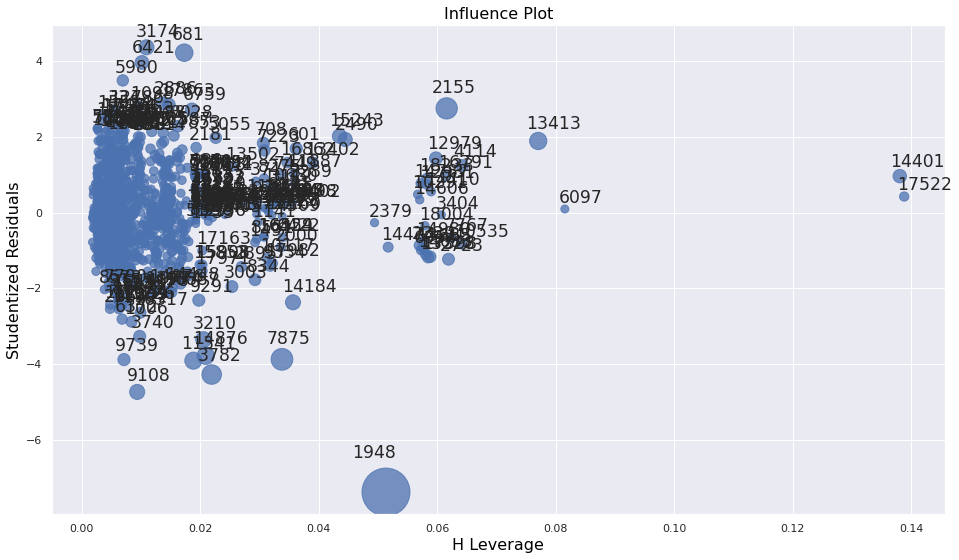

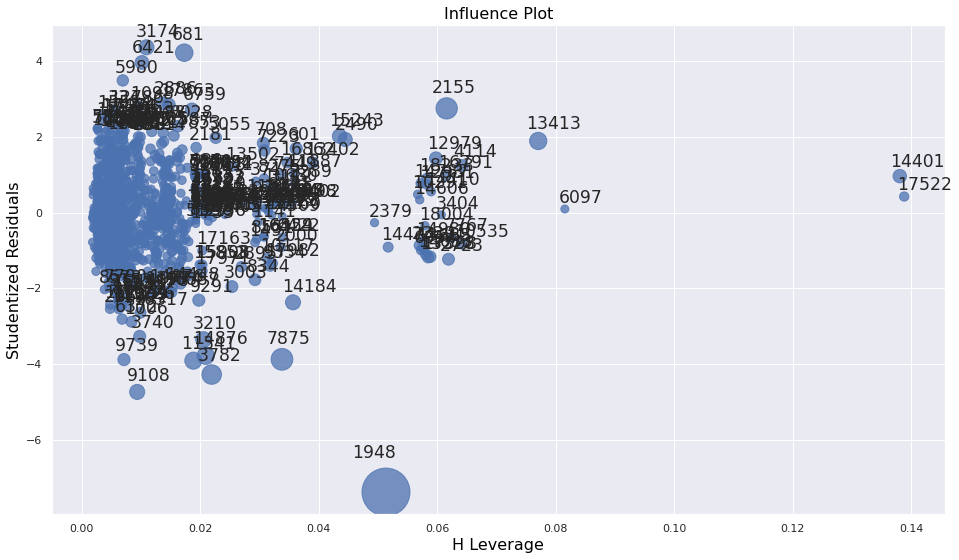

In [ ]:
sm.graphics.influence_plot(class1)

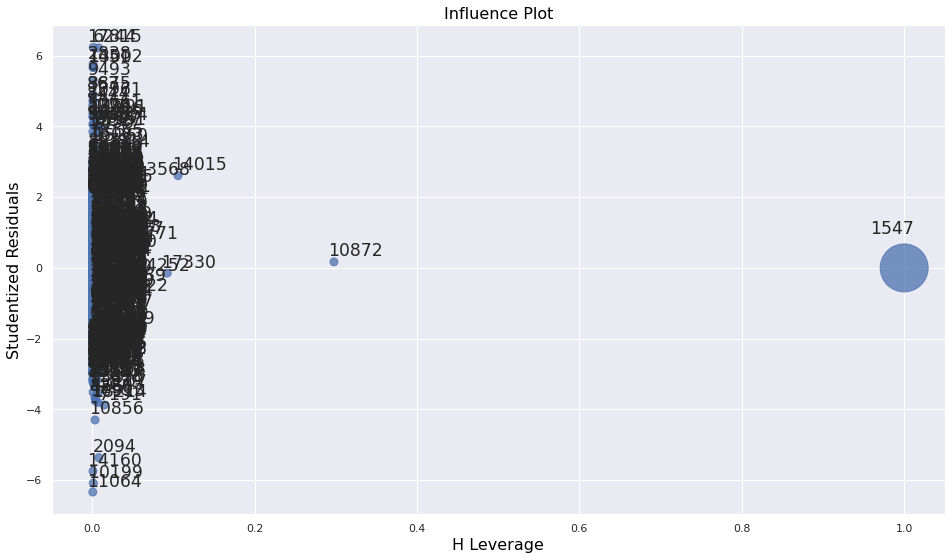

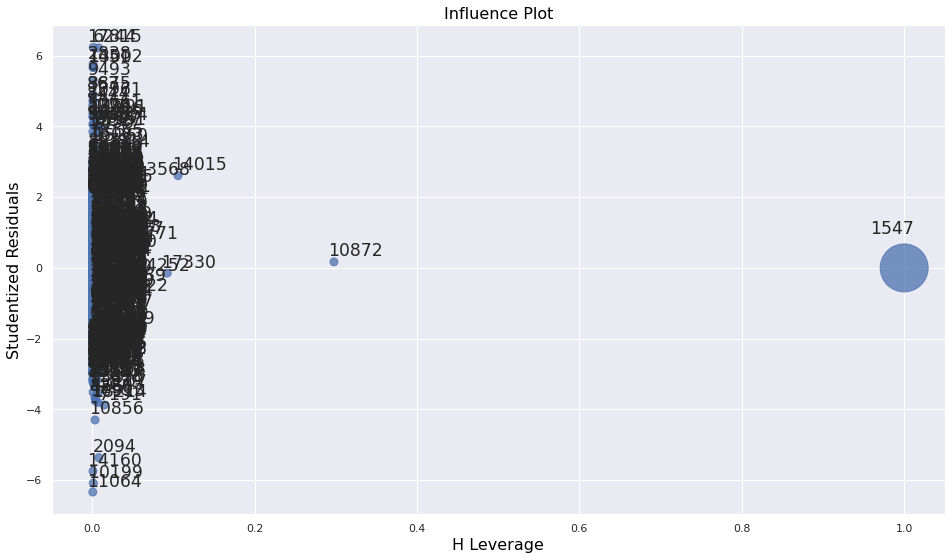

In [ ]:
sm.graphics.influence_plot(class2)

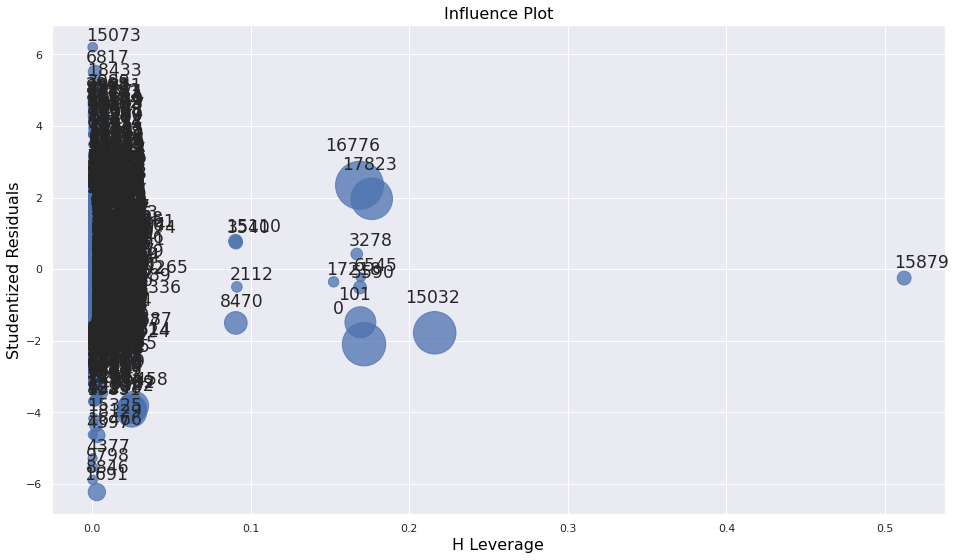

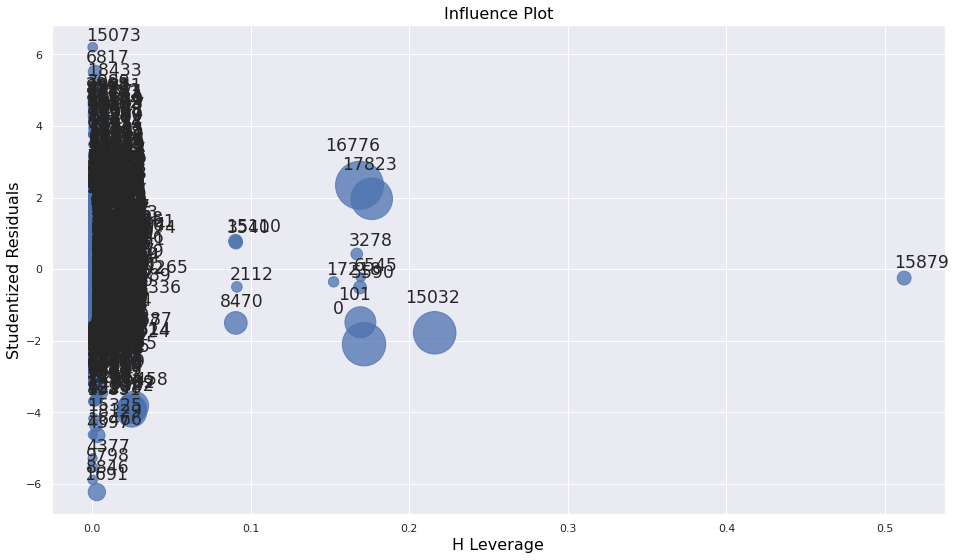

In [ ]:
sm.graphics.influence_plot(class3)

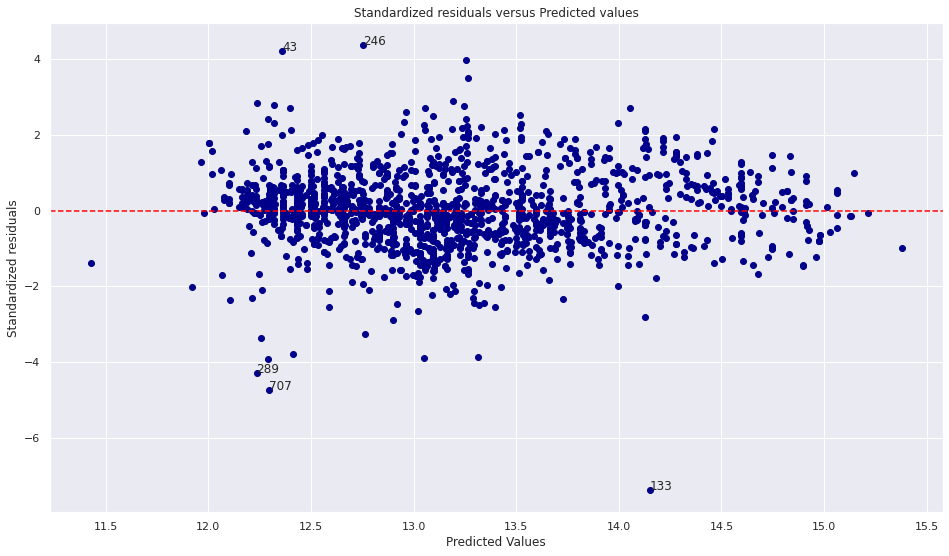

In [ ]:
residual_plot(class1)

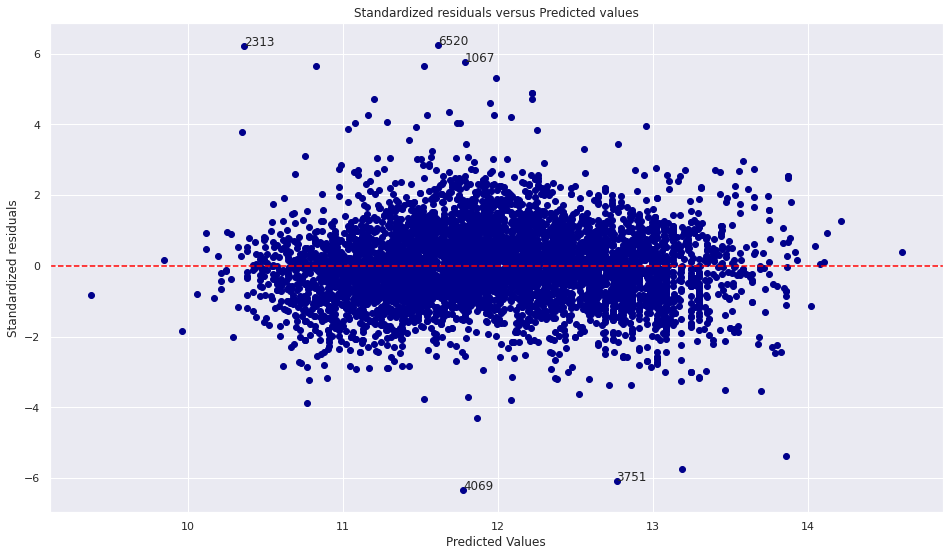

In [ ]:
residual_plot(class2)

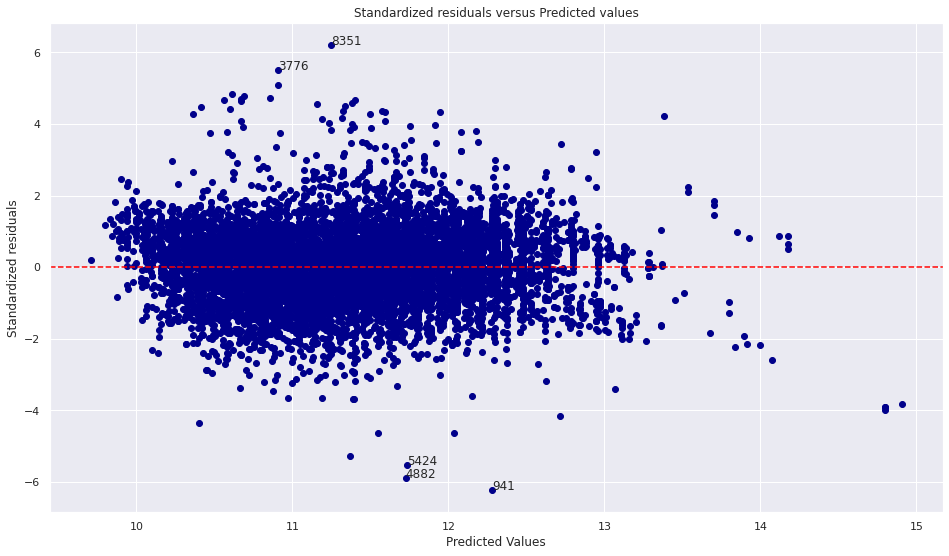

In [ ]:
residual_plot(class3)

In [ ]:
res_class1 = class1.get_influence().resid_studentized_external

In [ ]:
res_class2 = class2.get_influence().resid_studentized_external

In [ ]:
res_class3 = class3.get_influence().resid_studentized_external

(0.9735662937164307, 3.5954311914568706e-16)
KstestResult(statistic=0.04761760512974722, pvalue=0.0018490629458800098)


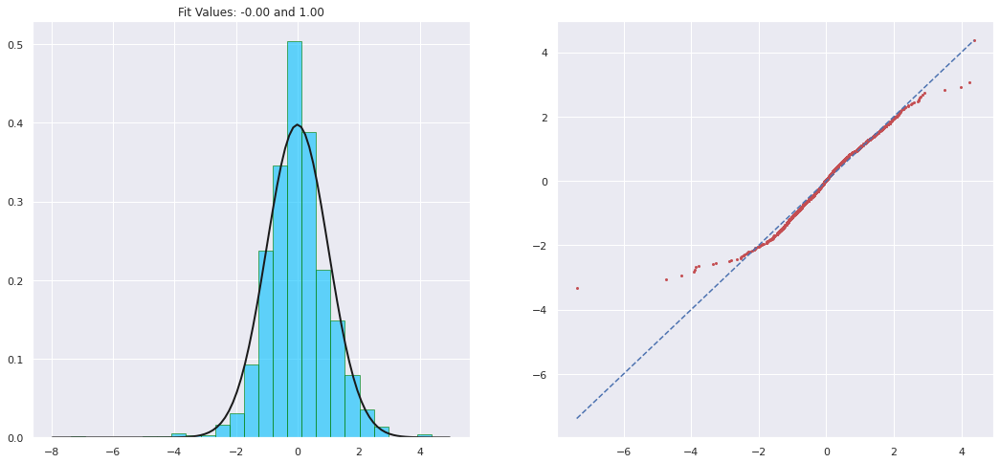

In [ ]:
stat.qq_plot(res_class1)
print(stats.shapiro(res_class1))
print(stats.kstest(res_class1,'norm'))


KstestResult(statistic=0.0371005695832104, pvalue=1.6106926084828976e-08)


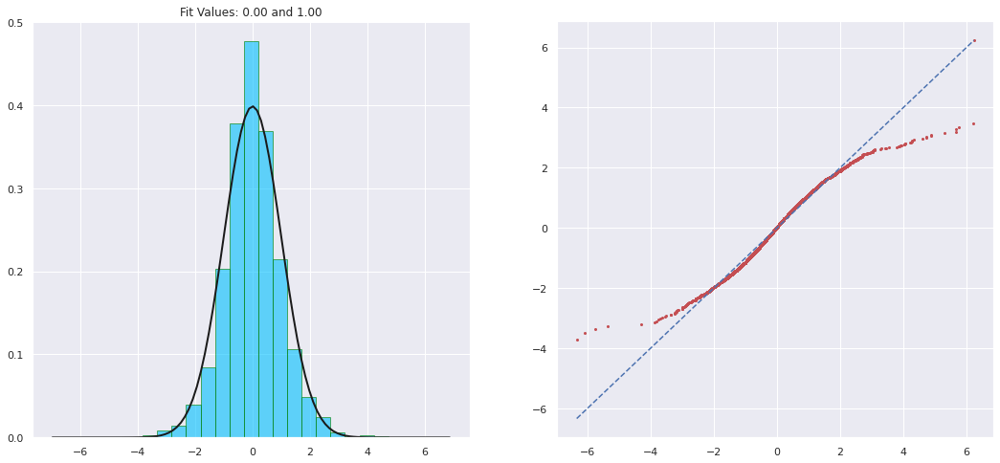

In [ ]:
stat.qq_plot(res_class2)
print(stats.kstest(res_class2,'norm'))

KstestResult(statistic=0.02586041365567615, pvalue=2.156085581225438e-06)


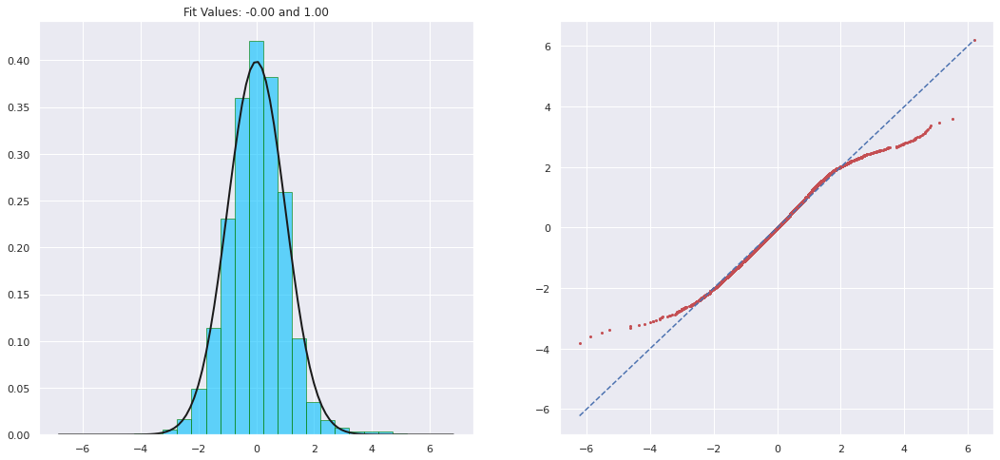

In [ ]:
stat.qq_plot(res_class3)
print(stats.kstest(res_class3,'norm'))

In [ ]:
outlier1=list(car_df_class1[abs(res_class1)>=3.5].index)
leverage1 = [14401,17522,6097,13413,2155]
remove1 = list(set(outlier1+leverage1))
len(remove1)

15

In [ ]:
outlier2=list(car_df_class2[abs(res_class2)>=3.5].index)
leverage2=[1547,10872]
remove2 = list(set(outlier2+leverage2))
len(remove2)

40

In [ ]:
outlier3=list(car_df_class3[abs(res_class3)>=3.5].index)
leverage3=[15879,15032,0,101,3278,6545,5590,16776,17823]
remove3 = list(set(outlier3+leverage3))
len(remove3)

68

In [ ]:
car_eval_class1 = car_df_class1.drop(remove1)

Y = car_eval_class1.lnPrice
x1 = car_eval_class1[pname_class1]
X1= sm.add_constant(x1)
class1= sm.OLS(Y,X1).fit()
class1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.713
Model:                            OLS   Adj. R-squared:                  0.710
Method:                 Least Squares   F-statistic:                     287.1
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:30:45   Log-Likelihood:                -905.73
No. Observations:                1518   AIC:                             1839.
Df Residuals:                    1504   BIC:                             1914.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.1079      0.040    330.015      0.000      13.030      13.186
Age                 -0.1285      0.006    -22.461      0.000      -0.140      -0.117
AD_Import            0.2318      0.051      4.548      0.000       0.132       0.332
Lic_fee              0.0276      0.056      0.494      0.621      -0.082       0.137
maroon               0.1505      0.046      3.293      0.001       0.061       0.240
red                  0.4487      0.076      5.928      0.000       0.300       0.597
yellow               0.1864      0.109      1.704      0.089      -0.028       0.401
EV_bin               0.2356      0.006     38.367      0.000       0.224       0.248
Seats_T             -0.0193      0.012     -1.548      0.122      -0.044       0.005
Preowner_T          -0.0470      0.016     -2.924      0.004      -0.079      -0.015
Seats_Squared        0.0878      0.007     13.322      0.000       0.075       0.101
Preowner_Squared     0.0077      0.007      1.128      0.259      -0.006       0.021
Age_Import          -0.0249      0.007     -3.503      0.000      -0.039      -0.011
EV_bin_Lic          -0.1005      0.015     -6.694      0.000      -0.130      -0.071
==============================================================================
Omnibus:                       17.013   Durbin-Watson:                   2.120
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               20.836
Skew:                           0.169   Prob(JB):                     2.99e-05
Kurtosis:                       3.464   Cond. No.                         85.2
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
car_eval_class2 = car_df_class2.drop(remove2)

Y = car_eval_class2.lnPrice
x2 = car_eval_class2[pname_class2]
X2= sm.add_constant(x2)
class2= sm.OLS(Y,X2).fit()
class2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.782
Model:                            OLS   Adj. R-squared:                  0.782
Method:                 Least Squares   F-statistic:                     2195.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:30:57   Log-Likelihood:                -3069.7
No. Observations:                6730   AIC:                             6163.
Df Residuals:                    6718   BIC:                             6245.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.5983      0.050    273.209      0.000      13.501      13.696
Seats               -0.0544      0.007     -7.980      0.000      -0.068      -0.041
Age                 -0.2201      0.002   -117.550      0.000      -0.224      -0.216
AD_Import            0.0524      0.010      5.476      0.000       0.034       0.071
Lic_fee             -0.1128      0.010    -10.986      0.000      -0.133      -0.093
Transmission_AT     -0.4442      0.032    -13.752      0.000      -0.508      -0.381
black                0.0334      0.016      2.079      0.038       0.002       0.065
blue              1.227e-15   1.25e-17     98.465      0.000     1.2e-15    1.25e-15
white                0.0455      0.029      1.566      0.117      -0.011       0.102
TravelDist_bin      -0.0851      0.028     -3.057      0.002      -0.140      -0.031
EV_bin               0.2725      0.004     61.227      0.000       0.264       0.281
Preowner_T          -0.0175      0.007     -2.572      0.010      -0.031      -0.004
Preowner_Squared    -0.0071      0.002     -3.002      0.003      -0.012      -0.002
==============================================================================
Omnibus:                       72.482   Durbin-Watson:                   1.974
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              123.517
Skew:                           0.016   Prob(JB):                     1.51e-27
Kurtosis:                       3.663   Cond. No.                     4.19e+17
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 3.33e-30. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [ ]:
car_eval_class3 = car_df_class3.drop(remove3)

Y = car_eval_class3.lnPrice
x3 = car_eval_class3[pname_class3]
X3= sm.add_constant(x3)
class3= sm.OLS(Y,X3).fit()
class3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.733
Model:                            OLS   Adj. R-squared:                  0.733
Method:                 Least Squares   F-statistic:                     2337.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:31:52   Log-Likelihood:                -5337.2
No. Observations:               10205   AIC:                         1.070e+04
Df Residuals:                   10192   BIC:                         1.079e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     13.3046      0.033    403.772      0.000      13.240      13.369
Seats                      0.0027      0.004      0.731      0.465      -0.005       0.010
Age                       -0.1658      0.001   -116.957      0.000      -0.169      -0.163
Lic_fee                   -0.1007      0.008    -11.868      0.000      -0.117      -0.084
Transmission_AT           -0.7320      0.022    -32.728      0.000      -0.776      -0.688
aqua                   -2.869e-15   2.38e-17   -120.328      0.000   -2.92e-15   -2.82e-15
black                      0.0576      0.016      3.587      0.000       0.026       0.089
navy                       0.0485      0.024      1.992      0.046       0.001       0.096
EV_bin_T                   0.2648      0.006     46.275      0.000       0.254       0.276
Preowner_T                -0.0789      0.005    -15.535      0.000      -0.089      -0.069
TravelDist_bin_T          -0.1741      0.031     -5.586      0.000      -0.235      -0.113
EV_Squared                 0.0265      0.003      9.004      0.000       0.021       0.032
Preowner_Squared           0.0088      0.002      5.762      0.000       0.006       0.012
TravelDist_bin_Squared     0.0264      0.009      3.086      0.002       0.010       0.043
==============================================================================
Omnibus:                       49.730   Durbin-Watson:                   1.974
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               70.284
Skew:                           0.008   Prob(JB):                     5.47e-16
Kurtosis:                       3.406   Cond. No.                     3.16e+18
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.09e-31. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [ ]:
pname_class3.remove('Seats')
Y = car_eval_class3.lnPrice
x3 = car_eval_class3[pname_class3]
X3= sm.add_constant(x3)
class3= sm.OLS(Y,X3).fit()
class3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lnPrice   R-squared:                       0.733
Model:                            OLS   Adj. R-squared:                  0.733
Method:                 Least Squares   F-statistic:                     2550.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:32:41   Log-Likelihood:                -5337.5
No. Observations:               10205   AIC:                         1.070e+04
Df Residuals:                   10193   BIC:                         1.079e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     13.3164      0.029    462.884      0.000      13.260      13.373
Age                       -0.1657      0.001   -117.227      0.000      -0.168      -0.163
Lic_fee                   -0.1007      0.008    -11.860      0.000      -0.117      -0.084
Transmission_AT           -0.7287      0.022    -33.267      0.000      -0.772      -0.686
aqua                   -1.096e-14   3.62e-17   -302.499      0.000    -1.1e-14   -1.09e-14
black                      0.0578      0.016      3.600      0.000       0.026       0.089
navy                       0.0484      0.024      1.991      0.046       0.001       0.096
EV_bin_T                   0.2662      0.005     49.243      0.000       0.256       0.277
Preowner_T                -0.0794      0.005    -15.797      0.000      -0.089      -0.070
TravelDist_bin_T          -0.1734      0.031     -5.567      0.000      -0.234      -0.112
EV_Squared                 0.0260      0.003      9.074      0.000       0.020       0.032
Preowner_Squared           0.0088      0.002      5.780      0.000       0.006       0.012
TravelDist_bin_Squared     0.0263      0.009      3.070      0.002       0.009       0.043
==============================================================================
Omnibus:                       47.851   Durbin-Watson:                   1.975
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               67.170
Skew:                           0.005   Prob(JB):                     2.60e-15
Kurtosis:                       3.397   Cond. No.                     1.58e+17
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 3.22e-29. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [ ]:
res_class1_eval= class1.get_influence().resid_studentized_external
res_class2_eval= class2.get_influence().resid_studentized_external
res_class3_eval= class3.get_influence().resid_studentized_external

KstestResult(statistic=0.0461521798303165, pvalue=0.0030079152702460806)


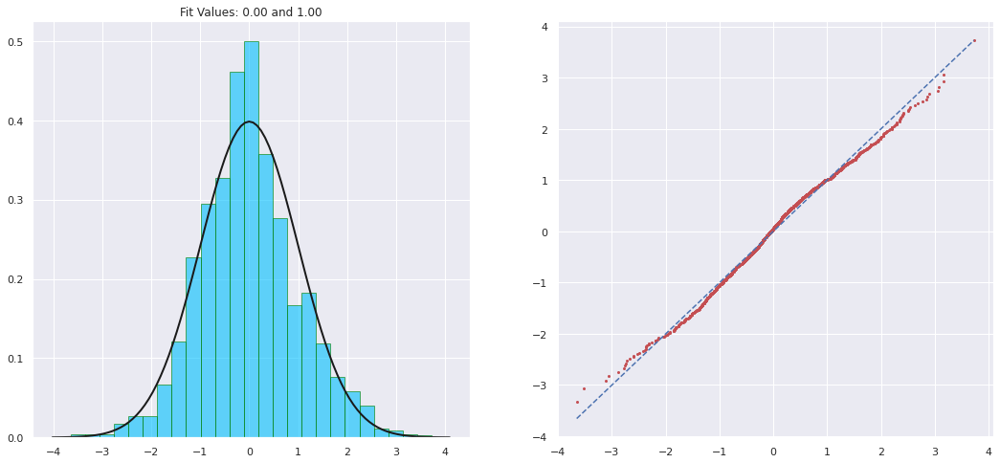

In [ ]:
stat.qq_plot(res_class1_eval)
print(stats.kstest(res_class1_eval,'norm'))

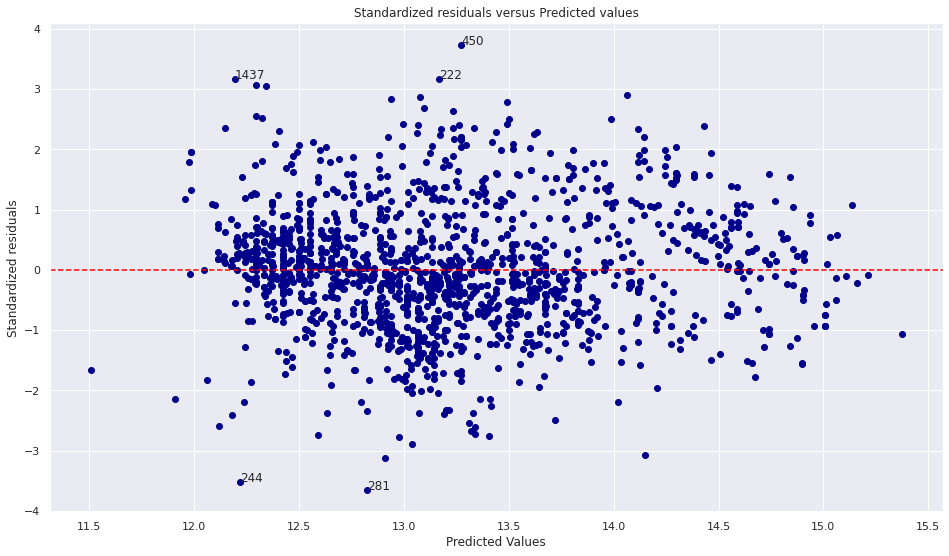

In [ ]:
residual_plot(class1)

In [ ]:
test = sms.het_breuschpagan(class1.resid, class1.model.exog)
lzip(names, test)

[('Lagrange multiplier statistic', 180.16626797857157),
 ('p-value', 1.5694438273397574e-31),
 ('f-value', 15.58030031075476),
 ('f p-value', 1.1002329941856762e-33)]

In [ ]:
name = ["F statistic", "p-value"]
test = sms.het_goldfeldquandt(class1.resid, class1.model.exog)
lzip(name, test)

[('F statistic', 0.9304131934831935), ('p-value', 0.8374172374883293)]

KstestResult(statistic=0.02802828407964361, pvalue=5.114616749456058e-05)


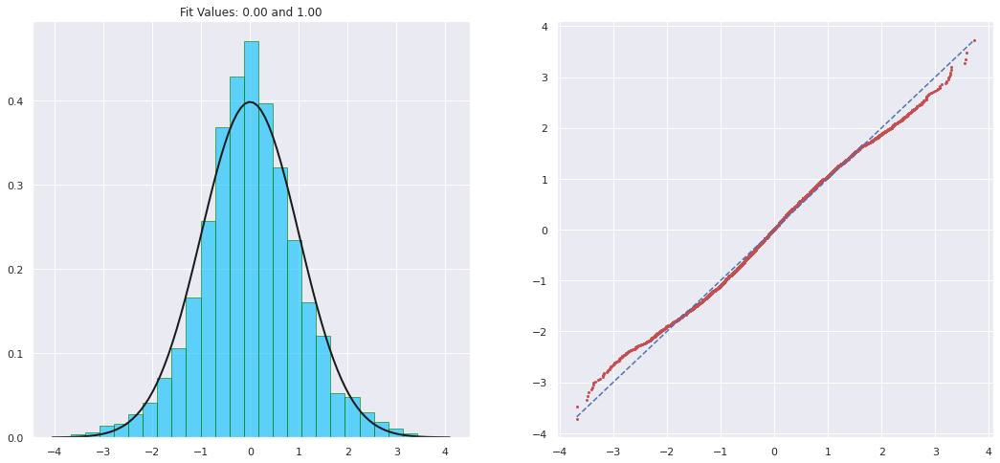

In [ ]:
stat.qq_plot(res_class2_eval)
print(stats.kstest(res_class2_eval,'norm'))

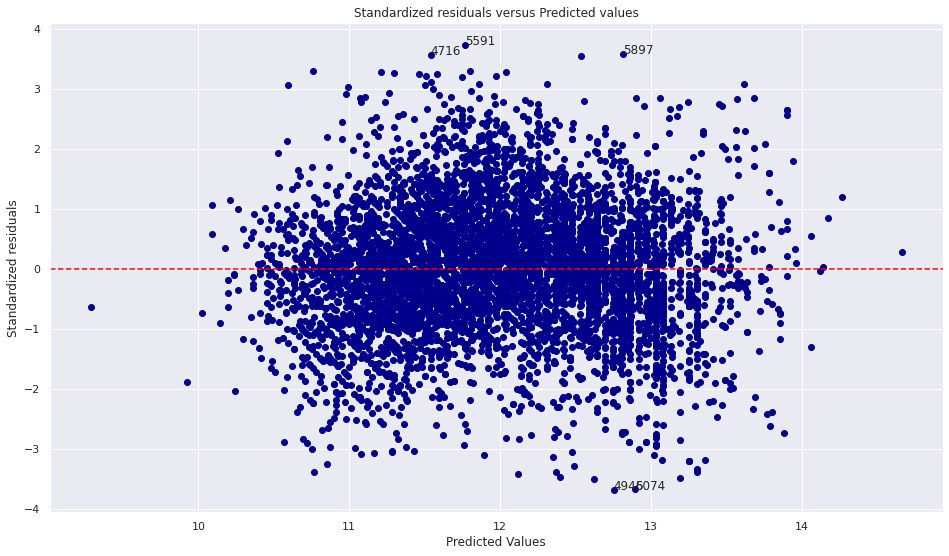

In [ ]:
residual_plot(class2)

In [ ]:
test = sms.het_breuschpagan(class2.resid, class2.model.exog)
lzip(names, test)

[('Lagrange multiplier statistic', 529.1865153157762),
 ('p-value', 1.3507477849455082e-105),
 ('f-value', 52.12036099152425),
 ('f p-value', 5.250255829506741e-111)]

In [ ]:
name = ["F statistic", "p-value"]
test = sms.het_goldfeldquandt(class2.resid, class2.model.exog)
lzip(name, test)

[('F statistic', 1.1051042363472503), ('p-value', 0.001909787919108935)]

KstestResult(statistic=0.01452653943397697, pvalue=0.0269497686166428)


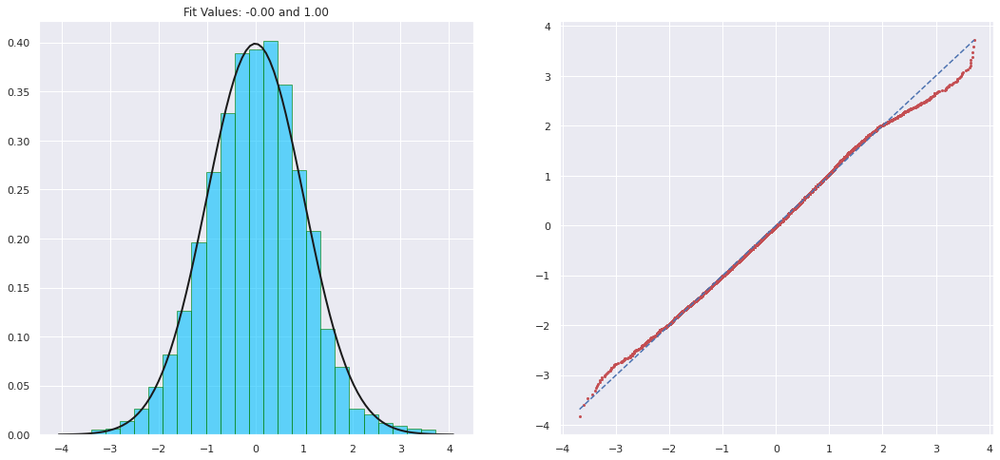

In [ ]:
stat.qq_plot(res_class3_eval)
print(stats.kstest(res_class3_eval,'norm'))

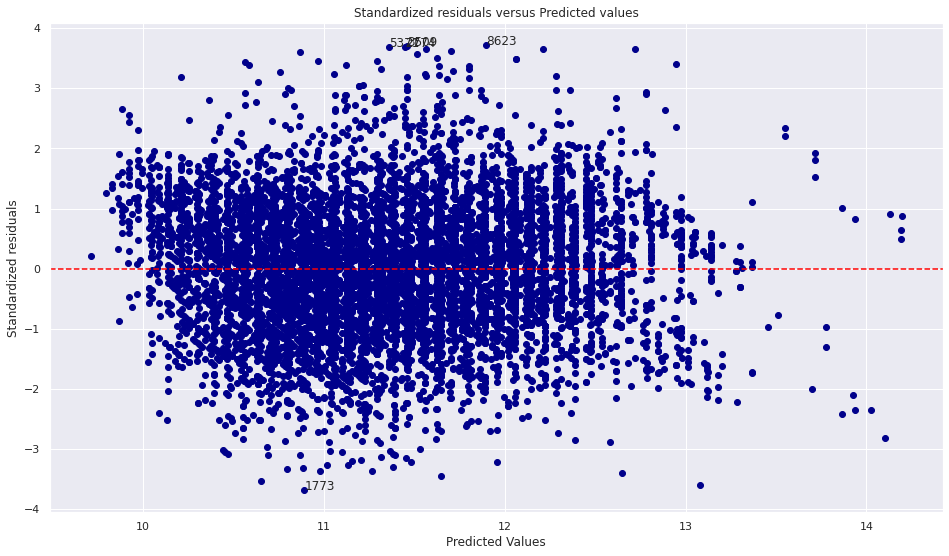

In [ ]:
residual_plot(class3)

In [ ]:
test = sms.het_breuschpagan(class3.resid, class3.model.exog)
lzip(names, test)

[('Lagrange multiplier statistic', 808.0780292791706),
 ('p-value', 3.0648915688578243e-165),
 ('f-value', 79.68508080824786),
 ('f p-value', 2.6241503462197554e-173)]

In [ ]:
name = ["F statistic", "p-value"]
test = sms.het_goldfeldquandt(class3.resid, class3.model.exog)
lzip(name, test)

[('F statistic', 1.047601329421364), ('p-value', 0.048578895128388554)]

Residuals in all 3 models are not normally distributed and not in equal variance.

In [ ]:
calculate_vif(car_eval_class1,pname_class1)

,VIF,Tolerance
Age,2.724823,0.366996
AD_Import,4.961635,0.201546
Lic_fee,2.814043,0.355361
maroon,1.047222,0.954907
red,1.061240,0.942294
yellow,1.031547,0.969418
EV_bin,1.948603,0.513188
Seats_T,2.135457,0.468284
Preowner_T,2.193084,0.455979
Seats_Squared,1.561734,0.640314


In [ ]:
calculate_vif(car_eval_class2,pname_class2)

,VIF,Tolerance
Seats,1.036374,0.964902
Age,1.592063,0.628116
AD_Import,1.053153,0.949530
Lic_fee,1.138179,0.878596
Transmission_AT,1.013744,0.986442
black,1.013038,0.987130
blue,inf,0.000000
white,1.005428,0.994602
TravelDist_bin,1.008516,0.991556
EV_bin,1.093703,0.914325


In [ ]:
calculate_vif(car_eval_class3,pname_class3)

,VIF,Tolerance
Age,1.390937,0.718940
Lic_fee,1.092540,0.915298
Transmission_AT,1.004029,0.995987
aqua,inf,0.000000
black,1.545838,0.646898
navy,1.541115,0.648881
EV_bin_T,1.505776,0.664110
Preowner_T,2.370647,0.421826
TravelDist_bin_T,2.423613,0.412607
EV_Squared,1.475241,0.677855


##Weighted Regression

In [ ]:
Y_w = results.resid
x_w = results.fittedvalues
X_w = sm.add_constant(x_w)

model = sm.OLS(Y_w,X_w)
weighted = model.fit()
wt = 1/weighted.fittedvalues**2

In [ ]:
wt

0        3.118531e+27
1        2.363958e+27
2        2.093892e+27
3        5.404073e+27
4        2.280589e+27
             ...     
18571    6.817675e+27
18572    1.787922e+27
18573    1.164213e+27
18574    2.081341e+28
18575    2.171483e+27
Length: 18576, dtype: float64

In [ ]:
Y = car_reg_3rd.lnPrice
x = car_reg_3rd[col_3rd]
X = sm.add_constant(x)

wls_model = sm.WLS(Y,X,weights=wt)
weighted_results = wls_model.fit()
print(weighted_results.summary())

                            WLS Regression Results                            
Dep. Variable:                lnPrice   R-squared:                       0.339
Model:                            WLS   Adj. R-squared:                  0.338
Method:                 Least Squares   F-statistic:                     396.7
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:41:48   Log-Likelihood:                -60213.
No. Observations:               18576   AIC:                         1.205e+05
Df Residuals:                   18551   BIC:                         1.207e+05
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 12.3245      0

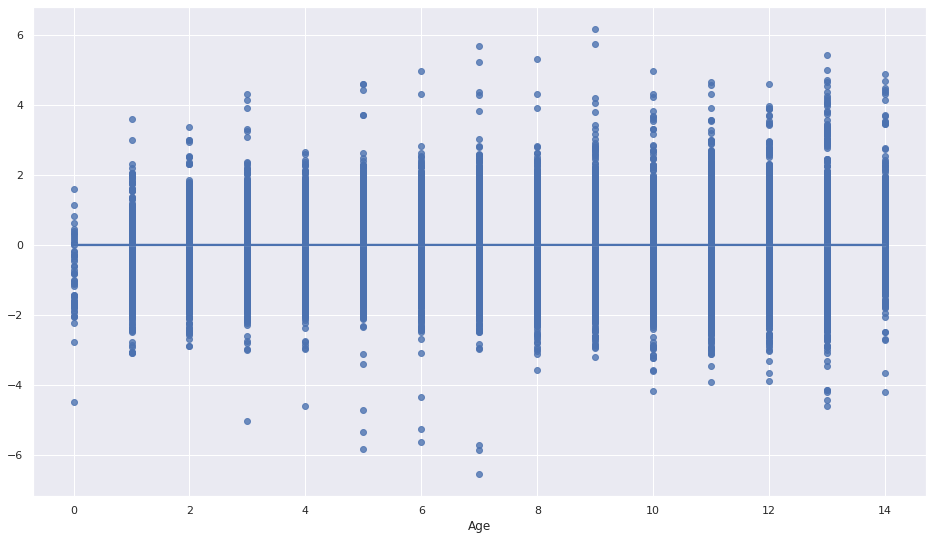

In [ ]:
sns.regplot(x=car_reg_3rd.Age, y = res,order=1)

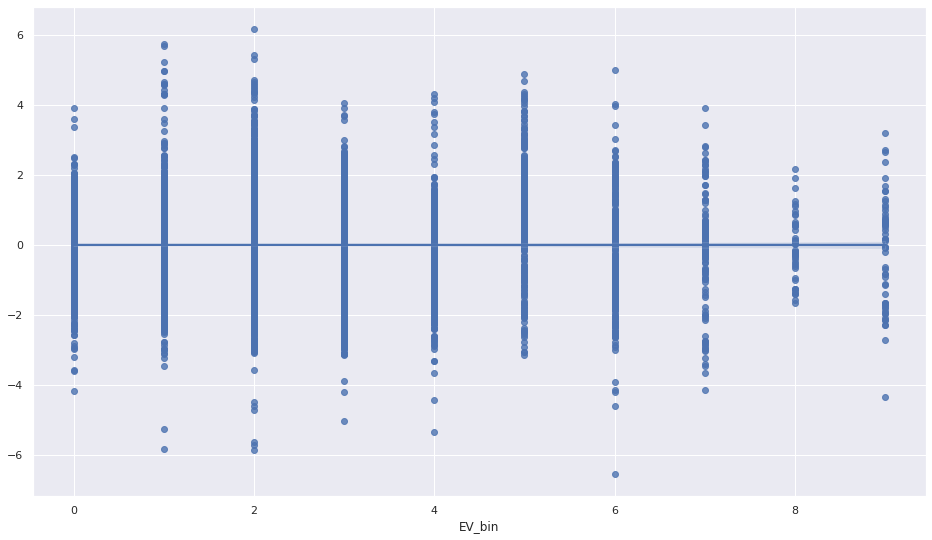

In [ ]:
sns.regplot(x=car_reg_3rd.EV_bin, y = res,order=1)

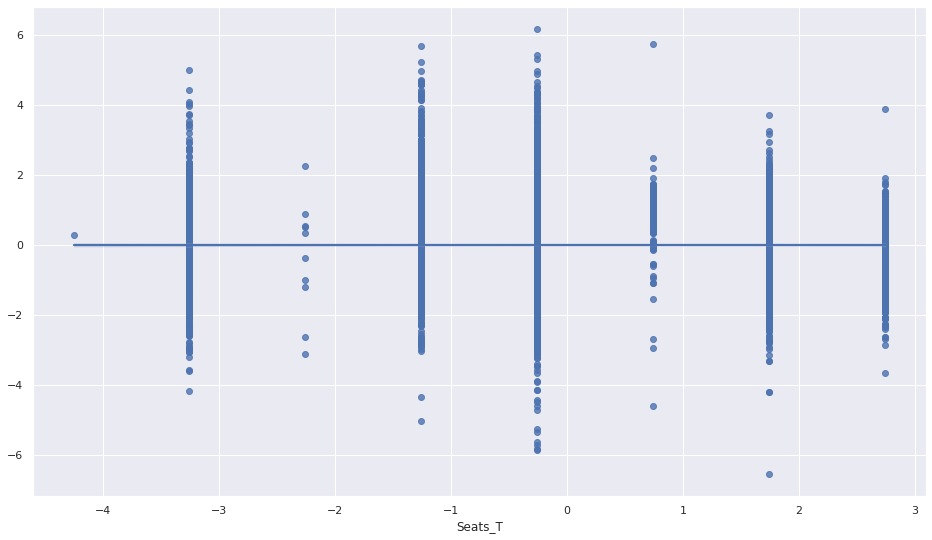

In [ ]:
sns.regplot(x=car_reg_3rd.Seats_T, y = res,order=1)

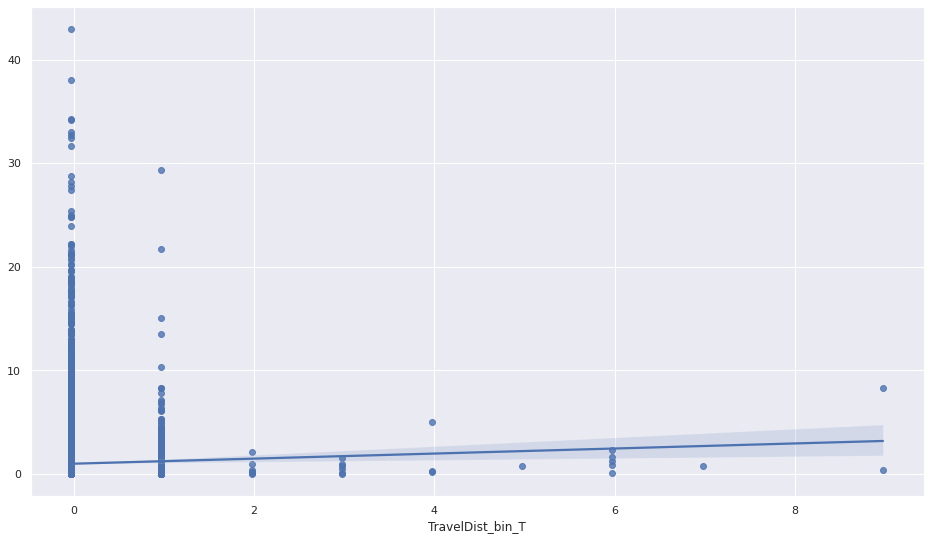

In [ ]:
sns.regplot(x=car_reg_3rd.TravelDist_bin_T, y = res**2,order=1)

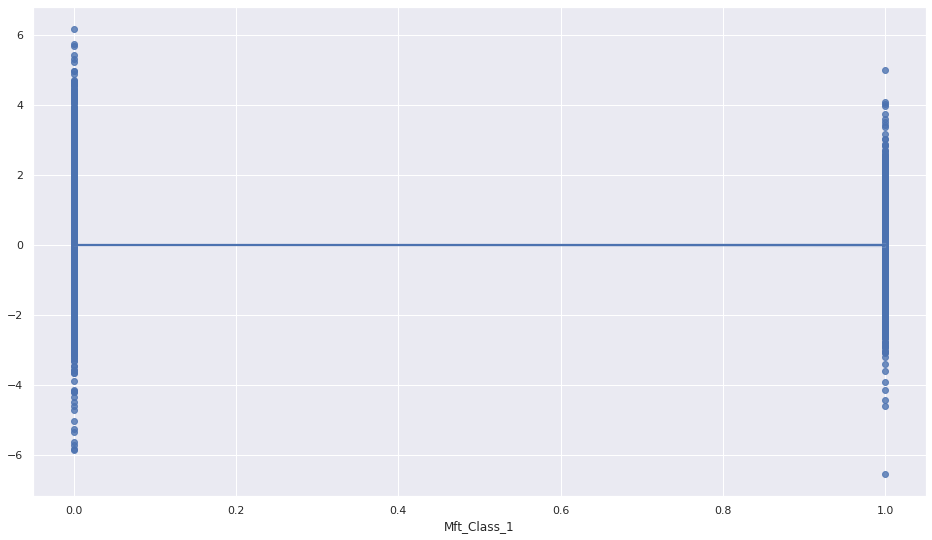

In [ ]:
sns.regplot(x=car_reg_3rd.Mft_Class_1, y = res,order=1)

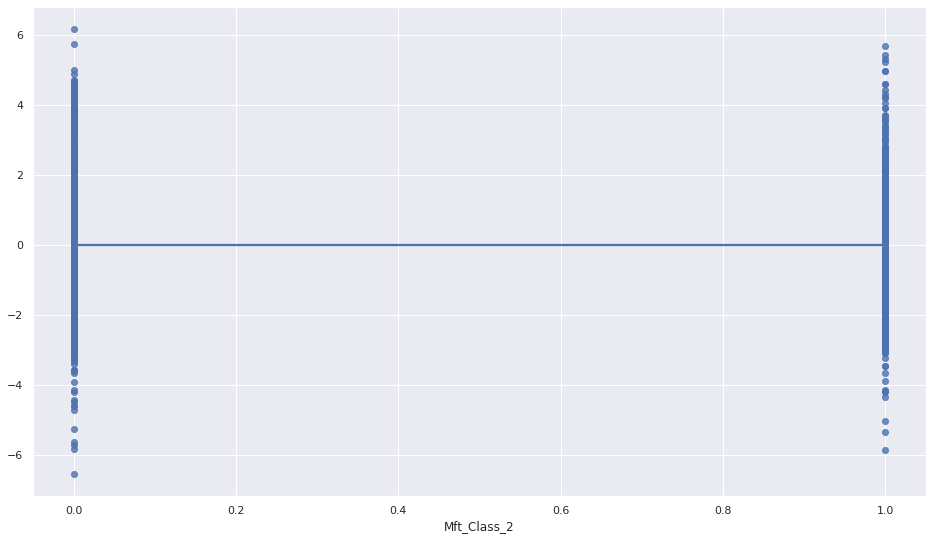

In [ ]:
sns.regplot(x=car_reg_3rd.Mft_Class_2, y = res,order=1)

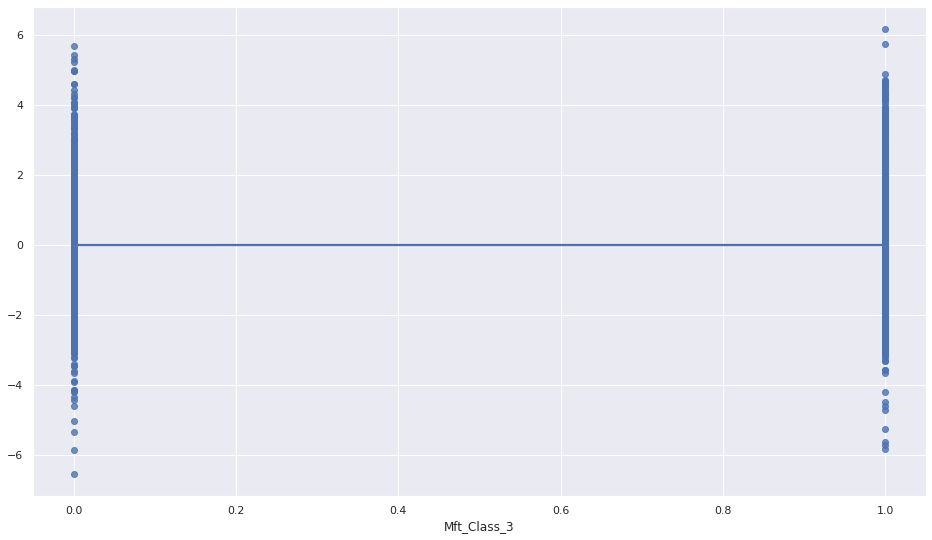

In [ ]:
sns.regplot(x=car_reg_3rd.Mft_Class_3, y = res,order=1)

In [ ]:
Y_w = results.resid**2
x_w = car_reg_3rd.TravelDist_bin_T
X_w = sm.add_constant(x_w)

model = sm.OLS(Y_w,X_w)
weighted = model.fit()
wt = 1/weighted.fittedvalues

In [ ]:
Y = car_reg_3rd.lnPrice
x = car_reg_3rd[col_3rd]
X = sm.add_constant(x)

wls_model = sm.WLS(Y,X,weights=wt)
weighted_results = wls_model.fit()
print(weighted_results.summary())

                            WLS Regression Results                            
Dep. Variable:                lnPrice   R-squared:                       0.801
Model:                            WLS   Adj. R-squared:                  0.801
Method:                 Least Squares   F-statistic:                     3119.
Date:                Sun, 08 May 2022   Prob (F-statistic):               0.00
Time:                        09:43:19   Log-Likelihood:                -10815.
No. Observations:               18576   AIC:                         2.168e+04
Df Residuals:                   18551   BIC:                         2.188e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 12.8057      0

The results were most likely to same as the pooled model.

In [ ]:
%%shell
jupyter nbconvert --to html ///content/CarRegression_final.ipynb

[NbConvertApp] Converting notebook ///content/CarRegression_final.ipynb to html
[NbConvertApp] Writing 13270768 bytes to ///content/CarRegression_final.html
